In [1]:
import glob

# import seaborn as sns
# import warnings
import itertools
import sqlite3

import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
# warnings.simplefilter(action='ignore', category=FutureWarning)
from tqdm.auto import tqdm
from IPython.display import display
import numpy as np
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch


In [2]:
import cartopy.io.shapereader as shpreader
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cartopy.crs as ccrs
import matplotlib.transforms as transforms
from matplotlib.colors import LinearSegmentedColormap ,TwoSlopeNorm
import matplotlib.patches as mpatches
from scipy import integrate
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

In [91]:
import pathlib
from matplotlib.ticker import MultipleLocator
import matplotlib.ticker as mticker

In [4]:
colordict = {
    "GasCCS": "#b20101",
    "Gas": "#d35050",
    "HydroRes": "#08ad97",
    "HydroRoR": "#4adbc8",
    "Windonshore_F": "#235ebc",
    "Solar": "#f9d002",
    "Windonshore_OF": "#8a1caf",
    "Windoffshore": "#6895dd",
    "Lion": "#baf238",
    "PumpedHydro": "#51dbcc",
    "NuclearEPR":"red",
    "Windoffshorefloating":"#74c6f2"
}


In [5]:
colordict_legend = {
    "GasCCS": "#b20101",
    "Gas": "#d35050",
    "HydroRes": "#08ad97",
    "HydroRoR": "#4adbc8",
    "onshore": "#235ebc",
    "solar": "#f9d002",
    "Import": "#8a1caf",
    "offshore": "#6895dd",
    "Lion": "#baf238",
    "PumpedHydro": "#51dbcc",
    "NuclearEPR":"red",
    "offshore floating":"#74c6f2"
}

In [6]:
compressionfileending = ".zstd"
compressiondict = {"method": "zstd", "level": 19, "threads": -1}

In [7]:
#resultspath_base = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/Base")
resultspath_cap2areaplus = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/cap2area+")
resultspath_cap2areaminus = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/cap2area-")

In [8]:
resultspath_cap2area_S2S3 = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/cap2area_S2_S3")

In [459]:
resultspath_cap2area_costs = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/same_cost_onshore")

In [541]:
resultspath_base = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/Base")
resultspath_base_2 = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/S1_S2_S3_Base")

In [7]:
resultspath_base_1 = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1")
resultspath_base_2 = pathlib.Path("/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_2")

In [8]:
def modelstatus(modelpath):
    logfile = modelpath / "highres2.log"
    gamsfile = modelpath / "results.gdx"
    database = modelpath / "results.db"

    if logfile.is_file() and gamsfile.is_file() and database.is_file():
        with open(logfile) as logfile:
            if "Optimal solution found" in logfile.read():
                return "optimal"
            else:
                return "exists"
    else:
        return "missing"

# Reading files


In [532]:
Base_scenarios = pd.read_csv("/cluster/work/projects/ec85/EFF/Forest_work/results/Base/scenarios.csv", sep="\t", keep_default_na=False, index_col=0)
cap2area_plus = pd.read_csv("/cluster/work/projects/ec85/EFF/Forest_work/results/cap2area+/scenarios.csv", sep="\t", keep_default_na=False, index_col=0)
cap2area_minus = pd.read_csv("/cluster/work/projects/ec85/EFF/Forest_work/results/cap2area-/scenarios.csv", sep="\t", keep_default_na=False, index_col=0)
Base_scenarios

,weatheryears,demandyears,spatials,trans,import_xxx,forest_excls,buffer,varnewpcapQ,corines_solar,corines_onshore,fylke_techs,cutoffs_solar,cutoffs_onwind,cutoffs_offwind
0,2010,2050,region,DefaultYes,1,VRS,0,OPT,CSD,CWD,fylketechD,0.09,0.15,0.2
1,2010,2050,region,DefaultYes,1,VRS,100,OPT,CSD,CWD,fylketechD,0.09,0.15,0.2
2,2010,2050,region,DefaultYes,1,VRS,200,OPT,CSD,CWD,fylketechD,0.09,0.15,0.2
3,2010,2050,region,DefaultYes,1,VRS,300,OPT,CSD,CWD,fylketechD,0.09,0.15,0.2
4,2010,2050,region,DefaultYes,1,VRS,400,OPT,CSD,CWD,fylketechD,0.09,0.15,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,2010,2050,region,LOWOH,1,HWE,0,OPT,CSD,CWD,fylketechD,0.09,0.15,0.2
732,2010,2050,region,LOWOH,1,CUL,0,S1,CSD,CWD,fylketechD,0.09,0.15,0.2
733,2010,2050,region,LOWOH,1,CUL,0,S2,CSD,CWD,fylketechD,0.09,0.15,0.2
734,2010,2050,region,LOWOH,1,CUL,0,S3,CSD,CWD,fylketechD,0.09,0.15,0.2


In [9]:
requested_base_scenarios = (
    pd.read_csv(
        "/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_2/scenarios.csv", sep="\t", keep_default_na=False, index_col=0
    )
    # .set_index("index")
    # .rename_axis(index={"index": ""})
    .assign(
        path=lambda df: (
            resultspath_base_2   #change the path accordingly
            / "models"
            / df.weatheryears.astype(str)
            / (
                df.weatheryears.astype(str)
                + "_"
                + df.demandyears.astype(str)
                + "_"
                + df.spatials.astype(str)
                + "_"
                + df.trans.astype(str)
                + "_"
                + df.import_xxx.astype(str)
                + "_"
                + df.forest_excls.astype(str)
                +"_"
                + df.buffer.astype(str)
                +"_"
                + df.varnewpcapQ.astype(str)
                + "_"
                + df.corines_solar.astype(str)
                + "_"
                + df.corines_onshore.astype(str)
                + "_"
                + df.fylke_techs.astype(str)
                + "_"
                + df.cutoffs_solar.astype(str)
                + "_"
                + df.cutoffs_onwind.astype(str)
                + "_"
                + df.cutoffs_offwind.astype(str)
            )
        ),
        status=lambda df: df.path.apply(modelstatus),
    )
)

# Did the scenarios solve optimally?
requested_base_scenarios

,weatheryears,demandyears,spatials,trans,import_xxx,forest_excls,buffer,varnewpcapQ,corines_solar,corines_onshore,fylke_techs,cutoffs_solar,cutoffs_onwind,cutoffs_offwind,path,status
0,2010,2050,region,DefaultYes,1,HWE,0,S1,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
1,2010,2050,region,DefaultYes,1,HWE,0,S2,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
2,2010,2050,region,DefaultYes,1,HWE,0,S3,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
3,2010,2050,region,DefaultYes,1,HWE,0,S4,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
4,2010,2050,region,DefaultYes,1,CUL,0,S1,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
5,2010,2050,region,DefaultYes,1,CUL,0,S2,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
6,2010,2050,region,DefaultYes,1,CUL,0,S3,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
7,2010,2050,region,DefaultYes,1,CUL,0,S4,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
8,2010,2050,region,LOWOH,1,HWE,0,S1,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal
9,2010,2050,region,LOWOH,1,HWE,0,S2,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,optimal


In [10]:
list(requested_base_scenarios['status'].unique())

['optimal']

In [12]:
requested_base_scenarios[requested_base_scenarios['status']=='exists']

,weatheryears,demandyears,spatials,trans,import_xxx,forest_excls,buffer,varnewpcapQ,corines_solar,corines_onshore,fylke_techs,cutoffs_solar,cutoffs_onwind,cutoffs_offwind,path,status
416,2010,2050,region,LOWOH,1,VRS,3000,S1,CSD,CWD,fylketechD,0.09,0.15,0.2,/cluster/work/projects/ec85/EFF/Forest_work/re...,exists


In [14]:
#found_scenarios_base = list((resultspath_base / "models").rglob("results.db"))
found_scenarios_cap2areaplus = list((resultspath_cap2areaplus / "models").rglob("results.db"))
found_scenarios_cap2areaminus = list((resultspath_cap2areaminus / "models").rglob("results.db"))
found_scenarios_cap2area_S2S3 = list((resultspath_cap2area_S2S3 / "models").rglob("results.db"))

In [463]:
found_scenarios_cap2area_costs = list((resultspath_cap2area_costs / "models").rglob("results.db"))

In [11]:
found_scenarios_base_1 = list((resultspath_base_1 / "models").rglob("results.db"))
found_scenarios_base_2 = list((resultspath_base_2 / "models").rglob("results.db"))

In [12]:
len(found_scenarios_base_2)

16

In [13]:
#function to get stitch scenarios from different folders
def get_scenario_name(path):
    return str(path).split('/2010/')[1].split('/results.db')[0]

# Create scenario name to path mappings
scenario_to_path_1 = {get_scenario_name(p): p for p in found_scenarios_base_1}
scenario_to_path_2 = {get_scenario_name(p): p for p in found_scenarios_base_2}

# Get all unique scenario names from BOTH lists
all_scenarios = set(scenario_to_path_1.keys()) | set(scenario_to_path_2.keys())

# Create final list with each scenario only once
# (prefer base_1 for duplicates, or use base_2 if preferred)
found_scenarios_base = [scenario_to_path_1.get(s) or scenario_to_path_2[s] 
                     for s in all_scenarios]

# Statistics
only_in_1 = set(scenario_to_path_1.keys()) - set(scenario_to_path_2.keys())
only_in_2 = set(scenario_to_path_2.keys()) - set(scenario_to_path_1.keys())
duplicates = set(scenario_to_path_1.keys()) & set(scenario_to_path_2.keys())

print(f"Only in base_1: {len(only_in_1)}")
print(f"Only in base_2: {len(only_in_2)}")
print(f"Duplicates (counted once): {len(duplicates)}")
print(f"Total unique paths: {len(found_scenarios_base)}")

Only in base_1: 720
Only in base_2: 16
Duplicates (counted once): 0
Total unique paths: 736


In [14]:
found_scenarios_base

[PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_DefaultYes_1_ECS_900_S3_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_LOWOH_1_PEB_0_S1_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_LOWOH_1_PEB_1500_S3_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_LOWOH_1_VRS_1500_S2_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_DefaultYes_1_NLF_100_S2_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_Defaul

In [14]:
def makenice(scenariolist, parameter):
    returnlist = []

    basicindexlist = [
        #"weatheryear",
        #"demandyear",
        "transmission",
        "forest_excls",
        "buffer",
        "varnewpcapQ",
        #"corines_solar",
        #"corines_onshore",
        #"fylke_techs",
    ]
    
    if parameter == "cost":
        table = "scalarvariables"
        index = ["name"]
        newindex = ["variable"]
        extraindex = newindex + ["level_1"]
        value = "costs"
        types = {}
        tabletype = "multiple"

    if parameter == "cap":
        table = "var_tot_pcap"
        index = ["g"]
        newindex = ["technology"]
        extraindex = newindex + ["level_1"]
        value = "gencaptot"
        types = {}
        tabletype = "multiple"

    if parameter == "cap_z":
        table = "var_tot_pcap_z"
        index = ["z","g"]
        newindex = ["zone","technology"]
        extraindex = newindex + ["level_2"]
        value = "gencap"
        types = {}
        tabletype = "multiple"    

    if parameter == "newcap":
        table = "var_new_pcap"
        index = ["g"]
        newindex = ["technology"]
        extraindex = newindex + ["level_1"]
        value = "gencapnew"
        types = {}
        tabletype = "multiple"

    if parameter == "gen":
        table = "var_gen"
        index = ["h", "z", "g"]
        newindex = ["hour", "zone", "technology"]
        extraindex = newindex + ["level_3"]
        value = "genamttot"
        types = {"hour": int}
        tabletype = "multiple"

    if parameter == "gentot":
        table = "o_gen_tot"
        index = ["g"]
        newindex = ["technology"]
        extraindex = newindex
        value = "genamttot"
        types = {}
        tabletype = "single"

    if parameter == "curtailtot":
        table = "o_curtail"
        index = ["vre"]
        newindex = ["vre"]
        extraindex = newindex
        value = "curtailment"
        types = {}
        tabletype = "single"

    if parameter == "VREcurtailed":
        table = "vre_curtail"
        index = ["h", "z", "vre", "r"]
        newindex = ["hour", "zone", "technology", "region"]
        extraindex = newindex
        value = "VREcurtailed"
        types = {"hour": int}
        tabletype = "single"

    if parameter == "gen_z":
        table = "o_vre_gen_sum_r_z"
        index = ["z","vre"]
        newindex = ["zone","technology"]
        extraindex = newindex + ["level_2"]
        value = "genamttotz"
        types = {}
        tabletype = "multiple"

    if parameter == "pgen":
        table = "var_pgen"
        index = ["h", "z"]
        newindex = ["hour", "zone"]
        extraindex = newindex + ["level_2"]
        value = "pgen"
        types = {"hour": int}
        tabletype = "multiple"

    if parameter == "pgenz":
        table = "o_pgen_tot_z"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex
        value = "pgen"
        types = {}
        tabletype = "single"

    if parameter == "demand":
        table = "demand"
        index = ["z", "h"]
        newindex = ["zone", "hour"]
        extraindex = newindex
        value = "demand"
        types = {"hour": int}
        tabletype = "single"

    if parameter == "area":
        table = "area"
        index = ["vre", "z", "r"]
        newindex = ["technology", "zone", "region"]
        extraindex = newindex
        value = "area"
        types = {}
        tabletype = "single"

    if parameter == "eq_area_max":
        table = "eq_area_max"
        index = ["uni_0", "uni_1", "uni_2"]
        newindex = ["technology", "zone", "region"]
        extraindex = newindex + ["level_3"]
        value = "maxarea"
        types = {}
        tabletype = "multiple"

    if parameter == "eq_elc_balance":
        table = "eq_elc_balance"
        index = ["uni_0", "uni_1"]
        newindex = ["hour", "zone"]
        extraindex = newindex + ["level_2"]
        value = "demand"
        types = {"hour": int}
        tabletype = "multiple" 

    if parameter == "storage_pcap":
        table = "var_tot_store_pcap"
        index = ["s"]
        newindex = ["technology"]
        extraindex = newindex + ["level_1"]
        value = "storepcaptot"
        types = {}
        tabletype = "multiple"

    if parameter == "storage_ecap":
        table = "var_tot_store_ecap"
        index = ["s"]
        newindex = ["technology"]
        extraindex = newindex + ["level_1"]
        value = "storeecaptot"
        types = {}
        tabletype = "multiple"

    if parameter == "storage_gen_tot":
        table = "o_store_gen_all"
        index = ["s"]
        newindex = ["technology"]
        extraindex = newindex
        value = "storegentot"
        types = {}
        tabletype = "single"

    if parameter == "store_totecap_z":
        table = "var_tot_store_ecap_z"
        index = ["z", "s"]
        newindex = ["zone", "technology"]
        extraindex = newindex + ["level_2"]
        value = "storecaptot"
        types = {}
        tabletype = "multiple"

    if parameter == "vre_gen":
        table = "vre_gen"
        index = ["h", "vre", "r"]
        newindex = ["hour", "technology", "region"]
        extraindex = newindex
        value = "capfac"
        types = {"hour": int}
        tabletype = "single"

    if parameter == "tot_trans_cap":
        table = "var_tot_trans_pcap"
        index = ["z", "z_alias"]
        newindex = ["Zone_1", "Zone_2"]
        extraindex = newindex + ["level_2"]
        value = "transpcap"
        types = {}
        tabletype = "multiple"    

    if parameter == "costsgencapex":
        table = "costs_gen_capex"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costsgencapex"
        types = {}
        tabletype = "multiple"

    if parameter == "costsgenfom":
        table = "costs_gen_fom"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costsgenfom"
        types = {}
        tabletype = "multiple"

    if parameter == "costsgenvarom":
        table = "costs_gen_varom"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costsgenvarom"
        types = {}
        tabletype = "multiple"

    if parameter == "costsstorecapex":
        table = "costs_store_capex"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costsstorecapex"
        types = {}
        tabletype = "multiple"

    if parameter == "costsstorefom":
        table = "costs_store_fom"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costsstorefom"
        types = {}
        tabletype = "multiple"

    if parameter == "costsstorevarom":
        table = "costs_store_varom"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costsstorevarom"
        types = {}
        tabletype = "multiple"

    if parameter == "coststranscapex":
        table = "costs_trans_capex"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "coststranscapex"
        types = {}
        tabletype = "multiple"

    if parameter == "coststransfom":
        table = "costs_trans_fom"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "coststransfom"
        types = {}
        tabletype = "multiple"

    if parameter == "costspgen":
        table = "costs_pgen"
        index = ["z"]
        newindex = ["zone"]
        extraindex = newindex + ["level_1"]
        value = "costspgen"
        types = {}
        tabletype = "multiple"

    if parameter == "limpcapz":
        table = "gen_lim_pcap_z"
        index = ["z", "g", "lt"]
        newindex = ["zone", "technology", "limittype"]
        extraindex = newindex
        value = "limpcapz"
        types = {}
        tabletype = "single"

    if parameter == "pargencapex":
        table = "gen_capex"
        index = ["g"]
        newindex = ["technology"]
        extraindex = newindex
        value = "pargencapex"
        types = {}
        tabletype = "single"

    if parameter == "pargenfom":
        table = "gen_fom"
        index = ["g"]
        newindex = ["technology"]
        extraindex = newindex
        value = "pargenfom"
        types = {}
        tabletype = "single"

    if parameter == "pargenvarom":
        table = "gen_varom"
        index = ["g"]
        newindex = ["technology"]
        extraindex = newindex
        value = "pargenvarom"
        types = {}
        tabletype = "single"

    # if parameter == "pcap:
    #    table = "var_
    
    indexlist = basicindexlist + extraindex
    indexdict = dict(zip(index, newindex))
    indexdict.update({0: value})
    for scenario in tqdm(scenariolist):
        scenarioname = str(scenario).split("/")[-2]
        year = str(scenario).split("/")[-3]
        #    scenarioname = str(scenario)[18:-11]
        scenarionamesplit = scenarioname.split("_")

        if parameter != "capacityfactor":
            con = sqlite3.connect(scenario)

        appendme = pd.read_sql_query(f"SELECT * from {table}", con)

        if tabletype == "multiple":
            appendme = appendme.set_index(index).stack().reset_index()

        
        appendme = (
            appendme.rename(columns=indexdict)
            .assign(
                #weatheryear=year,
                #demandyear=scenarionamesplit[1],
                transmission=scenarionamesplit[3],
                forest_excls=scenarionamesplit[5],
                varnewpcapQ=scenarionamesplit[7],
                buffer=scenarionamesplit[6],
                #corines_onshore=scenarionamesplit[7],
                #fylke_techs=scenarionamesplit[10]
            )
            .astype(types)
            .set_index(indexlist)
            .sort_index()
        )
        returnlist.append(appendme)
        con.close()
    return pd.concat(returnlist)

# Cost plots

In [15]:
# from 2010 GBP to June 2024 GBP https://www.bankofengland.co.uk/monetary-policy/inflation/inflation-calculator
# £1 in 2010 is £1.5 in June 2024
cost_2025GBP = 1.64
cost_2025NOK = cost_2025GBP*14
#*1000*cost_2024NOK

In [16]:
cost = makenice(found_scenarios_base, "cost")

  0%|          | 0/736 [00:00<?, ?it/s]

In [19]:
cost_cap2areaplus = makenice(found_scenarios_cap2areaplus, "cost")

  0%|          | 0/184 [00:00<?, ?it/s]

In [465]:
cost_cap2area_costs = makenice(found_scenarios_cap2area_costs, "cost") 

  0%|          | 0/736 [00:00<?, ?it/s]

In [31]:
level_slice = (slice(None), slice(None), slice(None),slice(None), slice(None), 'level')

In [32]:
cost_base = cost.loc[level_slice]

In [33]:
cost_base = cost_base*(cost_2025NOK/1000)

In [24]:
demand = found_scenarios_base[0:1]
demand

[PosixPath('/cluster/work/projects/ec85/EFF/Forest_work/results/Base_samecost_1/models/2010/2010_2050_region_DefaultYes_1_ECS_100_S1_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db')]

In [25]:
dem = makenice(demand, "demand")

  0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
dem.sum().iloc[0]

260141.99529247527

In [35]:
def calc_lcoe_diff(cost_minus, cost_plus, cost_s2s3, cost_CA_costs,  dem, base_scenario='HWE'):
    """
    Calculate LCOE and percent change from each config's own HWE baseline.
    
    dem: total yearly demand in MWh
    Returns df with LCOE, baseline LCOE, and percent change.
    """
    # define config mapping: (dataset, transmission, varnewpcapQ, label)
    # config_map1 = [
    #     (cost_minus, 'DefaultYes', 'OPT', 'S13'),
    #     (cost_minus, 'LOWOH', 'OPT', 'S13+'),
    #     (cost_plus, 'DefaultYes', 'OPT', 'S∞'),
    #     (cost_plus, 'LOWOH', 'OPT', 'S∞+'),
    #     (cost_s2s3, 'DefaultYes', 'S2', 'S30'),
    #     (cost_s2s3, 'LOWOH', 'S2', 'S30+'),
    #     (cost_s2s3, 'DefaultYes', 'S3', 'S40'),
    #     (cost_s2s3, 'LOWOH', 'S3', 'S40+'),
    # ]
    config_map2 = [
        (cost_CA_costs, 'DefaultYes', 'S1', 'S13'),
        (cost_CA_costs, 'LOWOH', 'S1', 'S13+'),
        (cost_CA_costs, 'DefaultYes', 'S4', 'S+'),
        (cost_CA_costs, 'LOWOH', 'S4', 'S++'),
        (cost_CA_costs, 'DefaultYes', 'S2', 'S30'),
        (cost_CA_costs, 'LOWOH', 'S2', 'S30+'),
        (cost_CA_costs, 'DefaultYes', 'S3', 'S40'),
        (cost_CA_costs, 'LOWOH', 'S3', 'S40+'),
    ]
    all_records = []
    
    for data, trans, vnp, label in config_map2:
        df = data.query("transmission == @trans").reset_index()
        df = df[df['varnewpcapQ'] == vnp]
        df = df[['forest_excls', 'buffer', 'costs']]
        df['buffer'] = df['buffer'].astype(int)
        
        # calculate LCOE (billion NOK to NOK, divide by MWh)
        df['lcoe'] = df['costs'] * 1e9 / (dem.sum().iloc[0]*1000) #to get in MWh
        
        # get HWE baseline at buffer=0 for this config
        hwe_base = df[(df['forest_excls'] == base_scenario) & (df['buffer'] == 0)]
        if len(hwe_base) > 0:
            hwe_lcoe = hwe_base['lcoe'].values[0]
        else:
            hwe_lcoe = np.nan
        
        # percent change from HWE baseline
        df['hwe_lcoe'] = hwe_lcoe
        df['pct_change_from_hwe'] = (df['lcoe'] - hwe_lcoe) / hwe_lcoe * 100
        
        # also get each scenario's own buffer=0 as baseline for buffer sensitivity
        scen_base = df[df['buffer'] == 0].set_index('forest_excls')['lcoe'].to_dict()
        df['own_base_lcoe'] = df['forest_excls'].map(scen_base)
        df['pct_change_from_own_base'] = (df['lcoe'] - df['own_base_lcoe']) / df['own_base_lcoe'] * 100
        
        df['config'] = label
        df['transmission'] = trans
        df['solar_config'] = vnp
        
        all_records.append(df)
    
    df_all = pd.concat(all_records, ignore_index=True)
    
    # summary at buffer=0 for panel (a) and dot positions in panel (b)
    df_zero = df_all[df_all['buffer'] == 0].copy()
    
    # summary of buffer range per scenario per config
    df_buffer_range = df_all.groupby(['forest_excls', 'config']).agg(
        lcoe_min=('lcoe', 'min'),
        lcoe_max=('lcoe', 'max'),
        pct_hwe_min=('pct_change_from_hwe', 'min'),
        pct_hwe_max=('pct_change_from_hwe', 'max'),
        pct_own_min=('pct_change_from_own_base', 'min'),
        pct_own_max=('pct_change_from_own_base', 'max'),
    ).reset_index()
    
    return df_all, df_zero, df_buffer_range


In [36]:
df_lcoe_all_2, df_lcoe_zero_2, df_lcoe_range_2 = calc_lcoe_diff(
    None, None, None, cost_base,  dem)

# quick check
# print("=== HWE LCOE across configs ===")
# print(df_lcoe_zero[df_lcoe_zero['forest_excls'] == 'HWE'][['config', 'lcoe']].round(2))
# print("\n=== ECS % change from HWE at buffer=0 ===")
# print(df_lcoe_zero[df_lcoe_zero['forest_excls'] == 'ECS'][['config', 'pct_change_from_hwe']].round(2))
# print("\n=== ECS buffer range ===")
# print(df_lcoe_range[df_lcoe_range['forest_excls'] == 'ECS'][['config', 'pct_hwe_min', 'pct_hwe_max']].round(2))

In [37]:
def plot_lcoe_panels(df_lcoe_zero, df_lcoe_range, df_lcoe_all, scenario_order,
                      ylim_a=None, yticks_a=None, ylim_b=None, yticks_b=None,
                      base_scenario='HWE', save_path=None):
    
    # config colors (yellow saturation gradient for solar) and markers (trans)
    config_style = {
        'S13':  {'color': '#8B4513', 'marker': 'o'},   # saddle brown (most constrained)
        'S13+': {'color': '#8B4513', 'marker': 's'},
        'S30':  {'color': '#CD853F', 'marker': 'o'},   # peru
        'S30+': {'color': '#CD853F', 'marker': 's'},
        'S40':  {'color': '#DAA520', 'marker': 'o'},   # goldenrod
        'S40+': {'color': '#DAA520', 'marker': 's'},
        'S+':   {'color': '#FFD700', 'marker': 'o'},   # gold (least constrained)
        'S++':  {'color': '#FFD700', 'marker': 's'},
    }
    
    configs = list(config_style.keys())
    scenarios_b = [s for s in scenario_order if s != base_scenario]
    buffer_milestones = {700: (1.2, 0.8), 1500: (0.6, 0.4)}
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(5, 5),
                                     gridspec_kw={'width_ratios': [1, 2.5]})
    
    # === Panel A: HWE absolute LCOE ===
    hwe_data = df_lcoe_zero[df_lcoe_zero['forest_excls'] == base_scenario]
    
    for j, config in enumerate(configs):
        row = hwe_data[hwe_data['config'] == config]
        if len(row) == 0:
            continue
        style = config_style[config]
        x_offset = (j - len(configs)/2 + 0.5) * 0.08
        ax1.scatter(0 + x_offset, row['lcoe'].values[0],
                    color=style['color'], marker=style['marker'],
                    s=40, zorder=3, edgecolor='black', linewidth=0,
                    label=config)
    
    ax1.set_xticks([0])
    ax1.set_xticklabels([base_scenario], fontsize=12, rotation=45, ha='center')
    ax1.set_ylabel('System LCOE (NOK₂₀₂₅/MWh)', fontsize=12)
    ax1.tick_params(axis='both', labelsize=12)
    if ylim_a:
        ax1.set_ylim(ylim_a)
    if yticks_a:
        ax1.set_yticks(yticks_a)
    #ax1.legend(fontsize=7, ncol=2, loc='upper center', bbox_to_anchor=(0.9, 1),
    #           frameon=False, handletextpad=0.3, columnspacing=0.5)
    ax1.grid(True, axis='y', alpha=0.3, linewidth=0.5, zorder=0)
    
    # === Panel B: % change from HWE + buffer range ===
    x_positions = np.arange(len(scenarios_b))
    n_configs = len(configs)
    spread = 0
    
    for j, config in enumerate(configs):
        style = config_style[config]
        
        for i, scen in enumerate(scenarios_b):
            # dot: zero buffer % change
            row_zero = df_lcoe_zero[(df_lcoe_zero['forest_excls'] == scen) &
                                     (df_lcoe_zero['config'] == config)]
            # line: buffer range
            row_range = df_lcoe_range[(df_lcoe_range['forest_excls'] == scen) &
                                       (df_lcoe_range['config'] == config)]
            
            if len(row_zero) == 0 or len(row_range) == 0:
                continue
            
            pct_zero = row_zero['pct_change_from_hwe'].values[0]
            pct_max = row_range['pct_hwe_max'].values[0]
            
            x_offset = -spread/2 + (j / (n_configs - 1)) * spread
            x = i + x_offset
            
            # upward line from dot to max buffer
            ax2.plot([x, x], [pct_zero, pct_max],
                     color=style['color'], linewidth=1.2, alpha=0.6, zorder=2)
            # small cap at top
            cap = 0.10
            ax2.plot([x - cap, x + cap], [pct_max, pct_max],
                     color=style['color'], linewidth=1.2, alpha=0.6, zorder=2)
            
            # dot at zero buffer
            ax2.scatter(x, pct_zero, color=style['color'], marker=style['marker'],
                        s=30, zorder=4, edgecolor='black', linewidth=0)
            for buf, ls in buffer_milestones.items():
                buf_data = df_lcoe_all[(df_lcoe_all['forest_excls'] == scen) & 
                                        (df_lcoe_all['buffer'] == buf)]
                if len(buf_data) == 0:
                    continue
                mean_pct = buf_data['pct_change_from_hwe'].mean()
                
                # small black cap line at mean position
                cap_w = cap / 2 + 0.05
                ax2.plot([i - cap_w, i + cap_w], [mean_pct, mean_pct],
                         color='black', linewidth=0.8, alpha=0.6, zorder=5)
    
    ax2.axhline(y=0, color='grey', linestyle='--', linewidth=0.8, alpha=0.5)
    
    # vertical separators
    #for i in range(len(scenarios_b) - 1):
    #    ax2.axvline(x=i + 0.5, color='lightgrey', linestyle='-',
    #                 linewidth=0.5, alpha=0.5, zorder=0)
    
    ax2.set_xticks(x_positions)
    ax2.set_xticklabels(scenarios_b, fontsize=12, rotation=45, ha='center')
    ax2.set_ylabel('% change relative to HWE', fontsize=12)
    ax2.tick_params(axis='both', labelsize=12)
    if ylim_b:
        ax2.set_ylim(ylim_b)
    if yticks_b:
        ax2.set_yticks(yticks_b)
    ax2.grid(True, axis='y', alpha=0.3, linewidth=0.5, zorder=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax1, ax2


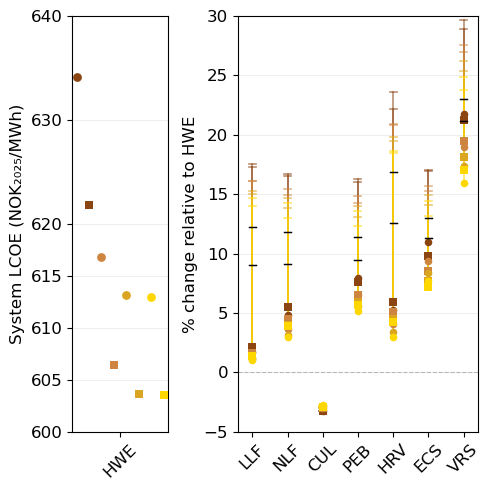

(<Figure size 500x500 with 2 Axes>,
 <AxesSubplot: ylabel='System LCOE (NOK₂₀₂₅/MWh)'>,
 <AxesSubplot: ylabel='% change relative to HWE'>)

In [41]:
plot_lcoe_panels(df_lcoe_zero_2, df_lcoe_range_2, df_lcoe_all_2, Scenario_order,
                  ylim_a=(600, 640), yticks_a = [600, 605, 610, 615, 620, 630, 640], ylim_b=(-5, 30),)
                 #save_path='plots_forests/modelling/base/system_costs_T.png')

In [45]:
df_lcoe_all_2

,forest_excls,buffer,costs,lcoe,hwe_lcoe,pct_change_from_hwe,own_base_lcoe,pct_change_from_own_base,config,transmission,solar_config
0,ECS,100,184.488183,709.182624,634.173802,11.827802,703.939039,0.744892,S13,DefaultYes,S1
1,PEB,800,184.045010,707.479043,634.173802,11.559172,684.559934,3.348006,S13,DefaultYes,S1
2,NLF,600,181.738367,698.612184,634.173802,10.160997,664.671715,5.106351,S13,DefaultYes,S1
3,PEB,0,178.082787,684.559934,634.173802,7.945161,684.559934,0.000000,S13,DefaultYes,S1
4,HWE,0,164.975238,634.173802,634.173802,0.000000,634.173802,0.000000,S13,DefaultYes,S1
...,...,...,...,...,...,...,...,...,...,...,...
731,ECS,400,171.901815,660.799941,603.600434,9.476386,649.993177,1.662596,S40+,LOWOH,S3
732,ECS,700,172.934604,664.770038,603.600434,10.134122,649.993177,2.273387,S40+,LOWOH,S3
733,NLF,500,169.709640,652.373102,603.600434,8.080290,627.692903,3.931891,S40+,LOWOH,S3
734,PEB,1000,171.447876,659.054974,603.600434,9.187293,639.163139,3.112169,S40+,LOWOH,S3


In [63]:
df_lcoe_all[
    (df_lcoe_all['forest_excls'] == 'CUL') &
    (df_lcoe_all['solar_config'] == 'S3') &
    (df_lcoe_all['transmission'] == 'LOWOH')
].sort_values('buffer', ascending=True).round(2)

,forest_excls,buffer,costs,lcoe,hwe_lcoe,pct_change_from_hwe,own_base_lcoe,pct_change_from_own_base,config,transmission,solar_config
695,CUL,0,166.35,639.46,641.24,-0.28,639.46,0.0,S40+,LOWOH,S3


In [39]:
Scenario_order = ['HWE', 'LLF', 'NLF', 'CUL', 'PEB', 'HRV', 'ECS', 'VRS'] #least to most restrictive

Scenario_colors = {
    'ECS': '#1b9e77',
    'HRV': '#d95f02',
    'LLF': '#7570b3',
    'NLF': '#e7298a',
    'PEB': '#66a61e',
    'VRS': '#e6ab02',
    'CUL': '#a6761d',
    'HWE': '#666666',
}

Scenario_markers = {
    'ECS': 'o',
    'HRV': 's',
    'LLF': '^',
    'NLF': 'D',
    'PEB': 'v',
    'VRS': 'P',
    'CUL': 'X',
    'HWE': '*',
}

In [355]:
costcomponents = [
    "costsgencapex",
    "costsgenfom",
    "costsgenvarom",
    "costsstorecapex",
    "costsstorefom",
    "costsstorevarom",
    "coststranscapex",
    "coststransfom",
]
concatlist = []
for costcomponent in tqdm(costcomponents):
    concatlist.append(makenice(found_scenarios, costcomponent))
costsc = pd.concat(concatlist, axis=1)
#del concatlist
costsc = costsc.loc[level_slice]


  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [356]:
costsc

costsgencapex  costsgenfom  costsgenvarom  \
transmission exclusions zone                                               
DefaultYes   EF         NO020      81.196443   130.748876      36.511119   
                        NO060     201.876182   124.605576      87.123294   
                        NO071     348.215808   292.155534      82.402036   
                        NO072     186.658887    95.886063      42.601495   
                        NO073     114.190217    76.980311      23.697052   
                        NO081       0.000289     0.195866       0.031533   
                        NO083     100.550603    61.646847      47.779146   
                        NO084       0.481350     9.366998       1.815027   
                        NO085     210.122190   139.034198      30.848601   
                        NO092     487.581263   363.277714      77.687258   
                        NO093      67.905829    14.168894       2.973527   
                        NO094     167.134203   146.115963      29.537619   
                        NO0A1     973.343840   846.607028      12.856973   
                        NO0A2       0.000050   365.717149      57.364688   
                        NO0A3     595.270940   334.682958      48.505364   
             SC         NO020     223.481829   182.184145      64.546828   
                        NO060     611.864880   280.397559     103.444562   
                        NO071     108.833335   201.617953      19.967754   
                        NO072     333.337578   148.909485      74.219617   
                        NO073      33.053214    25.579717       8.436314   
                        NO081       0.000010     0.195809       0.031522   
                        NO083       0.349162    41.070972     127.910017   
                        NO084       0.000012     9.192998       1.741495   
                        NO085     211.152638   132.133476      26.722714   
                        NO092     544.037070   408.163550     117.596634   
                        NO093      67.922427    14.174894       2.978753   
                        NO094     293.790392   172.137287      35.168423   
                        NO0A1     610.469655   577.447807     -12.483262   
                        NO0A2      25.013623   370.856148      58.457777   
                        NO0A3     455.900095   242.453204      33.846165   
LOWOH        PM         NO020       0.000021   101.396881      16.747048   
                        NO060     383.612853   209.220586     155.678386   
                        NO071     228.017195   249.076510     -20.749690   
                        NO072     229.648187   111.426424      52.121304   
                        NO073     184.971864    80.497350      27.270904   
                        NO081       0.000002     0.195807       0.031522   
                        NO083     283.191666   143.316848     141.877909   
                        NO084     105.081943    47.179455      24.285871   
                        NO085     231.508505   134.852472      26.553245   
                        NO092     704.685662   460.247955     151.277303   
                        NO093     173.733400    52.424892      29.010793   
                        NO094     343.839248   182.419748      37.383462   
                        NO0A1     301.668565   348.396889      16.317320   
                        NO0A2      43.354627   374.624278      59.232612   
                        NO0A3     157.775826    97.798225      17.310927   
             EF         NO020      81.196440   130.748875      36.604242   
                        NO060     153.034131   114.571048     103.593004   
                        NO071     348.117524   292.135340      73.272456   
                        NO072     186.658864    95.886054      41.920796   
                        NO073     191.618385   119.935072      16.727363   
                        NO081      14.212808     3.115807       0.597471   
   

In [357]:
#capex=Generation investments
#FOM+varom=upkeep

In [358]:
cost_columns = ['costsgencapex', 'costsgenfom', 'costsgenvarom', 
                'costsstorecapex', 'costsstorefom', 'costsstorevarom', 
                'coststranscapex', 'coststransfom']

costsc_agg = costsc.groupby(['transmission', 'exclusions'])[cost_columns].sum().reset_index()

costsc_agg['costsgenupkeep'] = costsc_agg['costsgenfom'] + costsc_agg['costsgenvarom']
costsc_agg['costsstoreupkeep'] = costsc_agg['costsstorefom'] + costsc_agg['costsstorevarom']
costsc_agg['coststransupkeep'] = costsc_agg['coststransfom']

costsc_agg = costsc_agg.drop(columns=["costsgenfom", "costsgenvarom", "costsstorefom", "costsstorevarom", "coststransfom"])

cost_cols_to_convert = ['costsgencapex', 'costsgenupkeep', 'costsstorecapex', 
                       'costsstoreupkeep', 'coststranscapex', 'coststransupkeep']

for col in cost_cols_to_convert:
    costsc_agg[col] = (costsc_agg[col]*cost_2024NOK) / 1000 #carefully check the conversion


costsc_agg = costsc_agg[costsc_agg['transmission'].isin(['DefaultYes', 'LOWOH'])]

PM_baseline = costsc_agg[costsc_agg['exclusions'] == 'PM'].set_index('transmission')

# Calculate differences for each cost component
for col in cost_cols_to_convert:
    costsc_agg[f'diff_{col}'] = costsc_agg.apply(
        lambda row: row[col] - PM_baseline.loc[row['transmission'], col] 
        if row['transmission'] in PM_baseline.index else np.nan, 
        axis=1
    )
costsc_agg

,transmission,exclusions,costsgencapex,costsstorecapex,coststranscapex,costsgenupkeep,costsstoreupkeep,coststransupkeep,diff_costsgencapex,diff_costsgenupkeep,diff_costsstorecapex,diff_costsstoreupkeep,diff_coststranscapex,diff_coststransupkeep
0,DefaultYes,CA,74.300404,7.078153,0.000000,73.013583,1.721930,0.461802,1.256997,2.707630,0.682534,0.355852,0.000000,0.000000
1,DefaultYes,EF,74.225090,6.394932,0.000000,75.241419,1.466948,0.461802,1.181683,4.935465,-0.000687,0.100870,0.000000,0.000000
2,DefaultYes,PC,73.047719,6.409703,0.000000,70.269923,1.388678,0.461802,0.004312,-0.036031,0.014084,0.022600,0.000000,0.000000
3,DefaultYes,PM,73.043407,6.395619,0.000000,70.305954,1.366078,0.461802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,DefaultYes,SC,73.903324,6.817943,0.000000,72.851107,1.498524,0.461802,0.859918,2.545153,0.422324,0.132446,0.000000,0.000000
5,DefaultYes,SD,74.057346,7.612320,0.000000,71.958651,1.518325,0.461802,1.013939,1.652697,1.216700,0.152247,0.000000,0.000000
6,DefaultYes,SO1,74.165940,6.366944,0.000000,71.966824,1.382088,0.461802,1.122533,1.660870,-0.028676,0.016009,0.000000,0.000000
7,DefaultYes,SO2,73.803209,6.539655,0.000000,71.697511,1.394851,0.461802,0.759802,1.391558,0.144036,0.028772,0.000000,0.000000
8,LOWOH,CA,72.030672,5.847889,0.575413,73.278844,1.434569,0.473310,1.237791,3.402956,0.135591,0.159638,-0.028136,-0.000563
9,LOWOH,EF,73.122543,6.739847,0.745874,74.110792,1.765289,0.476720,2.329662,4.234904,1.027549,0.490358,0.142325,0.002846


In [359]:
PM_baseline

,exclusions,costsgencapex,costsstorecapex,coststranscapex,costsgenupkeep,costsstoreupkeep,coststransupkeep
transmission,,,,,,,
DefaultYes,PM,73.043407,6.395619,0.000000,70.305954,1.366078,0.461802
LOWOH,PM,70.792881,5.712298,0.603549,69.875888,1.274930,0.473873


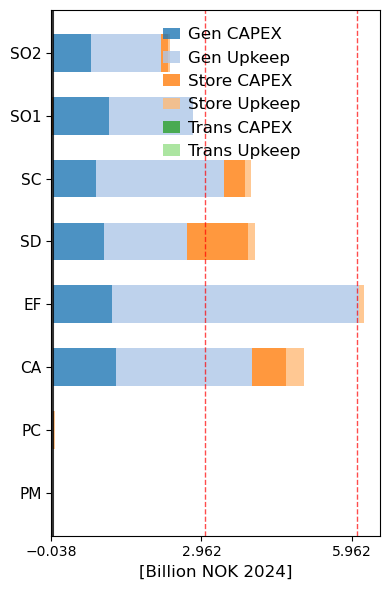

In [371]:
baseline_costs = costsc_agg[costsc_agg['exclusions'] == 'PM'].copy()

cost_cols = ['costsgencapex', 'costsgenupkeep', 'costsstorecapex', 'costsstoreupkeep', 
             'coststranscapex', 'coststransupkeep']
baseline_costs['total_cost'] = baseline_costs[cost_cols].sum(axis=1)

baseline_lookup = dict(zip(baseline_costs['transmission'], baseline_costs['total_cost']))

# Define difference columns for plotting
diff_cols = ['diff_costsgencapex', 'diff_costsgenupkeep', 'diff_costsstorecapex', 
             'diff_costsstoreupkeep', 'diff_coststranscapex', 'diff_coststransupkeep']

# Define colors for each cost type (using distinct, professional colors)
colors = {
    'diff_costsgencapex': '#1f77b4',      # Blue - Generation CAPEX
    'diff_costsgenupkeep': '#aec7e8',     # Light Blue - Generation Upkeep
    'diff_costsstorecapex': '#ff7f0e',    # Orange - Storage CAPEX
    'diff_costsstoreupkeep': '#ffbb78',   # Light Orange - Storage Upkeep
    'diff_coststranscapex': '#2ca02c',    # Green - Transmission CAPEX
    'diff_coststransupkeep': '#98df8a'    # Light Green - Transmission Upkeep
}


labels = {
    'diff_costsgencapex': 'Gen CAPEX',
    'diff_costsgenupkeep': 'Gen Upkeep',
    'diff_costsstorecapex': 'Store CAPEX',
    'diff_costsstoreupkeep': 'Store Upkeep',
    'diff_coststranscapex': 'Trans CAPEX',
    'diff_coststransupkeep': 'Trans Upkeep'
}

fig, (ax) = plt.subplots(1, 1, figsize=(4, 6))

data = costsc_agg[(costsc_agg['transmission'] == 'DefaultYes')].copy()
data = data.set_index('exclusions').reindex(custom_order).reset_index()

baseline_total = baseline_lookup.get('DefaultYes', 1)


scenarios = data['exclusions'].tolist()
y_pos = np.arange(len(scenarios))
left_positive = np.zeros(len(scenarios))
left_negative = np.zeros(len(scenarios))

# Plot each cost component
for col in diff_cols:
    values = data[col].values

    # Separate positive and negative values
    pos_values = np.where(values >= 0, values, 0)
    neg_values = np.where(values < 0, values, 0)

    # Plot positive values (stacked to the right)
    if np.any(pos_values >= 0):
        ax.barh(y_pos, pos_values, left=left_positive, 
           color=colors[col], label=labels[col], alpha=0.8, height=0.6)
        left_positive += pos_values
        
    # Plot negative values (stacked to the left)
    if np.any(neg_values < 0):
        ax.barh(y_pos, neg_values, left=left_negative, 
                color=colors[col], alpha=0.8, height=0.6)
        left_negative += neg_values
        
pct_2 = baseline_total * 0.02
pct_4 = baseline_total * 0.04
pct_6 = baseline_total * 0.06

# Add vertical reference lines
ax.axvline(x=0, color='black', linewidth=1.5, alpha=0.8)
ax.axvline(x=pct_2, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.axvline(x=pct_4, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.axvline(x=pct_6, color='red', linestyle='--', alpha=0.7, linewidth=1)

ax.set_yticks(y_pos)
ax.set_yticklabels(scenarios, fontsize=11)
ax.set_xlabel('[Billion NOK 2024]', fontsize=12)
#ax.set_title(title, fontsize=14, fontweight='bold', pad=15)
#ax.grid(axis='x', alpha=0.3, linestyle='-', linewidth=0.5)


x_min = min(left_negative) * 1.05
x_max = np.max(left_positive) * 1.05
ax.set_xlim(x_min, x_max)
ax.set_xticks(np.arange(x_min, x_max + 1, 3))

ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=11)

handles, legend_labels = ax.get_legend_handles_labels()
# if handles:  # Only add legend if there are handles
#     # Remove duplicate handles for cleaner legend
#     unique_handles = []
#     unique_labels = []
#     seen_labels = set()
    
#     for handle, label in zip(handles, legend_labels):
#         if label not in seen_labels:
#             unique_handles.append(handle)
#             unique_labels.append(label)
#             seen_labels.add(label)

ax.legend(handles, legend_labels,  loc='upper center', bbox_to_anchor=(0.55, 0.98), 
          ncol=1, borderaxespad=0., frameon=False, 
          fontsize=12, handlelength=1, handletextpad=0.5)
plt.tight_layout()

In [372]:
baseline_costs = costsc_agg[costsc_agg['exclusions'] == 'PM'].copy()

cost_cols = ['costsgencapex', 'costsgenupkeep', 'costsstorecapex', 'costsstoreupkeep', 
             'coststranscapex', 'coststransupkeep']

baseline_costs['total_cost'] = baseline_costs[cost_cols].sum(axis=1)

baseline_lookup = dict(zip(baseline_costs['transmission'], baseline_costs['total_cost']))

# Define difference columns for plotting
diff_cols = ['diff_costsgencapex', 'diff_costsgenupkeep', 'diff_costsstorecapex', 
             'diff_costsstoreupkeep', 'diff_coststranscapex', 'diff_coststransupkeep']

# Define colors for each cost type (using distinct, professional colors)
colors = {
    'diff_costsgencapex': '#1f77b4',      # Blue - Generation CAPEX
    'diff_costsgenupkeep': '#aec7e8',     # Light Blue - Generation Upkeep
    'diff_costsstorecapex': '#ff7f0e',    # Orange - Storage CAPEX
    'diff_costsstoreupkeep': '#ffbb78',   # Light Orange - Storage Upkeep
    'diff_coststranscapex': '#2ca02c',    # Green - Transmission CAPEX
    'diff_coststransupkeep': '#98df8a'    # Light Green - Transmission Upkeep
}


labels = {
    'diff_costsgencapex': 'Gen CAPEX',
    'diff_costsgenupkeep': 'Gen Upkeep',
    'diff_costsstorecapex': 'Store CAPEX',
    'diff_costsstoreupkeep': 'Store Upkeep',
    'diff_coststranscapex': 'Trans CAPEX',
    'diff_coststransupkeep': 'Trans Upkeep'
}

In [373]:
costsc_agg

,transmission,exclusions,costsgencapex,costsstorecapex,coststranscapex,costsgenupkeep,costsstoreupkeep,coststransupkeep,diff_costsgencapex,diff_costsgenupkeep,diff_costsstorecapex,diff_costsstoreupkeep,diff_coststranscapex,diff_coststransupkeep
0,DefaultYes,CA,74.300404,7.078153,0.000000,73.013583,1.721930,0.461802,1.256997,2.707630,0.682534,0.355852,0.000000,0.000000
1,DefaultYes,EF,74.225090,6.394932,0.000000,75.241419,1.466948,0.461802,1.181683,4.935465,-0.000687,0.100870,0.000000,0.000000
2,DefaultYes,PC,73.047719,6.409703,0.000000,70.269923,1.388678,0.461802,0.004312,-0.036031,0.014084,0.022600,0.000000,0.000000
3,DefaultYes,PM,73.043407,6.395619,0.000000,70.305954,1.366078,0.461802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,DefaultYes,SC,73.903324,6.817943,0.000000,72.851107,1.498524,0.461802,0.859918,2.545153,0.422324,0.132446,0.000000,0.000000
5,DefaultYes,SD,74.057346,7.612320,0.000000,71.958651,1.518325,0.461802,1.013939,1.652697,1.216700,0.152247,0.000000,0.000000
6,DefaultYes,SO1,74.165940,6.366944,0.000000,71.966824,1.382088,0.461802,1.122533,1.660870,-0.028676,0.016009,0.000000,0.000000
7,DefaultYes,SO2,73.803209,6.539655,0.000000,71.697511,1.394851,0.461802,0.759802,1.391558,0.144036,0.028772,0.000000,0.000000
8,LOWOH,CA,72.030672,5.847889,0.575413,73.278844,1.434569,0.473310,1.237791,3.402956,0.135591,0.159638,-0.028136,-0.000563
9,LOWOH,EF,73.122543,6.739847,0.745874,74.110792,1.765289,0.476720,2.329662,4.234904,1.027549,0.490358,0.142325,0.002846


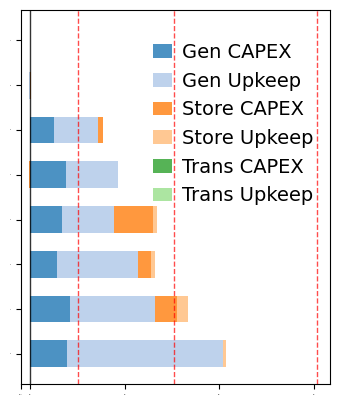

In [395]:
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

fig, ax = plt.subplots(1, 1, figsize=(3.5, 5))

trans_cat = 'DefaultYes'
title = 'Fixed'

data = costsc_agg[costsc_agg['transmission'] == trans_cat].copy()
data = data.set_index('exclusions').reindex(scenarios).reset_index()

baseline_total = baseline_lookup.get(trans_cat, 1)

scenarios_list = data['exclusions'].tolist()
y_pos = np.arange(len(scenarios_list))
left_positive = np.zeros(len(scenarios_list))
left_negative = np.zeros(len(scenarios_list))

# Plot each cost component
for col in diff_cols:
    values = data[col].values
    pos_values = np.where(values >= 0, values, 0)
    neg_values = np.where(values < 0, values, 0)
    
    if np.any(pos_values >= 0):
        ax.barh(y_pos, pos_values, left=left_positive, 
               color=colors[col], label=labels[col], alpha=0.8, height=0.6)
        left_positive += pos_values
    if np.any(neg_values < 0):
        ax.barh(y_pos, neg_values, left=left_negative, 
                color=colors[col], alpha=0.8, height=0.6)
        left_negative += neg_values

pct_1 = baseline_total * 0.01   
pct_3 = baseline_total * 0.03
pct_6 = baseline_total * 0.06
 
# Add vertical reference lines
ax.axvline(x=0, color='black', linewidth=1, alpha=0.8)
ax.axvline(x=pct_1, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.axvline(x=pct_3, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.axvline(x=pct_6, color='red', linestyle='--', alpha=0.7, linewidth=1)
ax.text(pct_1-0.9, y=6.5, s='', horizontalalignment='left', verticalalignment='top', color='red', fontsize=11)
ax.text(pct_3-0.9, y=6.5, s='', horizontalalignment='left', verticalalignment='top', color='red', fontsize=11)
ax.text(pct_6-0.9, y=6.5, s='', horizontalalignment='left', verticalalignment='top', color='red', fontsize=11)

ax.set_yticks(y_pos)
#ax.set_yticklabels([s.upper() for s in scenarios_list], fontsize=12)
#ax.set_xlabel('billion NOK 2024', fontsize=12)
#ax.set_title(title, fontsize=12, pad=0.05)
#ax.set_yticklabels([s.upper() for s in scenarios_list], fontsize=0)

ax.set_xlim(-0.3, 9.5)
ax.set_xticks([-0.3, 0, 3, 6, 9])

ax.tick_params(axis='x', labelsize=0)
ax.tick_params(axis='y', labelsize=0)

# Add legend
handles, legend_labels = ax.get_legend_handles_labels()
fig.legend(handles, legend_labels, loc='upper center', bbox_to_anchor=(0.68, 0.75), 
          ncol=1, borderaxespad=0., frameon=False, 
          fontsize=14, handlelength=1, handletextpad=0.5)

plt.tight_layout()
plt.subplots_adjust(top=0.80)
#plt.savefig('costs_composition_fixed.png', dpi=300, bbox_inches='tight')
plt.savefig('costs_composition_fixedposter.png', dpi=300, transparent=True, bbox_inches='tight')
plt.show()

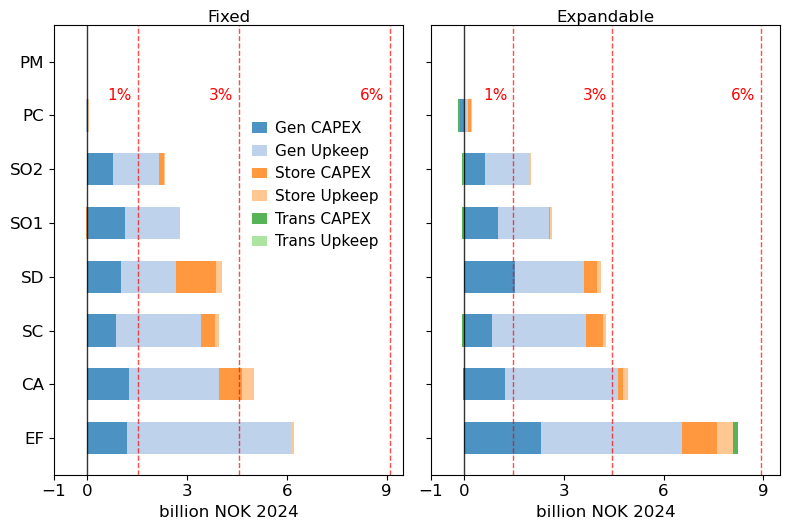

In [377]:
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
fig, axes = plt.subplots(1, 2, figsize=(8, 6))

transmission_cats = ['DefaultYes', 'LOWOH']
titles = ['Fixed', 'Expandable']

for i, (ax, trans_cat, title) in enumerate(zip(axes, transmission_cats, titles)):
   data = costsc_agg[costsc_agg['transmission'] == trans_cat].copy()
   data = data.set_index('exclusions').reindex(scenarios).reset_index()
   
   baseline_total = baseline_lookup.get(trans_cat, 1)
   
   
   scenarios = data['exclusions'].tolist()
   y_pos = np.arange(len(scenarios))
   left_positive = np.zeros(len(scenarios))
   left_negative = np.zeros(len(scenarios))
   
   # Plot each cost component
   for col in diff_cols:
       values = data[col].values
       pos_values = np.where(values >= 0, values, 0)
       neg_values = np.where(values < 0, values, 0)
       
       if np.any(pos_values >= 0):
           ax.barh(y_pos, pos_values, left=left_positive, 
                  color=colors[col], label=labels[col], alpha=0.8, height=0.6)
           left_positive += pos_values

       if np.any(neg_values < 0):
           ax.barh(y_pos, neg_values, left=left_negative, 
                   color=colors[col], alpha=0.8, height=0.6)
           left_negative += neg_values
   

   pct_1 = baseline_total * 0.01   
   pct_3 = baseline_total * 0.03
   pct_6 = baseline_total * 0.06
    
   # Add vertical reference lines
   ax.axvline(x=0, color='black', linewidth=1, alpha=0.8)
   ax.axvline(x=pct_1, color='red', linestyle='--', alpha=0.7, linewidth=1)
   ax.axvline(x=pct_3, color='red', linestyle='--', alpha=0.7, linewidth=1)
   ax.axvline(x=pct_6, color='red', linestyle='--', alpha=0.7, linewidth=1)

   ax.text(pct_1-0.9, y=6.5, s='1%', horizontalalignment='left', verticalalignment='top', color='red', fontsize=11)
   ax.text(pct_3-0.9, y=6.5, s='3%', horizontalalignment='left', verticalalignment='top', color='red', fontsize=11)
   ax.text(pct_6-0.9, y=6.5, s='6%', horizontalalignment='left', verticalalignment='top', color='red', fontsize=11)

   
   ax.set_yticks(y_pos)
   ax.set_yticklabels([s.upper() for s in scenarios], fontsize=12)
   #ax.set_yticklabels(scenarios, fontsize=12)
   ax.set_xlabel('billion NOK 2024', fontsize=12)
   ax.set_title(title, fontsize=12, pad=0.05)
   
   #x_min = -1
   #x_max = np.max(left_positive) * 1.05
   ax.set_xlim(-1, 9.5)
   ax.set_xticks([-1, 0, 3, 6, 9])
   
   ax.tick_params(axis='x', labelsize=12)
   if i == 0:
       ax.tick_params(axis='y', labelsize=12)
   else:
       ax.set_yticklabels([])

# Add legend only to the first subplot
handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, loc='upper center', bbox_to_anchor=(0.4, 0.7), 
          ncol=1, borderaxespad=0., frameon=False, 
          fontsize=11, handlelength=1, handletextpad=0.5)

plt.tight_layout()
plt.subplots_adjust(top=0.85)

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/costs_composition.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/costs_compositionT.png', dpi=300, transparent=True, bbox_inches='tight')



# Capacities

In [40]:
cap = makenice(found_scenarios, "cap")

  0%|          | 0/16 [00:00<?, ?it/s]

In [153]:
cap_solarplus = makenice(found_scenarios_cap2areaplus, "cap")

  0%|          | 0/184 [00:00<?, ?it/s]

In [18]:
cap_base = makenice(found_scenarios_base, "cap")

  0%|          | 0/736 [00:00<?, ?it/s]

In [46]:
cap_base = cap_base.loc[level_slice]

In [47]:
cap_base

gencaptot
transmission forest_excls buffer varnewpcapQ technology                           
DefaultYes   ECS          100    S1          Export                       2.450277
                                             HydroRes                    24.948390
                                             HydroRoR                     7.223794
                                             Import                       2.450277
                                             NaturalgasCCGTwithCCSnewOT   0.000000
...                                                                            ...
LOWOH        VRS          2000   S3          Solar                       40.000000
                                             Windoffshore                13.151991
                                             Windoffshorefloating         4.024591
                                             Windonshore_F                0.445520
                                             Windonshore_OF               8.116280

[8096 rows x 1 columns]

In [48]:
np.unique(cap_base.reset_index()['technology'])

array(['Export', 'HydroRes', 'HydroRoR', 'Import',
       'NaturalgasCCGTwithCCSnewOT', 'NaturalgasOCGTnew', 'Solar',
       'Windoffshore', 'Windoffshorefloating', 'Windonshore_F',
       'Windonshore_OF'], dtype=object)

In [49]:
tech_query_string = (
    "technology == 'Solar' | "
    "technology == 'Windoffshore' | "
    "technology == 'Windoffshorefloating' | "
    "technology == 'Windonshore_F' | "
    "technology == 'Windonshore_OF'"
)

In [50]:
cap_base_filtered = cap_base.query(tech_query_string)

In [51]:
tech_rename = {
    'Windonshore_F': 'Onshore (F)',
    'Windonshore_OF': 'Onshore',
    'Windoffshorefloating': 'Offshore floating',
    'Windoffshore': 'Offshore',
    'Solar': 'Solar',
}

tech_order = ['Solar', 'Windonshore_OF', 'Windonshore_F',
              'Windoffshore', 'Windoffshorefloating']

In [52]:
def calc_cap_diff_and_ratios(cap_costs, tech_order,
                              base_scenario='HWE', buffer_val=0):
    """
    Calculate technology capacity differences from base case (base_scenario, solar minus, DefaultYes)
    and OF/F ratio + offshore share for all scenarios and configurations.
    
    Returns:
        df_diff: differences per scenario, technology, config
        df_ratios: OF/F ratio and offshore share per scenario, config, buffer
    """
    # define configs: (dataset, transmission, label)
    # configs = [
    #     (cap_solarminus, 'DefaultYes', 'OPT', 'S13-Fix'),
    #     (cap_solarminus, 'LOWOH', 'OPT', 'S13-Exp'),
    #     (cap_solarplus, 'DefaultYes', 'OPT', 'S∞-Fix'),
    #     (cap_solarplus, 'LOWOH', 'OPT', 'S∞-Exp'),
    #     (cap_S2S3, 'DefaultYes', 'S2', 'S30-Fix'),
    #     (cap_S2S3, 'LOWOH', 'S2', 'S30-Exp'),
    #     (cap_S2S3, 'DefaultYes', 'S3', 'S40-Fix'),
    #     (cap_S2S3, 'LOWOH', 'S3', 'S40-Exp'),
    # ]
    config_map2 = [
        (cap_costs, 'DefaultYes', 'S1', 'S13'),
        (cap_costs, 'LOWOH', 'S1', 'S13+'),
        (cap_costs, 'DefaultYes', 'S4', 'S+'),
        (cap_costs, 'LOWOH', 'S4', 'S++'),
        (cap_costs, 'DefaultYes', 'S2', 'S30'),
        (cap_costs, 'LOWOH', 'S2', 'S30+'),
        (cap_costs, 'DefaultYes', 'S3', 'S40'),
        (cap_costs, 'LOWOH', 'S3', 'S40+'),
    ]
    # --- Base case values ---
    #df_base = cap_solarminus.query("transmission == 'DefaultYes' & varnewpcapQ == 'OPT'").reset_index()
    df_base = cap_costs.query("transmission == 'DefaultYes' & varnewpcapQ == 'S1'").reset_index()
    df_base = df_base[['forest_excls', 'buffer', 'technology', 'gencaptot']]
    df_base['buffer'] = df_base['buffer'].astype(int)
    df_base = df_base[(df_base['buffer'] == buffer_val) &
                       (df_base['technology'].isin(tech_order))]
    base_by_scen = {}
    for scen in df_base['forest_excls'].unique():
        base_by_scen[scen] = (df_base[df_base['forest_excls'] == scen]
                              .set_index('technology')['gencaptot'].to_dict())
    
    # --- Panel B: differences ---
    diff_records = []
    
    for cap_data, trans_type, vnp, label in config_map2:
        df = cap_data.query("transmission == @trans_type & varnewpcapQ == @vnp").reset_index()
        df = df[['forest_excls', 'buffer', 'technology', 'gencaptot']]
        df['buffer'] = df['buffer'].astype(int)
        df = df[(df['buffer'] == buffer_val) & (df['technology'].isin(tech_order))]
        
        for scen in df['forest_excls'].unique():
            sub = df[df['forest_excls'] == scen].set_index('technology')
            for tech in tech_order:
                val = sub.loc[tech, 'gencaptot'] if tech in sub.index else 0
                baseline = base_by_scen.get(scen, {}).get(tech, 0)
                diff_records.append({
                    'scenario': scen,
                    'technology': tech,
                    'config': label,
                    'capacity': val,
                    'base_capacity': baseline,
                    'diff_gw': val - baseline,
                })
    
    df_diff = pd.DataFrame(diff_records)
    
    # --- Panel C: OF/F ratio and offshore share across all buffers ---
    ratio_records = []
    
    for cap_data, trans_type, vnp, label in config_map2:
        df = cap_data.query("transmission == @trans_type & varnewpcapQ == @vnp").reset_index()
        df = df[['forest_excls', 'buffer', 'technology', 'gencaptot']]
        df['buffer'] = df['buffer'].astype(int)
        df = df[df['technology'].isin(tech_order)]
        
        # pivot to get techs as columns per scenario-buffer
        df_pivot = df.pivot_table(index=['forest_excls', 'buffer'], 
                                   columns='technology', values='gencaptot',
                                   aggfunc='sum', fill_value=0).reset_index()
        
        for _, row in df_pivot.iterrows():
            cap_F = row.get('Windonshore_F', 0)
            cap_OF = row.get('Windonshore_OF', 0)
            cap_offshore = row.get('Windoffshore', 0) + row.get('Windoffshorefloating', 0)
            total_cap = sum(row.get(t, 0) for t in tech_order)
            
            f_share = cap_F / (cap_F+cap_OF)* 100 if cap_F > 0.01 else np.nan
            offshore_share = cap_offshore / total_cap * 100 if total_cap > 0 else 0
            
            ratio_records.append({
                'scenario': row['forest_excls'],
                'buffer': row['buffer'],
                'config': label,
                'cap_F': cap_F,
                'cap_OF': cap_OF,
                'cap_offshore': cap_offshore,
                'total_cap': total_cap,
                'f_share': f_share,
                'offshore_share_pct': offshore_share,
            })
    
    df_shares = pd.DataFrame(ratio_records)
    
    return df_diff, df_shares


In [55]:
df_shares_2

,scenario,buffer,config,cap_F,cap_OF,cap_offshore,total_cap,f_share,offshore_share_pct
0,CUL,0,S13,30.684128,22.543222,0.495716,66.723065,57.647296,0.742945
1,ECS,0,S13,3.461600,32.578709,10.532820,59.573129,9.604802,17.680488
2,ECS,100,S13,2.012240,32.669359,11.199634,58.881233,5.802040,19.020719
3,ECS,200,S13,1.718240,32.289861,11.512857,58.520959,5.052443,19.673050
4,ECS,300,S13,1.531760,31.771886,11.804162,58.107808,4.599377,20.314245
...,...,...,...,...,...,...,...,...,...
731,VRS,1000,S40+,0.458480,10.334840,16.102070,66.895390,4.247813,24.070523
732,VRS,1500,S40+,0.452000,9.038120,16.693878,66.183998,4.762848,25.223436
733,VRS,2000,S40+,0.445520,8.116280,17.176582,65.738382,5.203579,26.128696
734,VRS,2500,S40+,0.438800,7.425320,17.964214,65.828334,5.579773,27.289486


In [56]:
df_lcoe_all_2

,forest_excls,buffer,costs,lcoe,hwe_lcoe,pct_change_from_hwe,own_base_lcoe,pct_change_from_own_base,config,transmission,solar_config
0,ECS,100,184.488183,709.182624,634.173802,11.827802,703.939039,0.744892,S13,DefaultYes,S1
1,PEB,800,184.045010,707.479043,634.173802,11.559172,684.559934,3.348006,S13,DefaultYes,S1
2,NLF,600,181.738367,698.612184,634.173802,10.160997,664.671715,5.106351,S13,DefaultYes,S1
3,PEB,0,178.082787,684.559934,634.173802,7.945161,684.559934,0.000000,S13,DefaultYes,S1
4,HWE,0,164.975238,634.173802,634.173802,0.000000,634.173802,0.000000,S13,DefaultYes,S1
...,...,...,...,...,...,...,...,...,...,...,...
731,ECS,400,171.901815,660.799941,603.600434,9.476386,649.993177,1.662596,S40+,LOWOH,S3
732,ECS,700,172.934604,664.770038,603.600434,10.134122,649.993177,2.273387,S40+,LOWOH,S3
733,NLF,500,169.709640,652.373102,603.600434,8.080290,627.692903,3.931891,S40+,LOWOH,S3
734,PEB,1000,171.447876,659.054974,603.600434,9.187293,639.163139,3.112169,S40+,LOWOH,S3


In [223]:
# usage

df_diff_2, df_shares_2 = calc_cap_diff_and_ratios(cap_base_filtered, tech_order)

# # check differences
# print("=== Differences from base ===")
# print(df_diff[df_diff['scenario'] == 'VRS'][['technology', 'config', 'diff_gw']].round(2))

# # check ratios
# print("\n=== OF/F ratio and offshore share ===")
# print(df_shares[(df_shares['scenario'] == 'CUL') & (df_shares['buffer'] == 0)][
#     ['config', 'f_share', 'offshore_share_pct']].round(2))

In [436]:
np.unique(df_diff['technology'])

array(['Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore_F',
       'Windonshore_OF'], dtype=object)

In [225]:
df_diff_2.to_csv("df_diff_2.csv", index=False)


In [133]:
def plot_cap_diff_dots(df_diff, scenario_order, tech_order, tech_colors, tech_rename,
                        config_markers=None, ylim=None, yticks=None, save_path=None):
    if config_markers is None:
        config_markers = {
            'S13': {'marker': 'o', 'edgecolor': 'black', 'linewidth': 0.6},
            'S13+': {'marker': 'o', 'edgecolor': 'grey', 'linewidth': 0},
            'S30': {'marker': 's', 'edgecolor': 'black', 'linewidth': 0.6},
            'S30+': {'marker': 's', 'edgecolor': 'grey', 'linewidth': 0},
            'S40': {'marker': '^', 'edgecolor': 'black', 'linewidth': 0.6},
            'S40+': {'marker': '^', 'edgecolor': 'grey', 'linewidth': 0},
            'S+':  {'marker': 'D', 'edgecolor': 'black', 'linewidth': 0.6},
            'S++':  {'marker': 'D', 'edgecolor': 'grey', 'linewidth': 0},
        }

    
    # separate solar and wind techs
    wind_techs = [t for t in tech_order if t != 'Solar']
    
    scenarios_present = [s for s in scenario_order if s in df_diff['scenario'].unique()]
    configs = [c for c in config_markers.keys() if c in df_diff['config'].unique()]
    # remove base config (all zeros)
    configs = [c for c in configs if c != 'S13']
    
    fig, ax1 = plt.subplots(figsize=(8, 4))
    ax2 = ax1.twinx()
    
    x_positions = np.arange(len(scenarios_present))
    n_configs = len(configs)
    n_wind = len(wind_techs)
    
    # spread dots within each scenario
    total_dots = n_configs * (n_wind + 1)  # +1 for solar
    spread = 0.5  # total width per scenario
    
    for i, scen in enumerate(scenarios_present):
        dot_idx = 0
        for j, config in enumerate(configs):
            # wind techs on left axis
            for k, tech in enumerate(wind_techs):
                row = df_diff[(df_diff['scenario'] == scen) & 
                              (df_diff['technology'] == tech) & 
                              (df_diff['config'] == config)]
                if len(row) == 0:
                    dot_idx += 1
                    continue
                val = row['diff_gw'].values[0]
                x_offset = -spread/2 + (dot_idx / (total_dots - 1)) * spread
                
                ax1.scatter(i + x_offset, val,
                           color=tech_colors.get(tech, '#999999'),
                           marker=config_markers[config]['marker'],
                           s=25, zorder=3,
                           edgecolor=config_markers[config]['edgecolor'],
                           linewidth=config_markers[config]['linewidth'])
                dot_idx += 1
            
            # solar on right axis
            row_solar = df_diff[(df_diff['scenario'] == scen) & 
                                (df_diff['technology'] == 'Solar') & 
                                (df_diff['config'] == config)]
            if len(row_solar) > 0:
                val_solar = row_solar['diff_gw'].values[0]
                x_offset = -spread/2 + (dot_idx / (total_dots - 1)) * spread
                ax2.scatter(i + x_offset, val_solar,
                           color=tech_colors.get('Solar', '#f9d002'),
                           marker=config_markers[config]['marker'],
                           s=25, zorder=3,
                           edgecolor=config_markers[config]['edgecolor'],
                           linewidth=config_markers[config]['linewidth'])
            dot_idx += 1
    
    # zero lines
    ax1.axhline(y=0, color='grey', linestyle='--', linewidth=1, alpha=0.5)

    for i in range(len(scenarios_present) - 1):
        ax1.axvline(x=i + 0.5, color='lightgrey', linestyle='-', linewidth=0.5, alpha=0.5, zorder=0)
    
    # left axis (wind)
    ax1.set_xticks(x_positions)
    ax1.set_xticklabels(scenarios_present, fontsize=12)
    ax1.set_ylabel('Wind capacity change (GW)', fontsize=12)
    ax1.tick_params(axis='both', labelsize=12)
    if ylim:
        ax1.set_ylim(ylim)
    if yticks:
        ax1.set_yticks(yticks)
    ax1.grid(True, axis='y', alpha=0.3, linewidth=0.5, zorder=0)
    ax1.spines['top'].set_visible(False)
    
    # right axis (solar) - yellow
    ax2.set_ylabel('Solar capacity change (GW)', fontsize=12, color='#f9d002')
    #ax2.set_ylabel('', fontsize=12, color='#f9d002')    
    ax2.tick_params(axis='y', labelcolor='#f9d002', color='#f9d002', labelsize=12)
    #ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_color('#f9d002')
    
    # config legend only (tech legend from panel A)
    legend_elements = [plt.Line2D([0], [0], marker=config_markers[c]['marker'],
                                   color='grey', linestyle='None',
                                   markersize=6,
                                   markeredgecolor=config_markers[c]['edgecolor'],
                                   markeredgewidth=config_markers[c]['linewidth'],
                                   label="") for c in config_markers.keys() if c not in ['S13','S30','S+','S40' ]]
    ax1.legend(handles=legend_elements, fontsize=10, loc='upper left', ncol=4,
               frameon=False, handletextpad=0.3, columnspacing=2.5,  bbox_to_anchor=(0.35, 1.02))
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax1, ax2


In [134]:
df_diff_2

,scenario,technology,config,capacity,base_capacity,diff_gw
0,HRV,Solar,S13,1.300000e+01,1.300000e+01,0.000000
1,HRV,Windonshore_OF,S13,2.677722e+01,2.677722e+01,0.000000
2,HRV,Windonshore_F,S13,1.943069e+01,1.943069e+01,0.000000
3,HRV,Windoffshore,S13,5.574525e+00,5.574525e+00,0.000000
4,HRV,Windoffshorefloating,S13,2.366694e-08,2.366694e-08,0.000000
...,...,...,...,...,...,...
315,PEB,Solar,S40+,4.000000e+01,1.300000e+01,27.000000
316,PEB,Windonshore_OF,S40+,3.533856e+01,3.363337e+01,1.705192
317,PEB,Windonshore_F,S40+,9.482582e+00,1.244725e+01,-2.964664
318,PEB,Windoffshore,S40+,1.491500e+00,5.515446e+00,-4.023945


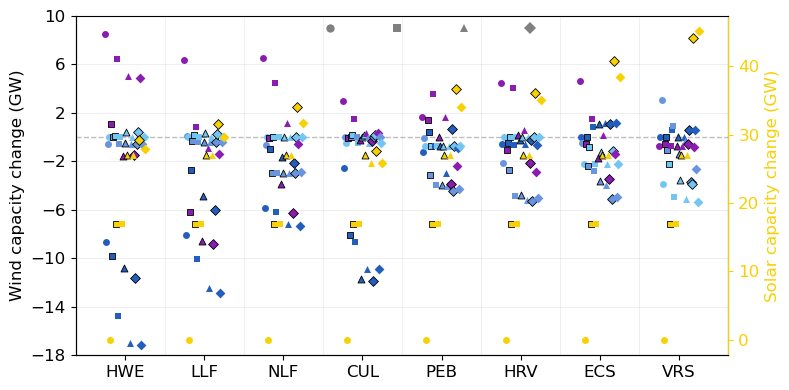

(<Figure size 800x400 with 2 Axes>,
 <AxesSubplot: ylabel='Wind capacity change (GW)'>,
 <AxesSubplot: ylabel='Solar capacity change (GW)'>)

In [135]:
# usage
plot_cap_diff_dots(df_diff_2, Scenario_order, tech_order, colordict, tech_rename,
                    ylim=(-18, 10), yticks = [-18, -14, -10, -6, -2, 2, 6, 10], 
                  save_path='plots_forests/modelling/base/cap_difference_all_config_T.png')

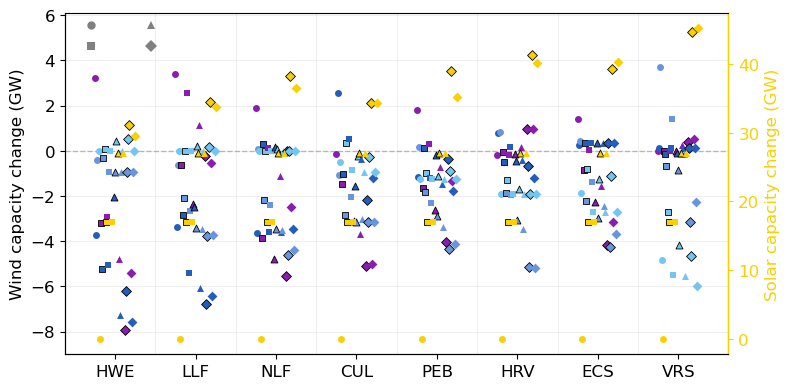

(<Figure size 800x400 with 2 Axes>,
 <AxesSubplot: ylabel='Wind capacity change (GW)'>,
 <AxesSubplot: ylabel='Solar capacity change (GW)'>)

In [505]:
# usage
plot_cap_diff_dots(df_diff_2, Scenario_order, tech_order, colordict, tech_rename,
                    ylim=(-9, 6.1), yticks = [-8, -6, -4, -2, 0, 2, 4, 6],) 
                  #save_path='plots_forests/modelling/samecost/cap_difference_all_config_T.png')

In [117]:
def plot_tech_stack_base(cap_data, transmission_type, varnewpcap, scenario_order, tech_colors, tech_rename, save_path=None):
    df_cap = cap_data.query("transmission == @transmission_type").reset_index()
    df_cap = df_cap[df_cap['varnewpcapQ'] == varnewpcap]
    df_cap = df_cap[['forest_excls', 'buffer', 'technology', 'gencaptot']]
    df_cap['buffer'] = df_cap['buffer'].astype(int)
    
    # filter to base case (buffer=0)
    df_base = df_cap[df_cap['buffer'] == 0]
    
    # pivot: scenarios as rows, technologies as columns
    df_pivot = df_base.pivot_table(index='forest_excls', columns='technology',
                                    values='gencaptot', aggfunc='sum', fill_value=0)
    
    # reorder scenarios
    df_pivot = df_pivot.reindex([s for s in scenario_order if s in df_pivot.index])
    
    # define technology plotting order (bottom to top)
    tech_order = ['Solar', 'Windonshore_OF', 'Windonshore_F',
                  'Windoffshore', 'Windoffshorefloating']
    
    fig, ax = plt.subplots(figsize=(3, 4))
    
    bottom = np.zeros(len(df_pivot))
    x = range(len(df_pivot))
    bar_width = 0.45
    
    for tech in tech_order:
        ax.bar(x, df_pivot[tech], width=bar_width, bottom=bottom,
               color=tech_colors.get(tech, '#999999'), edgecolor='None',
               linewidth=0.5, label=tech_rename.get(tech, tech), zorder=3)
        bottom += df_pivot[tech].values
    
    ax.set_xticks(x)
    ax.set_xticklabels(df_pivot.index, fontsize=8, rotation=45, ha='right')
    #ax.set_xticklabels([])
    ax.set_ylabel('Installed capacity (GW)', fontsize=12)
    ax.tick_params(axis='both', labelsize=11)
    #ax.legend(fontsize=10, ncol=3, loc='upper center', frameon=False, bbox_to_anchor=(0.48, 1.09),
    #          handlelength=1, handletextpad=0.5)
    df_pivot[tech]
    ax.set_ylim(0, 75)
    ax.grid(True, axis='y', alpha=0.3, linewidth=0.5, zorder=0)
    ax.yaxis.set_minor_locator(MultipleLocator(10))
    ax.grid(True, axis='y', which='minor', alpha=0.6, linestyle=':', linewidth=0.5, zorder=0)

    #ax.spines['top'].set_visible(False)
    #ax.spines['right'].set_visible(False)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax



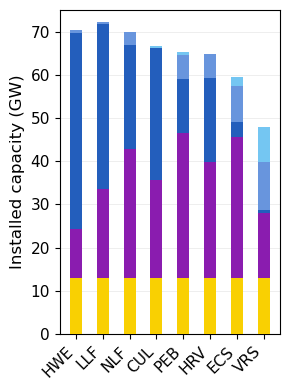

(<Figure size 300x400 with 1 Axes>,
 <AxesSubplot: ylabel='Installed capacity (GW)'>)

In [118]:
# usage
plot_tech_stack_base(cap_base_filtered, 'DefaultYes', 'S1', Scenario_order,
                     colordict, tech_rename, save_path='plots_forests/modelling/base/cap_S13_T.png')


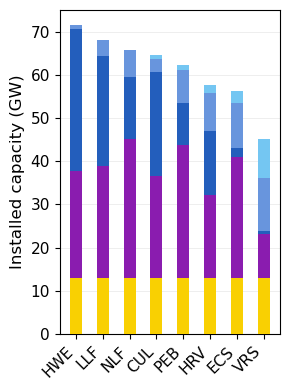

(<Figure size 300x400 with 1 Axes>,
 <AxesSubplot: ylabel='Installed capacity (GW)'>)

In [517]:
# usage
plot_tech_stack_base(cap_costs_filtered, 'DefaultYes', 'S1', Scenario_order,
                     colordict, tech_rename, save_path='plots_forests/modelling/samecost/solarminus_fixed_trans.png')


In [140]:
df_shares_2

,scenario,buffer,config,cap_F,cap_OF,cap_offshore,total_cap,f_share,offshore_share_pct
0,CUL,0,S13,30.684128,22.543222,0.495716,66.723065,57.647296,0.742945
1,ECS,0,S13,3.461600,32.578709,10.532820,59.573129,9.604802,17.680488
2,ECS,100,S13,2.012240,32.669359,11.199634,58.881233,5.802040,19.020719
3,ECS,200,S13,1.718240,32.289861,11.512857,58.520959,5.052443,19.673050
4,ECS,300,S13,1.531760,31.771886,11.804162,58.107808,4.599377,20.314245
...,...,...,...,...,...,...,...,...,...
731,VRS,1000,S40+,0.458480,10.334840,16.102070,66.895390,4.247813,24.070523
732,VRS,1500,S40+,0.452000,9.038120,16.693878,66.183998,4.762848,25.223436
733,VRS,2000,S40+,0.445520,8.116280,17.176582,65.738382,5.203579,26.128696
734,VRS,2500,S40+,0.438800,7.425320,17.964214,65.828334,5.579773,27.289486


In [157]:
def plot_ratios_boxplot(df_shares, scenario_order, scenario_colors, ylim=None, yticks=None, save_path=None):
    # calculate forest share of onshore
    df = df_shares.copy()
    df['total_onshore'] = df['cap_F'] + df['cap_OF']
    # df['f_share_pct'] = np.where(df['total_onshore'] > 0.05,
    #                                df['cap_F'] / df['total_onshore'] * 100, 0)
    
    df['f_share_pct'] = np.where(df['total_onshore'] > 0.05,
                                   df['cap_F'] / df['total_cap'] * 100, 0)
    scenarios_present = [s for s in scenario_order if s in df['scenario'].unique()]
    
    fig, ax = plt.subplots(figsize=(3, 4))
    
    x_positions = np.arange(len(scenarios_present))
    width = 0.3
    
    for i, scen in enumerate(scenarios_present):
        subset = df[df['scenario'] == scen]
        
        # forest share (green)
        bp1 = ax.boxplot(subset['f_share_pct'].dropna(), positions=[i - width/2],
                          vert=True, widths=width * 0.6, patch_artist=True,
                          boxprops=dict(facecolor='#2ca02c', alpha=0.5, edgecolor='black', linewidth=0.8),
                          medianprops=dict(color='black', linewidth=1.2),
                          whiskerprops=dict(linewidth=0),
                          capprops=dict(linewidth=0),
                          showfliers=False,)
                          #flierprops=dict(marker='o', markersize=2, markerfacecolor='grey', alpha=0.3),)
                          #label='of_f_ratio' if i == 0 else None)
        
        # offshore share (steel blue)
        bp2 = ax.boxplot(subset['offshore_share_pct'].dropna(), positions=[i + width/2],
                          vert=True, widths=width * 0.6, patch_artist=True,
                          boxprops=dict(facecolor='#4682B4', alpha=0.5, edgecolor='black', linewidth=0.8),
                          medianprops=dict(color='black', linewidth=1.2),
                          whiskerprops=dict(linewidth=0),
                          capprops=dict(linewidth=0),
                          showfliers=False,)
                          #flierprops=dict(marker='o', markersize=2, markerfacecolor='grey', alpha=0.3),)
                          #label='Offshore share of total' if i == 0 else None)
    
    ax.set_xticks(x_positions)
    ax.set_xticklabels(scenarios_present, fontsize=12, rotation=45, ha='right')
    ax.set_ylabel('(%)', fontsize=12)
    ax.yaxis.tick_right()
    ax.yaxis.set_label_position('right')
    ax.tick_params(axis='y', labelsize=12)
    if ylim:
        ax.set_ylim(ylim)
    if yticks is not None:
        ax.set_yticks(yticks)
    
    # manual legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='#2ca02c', alpha=0.5, edgecolor='None', label='onshore (F) share in total'),
        Patch(facecolor='#4682B4', alpha=0.5, edgecolor='None', label='offshore share in total'),
    ]
    ax.legend(handles=legend_elements, fontsize=10, loc='upper left', frameon=False, 
              handlelength=0.5, handletextpad=0.3, bbox_to_anchor=(0.06, 1.02))
    
    ax.grid(True, axis='y', alpha=0.3, linewidth=0.5, zorder=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax


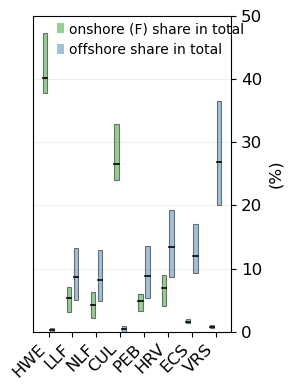

(<Figure size 300x400 with 1 Axes>, <AxesSubplot: ylabel='(%)'>)

In [158]:
# usage
plot_ratios_boxplot(df_shares_2, Scenario_order, Scenario_colors, ylim=(0, 50), yticks=[0, 10 ,20, 30 ,40, 50],
                   save_path='plots_forests/modelling/base/onshore_offshore_share_T.png')

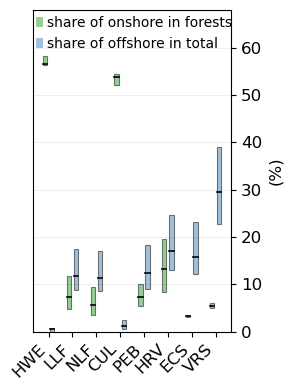

(<Figure size 300x400 with 1 Axes>, <AxesSubplot: ylabel='(%)'>)

In [525]:
# usage
plot_ratios_boxplot(df_shares_2, Scenario_order, Scenario_colors, ylim=(0, 68), yticks=[0, 10 ,20, 30 ,40, 50 ,60,],
                   save_path='plots_forests/modelling/samecost/wind_share.png')

In [249]:
(cap_solarminus_filtered.query("transmission == 'DefaultYes' and technology == 'Windonshore_OF' and forest_excls=='NLF' ")
         .reset_index().sort_values('buffer')['gencaptot'].max())

42.55849900859998

In [226]:
(cap_solarplus_filtered.query("transmission == 'DefaultYes' and technology == 'Windonshore_F' and forest_excls=='NLF' ")
         .reset_index().sort_values('buffer'))

,transmission,forest_excls,buffer,varnewpcapQ,technology,gencaptot
8,DefaultYes,NLF,0,OPT,Windonshore_F,2.882656
0,DefaultYes,NLF,100,OPT,Windonshore_F,0.423889
2,DefaultYes,NLF,1000,OPT,Windonshore_F,1.205284
3,DefaultYes,NLF,1500,OPT,Windonshore_F,0.844440
4,DefaultYes,NLF,200,OPT,Windonshore_F,2.871239
12,DefaultYes,NLF,2000,OPT,Windonshore_F,0.425070
11,DefaultYes,NLF,2500,OPT,Windonshore_F,0.608322
6,DefaultYes,NLF,300,OPT,Windonshore_F,3.119008
13,DefaultYes,NLF,3000,OPT,Windonshore_F,0.422002
9,DefaultYes,NLF,400,OPT,Windonshore_F,2.603348


In [180]:
def plot_forest_foregone_vs_cost(df_lcoe_all, df_shares, scenario_order,
                                  scenario_colors, base_scenario='HWE',
                                  buffer_val=0, trans_type='DefaultYes',
                                  configs=None, config_markers=None,
                                  xlabel="Forest wind foregone",
                                  ylabel="Change in LCOE (%)",
                                  xlim=None, ylim=None, yticks=None, xticks=None,
                                  save_path=None):
    if configs is None:
        configs = ['S13', 'S30', 'S40']
    if config_markers is None:
        config_markers = {'S13': 'o', 'S30': 's', 'S40': '^'}

    
    # get HWE forest capacity per config
    hwe_forest = df_shares[(df_shares['scenario'] == base_scenario) & 
                            (df_shares['buffer'] == buffer_val) &
                            (df_shares['config'].isin(configs))].set_index('config')['cap_F'].to_dict()
    
    # get forest foregone and cost for each scenario-config
    df_cost = df_lcoe_all[(df_lcoe_all['buffer'] == buffer_val) & 
                           (df_lcoe_all['transmission'] == trans_type) &
                           (df_lcoe_all['config'].isin(configs))].copy()
    
    df_cap = df_shares[(df_shares['buffer'] == buffer_val) & 
                        (df_shares['config'].isin(configs))].copy()
    
    df_merged = pd.merge(df_cost[['forest_excls', 'config', 'pct_change_from_hwe']],
                          df_cap[['scenario', 'config', 'cap_F']],
                          left_on=['forest_excls', 'config'],
                          right_on=['scenario', 'config'], how='inner')
    
    df_merged['forest_foregone'] = df_merged['config'].map(hwe_forest) - df_merged['cap_F']
    
    scenarios_present = [s for s in scenario_order if s in df_merged['forest_excls'].unique()]
    
    fig, ax = plt.subplots(figsize=(4, 4))

    
    for scen in scenarios_present:
        for config, marker in config_markers.items():
            row = df_merged[(df_merged['forest_excls'] == scen) & 
                             (df_merged['config'] == config)]
            if len(row) == 0:
                continue
            ax.scatter(row['forest_foregone'], row['pct_change_from_hwe'],
                       color=scenario_colors.get(scen, '#999999'),
                       #color="grey",
                       marker=marker, s=40, zorder=3,
                       edgecolor='black', linewidth=0)
    
    
    # # scenario legend
    legend_scen = [plt.Line2D([0], [0], marker='o', color='w', markersize=6,
                                markerfacecolor=scenario_colors.get(s, '#999999'),
                                markeredgecolor='black', markeredgewidth=0,
                                label=s) for s in scenarios_present]
    # # config legend
    # legend_config = [plt.Line2D([0], [0], marker=m, color='w', markersize=6,
    #                              markerfacecolor='grey', markeredgecolor='black',
    #                              markeredgewidth=0.5, label=c)
    #                   for c, m in config_markers.items()]
    
    ax.legend(handles=legend_scen, fontsize=10, ncol=3, columnspacing=0.8,
               loc='upper left', frameon=False, handletextpad=0.3, handlelength=0.5)
    
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    if yticks:
        ax.set_yticks(yticks)
    if xticks:
        ax.set_xticks(xticks)
    #ax.tick_params(axis='y', length=0) 
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda y, pos: f"{y:.0f}%"))
    ax.grid(True, alpha=0.3, linewidth=0.4, zorder=0)
    #ax.spines['top'].set_visible(False)
    #ax.spines['right'].set_visible(False)
    #ax.spines['left'].set_visible(False)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax


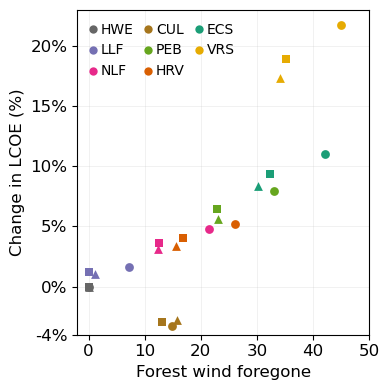

(<Figure size 400x400 with 1 Axes>,
 <AxesSubplot: xlabel='Forest wind foregone', ylabel='Change in LCOE (%)'>)

In [181]:
# usage
plot_forest_foregone_vs_cost(df_lcoe_all_2, df_shares_2, Scenario_order,
                              Scenario_colors, xlim=(-2, 50), ylim=(-4, 23),
                             yticks=[-4, 0, 5 ,10, 15 ,20],
                             xticks= [0, 10, 20, 30, 40, 50],
                            save_path='plots_forests/modelling/samecost/forest_wind_foregone_2.png')

In [244]:
def plot_forest_substitution(df_shares, scenario_order, scenario_colors,
                              base_scenario='HWE', buffer_val=0,
                              configs=None, config_markers=None,
                              xlim=None, ylim=None,  yticks=None, xticks=None,
                             save_path=None):
    if configs is None:
        configs = ['S13', 'S30', 'S40']
    if config_markers is None:
        config_markers = {'S13': 'o', 'S30': 's', 'S40': '^'}
    
    # get HWE values per config
    hwe = df_shares[(df_shares['scenario'] == base_scenario) & 
                     (df_shares['buffer'] == buffer_val) &
                     (df_shares['config'].isin(configs))].copy()
    hwe_vals = hwe.set_index('config')[['cap_F', 'cap_OF', 'cap_offshore']].to_dict('index')
    
    # calculate foregone and gained
    df = df_shares[(df_shares['buffer'] == buffer_val) & 
                    (df_shares['config'].isin(configs))].copy()
    
    records = []
    for _, row in df.iterrows():
        config = row['config']
        if config not in hwe_vals:
            continue
        hwe_ref = hwe_vals[config]
        forest_foregone = hwe_ref['cap_F'] - row['cap_F']
        of_gained = row['cap_OF'] - hwe_ref['cap_OF']
        offshore_gained = row['cap_offshore'] - hwe_ref['cap_offshore']
        total_gained = max(of_gained, 0) + max(offshore_gained, 0)
        #total_gained = of_gained + offshore_gained
        
        
        records.append({
            'scenario': row['scenario'],
            'config': config,
            'forest_foregone': forest_foregone,
            'of_gained': of_gained,
            'offshore_gained': offshore_gained,
            'total_gained': total_gained,
        })
    
    df_plot = pd.DataFrame(records)
    scenarios_present = [s for s in scenario_order if s in df_plot['scenario'].unique()]
    
    fig, ax = plt.subplots(figsize=(4, 4))
    
    # 1:1 diagonal
    max_val = 50
    ax.plot([0, max_val], [0, max_val], color='grey', linestyle='--',
            linewidth=1, alpha=0.5, zorder=1, label='1:1 (full substitution)')
    
    # scatter on top
    for scen in scenarios_present:
        for config, marker in config_markers.items():
            row = df_plot[(df_plot['scenario'] == scen) & 
                           (df_plot['config'] == config)]
            if len(row) == 0:
                continue
            ax.scatter(row['forest_foregone'], row['total_gained'],
                       color=scenario_colors.get(scen, '#999999'),
                       marker=marker, s=40, zorder=3,
                       edgecolor='black', linewidth=0)
    
    # # legends
    # legend_scen = [plt.Line2D([0], [0], marker='o', color='w', markersize=6,
    #                            markerfacecolor=scenario_colors.get(s, '#999999'),
    #                            markeredgecolor='black', markeredgewidth=0.5,
    #                            label=s) for s in scenarios_present]
    # legend_config = [plt.Line2D([0], [0], marker=m, color='w', markersize=6,
    #                              markerfacecolor='grey', markeredgecolor='black',
    #                              markeredgewidth=0.5, label=c)
    #                   for c, m in config_markers.items()]
    # legend_diag = [plt.Line2D([0], [0], color='grey', linestyle='--',
    #                            linewidth=0.8, label='1:1')]
    
    # ax.legend(handles=legend_diag + legend_scen + legend_config, fontsize=7,
    #           ncol=3, loc='upper left', frameon=False, handletextpad=0.3)
    
    ax.set_xlabel('Forest wind foregone (GW)', fontsize=12)
    ax.set_ylabel('Non-forest wind added (GW)', fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    if yticks:
        ax.set_yticks(yticks)
    if xticks:
        ax.set_xticks(xticks)
    ax.grid(True, alpha=0.3, linewidth=0.5, zorder=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_aspect('equal', adjustable='box')
    ax.tick_params(axis='both', length=0, width=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax


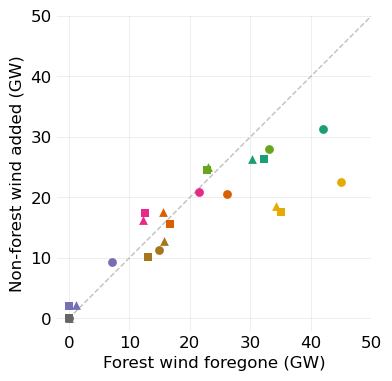

(<Figure size 400x400 with 1 Axes>,
 <AxesSubplot: xlabel='Forest wind foregone (GW)', ylabel='Non-forest wind added (GW)'>)

In [245]:
# usage
plot_forest_substitution(df_shares_2, Scenario_order, Scenario_colors,
                          xlim=(-2, 50), ylim=(-2, 50),
                        yticks=[0, 10, 20, 30, 40, 50],
                        xticks= [0, 10, 20, 30, 40, 50],
                            save_path='plots_forests/modelling/samecost/foregoneVSgain_3.png')

# Storage

In [261]:
storetot = makenice(found_scenarios, "storage_ecap")

  0%|          | 0/16 [00:00<?, ?it/s]

In [427]:
storetot_solarplus = makenice(found_scenarios_cap2areaplus, "storage_ecap")

  0%|          | 0/184 [00:00<?, ?it/s]

In [526]:
storetot_costs = makenice(found_scenarios_cap2area_costs, "storage_ecap")

  0%|          | 0/736 [00:00<?, ?it/s]

In [19]:
storetot_base = makenice(found_scenarios_base, "storage_ecap")

  0%|          | 0/736 [00:00<?, ?it/s]

In [430]:
storetot_solarminus = storetot_solarminus.loc[level_slice]
storetot_solarplus = storetot_solarplus.loc[level_slice]
storetot_S2S3 = storetot_S2S3.loc[level_slice]
storetot_costs = storetot_costs.loc[level_slice]

In [159]:
storetot_base = storetot_base.loc[level_slice]

In [431]:
storetot_solarminus

storeecaptot
transmission forest_excls buffer varnewpcapQ technology               
DefaultYes   PEB          300    OPT         Li-ion-8        27.183646
                                             PumpedHydro    399.391000
             HRV          3000   OPT         Li-ion-8        32.194405
                                             PumpedHydro    399.391000
LOWOH        LLF          100    OPT         Li-ion-8        25.237012
...                                                                ...
DefaultYes   PEB          400    OPT         PumpedHydro    399.391000
                          800    OPT         Li-ion-8        27.490051
                                             PumpedHydro    399.391000
LOWOH        PEB          1000   OPT         Li-ion-8        29.553040
                                             PumpedHydro    399.391000

[368 rows x 1 columns]

In [432]:
storetot_solarminus = storetot_solarminus.query("technology == 'Li-ion-8'")
storetot_solarplus = storetot_solarplus.query("technology == 'Li-ion-8'")
storetot_S2S3 = storetot_S2S3.query("technology == 'Li-ion-8'")
storetot_costs = storetot_costs.query("technology == 'Li-ion-8'")

In [160]:
storetot_base = storetot_base.query("technology == 'Li-ion-8'")
storetot_base

storeecaptot
transmission forest_excls buffer varnewpcapQ technology              
DefaultYes   NLF          300    S1          Li-ion-8       33.510185
LOWOH        PEB          900    S3          Li-ion-8       31.243041
             NLF          0      S4          Li-ion-8       35.248739
DefaultYes   PEB          0      S4          Li-ion-8       44.886560
             NLF          300    S3          Li-ion-8       38.056873
...                                                               ...
             PEB          1000   S2          Li-ion-8       34.038984
             LLF          100    S2          Li-ion-8       36.677972
             ECS          500    S1          Li-ion-8       26.499754
             PEB          500    S4          Li-ion-8       41.975279
LOWOH        ECS          0      S4          Li-ion-8       35.332586

[736 rows x 1 columns]

In [161]:
df_shares_2

,scenario,buffer,config,cap_F,cap_OF,cap_offshore,total_cap,f_share,offshore_share_pct
0,CUL,0,S13,30.684128,22.543222,0.495716,66.723065,57.647296,0.742945
1,ECS,0,S13,3.461600,32.578709,10.532820,59.573129,9.604802,17.680488
2,ECS,100,S13,2.012240,32.669359,11.199634,58.881233,5.802040,19.020719
3,ECS,200,S13,1.718240,32.289861,11.512857,58.520959,5.052443,19.673050
4,ECS,300,S13,1.531760,31.771886,11.804162,58.107808,4.599377,20.314245
...,...,...,...,...,...,...,...,...,...
731,VRS,1000,S40+,0.458480,10.334840,16.102070,66.895390,4.247813,24.070523
732,VRS,1500,S40+,0.452000,9.038120,16.693878,66.183998,4.762848,25.223436
733,VRS,2000,S40+,0.445520,8.116280,17.176582,65.738382,5.203579,26.128696
734,VRS,2500,S40+,0.438800,7.425320,17.964214,65.828334,5.579773,27.289486


In [162]:
def calc_storage_national(storetot_minus, storetot_plus, storetot_S2S3, storetot_costs):
    """
    Calculate national storage capacity across all configs.
    Returns dataframe with scenario, buffer, config, storage_gwh.
    """
    # configs = [
    #     (storetot_minus, 'DefaultYes', 'OPT', 'S13-Fix'),
    #     (storetot_minus, 'LOWOH', 'OPT', 'S13-Exp'),
    #     (storetot_plus, 'DefaultYes', 'OPT', 'S∞-Fix'),
    #     (storetot_plus, 'LOWOH', 'OPT', 'S∞-Exp'),
    #     (storetot_S2S3, 'DefaultYes', 'S2', 'S30-Fix'),
    #     (storetot_S2S3, 'LOWOH', 'S2', 'S30-Exp'),
    #     (storetot_S2S3, 'DefaultYes', 'S3', 'S40-Fix'),
    #     (storetot_S2S3, 'LOWOH', 'S3', 'S40-Exp'),
    # ]
    config_map2 = [
        (storetot_costs, 'DefaultYes', 'S1', 'S13'),
        (storetot_costs, 'LOWOH', 'S1', 'S13+'),
        (storetot_costs, 'DefaultYes', 'S4', 'S+'),
        (storetot_costs, 'LOWOH', 'S4', 'S++'),
        (storetot_costs, 'DefaultYes', 'S2', 'S30'),
        (storetot_costs, 'LOWOH', 'S2', 'S30+'),
        (storetot_costs, 'DefaultYes', 'S3', 'S40'),
        (storetot_costs, 'LOWOH', 'S3', 'S40+'),
    ]
    
    all_records = []
    
    for data, trans_type, vnp, label in config_map2:
        df = data.query("transmission == @trans_type & varnewpcapQ == @vnp").reset_index()
        df = df[['forest_excls', 'buffer', 'storeecaptot']]
        df['buffer'] = df['buffer'].astype(int)
        
        # sum across zones/technologies to get national total
        df_nat = df.groupby(['forest_excls', 'buffer']).agg(
            storage_gwh=('storeecaptot', 'sum')
        ).reset_index()
        
        df_nat['config'] = label
        all_records.append(df_nat)
    
    df_storage = pd.concat(all_records, ignore_index=True)
    df_storage = df_storage.rename(columns={'forest_excls': 'scenario'})
    
    return df_storage


In [163]:
# usage
df_storage_2 = calc_storage_national(None, None, None, storetot_base)

In [561]:
# usage
df_storage_2 = calc_storage_national(storetot_solarminus, storetot_solarplus, storetot_S2S3, storetot_costs)

In [447]:
# usage
df_storage = calc_storage_national(storetot_solarminus, storetot_solarplus, storetot_S2S3)

# quick check
print(df_storage[df_storage['buffer'] == 0][['scenario', 'config', 'storage_gwh']].round(2).head(16))

    scenario   config  storage_gwh
0        CUL  S13-Fix        25.96
1        ECS  S13-Fix        26.83
16       HRV  S13-Fix        28.22
31       HWE  S13-Fix        35.26
32       LLF  S13-Fix        33.65
47       NLF  S13-Fix        33.03
62       PEB  S13-Fix        31.07
77       VRS  S13-Fix        23.22
92       CUL  S13-Exp        26.73
93       ECS  S13-Exp        32.92
108      HRV  S13-Exp        32.97
123      HWE  S13-Exp        24.41
124      LLF  S13-Exp        24.91
139      NLF  S13-Exp        25.81
154      PEB  S13-Exp        26.03
169      VRS  S13-Exp        35.35


In [171]:
def plot_storage_scatter(df_storage, df_shares, scenario_order, scenario_colors,
                          config_styles=None, xlabel='Onshore wind capacity (GW)',
                          ylabel='storage (GWh)',
                          xlim=None, ylim=None, yticks=None, save_path=None):
    if config_styles is None:
        # config_styles = {
        #     'S13-Fix': {'edgecolor': 'black', 'linewidth': 1},
        #     'S13-Exp': {'edgecolor': 'grey', 'linewidth': 0},
        #     'S30-Fix': {'edgecolor': 'black', 'linewidth': 1},
        #     'S30-Exp': {'edgecolor': 'grey', 'linewidth': 0},
        #     'S40-Fix': {'edgecolor': 'black', 'linewidth': 1},
        #     'S40-Exp': {'edgecolor': 'grey', 'linewidth': 0},
        #     'S∞-Fix':  {'edgecolor': 'black', 'linewidth': 1},
        #     'S∞-Exp':  {'edgecolor': 'grey', 'linewidth': 0},
        # }
        config_styles = {
            'S13': {'edgecolor': 'black', 'linewidth': 1},
            'S13+': {'edgecolor': 'grey', 'linewidth': 0},
            'S30': {'edgecolor': 'black', 'linewidth': 1},
            'S30+': {'edgecolor': 'grey', 'linewidth': 0},
            'S40': {'edgecolor': 'black', 'linewidth': 1},
            'S40+': {'edgecolor': 'grey', 'linewidth': 0},
            'S+':  {'edgecolor': 'black', 'linewidth': 1},
            'S++':  {'edgecolor': 'grey', 'linewidth': 0},
        }
    
    # prepare onshore capacity from df_shares
    df_x = df_shares.copy()
    df_x['total_onshore'] = df_x['cap_F'] + df_x['cap_OF']
    
    # merge storage with onshore capacity
    df_merged = pd.merge(df_storage, df_x[['scenario', 'buffer', 'config', 'total_onshore']],
                          on=['scenario', 'buffer', 'config'], how='inner')
    
    scenarios_present = [s for s in scenario_order if s in df_merged['scenario'].unique()]
    
    fig, ax = plt.subplots(figsize=(5, 3.5))
    
    for scen in scenarios_present:
        for config, style in config_styles.items():
            subset = df_merged[(df_merged['scenario'] == scen) &
                                (df_merged['config'] == config)]
            if len(subset) == 0:
                continue
            size = 10 + (subset['buffer'] / 3000) * 30
            ax.scatter(subset['total_onshore'], subset['storage_gwh'],
                       color=scenario_colors.get(scen, '#999999'),
                       s=size, alpha=0.8, zorder=3,
                       edgecolor=style['edgecolor'],
                       linewidth=style['linewidth'])
    
    # solar milestone lines
    solar_groups = {
        'S13': (['S13', 'S13+'], '#8B4513'),
        'S40': (['S40', 'S40+'], '#DAA520'),
    }
    for solar_label, (config_list, color) in solar_groups.items():
        mean_storage = df_merged[df_merged['config'].isin(config_list)]['storage_gwh'].mean()
        ax.axhline(y=mean_storage, color=color, linestyle='--', linewidth=1, alpha=0.7, zorder=1)
    
    # scenario legend
    #legend_scen = [plt.Line2D([0], [0], marker='o', color='w', markersize=6,
    #                           markerfacecolor=scenario_colors.get(s, '#999999'),
    #                           markeredgecolor='black', markeredgewidth=0.5,
    #                           label=s) for s in scenarios_present]
    #legend_trans = [
    #    plt.Line2D([0], [0], marker='o', color='w', markersize=6,
    #                markerfacecolor='grey', markeredgecolor='black',
    #                markeredgewidth=1.0, label='Fixed trans.'),
    #    plt.Line2D([0], [0], marker='o', color='w', markersize=6,
    #                markerfacecolor='grey', markeredgecolor='grey',
    #                markeredgewidth=0.3, label='Expand. trans.'),
    #]
    #ax.legend(handles=legend_scen + legend_trans, fontsize=8, ncol=3,
    #          loc='upper right', frameon=False, handletextpad=0.3)
    
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    if yticks:
        ax.set_yticks(yticks)
    ax.grid(True, alpha=0.3, linewidth=0.5, zorder=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')#, transparent=True)
    plt.show()
    return fig, ax



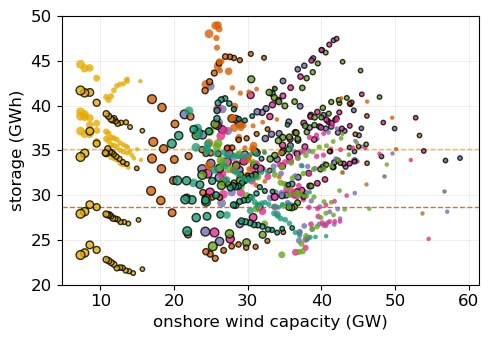

(<Figure size 500x350 with 1 Axes>,
 <AxesSubplot: xlabel='onshore wind capacity (GW)', ylabel='storage (GWh)'>)

In [172]:
# usage
plot_storage_scatter(df_storage_2, df_shares_2, Scenario_order, Scenario_colors,
                      xlabel='onshore wind capacity (GW)',
                      ylim=(20, 50), yticks= [20, 25, 30, 35, 40 ,45, 50],
                     save_path='plots_forests/modelling/base/storage_vs_onshore.png')

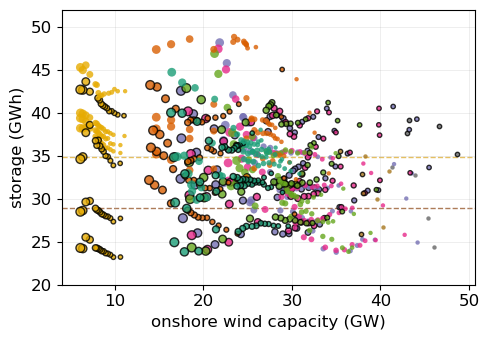

(<Figure size 500x350 with 1 Axes>,
 <AxesSubplot: xlabel='onshore wind capacity (GW)', ylabel='storage (GWh)'>)

In [458]:
# usage
plot_storage_scatter(df_storage, df_shares, Scenario_order, Scenario_colors,
                      xlabel='onshore wind capacity (GW)',
                      ylim=(20, 52), yticks= [20, 25, 30, 35, 40 ,45, 50],
                     save_path='plots_forests/modelling/storage/storage_vs_onshore.png')

# Norway Map

In [204]:
shapefile = shpreader.natural_earth(resolution='10m',
                                      category='cultural',
                                      name='admin_1_states_provinces')
world = gpd.read_file(shapefile)
Norway = world[world.iso_a2=="NO"]
Norway = Norway[["iso_3166_2","name","geometry"]]
Norway = Norway.set_index('iso_3166_2').drop(['NO-21', 'NO-X01~'])
#Norway.plot()


/tmp/ipykernel_2983178/2514718811.py:8: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  Nordland = gpd.GeoDataFrame([{'name':'Nordland', 'geometry':Norway.loc[['NO-18']].explode().drop(('NO-18',25)).unary_union}], index=['NO-71'])


<AxesSubplot: >

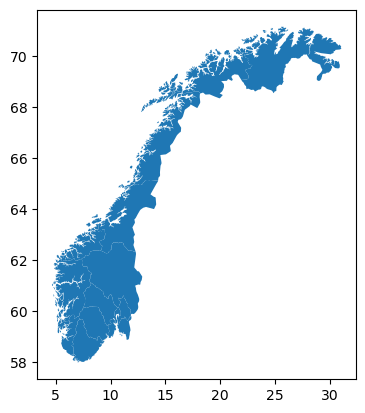

In [205]:
Trøndelag = gpd.GeoDataFrame([{'name':'Trøndelag', 'geometry':Norway.loc[['NO-17', 'NO-16']].unary_union}], index=['NO-60'])
#TromsFinnmark = gpd.GeoDataFrame([{'name':'Troms og Finnmark', 'geometry':Norway.loc[['NO-19', 'NO-20']].unary_union}], index=['NO-54'])
Vestland = gpd.GeoDataFrame([{'name':'Vestland', 'geometry':Norway.loc[['NO-12', 'NO-14']].unary_union}], index=['NO-A2'])
#Viken = gpd.GeoDataFrame([{'name':'Viken', 'geometry':Norway.loc[['NO-02', 'NO-06', 'NO-01']].unary_union}], index=['NO-30'])
Innlandet = gpd.GeoDataFrame([{'name':'Innlandet', 'geometry':Norway.loc[['NO-04', 'NO-05']].unary_union}], index=['NO-73'])
#VestfoldTelemark = gpd.GeoDataFrame([{'name':'Vestfold og Telemark', 'geometry':Norway.loc[['NO-07', 'NO-08']].unary_union}], index=['NO-38'])
Agder = gpd.GeoDataFrame([{'name':'Agder', 'geometry':Norway.loc[['NO-09', 'NO-10']].unary_union}], index=['NO-92'])
Nordland = gpd.GeoDataFrame([{'name':'Nordland', 'geometry':Norway.loc[['NO-18']].explode().drop(('NO-18',25)).unary_union}], index=['NO-71'])

Norway = Norway.drop(['NO-17', 'NO-16', 'NO-12', 'NO-14', 'NO-04', 'NO-05', 'NO-09', 'NO-10', 'NO-18'])
Norway = pd.concat([Norway, Trøndelag.set_crs(Norway.crs),
                    Vestland.set_crs(Norway.crs),Innlandet.set_crs(Norway.crs),
                    Agder.set_crs(Norway.crs), Nordland.set_crs(Norway.crs)])
Norway = Norway.sort_index()
Norway.plot()



(3.322150098550088, 32.398655632450065, 57.33454417495004, 71.82387523005004)

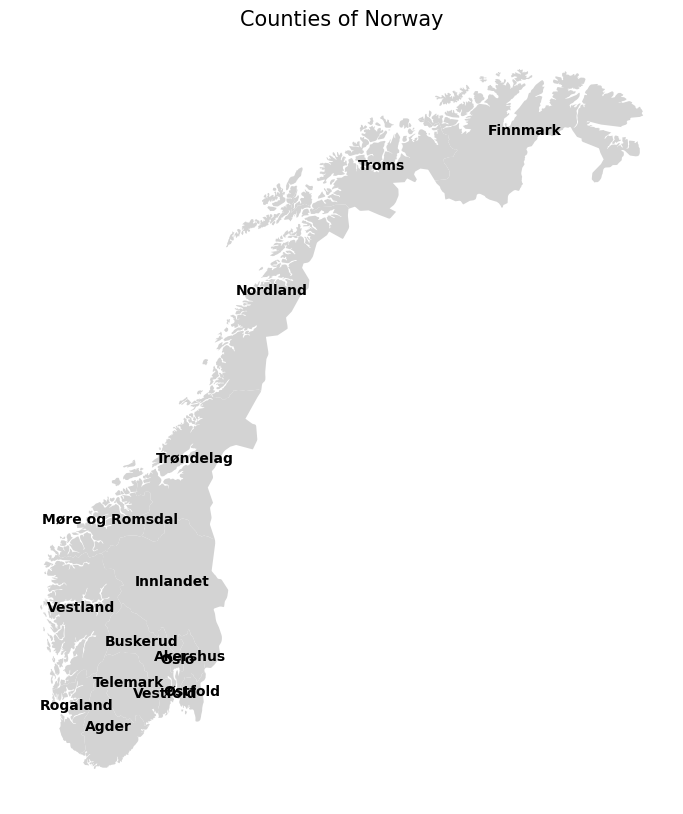

In [206]:
fig, ax = plt.subplots(figsize=(10, 10))
Norway.plot(ax=ax, color='lightgrey')

# Annotate county names
for _, row in Norway.iterrows():
    # Get the centroid of each geometry
    centroid = row.geometry.centroid
    # Annotate with the county name
    ax.annotate(row['name'], xy=(centroid.x, centroid.y), 
                horizontalalignment='center', fontsize=10, fontweight='bold', color='black')

# Additional plot customization if needed
ax.set_title('Counties of Norway', fontsize=15)
plt.axis('off')  # Optionally hide the axis

In [207]:
replacements = {
    'NO001': 'NO083', # Østfold
    'NO002': 'NO084', # Akershus
    'NO003': 'NO081', # Oslo
    'NO006': 'NO085', # Buskerud
    'NO007': 'NO093', #Vestfold
    'NO008': 'NO094', # Telemark
    'NO011': 'NO0A1', # Rogaland
    'NO015': 'NO0A3', # Møre og Romsdal 	
    'NO019': 'NO072', # Troms
    'NO020': 'NO073', # Finmark
    'NO073': 'NO020', # Innlandet
    'NO060': 'NO060', # Trøndelag
    'NO071': 'NO071', # Nordland
    'NO092': 'NO092', # Agder
    'NO0A2': 'NO0A2', # Vestland
}
Norway.index = Norway.index.str.replace('-', '0')
Norway.index = Norway.index.to_series().replace(replacements)

Norway = Norway.sort_index()
Norway


,name,geometry
NO020,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852..."
NO060,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62..."
NO071,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65..."
NO072,Troms,"MULTIPOLYGON (((20.62316 69.03636, 20.36272 69..."
NO073,Finnmark,"MULTIPOLYGON (((28.95408 69.02726, 28.83961 69..."
NO081,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017..."
NO083,Østfold,"MULTIPOLYGON (((11.88374 59.80538, 11.88980 59..."
NO084,Akershus,"POLYGON ((11.87463 59.88494, 11.84959 59.87242..."
NO085,Buskerud,"POLYGON ((10.48666 59.80317, 10.48455 59.78864..."
NO092,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ..."


In [21]:

existing_hydro_ecap = {
    'NO0A1': (325), 'NO0A2': (65.4), 'NO0A3': (0),
    'NO020': (0), 'NO060': (8.98), 'NO071': (0),
    'NO072': (0), 'NO073': (0), 'NO081': (0),
    'NO083': (0), 'NO084': (0), 'NO085': (0),
    'NO092': (0), 'NO093': (0), 'NO094': (0),
}
Norway['existing_hydro_ecap'] = Norway.index.map(lambda x: existing_hydro_ecap.get(x, None))
Norway


,name,geometry,existing_hydro_ecap
NO020,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852...",0.00
NO060,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62...",8.98
NO071,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65...",0.00
NO072,Troms,"MULTIPOLYGON (((20.62316 69.03636, 20.36272 69...",0.00
NO073,Finnmark,"MULTIPOLYGON (((28.95408 69.02726, 28.83961 69...",0.00
NO081,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017...",0.00
NO083,Østfold,"MULTIPOLYGON (((11.88374 59.80538, 11.88980 59...",0.00
NO084,Akershus,"POLYGON ((11.87463 59.88494, 11.84959 59.87242...",0.00
NO085,Buskerud,"POLYGON ((10.48666 59.80317, 10.48455 59.78864...",0.00
NO092,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ...",0.00


# OF/F Areas

In [199]:
import rasterio

In [200]:
nuts_to_county = {
     'NO083': 'Østfold',
     'NO084': 'Akershus',
    'NO081':  'Oslo',
    'NO085': 'Buskerud',
    'NO093': 'Vestfold',
    'NO094': 'Telemark',
    'NO0A1': 'Rogaland',
    'NO0A3': 'Møre og Romsdal', 	
    'NO072': 'Troms',
    'NO073': 'Finmark',
    'NO020': 'Innlandet',
    'NO060': 'Trøndelag',
    'NO071': 'Nordland',
    'NO092': 'Agder',
    'NO0A2': 'Vestland',
}

In [201]:
with rasterio.open('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/geonorge/ExclusionsTry/corine.tif') as src_CORINE:
    # Read the data
    data_CORINE = src_CORINE.read(1)  # Reads the first band of the image
    meta_CORINE = src_CORINE.meta.copy()
    transform = src_CORINE.transform
    crs_raster = src_CORINE.crs


In [202]:
meta_CORINE

{'driver': 'GTiff',
 'dtype': 'int8',
 'nodata': -128.0,
 'width': 65000,
 'height': 46000,
 'count': 1,
 'crs': CRS.from_wkt('PROJCS["ETRS89-extended / LAEA Europe",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101004,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Lambert_Azimuthal_Equal_Area"],PARAMETER["latitude_of_center",52],PARAMETER["longitude_of_center",10],PARAMETER["false_easting",4321000],PARAMETER["false_northing",3210000],UNIT["metre",1],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","3035"]]'),
 'transform': Affine(100.0, 0.0, 900000.0,
        0.0, -100.0, 5500000.0)}

In [208]:
from rasterio.mask import mask as rasterio_mask
from shapely.geometry import mapping

FOREST_CODES = [23, 24, 25]

# ensure shapefile CRS matches raster CRS
norway_reproj = Norway.to_crs(crs_raster)

records = []

for idx, row in norway_reproj.iterrows():
    zone = idx  # or row.name depending on your index
    name = row['name']
    geom = [mapping(row.geometry)]
    
    # mask raster to county
    with rasterio.open('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/geonorge/ExclusionsTry/corine.tif') as src:
        out_image, out_transform = rasterio_mask(src, geom, crop=True, nodata=-128.0)
        pixel_data = out_image[0]
    
    # pixel resolution in meters
    pixel_x = abs(out_transform[0])
    pixel_y = abs(out_transform[4])
    pixel_area_km2 = (pixel_x * pixel_y) / 1e6
    
    # count forest pixels
    forest_pixels = np.isin(pixel_data, FOREST_CODES).sum()
    forest_area_km2 = forest_pixels * pixel_area_km2
    
    # count all valid (non-nodata) pixels for total county area from raster
    valid_pixels = (pixel_data > 0).sum()
    total_area_km2 = valid_pixels * pixel_area_km2
    
    non_forest_area_km2 = total_area_km2 - forest_area_km2
    
    records.append({
        'zone': zone,
        'name': name,
        'total_area_km2': total_area_km2,
        'forest_area_km2': forest_area_km2,
        'non_forest_area_km2': non_forest_area_km2,
        'forest_pct': forest_area_km2 / total_area_km2 * 100 if total_area_km2 > 0 else 0,
    })

df_forest_area = pd.DataFrame(records)


In [209]:
print(df_forest_area[['zone', 'name', 'total_area_km2', 'forest_area_km2', 'non_forest_area_km2', 'forest_pct']].to_string(index=False))

 zone            name  total_area_km2  forest_area_km2  non_forest_area_km2  forest_pct
NO020       Innlandet        52412.21         21317.63             31094.58   40.673023
NO060       Trøndelag        40635.93         11878.85             28757.08   29.232381
NO071        Nordland        36855.83          8872.89             27982.94   24.074590
NO072           Troms        25719.00          6133.21             19585.79   23.847000
NO073        Finnmark        48242.90         11930.36             36312.54   24.729774
NO081            Oslo          783.00           455.62               327.38   58.189017
NO083         Østfold         4179.80          2393.68              1786.12   57.267812
NO084        Akershus         4597.62          2516.32              2081.30   54.730926
NO085        Buskerud        15168.96          7309.62              7859.34   48.188010
NO092           Agder        16704.56          8708.80              7995.76   52.134268
NO093        Vestfold         21

In [210]:
df_forest_area

,zone,name,total_area_km2,forest_area_km2,non_forest_area_km2,forest_pct
0,NO020,Innlandet,52412.21,21317.63,31094.58,40.673023
1,NO060,Trøndelag,40635.93,11878.85,28757.08,29.232381
2,NO071,Nordland,36855.83,8872.89,27982.94,24.074590
3,NO072,Troms,25719.00,6133.21,19585.79,23.847000
4,NO073,Finnmark,48242.90,11930.36,36312.54,24.729774
5,NO081,Oslo,783.00,455.62,327.38,58.189017
6,NO083,Østfold,4179.80,2393.68,1786.12,57.267812
7,NO084,Akershus,4597.62,2516.32,2081.30,54.730926
8,NO085,Buskerud,15168.96,7309.62,7859.34,48.188010
9,NO092,Agder,16704.56,8708.80,7995.76,52.134268


# Capacity potential analysis

In [141]:
area_solarplus = makenice(found_scenarios_cap2areaplus, "area")

  0%|          | 0/184 [00:00<?, ?it/s]

In [20]:
area_base = makenice(found_scenarios_base, "area")

  0%|          | 0/736 [00:00<?, ?it/s]

In [193]:
captotz_base = makenice(found_scenarios_base, "cap_z")

  0%|          | 0/736 [00:00<?, ?it/s]

In [469]:
VREcurtailed_costs = makenice(found_scenarios_cap2area_costs, "VREcurtailed")

  0%|          | 0/736 [00:00<?, ?it/s]

In [22]:
VREcurtailed_base = makenice(found_scenarios_base, "VREcurtailed")

  0%|          | 0/736 [00:00<?, ?it/s]

In [527]:
var_gen_costs = makenice(found_scenarios_cap2area_costs, "gen")

  0%|          | 0/736 [00:00<?, ?it/s]

In [23]:
var_gen_base = makenice(found_scenarios_base, "gen")

  0%|          | 0/736 [00:00<?, ?it/s]

In [184]:
VREcurtailed_base_filtered = (VREcurtailed_base.loc[(slice(None), slice(None),slice(None),slice(None),slice(None),slice(None),
        ['Solar','Windonshore_F', 'Windonshore_OF'],
                    slice(None))].droplevel(["region"])
         .groupby(["transmission", "forest_excls", "buffer", "varnewpcapQ", "zone", "technology"]).sum())

In [185]:
var_gen_base_filtered = (var_gen_base.loc[(slice(None), slice(None),slice(None),slice(None),slice(None),slice(None),
        ['Solar','Windonshore_F', 'Windonshore_OF'], 'level')].droplevel(["level_3"])
         .groupby(["transmission", "forest_excls", "buffer", "varnewpcapQ", "zone", "technology"]).sum())

In [189]:
area_base = area_base.loc[(slice(None), slice(None),slice(None),slice(None),
        ['Solar','Windonshore_F', 'Windonshore_OF', 'Windoffshore', 'Windoffshorefloating' ],
                    slice(None), slice(None))]#.droplevel(["region"])

In [194]:
captotz_base = captotz_base.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
                                ['Solar','Windonshore_F', 'Windonshore_OF', 'Windoffshore','Windoffshorefloating'],
                                          'level')].droplevel(["level_2"])

In [195]:
area_base

value
transmission forest_excls buffer varnewpcapQ technology           zone           
DefaultYes   ECS          100    S1          Solar                NO020  233.6120
                                                                  NO060  175.0800
                                                                  NO071  100.9920
                                                                  NO072   24.3880
                                                                  NO081    0.5840
...                                                                           ...
LOWOH        VRS          2000   S3          Windoffshorefloating NO093   21.4445
                                                                  NO094    1.1010
                                                                  NO0A1  125.8555
                                                                  NO0A2   50.1555
                                                                  NO0A3  345.0775

[37488 rows x 1 columns]

In [196]:
captotz_base

gencap
transmission forest_excls buffer varnewpcapQ zone  technology                        
DefaultYes   ECS          100    S1          NO020 Solar                 4.322107e-08
                                             NO060 Solar                 1.304734e-07
                                             NO071 Solar                 1.579919e-08
                                             NO072 Solar                 1.330235e-08
                                             NO073 Solar                 0.000000e+00
...                                                                               ...
LOWOH        VRS          2000   S3          NO093 Windoffshorefloating  3.995478e-09
                                             NO094 Windoffshorefloating  2.337244e-09
                                             NO0A1 Windoffshorefloating  3.840382e-09
                                             NO0A2 Windoffshorefloating  3.044666e-09
                                             NO0A3 Windoffshorefloating  6.186902e-01

[55200 rows x 1 columns]

In [197]:
def calc_deployment_all(config_pairs, df_forest_area, buffer_val=0, capacity_density=2.4):
    """
    Calculate all deployment stats for both F and OF across all configurations.
    
    config_pairs: list of tuples (area_data, cap_data, trans_type, varnewpcap, label)
    Returns two dataframes: df_county_all, df_national_all with 'config' column.
    """
    total_forest_km2 = df_forest_area['forest_area_km2'].sum()
    total_non_forest_km2 = df_forest_area['non_forest_area_km2'].sum()
    
    forest_lookup = df_forest_area.set_index('zone')['forest_area_km2']
    non_forest_lookup = df_forest_area.set_index('zone')['non_forest_area_km2']
    
    all_county = []
    all_national = []
    
    for area_data, cap_data, transmission_type, varnewpcap, label in config_pairs:
        
        df_max_F = area_data.query("transmission == @transmission_type").reset_index()
        df_max_F = df_max_F[(df_max_F['technology'] == 'Windonshore_F') & 
                             (df_max_F['varnewpcapQ'] == varnewpcap)]
        df_max_F = df_max_F[['forest_excls', 'buffer', 'zone', 'value']]
        df_max_F['buffer'] = df_max_F['buffer'].astype(int)
        if buffer_val is not None:
            df_max_F = df_max_F[df_max_F['buffer'] == buffer_val]
        df_max_F = df_max_F.rename(columns={'value': 'max_cap_F'})
        
        df_max_OF = area_data.query("transmission == @transmission_type").reset_index()
        df_max_OF = df_max_OF[(df_max_OF['technology'] == 'Windonshore_OF') & 
                               (df_max_OF['varnewpcapQ'] == varnewpcap)]
        df_max_OF = df_max_OF[['forest_excls', 'buffer', 'zone', 'value']]
        df_max_OF['buffer'] = df_max_OF['buffer'].astype(int)
        if buffer_val is not None:
            df_max_OF = df_max_OF[df_max_OF['buffer'] == buffer_val]
        df_max_OF = df_max_OF.rename(columns={'value': 'max_cap_OF'})
        
        df_dep_F = cap_data.query("transmission == @transmission_type").reset_index()
        df_dep_F = df_dep_F[(df_dep_F['technology'] == 'Windonshore_F') & 
                             (df_dep_F['varnewpcapQ'] == varnewpcap)]
        df_dep_F = df_dep_F[['forest_excls', 'buffer', 'zone', 'gencap']]
        df_dep_F['buffer'] = df_dep_F['buffer'].astype(int)
        if buffer_val is not None:
            df_dep_F = df_dep_F[df_dep_F['buffer'] == buffer_val]
        df_dep_F = df_dep_F.rename(columns={'gencap': 'deployed_cap_F'})
        
        df_dep_OF = cap_data.query("transmission == @transmission_type").reset_index()
        df_dep_OF = df_dep_OF[(df_dep_OF['technology'] == 'Windonshore_OF') & 
                               (df_dep_OF['varnewpcapQ'] == varnewpcap)]
        df_dep_OF = df_dep_OF[['forest_excls', 'buffer', 'zone', 'gencap']]
        df_dep_OF['buffer'] = df_dep_OF['buffer'].astype(int)
        if buffer_val is not None:
            df_dep_OF = df_dep_OF[df_dep_OF['buffer'] == buffer_val]
        df_dep_OF = df_dep_OF.rename(columns={'gencap': 'deployed_cap_OF'})
        
        df = pd.merge(df_max_F, df_max_OF, on=['forest_excls', 'buffer', 'zone'], how='outer')
        df = pd.merge(df, df_dep_F, on=['forest_excls', 'buffer', 'zone'], how='outer')
        df = pd.merge(df, df_dep_OF, on=['forest_excls', 'buffer', 'zone'], how='outer')
        df = df.fillna(0)
        
        df['deployed_cap_F'] = df['deployed_cap_F'].clip(upper=df['max_cap_F'])
        df['deployed_cap_OF'] = df['deployed_cap_OF'].clip(upper=df['max_cap_OF'])
        
        df['available_km2_F'] = df['max_cap_F'] * 1000 / capacity_density
        df['deployed_km2_F'] = df['deployed_cap_F'] * 1000 / capacity_density
        df['available_km2_OF'] = df['max_cap_OF'] * 1000 / capacity_density
        df['deployed_km2_OF'] = df['deployed_cap_OF'] * 1000 / capacity_density
        
        df['county_forest_km2'] = df['zone'].map(forest_lookup).fillna(0)
        df['county_non_forest_km2'] = df['zone'].map(non_forest_lookup).fillna(0)
        
        df['occupancy_pct_F'] = np.where(df['county_forest_km2'] > 0,
                                          df['deployed_km2_F'] / df['county_forest_km2'] * 100, 0)
        df['occupancy_pct_OF'] = np.where(df['county_non_forest_km2'] > 0,
                                           df['deployed_km2_OF'] / df['county_non_forest_km2'] * 100, 0)
        
        df['available_pct_F'] = np.where(df['county_forest_km2'] > 0,
                                          df['available_km2_F'] / df['county_forest_km2'] * 100, 0)
        df['available_pct_OF'] = np.where(df['county_non_forest_km2'] > 0,
                                           df['available_km2_OF'] / df['county_non_forest_km2'] * 100, 0)
        
        df['total_onshore_cap'] = df['deployed_cap_F'] + df['deployed_cap_OF']
        df['onshore_F_share_pct'] = np.where(df['total_onshore_cap'] > 0,
                                              df['deployed_cap_F'] / df['total_onshore_cap'] * 100, 0)
        df['onshore_OF_share_pct'] = np.where(df['total_onshore_cap'] > 0,
                                               df['deployed_cap_OF'] / df['total_onshore_cap'] * 100, 0)
        
        df['config'] = label
        all_county.append(df.copy())
        
        # national level
        df_nat = df.groupby(['forest_excls', 'buffer']).agg(
            total_max_cap_F=('max_cap_F', 'sum'),
            total_deployed_cap_F=('deployed_cap_F', 'sum'),
            total_available_km2_F=('available_km2_F', 'sum'),
            total_deployed_km2_F=('deployed_km2_F', 'sum'),
            total_max_cap_OF=('max_cap_OF', 'sum'),
            total_deployed_cap_OF=('deployed_cap_OF', 'sum'),
            total_available_km2_OF=('available_km2_OF', 'sum'),
            total_deployed_km2_OF=('deployed_km2_OF', 'sum'),
        ).reset_index()
        
        df_nat['total_forest_km2'] = total_forest_km2
        df_nat['total_non_forest_km2'] = total_non_forest_km2
        df_nat['occupancy_pct_F'] = df_nat['total_deployed_km2_F'] / total_forest_km2 * 100
        df_nat['occupancy_pct_OF'] = df_nat['total_deployed_km2_OF'] / total_non_forest_km2 * 100
        df_nat['available_pct_F'] = df_nat['total_available_km2_F'] / total_forest_km2 * 100
        df_nat['available_pct_OF'] = df_nat['total_available_km2_OF'] / total_non_forest_km2 * 100
        df_nat['total_onshore_cap'] = df_nat['total_deployed_cap_F'] + df_nat['total_deployed_cap_OF']
        df_nat['onshore_F_share_pct'] = np.where(df_nat['total_onshore_cap'] > 0,
                                                    df_nat['total_deployed_cap_F'] / df_nat['total_onshore_cap'] * 100, 0)
        df_nat['onshore_OF_share_pct'] = np.where(df_nat['total_onshore_cap'] > 0,
                                                     df_nat['total_deployed_cap_OF'] / df_nat['total_onshore_cap'] * 100, 0)
        df_nat['config'] = label
        all_national.append(df_nat)
    
    df_county_all = pd.concat(all_county, ignore_index=True)
    df_national_all = pd.concat(all_national, ignore_index=True)
    
    return df_county_all, df_national_all


In [211]:
# usage — single call for all 8 configurations
config_pairs = [
    (area_base, captotz_base, 'DefaultYes', 'S1', 'S13'),
    (area_base, captotz_base, 'LOWOH', 'S1', 'S13+'),
    (area_base, captotz_base, 'DefaultYes', 'S4', 'S+'),
    (area_base, captotz_base, 'LOWOH', 'S4', 'S++'),
    (area_base, captotz_base, 'DefaultYes', 'S2', 'S30'),
    (area_base, captotz_base, 'LOWOH', 'S2', 'S30+'),
    (area_base, captotz_base, 'DefaultYes', 'S3', 'S40'),
    (area_base, captotz_base, 'LOWOH', 'S3', 'S40+'),
]


df_county_all, df_national_all = calc_deployment_all(config_pairs, df_forest_area, buffer_val=0)

In [ ]:
county_s3_low[(county_s3_low['forest_excls'] == "CUL") & (county_s3_low['zone'] == "NO093")]

In [213]:
def plot_deployment_ratio(df_national_all, scenario_order, ylim=None, save_path=None):
    """
    Plot occupied/available ratio for F and OF side by side per scenario.
    Range bars show variation across solar/transmission configurations.
    
    data_list: list of 4 national dataframes (one per configuration)
    """
    
    scenarios_present = [s for s in scenario_order if s in df_national_all['forest_excls'].values]
    
    fig, ax = plt.subplots(figsize=(3, 4))
    
    x_positions = np.arange(len(scenarios_present))
    offset = 0.1  # half gap between F and OF bars
    
    color_F = '#2ca02c'
    color_OF = '#a6761d'
    
    legend_added = False
    
    for i, scen in enumerate(scenarios_present):
        # collect F and OF ratios across configurations
        ratios_F = []
        ratios_OF = []
        
        for config in df_national_all['config'].unique():
            row = df_national_all[(df_national_all['forest_excls'] == scen) & 
                                   (df_national_all['config'] == config)]
            if len(row) > 0:
                avail_F = row['total_available_km2_F'].values[0]
                occ_F = row['total_deployed_km2_F'].values[0]
                avail_OF = row['total_available_km2_OF'].values[0]
                occ_OF = row['total_deployed_km2_OF'].values[0]
                
                ratio_F = (occ_F / avail_F * 100) if avail_F > 0 else 0
                ratio_OF = (occ_OF / avail_OF * 100) if avail_OF > 0 else 0
                
                ratios_F.append(ratio_F)
                ratios_OF.append(ratio_OF)
        
        # F bars (left)
        f_min, f_max, f_mean = min(ratios_F), max(ratios_F), np.mean(ratios_F)
        cap_width = 0.06
        
        ax.plot([i - offset, i - offset], [f_min, f_max],
                color=color_F, linewidth=1, zorder=3,
                label='forest' if not legend_added else None)
        ax.plot([i - offset - cap_width, i - offset + cap_width], [f_min, f_min],
                color=color_F, linewidth=1, zorder=3)
        ax.plot([i - offset - cap_width, i - offset + cap_width], [f_max, f_max],
                color=color_F, linewidth=1, zorder=3)
        ax.scatter(i - offset, f_mean, color=color_F, s=35, zorder=4,
                   edgecolor='black', linewidth=0)
        
        # OF bars (right)
        of_min, of_max, of_mean = min(ratios_OF), max(ratios_OF), np.mean(ratios_OF)
        
        ax.plot([i + offset, i + offset], [of_min, of_max],
                color=color_OF, linewidth=1, zorder=3,
                label='non-forest' if not legend_added else None)
        ax.plot([i + offset - cap_width, i + offset + cap_width], [of_min, of_min],
                color=color_OF, linewidth=1, zorder=3)
        ax.plot([i + offset - cap_width, i + offset + cap_width], [of_max, of_max],
                color=color_OF, linewidth=1, zorder=3)
        ax.scatter(i + offset, of_mean, color=color_OF, s=35, zorder=4,
                   edgecolor='black', linewidth=0)
        
        legend_added = True
    
    ax.set_xticks(x_positions)
    ax.set_xticklabels(scenarios_present, fontsize=11, rotation=45, ha='right')
    ax.set_ylabel('capacity potential used (%)', fontsize=11)
    ax.tick_params(axis='both', labelsize=11)
    if ylim:
        ax.set_ylim(ylim)
    ax.legend( loc='upper center', bbox_to_anchor=(0.23, 0.99), 
          borderaxespad=0., frameon=False, 
          fontsize=10, handlelength=0.5, handletextpad=0.5)
    ax.grid(True, axis='y', alpha=0.3, linewidth=0.4, zorder=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax


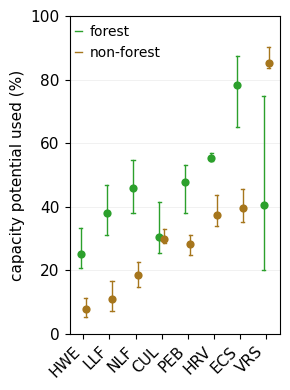

(<Figure size 300x400 with 1 Axes>,
 <AxesSubplot: ylabel='capacity potential used (%)'>)

In [214]:
# usage
plot_deployment_ratio(df_national_all,
    Scenario_order, ylim=(0, 100))#, save_path='plots_forests/modelling/base/capacity_potential_used_T.png')

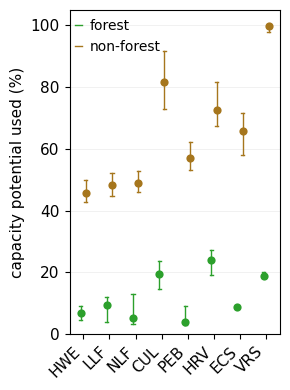

(<Figure size 300x400 with 1 Axes>,
 <AxesSubplot: ylabel='capacity potential used (%)'>)

In [273]:
# usage
plot_deployment_ratio(
    [national_sm_fix, national_sm_low, national_sp_fix, national_sp_low,
     national_s2_fix, national_s2_low, national_s3_fix, national_s3_low],
    Scenario_order, ylim=(0, 105))#, save_path='plots_forests/modelling/UR/Land_utilization_ratio_T.png')

In [54]:
def plot_three_metrics(df_national_all, scenario_order, ylim=None, yticks=None, save_path=None):

    scenarios_present = [s for s in scenario_order if s in df_national_all['forest_excls'].values]
    
    fig, ax = plt.subplots(figsize=(3, 4))
    
    x_positions = np.arange(len(scenarios_present))
    offsets = [-0.05, 0.05,]  # F occ, OF occ, F onshore share
    #colors_met = ['#2ca02c', '#a6761d', '#235ebc']
    colors_met = ['#2ca02c', '#a6761d']
    labels_met = ['Forest area occupied', 'Non-forest area occupied']
    #params = ['occupancy_pct_F', 'occupancy_pct_OF', 'onshore_F_share_pct']
    params = ['occupancy_pct_F', 'occupancy_pct_OF']
    cap_width = 0.05
    
    for m, (param, offset, color, label) in enumerate(zip(params, offsets, colors_met, labels_met)):
        legend_added = False
        for i, scen in enumerate(scenarios_present):
            values = []
            for config in df_national_all['config'].unique():
                row = df_national_all[(df_national_all['forest_excls'] == scen) & 
                                       (df_national_all['config'] == config)]
                if len(row) > 0:
                    values.append(row[param].values[0])
            
            val_min = min(values)
            val_max = max(values)
            val_mean = np.mean(values)
            
            ax.plot([i + offset, i + offset], [val_min, val_max],
                    color=color, linewidth=1, zorder=3,
                    label=label if not legend_added else None)
            ax.plot([i + offset - cap_width, i + offset + cap_width], [val_min, val_min],
                    color=color, linewidth=1, zorder=3)
            ax.plot([i + offset - cap_width, i + offset + cap_width], [val_max, val_max],
                    color=color, linewidth=1, zorder=3)
            ax.scatter(i + offset, val_mean, color=color, s=35, zorder=4,
                       edgecolor='black', linewidth=0)
            if param == 'onshore_F_share_pct':
                ax.scatter(i + offset, val_mean, color=color, s=35, zorder=4,
                       edgecolor='black', marker='D', linewidth=0)
            
            legend_added = True
    
    ax.set_xticks(x_positions)
    ax.set_xticklabels(scenarios_present, fontsize=11, rotation=45, ha='right')
    ax.set_ylabel('Land share occupied (%)', fontsize=11)
    ax.tick_params(axis='both', labelsize=11)
    if ylim:
        ax.set_ylim(ylim)
        ax.set_yticks(yticks)
    #ax.legend( loc='upper center', bbox_to_anchor=(0.45, 0.98), 
    #      borderaxespad=0., frameon=False, 
    #      fontsize=10, handlelength=0.5, handletextpad=0.3)
    ax.grid(True, axis='y', alpha=0.3, linewidth=0.4, zorder=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')#, transparent=True)
    plt.show()
    return fig, ax


In [227]:
df_national_all.to_csv("df_national_all.csv", index=False)

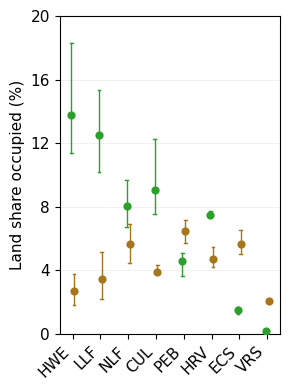

(<Figure size 300x400 with 1 Axes>,
 <AxesSubplot: ylabel='Land share occupied (%)'>)

In [55]:
# usage
plot_three_metrics(df_national_all,
    Scenario_order, ylim=(0, 20), yticks= [0, 4, 8, 12, 16, 20],
    save_path='plots_forests/modelling/base/Land_share_occupied.png')

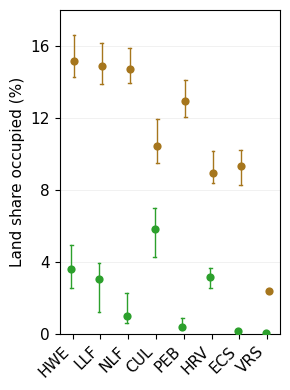

(<Figure size 300x400 with 1 Axes>,
 <AxesSubplot: ylabel='Land share occupied (%)'>)

In [281]:
# usage
plot_three_metrics(
    [national_sm_fix, national_sm_low, national_sp_fix, national_sp_low,
     national_s2_fix, national_s2_low, national_s3_fix, national_s3_fix],
    Scenario_order, ylim=(0, 18), yticks= [0, 4, 8, 12, 16],
    save_path='plots_forests/modelling/UR/Land_share_occupied.png')

In [248]:
national_s2s3_fix

,forest_excls,buffer,total_max_cap_F,total_deployed_cap_F,total_available_km2_F,total_deployed_km2_F,total_max_cap_OF,total_deployed_cap_OF,total_available_km2_OF,total_deployed_km2_OF,total_forest_km2,total_non_forest_km2,occupancy_pct_F,occupancy_pct_OF,available_pct_F,available_pct_OF,total_onshore_cap,onshore_F_share_pct,onshore_OF_share_pct
0,CUL,0,575.228288,132.622213,487481.6,112391.705819,530.894272,404.165394,449910.4,342513.046014,103384.34,215893.66,108.712505,158.648960,471.523637,208.394448,536.787607,24.706646,75.293354
1,ECS,0,38.096064,3.370084,32284.8,2856.002971,581.707904,382.127813,492972.8,323837.129387,103384.34,215893.66,2.762510,149.998443,31.227940,228.340564,385.497896,0.874216,99.125784
2,HRV,0,264.110432,58.164449,223822.4,49291.905871,507.864448,348.030549,430393.6,294941.143217,103384.34,215893.66,47.678310,136.614083,216.495458,199.354441,406.194998,14.319342,85.680658
3,HWE,0,1067.747072,81.310603,904870.4,68907.290478,1356.873504,610.955981,1149892.8,517759.305539,103384.34,215893.66,66.651575,239.821450,875.248998,532.619994,692.266583,11.745562,88.254438
4,LLF,0,637.439776,74.566736,540203.2,63192.148862,1261.255744,599.283956,1068860.8,507867.759085,103384.34,215893.66,61.123521,235.239775,522.519368,495.086701,673.850691,11.065765,88.934235
5,NLF,0,342.358592,20.161140,290134.4,17085.711583,1229.595872,592.504727,1042030.4,502122.649826,103384.34,215893.66,16.526402,232.578692,280.636700,482.659102,612.665866,3.290724,96.709276
6,PEB,0,187.178208,5.576546,158625.6,4725.886425,926.675712,525.142291,785318.4,445035.839574,103384.34,215893.66,4.571182,206.136595,153.432909,363.752414,530.718837,1.050753,98.949247
7,VRS,0,7.886176,1.478306,6683.2,1252.801332,97.802176,97.587781,82883.2,82701.509387,103384.34,215893.66,1.211790,38.306595,6.464422,38.390752,99.066087,1.492242,98.507758


In [56]:
#for outside forest
def calc_buffer_metrics_all_configs_OF(config_pairs, df_forest_area, capacity_density=2.4):
    """
    config_pairs: list of tuples (area_data, cap_data, trans_type, label)
    """
    total_Oforest_km2 = df_forest_area['non_forest_area_km2'].sum()
    
    all_configs = []
    
    for area_data, cap_data, trans_type, label, varnewpcap in config_pairs:
        df_max_OF = area_data.query("transmission == @trans_type").reset_index()
        df_max_OF = df_max_OF[df_max_OF['technology'] == 'Windonshore_OF']
        df_max_OF = df_max_OF[df_max_OF['varnewpcapQ'] == varnewpcap]
        df_max_OF = df_max_OF[['forest_excls', 'buffer', 'zone', 'value']]
        df_max_OF['buffer'] = df_max_OF['buffer'].astype(int)
        df_max_OF = df_max_OF.rename(columns={'value': 'max_cap_OF'})
        
        df_dep_OF = cap_data.query("transmission == @trans_type").reset_index()
        df_dep_OF = df_dep_OF[df_dep_OF['technology'] == 'Windonshore_OF']
        df_dep_OF = df_dep_OF[df_dep_OF['varnewpcapQ'] == varnewpcap]
        df_dep_OF = df_dep_OF[['forest_excls', 'buffer', 'zone', 'gencap']]
        df_dep_OF['buffer'] = df_dep_OF['buffer'].astype(int)
        df_dep_OF = df_dep_OF.rename(columns={'gencap': 'deployed_cap_OF'})
        
        df_dep_F = cap_data.query("transmission == @trans_type").reset_index()
        df_dep_F = df_dep_F[df_dep_F['technology'] == 'Windonshore_F']
        df_dep_F = df_dep_F[df_dep_F['varnewpcapQ'] == varnewpcap]
        df_dep_F = df_dep_F[['forest_excls', 'buffer', 'zone', 'gencap']]
        df_dep_F['buffer'] = df_dep_F['buffer'].astype(int)
        df_dep_F = df_dep_F.rename(columns={'gencap': 'deployed_cap_F'})
        
        df = pd.merge(df_max_OF, df_dep_OF, on=['forest_excls', 'buffer', 'zone'], how='outer')
        df = pd.merge(df, df_dep_F, on=['forest_excls', 'buffer', 'zone'], how='outer')
        df = df.fillna(0)
        #df['deployed_cap_F'] = df['deployed_cap_F'].clip(upper=df['max_cap_F'])
        df['deployed_cap_OF'] = df['deployed_cap_OF'].clip(upper=df['max_cap_OF'])
        
        df_nat = df.groupby(['forest_excls', 'buffer']).agg(
            total_max_cap_OF=('max_cap_OF', 'sum'),
            total_deployed_cap_OF=('deployed_cap_OF', 'sum'),
            total_deployed_cap_F=('deployed_cap_F', 'sum'),
        ).reset_index()
        
        df_nat['utilization_rate_OF'] = np.where(df_nat['total_max_cap_OF'] > 0,
                                                  df_nat['total_deployed_cap_OF'] / df_nat['total_max_cap_OF'] * 100, 0)
        df_nat['deployed_km2_OF'] = df_nat['total_deployed_cap_OF'] * 1000 / capacity_density
        df_nat['occupancy_pct_OF'] = df_nat['deployed_km2_OF'] / total_Oforest_km2 * 100
        df_nat['total_onshore_cap'] = df_nat['total_deployed_cap_F'] + df_nat['total_deployed_cap_OF']
        df_nat['onshore_OF_share_pct'] = np.where(df_nat['total_onshore_cap'] > 0,
                                                    df_nat['total_deployed_cap_OF'] / df_nat['total_onshore_cap'] * 100, 0)
        df_nat['config'] = label
        all_configs.append(df_nat)
    
    df_all = pd.concat(all_configs, ignore_index=True)
    
    df_summary = df_all.groupby(['forest_excls', 'buffer']).agg(
        utilization_rate_OF_mean=('utilization_rate_OF', 'mean'),
        utilization_rate_OF_min=('utilization_rate_OF', 'min'),
        utilization_rate_OF_max=('utilization_rate_OF', 'max'),
        occupancy_pct_OF_mean=('occupancy_pct_OF', 'mean'),
        occupancy_pct_OF_min=('occupancy_pct_OF', 'min'),
        occupancy_pct_OF_max=('occupancy_pct_OF', 'max'),
        onshore_OF_share_mean=('onshore_OF_share_pct', 'mean'),
        onshore_OF_share_min=('onshore_OF_share_pct', 'min'),
        onshore_OF_share_max=('onshore_OF_share_pct', 'max'),
        total_max_cap_OF_mean=('total_max_cap_OF', 'mean'),
    ).reset_index()
    
    return df_summary, df_all



In [57]:
# usage
df_summary_OF_2, df_all_OF_2 = calc_buffer_metrics_all_configs_OF(
    [
        (area_base, captotz_base, 'DefaultYes', 'S13', 'S1'),
        (area_base, captotz_base, 'LOWOH', 'S13+', 'S1'),
        (area_base, captotz_base, 'DefaultYes', 'S+', 'S4'),
        (area_base, captotz_base, 'LOWOH', 'S++', 'S4'),
        (area_base, captotz_base, 'DefaultYes', 'S30', 'S2'),
        (area_base, captotz_base, 'LOWOH', 'S30+', 'S2'),
        (area_base, captotz_base, 'DefaultYes', 'S40', 'S3'),
        (area_base, captotz_base, 'LOWOH', 'S40+', 'S3'),
    ],
    df_forest_area)

In [283]:
# usage
df_summary_OF, df_all_OF = calc_buffer_metrics_all_configs_OF(
    [
        (area_solarminus, captotz_minus, 'DefaultYes', 'S13-Fix', 'OPT'),
        (area_solarminus, captotz_minus, 'LOWOH', 'S13-Exp', 'OPT'),
        (area_solarplus, captotz_plus, 'DefaultYes', 'S∞-Fix', 'OPT'),
        (area_solarplus, captotz_plus, 'LOWOH', 'S∞-Exp', 'OPT'),
        (area_cap2area_S2S3, captotz_S2S3, 'DefaultYes', 'S30-Fix ', 'S2'),
        (area_cap2area_S2S3, captotz_S2S3, 'LOWOH', 'S30-Exp', 'S2'),
        (area_cap2area_S2S3, captotz_S2S3, 'DefaultYes', 'S40-Fix', 'S3'),
        (area_cap2area_S2S3, captotz_S2S3, 'LOWOH', 'S40-Exp', 'S3'),
        
    ],
    df_forest_area)

In [81]:
def plot_buffer_metric_range(df_summary, parameter_mean, parameter_min, parameter_max,
                              scenario_order, scenario_colors, scenario_markers,
                              ylabel='', ylim=None, yticks=None, save_path=None):
    
    buffer_scenarios = [s for s in scenario_order 
                        if df_summary[df_summary['forest_excls'] == s]['buffer'].nunique() > 1]
    single_scenarios = [s for s in scenario_order 
                        if s in df_summary['forest_excls'].unique() and s not in buffer_scenarios]
    
    fig, ax = plt.subplots(figsize=(5, 4))
    
    for scen in buffer_scenarios:
        subset = df_summary[df_summary['forest_excls'] == scen].sort_values('buffer')
        
        # shaded range
        #ax.fill_between(subset['buffer'], subset[parameter_min], subset[parameter_max],
        #                color=scenario_colors.get(scen, '#999999'), alpha=0.15, zorder=2)
        
        # mean line
        ax.plot(subset['buffer'], subset[parameter_mean],
                color=scenario_colors.get(scen, '#999999'),
                marker=scenario_markers.get(scen, 'o'),
                markersize=3, linewidth=1,
                label=scen, zorder=3)
    
    # single-point scenarios
    for scen in single_scenarios:
        subset = df_summary[df_summary['forest_excls'] == scen]
        ax.scatter(subset['buffer'], subset[parameter_mean],
                   color=scenario_colors.get(scen, '#999999'),
                   edgecolor='black', s=40, zorder=5,
                   marker='D', label=scen)
    
    #ax.axhline(y=0, color='grey', linestyle='--', linewidth=0.8, alpha=0.3)
    ax.set_xlabel('Buffer distance (m)', fontsize=11)
    ax.set_ylabel(ylabel, fontsize=11)
    ax.tick_params(axis='both', labelsize=11)
    ax.set_xlim(-50, 3050)
    ax.set_xticks([0, 500, 1000, 1500, 2000, 2500, 3000])
    if ylim:
        ax.set_ylim(ylim)
    if yticks is not None:
        ax.set_yticks(yticks)
    #ax.legend(ncol=4, loc='upper center', bbox_to_anchor=(0.6, 0.35),
    #          frameon=False, fontsize=9, handlelength=1, handletextpad=0.5)
    ax.grid(True, alpha=0.3, linewidth=0.5, zorder=0)
    #ax.spines['top'].set_visible(False)
    #ax.spines['right'].set_visible(False)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax


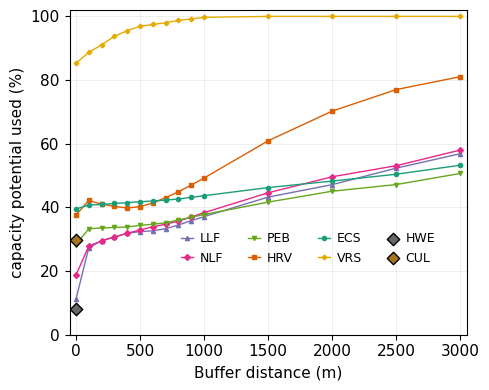

(<Figure size 500x400 with 1 Axes>,
 <AxesSubplot: xlabel='Buffer distance (m)', ylabel='capacity potential used (%)'>)

In [66]:
# usage — nonforest utilization rate
plot_buffer_metric_range(df_summary_OF_2,
    'utilization_rate_OF_mean', 'utilization_rate_OF_min', 'utilization_rate_OF_max',
    Scenario_order, Scenario_colors, Scenario_markers,
    ylabel='capacity potential used (%)', ylim=(0, 102),
    save_path='plots_forests/modelling/base/capacity_potential_used_OF_buffer_mean.png')


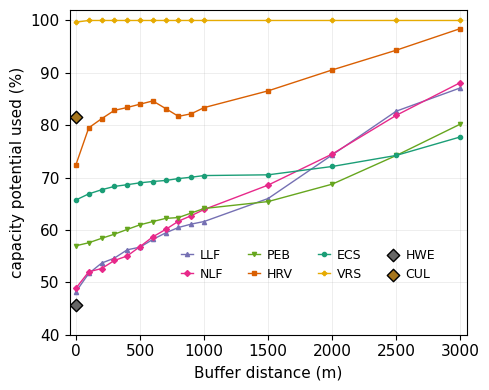

(<Figure size 500x400 with 1 Axes>,
 <AxesSubplot: xlabel='Buffer distance (m)', ylabel='capacity potential used (%)'>)

In [293]:
# usage — nonforest utilization rate
plot_buffer_metric_range(df_summary_OF,
    'utilization_rate_OF_mean', 'utilization_rate_OF_min', 'utilization_rate_OF_max',
    Scenario_order, Scenario_colors, scenario_markers,
    ylabel='capacity potential used (%)', ylim=(40, 102),)
    #save_path='plots_forests/modelling/UR/capacity_potential_used_OF_buffer_mean.png')


In [117]:
var_gen_minus_filtered

genamttot
transmission forest_excls buffer zone  technology                  
DefaultYes   CUL          0      NO020 Solar               0.000022
                                       Windonshore_F     340.340487
                                       Windonshore_OF  11745.001318
                                 NO060 Solar               0.000108
                                       Windonshore_F    3466.804512
...                                                             ...
LOWOH        VRS          900    NO0A2 Windonshore_F       0.000000
                                       Windonshore_OF    920.391311
                                 NO0A3 Solar               0.000028
                                       Windonshore_F       0.000000
                                       Windonshore_OF      0.000000

[8280 rows x 1 columns]

In [215]:
def calc_curtailment_stats(config_pairs, 
                            techs=['Windonshore_F', 'Windonshore_OF', 'Solar']):
    """
    Calculate curtailment and utilization rates at county and national level.
    
    config_pairs: list of tuples (curtail_data, gen_data, trans_type, label)
    e.g., [(VREcurtal_minus, var_gen_minus, 'DefaultYes', 'S⁻ Fix'),
           (VREcurtal_minus, var_gen_minus, 'LOWOH', 'S⁻ Exp'),
           (VREcurtal_plus, var_gen_plus, 'DefaultYes', 'S⁺ Fix'),
           (VREcurtal_plus, var_gen_plus, 'LOWOH', 'S⁺ Exp')]
    """
    all_configs = []
    
    for curtail_data, gen_data, trans_type, label, varnewpcap in config_pairs:
        # curtailment
        df_cur = (
            curtail_data
            .query("transmission == @trans_type and varnewpcapQ == @varnewpcap")
            .reset_index()
        )
        df_cur = df_cur[df_cur['technology'].isin(techs)]
        df_cur = df_cur[['forest_excls', 'buffer', 'zone', 'technology', 'value']]
        df_cur['buffer'] = df_cur['buffer'].astype(int)
        df_cur = df_cur.rename(columns={'value': 'curtailment'})
        
        # generation
        df_gen = (
            gen_data
            .query("transmission == @trans_type and varnewpcapQ == @varnewpcap")
            .reset_index()
        )
        df_gen = df_gen[df_gen['technology'].isin(techs)]
        df_gen = df_gen[['forest_excls', 'buffer', 'zone', 'technology', 'genamttot']]
        df_gen['buffer'] = df_gen['buffer'].astype(int)
        df_gen = df_gen.rename(columns={'genamttot': 'generation'})
        
        # merge
        df = pd.merge(df_cur, df_gen, on=['forest_excls', 'buffer', 'zone', 'technology'], how='outer')
        df = df.fillna(0)
        
        # theoretical maximum
        df['theoretical_max'] = df['curtailment'] + df['generation']
        
        # county-level rates
        df['curtailment_rate'] = np.where(df['theoretical_max'] > 0,
                                           df['curtailment'] / df['theoretical_max'] * 100, 0)
        df['utilization_rate'] = np.where(df['theoretical_max'] > 0,
                                           df['generation'] / df['theoretical_max'] * 100, 0)
        
        df['config'] = label
        all_configs.append(df)
    
    df_all = pd.concat(all_configs, ignore_index=True)
    
    # county level: average across configs
    df_county = df_all.groupby(['forest_excls', 'buffer', 'zone', 'technology']).agg(
        curtailment_mean=('curtailment', 'mean'),
        generation_mean=('generation', 'mean'),
        theoretical_max_mean=('theoretical_max', 'mean'),
    ).reset_index()
    df_county['curtailment_rate'] = np.where(df_county['theoretical_max_mean'] > 0,
                                              df_county['curtailment_mean'] / df_county['theoretical_max_mean'] * 100, 0)
    df_county['utilization_rate'] = np.where(df_county['theoretical_max_mean'] > 0,
                                              df_county['generation_mean'] / df_county['theoretical_max_mean'] * 100, 0)
    
    # national level per technology
    df_nat = df_all.groupby(['forest_excls', 'buffer', 'technology', 'config']).agg(
        total_curtailment=('curtailment', 'sum'),
        total_generation=('generation', 'sum'),
        total_theoretical_max=('theoretical_max', 'sum'),
    ).reset_index()
    df_nat['curtailment_rate'] = np.where(df_nat['total_theoretical_max'] > 0,
                                           df_nat['total_curtailment'] / df_nat['total_theoretical_max'] * 100, 0)
    df_nat['utilization_rate'] = np.where(df_nat['total_theoretical_max'] > 0,
                                           df_nat['total_generation'] / df_nat['total_theoretical_max'] * 100, 0)
    
    # national summary: mean/min/max across configs
    df_national_agg = df_nat.groupby(['forest_excls', 'buffer', 'technology']).agg(
        curtailment_rate_mean=('curtailment_rate', 'mean'),
        curtailment_rate_min=('curtailment_rate', 'min'),
        curtailment_rate_max=('curtailment_rate', 'max'),
        utilization_rate_mean=('utilization_rate', 'mean'),
        utilization_rate_min=('utilization_rate', 'min'),
        utilization_rate_max=('utilization_rate', 'max'),
        total_curtailment_mean=('total_curtailment', 'mean'),
        total_generation_mean=('total_generation', 'mean'),
        total_theoretical_max_mean=('total_theoretical_max', 'mean'),
    ).reset_index()
    
    return df_county, df_national_agg, df_nat, df_all


In [216]:
# usage
df_county_curt_2, df_national_curt_agg_2, df_national_curt_2,  df_all_curt_2 = calc_curtailment_stats(
    [
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'DefaultYes', 'S13', 'S1'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'LOWOH', 'S13+', 'S1'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'DefaultYes', 'S+', 'S4'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'LOWOH', 'S++', 'S4'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'DefaultYes', 'S30', 'S2'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'LOWOH', 'S30+', 'S2'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'DefaultYes', 'S40', 'S3'),
        (VREcurtailed_base_filtered, var_gen_base_filtered, 'LOWOH', 'S40+', 'S3'),
    ])

In [348]:
# usage
df_county_curt, df_national_curt_agg, df_national_curt,  df_all_curt = calc_curtailment_stats(
    [
        (VREcurtal_minus_filtered, var_gen_minus_filtered, 'DefaultYes', 'S13-Fix', 'OPT'),
        (VREcurtal_minus_filtered, var_gen_minus_filtered, 'LOWOH', 'S13-Exp', 'OPT'),
        (VREcurtal_plus_filtered, var_gen_plus_filtered, 'DefaultYes', 'S∞-Fix', 'OPT'),
        (VREcurtal_plus_filtered, var_gen_plus_filtered, 'LOWOH', 'S∞-Exp', 'OPT'),
        (VREcurtailed_S2S3_filtered, var_gen_S2S3_filtered, 'DefaultYes', 'S30-Fix ', 'S2'),
        (VREcurtailed_S2S3_filtered, var_gen_S2S3_filtered, 'LOWOH', 'S30-Exp', 'S2'),
        (VREcurtailed_S2S3_filtered, var_gen_S2S3_filtered, 'DefaultYes', 'S40-Fix', 'S3'),
        (VREcurtailed_S2S3_filtered, var_gen_S2S3_filtered, 'LOWOH', 'S40-Exp', 'S3'),
        
    ])



In [217]:
def plot_curtailment_scatter(df_national_curt, df_shares, x_metric, scenario_order,
                              scenario_colors, config_styles=None, xlabel='',
                              ylabel='',
                              xlim=None, ylim=None, yticks=None,  save_path=None):
    """
    Scatter plot: chosen metric vs onshore curtailment rate.
    Each dot = one scenario-buffer-config combination.
    Color = scenario, marker border = transmission type.
    
    x_metric: column name from df_shares or 'total_onshore' for cap_F+cap_OF
    """
    if config_styles is None:
        config_styles = {
            'S13': {'edgecolor': 'black', 'linewidth': 1},
            'S13+': {'edgecolor': 'grey', 'linewidth': 0},
            'S30': {'edgecolor': 'black', 'linewidth': 1},
            'S30+': {'edgecolor': 'grey', 'linewidth': 0},
            'S40': {'edgecolor': 'black', 'linewidth': 1},
            'S40+': {'edgecolor': 'grey', 'linewidth': 0},
            'S+':  {'edgecolor': 'black', 'linewidth': 1},
            'S++':  {'edgecolor': 'grey', 'linewidth': 0},
        }
    
    # aggregate curtailment for onshore F+OF
    df_curt = df_national_curt[df_national_curt['technology'].isin(
        ['Windonshore_F', 'Windonshore_OF'])].copy()
    
    df_curt_agg = df_curt.groupby(['forest_excls', 'buffer', 'config']).agg(
        total_curtailment=('total_curtailment', 'sum'),
        total_generation=('total_generation', 'sum'),
        total_theoretical_max=('total_theoretical_max', 'sum'),
    ).reset_index()
    
    df_curt_agg['curtailment_rate'] = np.where(df_curt_agg['total_theoretical_max'] > 0,
        df_curt_agg['total_curtailment'] / df_curt_agg['total_theoretical_max'] * 100, 0)
    
    # prepare x metric from df_shares
    df_x = df_shares.copy()
    if x_metric == 'total_onshore':
        df_x['total_onshore'] = df_x['cap_F'] + df_x['cap_OF']
    
    # merge curtailment with x metric
    df_merged = pd.merge(df_curt_agg, df_x[['scenario', 'buffer', 'config', x_metric]],
                          left_on=['forest_excls', 'buffer', 'config'],
                          right_on=['scenario', 'buffer', 'config'],
                          how='inner')
    
    scenarios_present = [s for s in scenario_order if s in df_merged['forest_excls'].unique()]
    
    fig, ax = plt.subplots(figsize=(4.5, 3.5))
    
    for scen in scenarios_present:
        for config, style in config_styles.items():
            subset = df_merged[(df_merged['forest_excls'] == scen) & 
                                (df_merged['config'] == config)]
            if len(subset) == 0:
                continue
            size = 10 + (subset['buffer'] / 3000) * 30
            ax.scatter(subset[x_metric], subset['curtailment_rate'],
                       color=scenario_colors.get(scen, '#999999'),
                       s=size, alpha=0.7, zorder=3,
                       edgecolor=style['edgecolor'],
                       linewidth=style['linewidth'])

        # solar milestone lines
    solar_groups = {
        'S13': (['S13', 'S13+'], '#8B4513'),
        #'S30': (['S30-Fix', 'S30-Exp'], '#CD853F'),
        'S40': (['S40', 'S40+'], '#DAA520'),
        #'S∞':  (['S∞-Fix', 'S∞-Exp'],  '#FFD700'),
    }
    
    for solar_label, (config_list, color) in solar_groups.items():
        mean_curt = df_merged[df_merged['config'].isin(config_list)]['curtailment_rate'].mean()
        ax.axhline(y=mean_curt, color=color, linestyle='--', linewidth=1, alpha=0.7, zorder=1)
        #ax.text(ax.get_xlim()[1] * 0.98, mean_curt + 0.15, solar_label,
        #        fontsize=7, color=color, ha='right', fontweight='bold')
    
    # scenario legend
    legend_scen = [plt.Line2D([0], [0], marker='o', color='w', markersize=8,
                               markerfacecolor=scenario_colors.get(s, '#999999'),
                               markeredgecolor='black', markeredgewidth=0,
                               label=s) for s in scenarios_present]
    

    #ax.legend(handles=legend_scen, ncol=2, loc='upper left', bbox_to_anchor=(0.2, 0.9),
    #          frameon=False, fontsize=9, handlelength=1, handletextpad=0.5)
    
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    if yticks is not None:
        ax.set_yticks(yticks)
    ax.set_yticklabels([])
    ax.grid(True, alpha=0.3, linewidth=0.5, zorder=0)
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')#, transparent=True)
    plt.show()
    return fig, ax



In [221]:
df_national_curt_2.to_csv("df_national_curt_2.csv", index=False)

In [222]:
df_shares_2.to_csv("df_shares_2.csv", index=False)

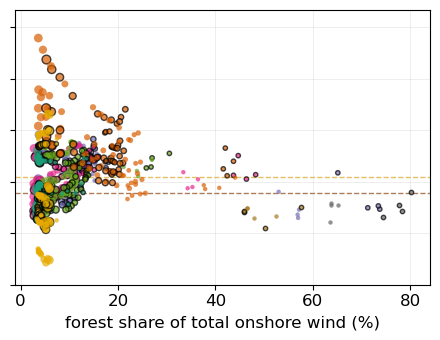

(<Figure size 450x350 with 1 Axes>,
 <AxesSubplot: xlabel='forest share of total onshore wind (%)'>)

In [140]:
# usage — forest share
plot_curtailment_scatter(df_national_curt_2, df_shares_2, 'f_share',
                          Scenario_order, Scenario_colors,
                          xlabel='forest share of total onshore wind (%)',
                          ylim=(0, 16), yticks = [0, 3, 6, 9, 12, 15],
                        save_path='plots_forests/modelling/base/Fshare_curtail.png')

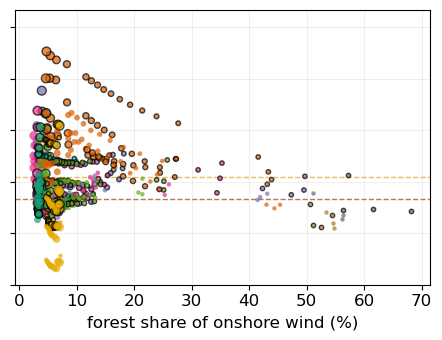

(<Figure size 450x350 with 1 Axes>,
 <AxesSubplot: xlabel='forest share of onshore wind (%)'>)

In [617]:
# usage — forest share
plot_curtailment_scatter(df_national_curt_2, df_shares_2, 'f_share',
                          Scenario_order, Scenario_colors,
                          xlabel='forest share of onshore wind (%)',
                          ylim=(0, 16), yticks = [0, 3, 6, 9, 12, 15],)
                        #save_path='plots_forests/modelling/samecost/Fshare_curtail_T.png')

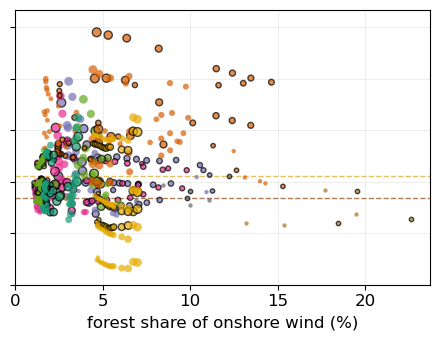

(<Figure size 450x350 with 1 Axes>,
 <AxesSubplot: xlabel='forest share of onshore wind (%)'>)

In [408]:
# usage — forest share
plot_curtailment_scatter(df_national_curt, df_shares, 'f_share',
                          Scenario_order, Scenario_colors,
                          xlabel='forest share of onshore wind (%)',
                          ylim=(0, 16), yticks = [0, 3, 6, 9, 12, 15],
                        save_path='plots_forests/modelling/curtail/Fshare_curtail_T.png')

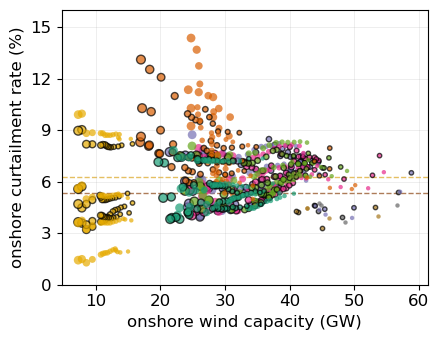

(<Figure size 450x350 with 1 Axes>,
 <AxesSubplot: xlabel='onshore wind capacity (GW)', ylabel='onshore curtailment rate (%)'>)

In [117]:
# usage — total onshore capacity
plot_curtailment_scatter(df_national_curt_2, df_shares_2, 'total_onshore',
                          Scenario_order, Scenario_colors,
                          xlabel='onshore wind capacity (GW)', ylabel='onshore curtailment rate (%)',
                          ylim=(0, 16), yticks = [0, 3, 6, 9, 12, 15],
                        save_path='plots_forests/modelling/base/onshore_capacity_curtail_T.png')

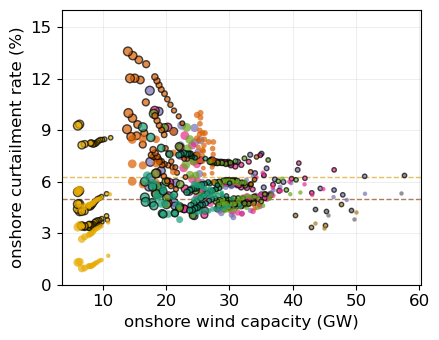

(<Figure size 450x350 with 1 Axes>,
 <AxesSubplot: xlabel='onshore wind capacity (GW)', ylabel='onshore curtailment rate (%)'>)

In [622]:
# usage — total onshore capacity
plot_curtailment_scatter(df_national_curt_2, df_shares_2, 'total_onshore',
                          Scenario_order, Scenario_colors,
                          xlabel='onshore wind capacity (GW)', ylabel='onshore curtailment rate (%)',
                          ylim=(0, 16), yticks = [0, 3, 6, 9, 12, 15],)
                        #save_path='plots_forests/modelling/samecost/onshore_capacity_curtail_T.png')

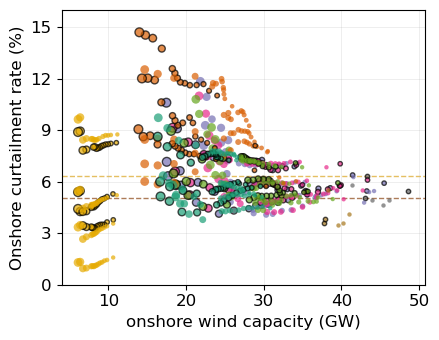

(<Figure size 450x350 with 1 Axes>,
 <AxesSubplot: xlabel='onshore wind capacity (GW)', ylabel='Onshore curtailment rate (%)'>)

In [401]:
# usage — total onshore capacity
plot_curtailment_scatter(df_national_curt, df_shares, 'total_onshore',
                          Scenario_order, Scenario_colors,
                          xlabel='onshore wind capacity (GW)',
                          ylim=(0, 16), yticks = [0, 3, 6, 9, 12, 15],
                        save_path='plots_forests/modelling/curtail/onshore_capacity_curtail_T.png')

In [341]:
df_shares

,scenario,buffer,config,cap_F,cap_OF,cap_offshore,total_cap,f_share,offshore_share_pct
0,CUL,0,S13-Fix,6.968475,30.826385,8.513646,59.308506,18.437627,14.354847
1,ECS,0,S13-Fix,0.567966,29.012109,13.379157,55.959232,1.920097,23.908757
2,ECS,100,S13-Fix,0.475218,27.985238,13.869749,55.330205,1.669748,25.067228
3,ECS,200,S13-Fix,0.458346,27.465769,14.092405,55.016521,1.641399,25.614861
4,ECS,300,S13-Fix,0.478168,26.890175,14.312886,54.681230,1.747159,26.175136
...,...,...,...,...,...,...,...,...,...
731,VRS,1000,S40-Exp,0.439818,7.378864,17.336299,65.154981,5.625219,26.607788
732,VRS,1500,S40-Exp,0.436750,6.743670,17.654026,64.834446,6.082513,27.229392
733,VRS,2000,S40-Exp,0.433564,6.291612,17.926237,64.651413,6.446880,27.727526
734,VRS,2500,S40-Exp,0.430260,5.953778,18.574111,64.958149,6.739622,28.593966


# county-level analysis

In [122]:
def calc_spider_params(county_b0, county_b700, scenarios):
    """
    Calculate four spider parameters per county per scenario.
    
    county_b0_list: list of 4 county dataframes at buffer=0
    county_b700_list: list of 4 county dataframes at buffer=700
    config_labels: list of 4 config names
    scenarios: list of 6 scenario names for spider axes
    """
    all_records = []
    config_labels = county_b0['config'].unique().tolist()
    for scen in scenarios:
        # collect total onshore per zone across configs at buffer=0
        cap_b0_by_config = {}
        for label in config_labels:
            sub = county_b0[(county_b0['forest_excls'] == scen) & 
                                (county_b0['config'] == label)].copy()
            sub['total_deployed_km2'] = sub['deployed_km2_F'] + sub['deployed_km2_OF']
            sub['total_onshore'] = sub['deployed_cap_F'] + sub['deployed_cap_OF']
            cap_b0_by_config[label] = sub.set_index('zone')[['total_onshore', 'total_deployed_km2']]
        
        # collect total onshore per zone across configs at buffer=700
        cap_b700_by_config = {}
        for label in config_labels:
            sub = county_b700[(county_b700['forest_excls'] == scen) & 
                                  (county_b700['config'] == label)].copy()
            sub['total_onshore'] = sub['deployed_cap_F'] + sub['deployed_cap_OF']
            cap_b700_by_config[label] = sub.set_index('zone')['total_onshore']
        
        # get all zones
        all_zones = set()
        for df in cap_b0_by_config.values():
            all_zones.update(df.index)
        
        for zone in all_zones:
            onshore_vals_b0 = [cap_b0_by_config[l].loc[zone, 'total_onshore'] 
                               if zone in cap_b0_by_config[l].index else 0 
                               for l in config_labels]
            min_cap = np.min(onshore_vals_b0)
            if min_cap < 0.001:
                continue
             
            # --- Parameter 1: area occupied (mean across configs) ---
            deployed_km2_vals = [cap_b0_by_config[l].loc[zone, 'total_deployed_km2'] 
                                  if zone in cap_b0_by_config[l].index else 0 
                                  for l in config_labels]
            mean_deployed_km2 = np.mean(deployed_km2_vals)
            
            # get total county area (forest + non-forest)
            county_area = 0
            row = county_b0[(county_b0['forest_excls'] == scen) & 
                                (county_b0['zone'] == zone)]
            if len(row) > 0:
                county_area = row['county_forest_km2'].values[0] + row['county_non_forest_km2'].values[0]
                
            area_occupied_pct = mean_deployed_km2 / county_area * 100 if county_area > 0 else 0

            # --- Parameter 2: share of national onshore (mean across configs) ---
            share_vals = []
            for l in config_labels:
                zone_cap = cap_b0_by_config[l].loc[zone, 'total_onshore'] if zone in cap_b0_by_config[l].index else 0
                national_cap = cap_b0_by_config[l]['total_onshore'].sum()
                share = zone_cap / national_cap * 100 if national_cap > 0 else 0
                share_vals.append(share)

            national_share_pct = np.mean(share_vals)
            
            # --- Parameter 3: buffer sensitivity (mean across configs) ---
            sens_vals = []
            for l in config_labels:
                cap_0 = cap_b0_by_config[l].loc[zone, 'total_onshore'] if zone in cap_b0_by_config[l].index else 0
                cap_700 = cap_b700_by_config[l].loc[zone] if zone in cap_b700_by_config[l].index else 0
                cap_0 = cap_0 if cap_0 >= 0.001 else 0
                cap_700 = cap_700 if cap_700 >= 0.001 else 0
                sens = abs(cap_0 - cap_700)
                sens_vals.append(sens)
            buffer_sensitivity = np.mean(sens_vals)
            
            # --- Parameter 4: solar/trans range at buffer=0 ---
            onshore_vals = [cap_b0_by_config[l].loc[zone, 'total_onshore'] 
                            if zone in cap_b0_by_config[l].index else 0 
                            for l in config_labels]
            config_range = max(onshore_vals) - min(onshore_vals)
        
            all_records.append({
                'scenario': scen,
                'zone': zone,
                'area_occupied_pct': area_occupied_pct,
                'national_share_pct': national_share_pct,
                'buffer_sensitivity': buffer_sensitivity,
                'config_range_gw': config_range,
            })
    df_spider = pd.DataFrame(all_records)


    min_share = 1.0  # minimum 1% national share in any scenario
    relevant_zones = df_spider.groupby('zone')['national_share_pct'].max()
    relevant_zones = relevant_zones[relevant_zones >= min_share].index
    df_spider = df_spider[df_spider['zone'].isin(relevant_zones)]
    
    # normalize each parameter to 0-1 across ALL counties and scenarios
    for col in ['area_occupied_pct', 'national_share_pct', 'buffer_sensitivity', 'config_range_gw']:
        col_min = df_spider[col].min()
        col_max = df_spider[col].max()
        df_spider[f'{col}_norm'] = (df_spider[col] - col_min) / (col_max - col_min) if col_max > col_min else 0
    
    return df_spider



In [123]:
# usage — single call for all 8 configurations
config_pairs = [
    (area_base, captotz_base, 'DefaultYes', 'S1', 'S13'),
    (area_base, captotz_base, 'LOWOH', 'S1', 'S13+'),
    (area_base, captotz_base, 'DefaultYes', 'S4', 'S+'),
    (area_base, captotz_base, 'LOWOH', 'S4', 'S++'),
    (area_base, captotz_base, 'DefaultYes', 'S2', 'S30'),
    (area_base, captotz_base, 'LOWOH', 'S2', 'S30+'),
    (area_base, captotz_base, 'DefaultYes', 'S3', 'S40'),
    (area_base, captotz_base, 'LOWOH', 'S3', 'S40+'),
]


df_county_all_700, _ = calc_deployment_all(config_pairs, df_forest_area, buffer_val=700)

# then calculate spider params
spider_scenarios = ['HWE', 'LLF', 'NLF', 'CUL', 'PEB', 'HRV', 'ECS', 'VRS']
df_spider_2 = calc_spider_params(df_county_all, df_county_all_700, spider_scenarios)


In [124]:
df_spider_2

,scenario,zone,area_occupied_pct,national_share_pct,buffer_sensitivity,config_range_gw,area_occupied_pct_norm,national_share_pct_norm,buffer_sensitivity_norm,config_range_gw_norm
0,HWE,NO060,8.721875,17.673274,8.506116,4.057052e+00,0.194126,0.413577,0.680817,6.381706e-01
1,HWE,NO073,3.618652,8.824639,4.189783,9.299853e-01,0.080261,0.206451,0.335256,1.462858e-01
2,HWE,NO092,31.161575,26.107962,12.492969,1.864244e+00,0.694812,0.611013,1.000000,2.932439e-01
3,HWE,NO0A2,1.531941,2.531583,1.206876,1.044582e+00,0.033701,0.059146,0.096448,1.643118e-01
4,HWE,NO084,18.319981,3.994358,2.021479,3.376364e+00,0.408284,0.093386,0.161664,5.310989e-01
...,...,...,...,...,...,...,...,...,...,...
90,VRS,NO072,1.211944,6.724523,0.209280,4.022338e-13,0.026561,0.157293,0.016582,6.327101e-14
91,VRS,NO020,0.412690,4.666392,0.137040,0.000000e+00,0.008728,0.109117,0.010798,0.000000e+00
92,VRS,NO0A1,3.883417,7.683265,0.165455,2.999600e-01,0.086168,0.179734,0.013073,4.718343e-02
93,VRS,NO094,4.256613,13.943540,0.596612,9.792357e-01,0.094495,0.326273,0.047591,1.540329e-01


In [413]:
# first run calc_deployment_all at buffer=700 for all 4 configs
county_sm_fix_700, _ = calc_deployment_all(area_solarminus, captotz_minus, df_forest_area, 'DefaultYes', 'OPT', buffer_val=700)
county_sm_low_700, _ = calc_deployment_all(area_solarminus, captotz_minus, df_forest_area, 'LOWOH', 'OPT', buffer_val=700)
county_sp_fix_700, _ = calc_deployment_all(area_solarplus, captotz_plus, df_forest_area, 'DefaultYes', 'OPT', buffer_val=700)
county_sp_low_700, _ = calc_deployment_all(area_solarplus, captotz_plus, df_forest_area, 'LOWOH', 'OPT', buffer_val=700)
county_s2_fix_700, _ = calc_deployment_all(
    area_cap2area_S2S3, captotz_S2S3, df_forest_area, 'DefaultYes', 'S2', buffer_val=700)
county_s2_low_700, _ = calc_deployment_all(
    area_cap2area_S2S3, captotz_S2S3, df_forest_area, 'LOWOH', 'S2', buffer_val=700)
county_s3_fix_700,_ = calc_deployment_all(
    area_cap2area_S2S3, captotz_S2S3, df_forest_area, 'DefaultYes', 'S3', buffer_val=700)
county_s3_low_700,_ = calc_deployment_all(
    area_cap2area_S2S3, captotz_S2S3, df_forest_area, 'LOWOH', 'S3', buffer_val=700)



# then calculate spider params
config_labels = ['S13-Fix', 'S13-Exp', 'S30-Fix', 'S30-Exp', 'S40-Fix', 'S40-Exp', 'S∞-Fix', 'S∞-Exp' ]
spider_scenarios = ['HWE', 'LLF', 'NLF', 'CUL', 'PEB', 'HRV', 'ECS', 'VRS']

df_spider = calc_spider_params(
    [county_sm_fix, county_sm_low, county_sp_fix, county_sp_low, county_s2_fix, county_s2_low, county_s3_fix, county_s3_low],
    [county_sm_fix_700, county_sm_low_700, county_sp_fix_700, county_sp_low_700,
     county_s2_fix_700, county_s2_low_700, county_s3_fix_700, county_s3_low_700],
    config_labels,
    spider_scenarios)



[658.9999999987418, 658.9999999990051, 658.9999999965321, 658.9999999993726, 658.9999999977766, 658.9999999970313, 658.9999999978248, 658.9999999998474]
[2.3319836035449555, 2.178673153109929, 2.507353897164784, 2.2973794114634876, 2.313723988601521, 2.212491450154972, 2.3219864335694584, 2.1283408866421345]


In [414]:
for col in ['area_occupied_pct', 'national_share_pct', 'buffer_sensitivity', 'config_range_gw']:
    print(f"{col}: {df_spider[col].min():.2f} – {df_spider[col].max():.2f}")

area_occupied_pct: 0.02 – 44.84
national_share_pct: 0.00 – 35.45
buffer_sensitivity: 0.00 – 9.61
config_range_gw: 0.00 – 4.96


In [432]:
#df_spider["area_occupied_pct"].max() - df_spider["area_occupied_pct"].min()
df_spider["national_share_pct"].max() - df_spider["national_share_pct"].min()
df_spider["buffer_sensitivity"].max() - df_spider["buffer_sensitivity"].min()
df_spider["config_range_gw"].max() - df_spider["config_range_gw"].min()

4.963111807589306

In [132]:
def plot_spider_county(df_spider, zone, region_names, scenarios, scenario_colors, save_path=None):
    """
    Plot spider chart for a single county.
    Axes = scenarios (6), Lines = parameters (4).
    """
    sub = df_spider[df_spider['zone'] == zone].copy()
    sub = sub.set_index('scenario').reindex(scenarios)
    
    params = [
        ('area_occupied_pct_norm', 'Area occupied', '#d62728'),
        ('national_share_pct_norm', 'National share', '#1f77b4'),
        ('buffer_sensitivity_norm', 'Buffer sensitivity', '#2ca02c'),
        ('config_range_gw_norm', 'Config sensitivity', '#ff7f0e'),
    ]

    param_lengths = []
    for col, label, color in params:
        vals = sub[col].values.astype(float)
        param_lengths.append((vals.max(), col, label, color))

    param_lengths.sort(reverse=True)
    # number of axes
    n_axes = len(scenarios)
    angles = np.linspace(0, 2 * np.pi, n_axes, endpoint=False).tolist()
    angles += angles[:1]  # close the polygon
    
    fig, ax = plt.subplots(figsize=(2, 2), subplot_kw=dict(polar=True))
    
    #for col, label, color in params:
    for z, (max_len, col, label, color) in enumerate(param_lengths, start=1):
        values = sub[col].values.tolist()
        values += values[:1]  # close
        ax.plot(angles, values, color=color, linewidth=1, label=label, zorder=3+z)
        ax.fill(angles, values, color=color, alpha=0)
    
    # scenario labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(scenarios, fontsize=10)
    #ax.set_xticklabels([])
    # ax.set_xticklabels([])  # remove default labels
    # for angle, scen in zip(angles[:-1], scenarios):
    #     ax.text(angle, 1.15, scen, fontsize=8,
    #             color=scenario_colors.get(scen, 'black'),
    #             ha='center', va='center')
    ax.tick_params(axis='x', pad=1.5)
    
    # radial ticks
    ax.set_ylim(0, 1)
    ax.set_yticks([0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels([])                     # no radial labels
    ax.tick_params(axis='y', labelsize=0)
    #ax.set_yticklabels(['0.25', '0.5', '0.75', '1'], fontsize=0, color='grey')
    ax.yaxis.grid(True, alpha=0.3)
    ax.xaxis.grid(True, alpha=0.3)
    
    ax.spines['polar'].set_edgecolor('Black')
    ax.spines['polar'].set_linewidth(0)
    # title
    county_name = region_names.get(zone, zone)
    #ax.set_title(county_name, fontsize=12, pad=15, fontweight='bold')
    
    #ax.legend(fontsize=7, ncol=1, loc='upper center', bbox_to_anchor=(1.3, 1.2),
    #         frameon=False, handlelength=1, handletextpad=0.5)
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax


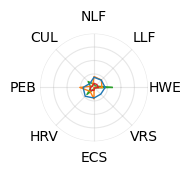

(<Figure size 200x200 with 1 Axes>, <PolarAxesSubplot: >)

In [133]:
# plot all relevant counties to assess visually
#relevant_zones = df_spider_2['zone'].unique()
#for zone in relevant_zones:
#   plot_spider_county(df_spider_2, zone, nuts_to_county, spider_scenarios, Scenario_colors,
#                      save_path=f'plots_forests/modelling/base/county/results_{zone}.png')

plot_spider_county(df_spider_2, "NO073", nuts_to_county, spider_scenarios, Scenario_colors,
                      save_path=f'plots_forests/modelling/base/county/results_NO073.png')

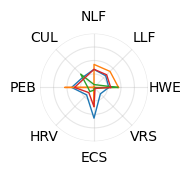

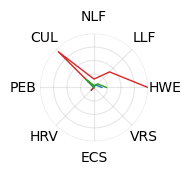

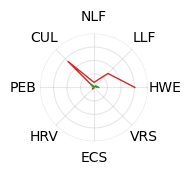

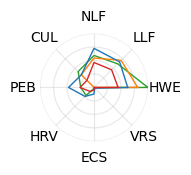

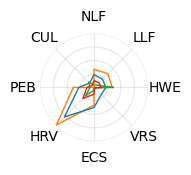

...

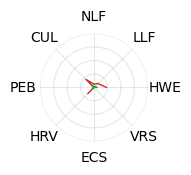

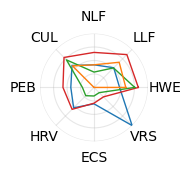

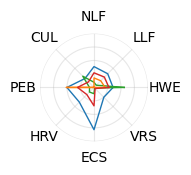

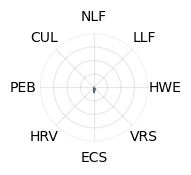

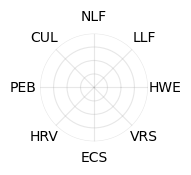

In [424]:
# plot all relevant counties to assess visually
relevant_zones = df_spider['zone'].unique()
for zone in relevant_zones:
   plot_spider_county(df_spider, zone, nuts_to_county, spider_scenarios, Scenario_colors,
                      save_path=f'plots_forests/modelling/county/non_transperent/results_{zone}.png')

#plot_spider_county(df_spider, "NO073", nuts_to_county, spider_scenarios, Scenario_colors,
#                      save_path=f'plots_forests/modelling/county/results_NO073.png')

In [360]:
df_forest_area

,zone,name,total_area_km2,forest_area_km2,non_forest_area_km2,forest_pct
0,NO020,Innlandet,52412.21,21317.63,31094.58,40.673023
1,NO060,Trøndelag,40635.93,11878.85,28757.08,29.232381
2,NO071,Nordland,36855.83,8872.89,27982.94,24.074590
3,NO072,Troms,25719.00,6133.21,19585.79,23.847000
4,NO073,Finnmark,48242.90,11930.36,36312.54,24.729774
5,NO081,Oslo,783.00,455.62,327.38,58.189017
6,NO083,Østfold,4179.80,2393.68,1786.12,57.267812
7,NO084,Akershus,4597.62,2516.32,2081.30,54.730926
8,NO085,Buskerud,15168.96,7309.62,7859.34,48.188010
9,NO092,Agder,16704.56,8708.80,7995.76,52.134268


In [386]:
nuts_to_county

{'NO083': 'Østfold',
 'NO084': 'Akershus',
 'NO081': 'Oslo',
 'NO085': 'Buskerud',
 'NO093': 'Vestfold',
 'NO094': 'Telemark',
 'NO0A1': 'Rogaland',
 'NO0A3': 'Møre og Romsdal',
 'NO072': 'Troms',
 'NO073': 'Finmark',
 'NO020': 'Innlandet',
 'NO060': 'Trøndelag',
 'NO071': 'Nordland',
 'NO092': 'Agder',
 'NO0A2': 'Vestland'}

In [424]:
def plot_norway_forest_map(norway_shp, df_forest_area, save_path=None):
    # merge forest data with shapefile
    norway = norway_shp.copy()
    forest_lookup = df_forest_area.set_index('zone')['forest_pct']
    norway['forest_pct'] = norway.index.map(forest_lookup)
    
    fig, ax = plt.subplots(figsize=(6, 4))
    
    norway.plot(
        column='forest_pct',
        cmap='Greens',
        edgecolor='grey',
        linewidth=0.3,
        ax=ax,
        legend=False,
        vmin=0,
        vmax=100,
    )
    
    # colorbar
    sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=0, vmax=100))
    sm._A = []

    cax = inset_axes(
        ax,
        width="80%",      # thickness of the bar
        height="4%",    # length of the bar
        loc="lower left",
        bbox_to_anchor=(0, -0.02, 1, 1),  # (x0, y0, w, h) in axes fraction
        bbox_transform=ax.transAxes,
        borderpad=0
    )
    cbar = fig.colorbar(sm, cax=cax, orientation="horizontal")
    #cbar.set_label('Forest area per county (%)', fontsize=10)
    cbar.ax.tick_params(labelsize=10)
    cbar.outline.set_visible(False)

    
    ax.axis('off')
    
    fig.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()
    return fig, ax



/tmp/ipykernel_2554253/1238762757.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


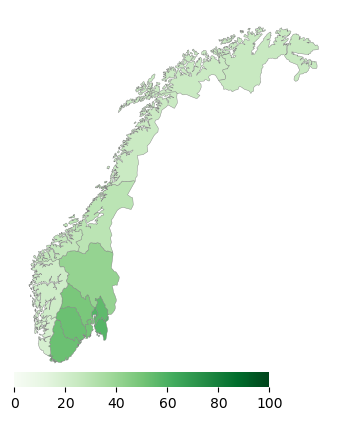

(<Figure size 600x400 with 2 Axes>, <AxesSubplot: >)

In [425]:
# usage
plot_norway_forest_map(Norway, df_forest_area, save_path='plots_forests/modelling/county/map_forestarea_2.png')

In [768]:
df_forest_area

,zone,name,total_area_km2,forest_area_km2,non_forest_area_km2,forest_pct
0,NO020,Innlandet,52412.21,21317.63,31094.58,40.673023
1,NO060,Trøndelag,40635.93,11878.85,28757.08,29.232381
2,NO071,Nordland,36855.83,8872.89,27982.94,24.074590
3,NO072,Troms,25719.00,6133.21,19585.79,23.847000
4,NO073,Finnmark,48242.90,11930.36,36312.54,24.729774
5,NO081,Oslo,783.00,455.62,327.38,58.189017
6,NO083,Østfold,4179.80,2393.68,1786.12,57.267812
7,NO084,Akershus,4597.62,2516.32,2081.30,54.730926
8,NO085,Buskerud,15168.96,7309.62,7859.34,48.188010
9,NO092,Agder,16704.56,8708.80,7995.76,52.134268


In [697]:
(area_solarminus.query("transmission == 'DefaultYes' and technology == 'Windonshore_F' and forest_excls=='VRS' and buffer== '3000'")
         .reset_index())#.groupby(['forest_excls', 'buffer']).agg(
        #total_max_cap=('value', 'sum')))

,transmission,forest_excls,buffer,varnewpcapQ,technology,zone,value
0,DefaultYes,VRS,3000,OPT,Windonshore_F,NO073,0.00472
1,DefaultYes,VRS,3000,OPT,Windonshore_F,NO094,0.00059


In [ ]:
# quick check
print("=== National F utilization ===")
print(national_F.groupby('forest_excls')['utilization_pct'].describe().round(1))
print("\n=== National OF utilization ===")
print(national_OF.groupby('forest_excls')['utilization_pct'].describe().round(1))

In [308]:
storetotZ = makenice(found_scenarios, "store_totecap_z")

  0%|          | 0/16 [00:00<?, ?it/s]

In [309]:
storetotZ

storecaptot
transmission exclusions zone  technology  level_2               
DefaultYes   EF         NO020 Li-ion-8    level     6.403101e-06
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper              inf
                              PumpedHydro level     0.000000e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper     0.000000e+00
                        NO060 Li-ion-8    level     2.590970e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper              inf
                              PumpedHydro level     8.987000e+00
                                          lower     8.987000e+00
                                          marginal -5.029981e-03
                                          scale     1.000000e+00
                                          upper     8.987000e+00
                        NO071 Li-ion-8    level     2.889226e-05
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper              inf
                              PumpedHydro level     0.000000e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper     0.000000e+00
                        NO072 Li-ion-8    level     1.439633e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper              inf
                              PumpedHydro level     0.000000e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper     0.000000e+00
                        NO073 Li-ion-8    level     2.761875e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper              inf
                              PumpedHydro level     0.000000e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper     0.000000e+00
                        NO081 Li-ion-8    level     7.767770e-06
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper              inf
                              PumpedHydro level     0.000000e+00
                                          lower     0.000000e+00
                                          marginal  0.000000e+00
                                          scale     1.000000e+00
                                          upper     0.000000e+00
                       

In [310]:
storetotZ_filtered = storetotZ.loc[(slice(None), slice(None), slice(None),
                                          ['Li-ion-8'], 'level')].droplevel("level_2")
storetotZ_filtered

storecaptot
transmission exclusions zone  technology              
DefaultYes   EF         NO020 Li-ion-8    6.403101e-06
                        NO060 Li-ion-8    2.590970e+00
                        NO071 Li-ion-8    2.889226e-05
                        NO072 Li-ion-8    1.439633e+00
                        NO073 Li-ion-8    2.761875e+00
                        NO081 Li-ion-8    7.767770e-06
                        NO083 Li-ion-8    1.124660e-05
                        NO084 Li-ion-8    7.651739e-06
                        NO085 Li-ion-8    6.483203e-06
                        NO092 Li-ion-8    4.695560e+00
                        NO093 Li-ion-8    9.605876e-06
                        NO094 Li-ion-8    5.742080e+00
                        NO0A1 Li-ion-8    8.894244e-01
                        NO0A2 Li-ion-8    5.598652e-06
                        NO0A3 Li-ion-8    1.578826e+01
             SC         NO020 Li-ion-8    2.457921e-01
                        NO060 Li-ion-8    9.755296e+00
                        NO071 Li-ion-8    7.058723e-06
                        NO072 Li-ion-8    3.224545e+00
                        NO073 Li-ion-8    2.346334e+00
                        NO081 Li-ion-8    2.045894e-05
                        NO083 Li-ion-8    1.702293e-05
                        NO084 Li-ion-8    1.950866e-05
                        NO085 Li-ion-8    1.356536e-05
                        NO092 Li-ion-8    3.089120e-02
                        NO093 Li-ion-8    1.406284e-05
                        NO094 Li-ion-8    5.482510e+00
                        NO0A1 Li-ion-8    1.504760e+00
                        NO0A2 Li-ion-8    1.023215e-05
                        NO0A3 Li-ion-8    1.356059e+01
LOWOH        PM         NO020 Li-ion-8    6.562061e-07
                        NO060 Li-ion-8    1.557165e-01
                        NO071 Li-ion-8    1.054274e-06
                        NO072 Li-ion-8    3.481528e-01
                        NO073 Li-ion-8    3.082507e+00
                        NO081 Li-ion-8    1.601874e-06
                        NO083 Li-ion-8    8.039801e-02
                        NO084 Li-ion-8    1.516308e-06
                        NO085 Li-ion-8    1.084544e-06
                        NO092 Li-ion-8    5.016216e+00
                        NO093 Li-ion-8    5.485427e-06
                        NO094 Li-ion-8    1.448919e+01
                        NO0A1 Li-ion-8    3.428403e-06
                        NO0A2 Li-ion-8    7.919354e-07
                        NO0A3 Li-ion-8    7.116166e+00
             EF         NO020 Li-ion-8    2.596165e-06
                        NO060 Li-ion-8    8.681797e-06
                        NO071 Li-ion-8    6.230393e-06
                        NO072 Li-ion-8    6.847095e-01
                        NO073 Li-ion-8    2.121658e+00
                        NO081 Li-ion-8    3.160570e-06
                        NO083 Li-ion-8    4.727053e-06
                        NO084 Li-ion-8    3.099989e-06
                        NO085 Li-ion-8    2.504793e-06
                        NO092 Li-ion-8    9.751105e+00
                        NO093 Li-ion-8    3.883105e-06
                        NO094 Li-ion-8    1.325859e+01
                        NO0A1 Li-ion-8    3.360137e+00
                        NO0A2 Li-ion-8    1.841552e-06
                        NO0A3 Li-ion-8    6.560498e+00
DefaultYes   SO1        NO020 Li-ion-8    5.575628e-06
                        NO060 Li-ion-8    1.483879e+01
                        NO071 Li-ion-8    5.233847e-06
                        NO072 Li-ion-8    8.881105e-01
                        NO073 Li-ion-8    1.003145e+00
                        NO081 Li-ion-8    8.735649e-06
                        NO083 Li-ion-8    1.046251e-05
                        NO084 Li-ion-8    8.239373e-06
                        NO085 Li-ion-8    5.542364e-06
                        NO092 Li-ion-8    4.468286e+00
                        NO093 Li-ion-8    7.743864e-06
                        NO09

In [311]:
storetotZ_filtered.reset_index()['zone'].unique()

array(['NO020', 'NO060', 'NO071', 'NO072', 'NO073', 'NO081', 'NO083',
       'NO084', 'NO085', 'NO092', 'NO093', 'NO094', 'NO0A1', 'NO0A2',
       'NO0A3'], dtype=object)

In [312]:
storetotZ_filtered = storetotZ_filtered.reset_index()
storetotZ_filtered

,transmission,exclusions,zone,technology,storecaptot
0,DefaultYes,EF,NO020,Li-ion-8,6.403101e-06
1,DefaultYes,EF,NO060,Li-ion-8,2.590970e+00
2,DefaultYes,EF,NO071,Li-ion-8,2.889226e-05
3,DefaultYes,EF,NO072,Li-ion-8,1.439633e+00
4,DefaultYes,EF,NO073,Li-ion-8,2.761875e+00
5,DefaultYes,EF,NO081,Li-ion-8,7.767770e-06
6,DefaultYes,EF,NO083,Li-ion-8,1.124660e-05
7,DefaultYes,EF,NO084,Li-ion-8,7.651739e-06
8,DefaultYes,EF,NO085,Li-ion-8,6.483203e-06
9,DefaultYes,EF,NO092,Li-ion-8,4.695560e+00


In [313]:
grouped = storetotZ_filtered.groupby(['transmission', 'exclusions'])
storetotZ_filtered['normalized'] = grouped['storecaptot'].transform(lambda x: np.sqrt(x / x.max()))
storetotZ_filtered

,transmission,exclusions,zone,technology,storecaptot,normalized
0,DefaultYes,EF,NO020,Li-ion-8,6.403101e-06,0.000637
1,DefaultYes,EF,NO060,Li-ion-8,2.590970e+00,0.405102
2,DefaultYes,EF,NO071,Li-ion-8,2.889226e-05,0.001353
3,DefaultYes,EF,NO072,Li-ion-8,1.439633e+00,0.301966
4,DefaultYes,EF,NO073,Li-ion-8,2.761875e+00,0.418249
5,DefaultYes,EF,NO081,Li-ion-8,7.767770e-06,0.000701
6,DefaultYes,EF,NO083,Li-ion-8,1.124660e-05,0.000844
7,DefaultYes,EF,NO084,Li-ion-8,7.651739e-06,0.000696
8,DefaultYes,EF,NO085,Li-ion-8,6.483203e-06,0.000641
9,DefaultYes,EF,NO092,Li-ion-8,4.695560e+00,0.545352


In [314]:
storetotZ_filtered['storecaptot'].max()

21.41186355078461

In [315]:
storetotZ_filtered.query("transmission == 'DefaultYes' and exclusions == 'PM'").sum()

transmission    DefaultYesDefaultYesDefaultYesDefaultYesDefaul...
exclusions                         PMPMPMPMPMPMPMPMPMPMPMPMPMPMPM
zone            NO020NO060NO071NO072NO073NO081NO083NO084NO085N...
technology      Li-ion-8Li-ion-8Li-ion-8Li-ion-8Li-ion-8Li-ion...
storecaptot                                             33.911532
normalized                                               3.316794
dtype: object

/tmp/ipykernel_2053585/4039920733.py:25: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid
/tmp/ipykernel_2053585/4039920733.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


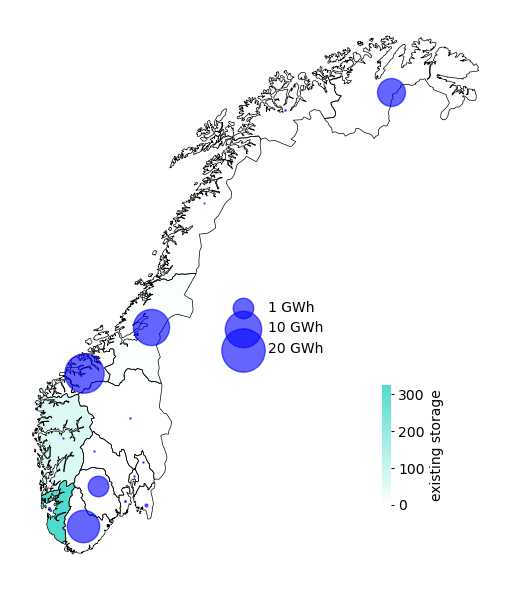

In [316]:
#plot storage

df = storetotZ_filtered.query("transmission == 'DefaultYes' and exclusions == 'PM'")

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
cmap = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])
Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap)
Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)

#cmap = plt.get_cmap('Greens')
ax_color_scale = fig.add_axes([0.71, 0.15, 0.015, 0.2])
norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
                         vmax=Norway['existing_hydro_ecap'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
cb.set_label('existing storage', fontsize=10)
new_ticks = [0, 100, 200, 300]
cb.set_ticks(new_ticks)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2)


max_size = 800

centroids = Norway.centroid

offset_dict = {
    'NO020': [0, 0],
    'NO060': [0.2, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [0, -0.2],
    'NO081': [0, 0],
    'NO083': [0.1, -0.15],
    'NO084': [0, 0.3],
    'NO085': [-0.8, 0.3],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0.2],
    'NO0A1': [-0.6, 0.05],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
    
}



# Create circles at each zone's centroid
for i in ['NO020', 'NO060', 'NO071', 'NO072', 'NO073', 'NO081', 'NO083',
       'NO084', 'NO085', 'NO092', 'NO093', 'NO094', 'NO0A1', 'NO0A2',
       'NO0A3']:
    #zone = row['zone']
    plotdata = df[df['zone'] == i]
    size = plotdata['normalized'].iloc[0]*max_size
    value = plotdata['storecaptot'].iloc[0]
    offset_x, offset_y = offset_dict[i]
    if size > 0:  # Only plot if there's storage capacity
        ax.scatter(
            centroids.x[i]+offset_x,
            centroids.y[i]+offset_y,
            s=size,
            alpha=0.6,
            color="blue",
            zorder=1
        )
ax.axis('off')

# Add a legend with size reference
legend_elements = [
    plt.scatter([], [], s=np.sqrt(x/df['storecaptot'].max()) * max_size, 
                color='blue', alpha=0.6, label=f'{x:.0f} GWh')
    for x in [1, 10, 20]  # Reference values for legend
]
ax.legend(handles=legend_elements, 
         borderaxespad=0,frameon=False,fontsize=10, 
         bbox_to_anchor=(0.65, 0.5))

plt.tight_layout()
plt.show()


In [317]:
storetotZ_filtered

,transmission,exclusions,zone,technology,storecaptot,normalized
0,DefaultYes,EF,NO020,Li-ion-8,6.403101e-06,0.000637
1,DefaultYes,EF,NO060,Li-ion-8,2.590970e+00,0.405102
2,DefaultYes,EF,NO071,Li-ion-8,2.889226e-05,0.001353
3,DefaultYes,EF,NO072,Li-ion-8,1.439633e+00,0.301966
4,DefaultYes,EF,NO073,Li-ion-8,2.761875e+00,0.418249
5,DefaultYes,EF,NO081,Li-ion-8,7.767770e-06,0.000701
6,DefaultYes,EF,NO083,Li-ion-8,1.124660e-05,0.000844
7,DefaultYes,EF,NO084,Li-ion-8,7.651739e-06,0.000696
8,DefaultYes,EF,NO085,Li-ion-8,6.483203e-06,0.000641
9,DefaultYes,EF,NO092,Li-ion-8,4.695560e+00,0.545352


In [318]:
scenarios

['CA', 'EF', 'PC', 'PM', 'SC', 'SD', 'SO1', 'SO2']

/tmp/ipykernel_2053585/2698005932.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid


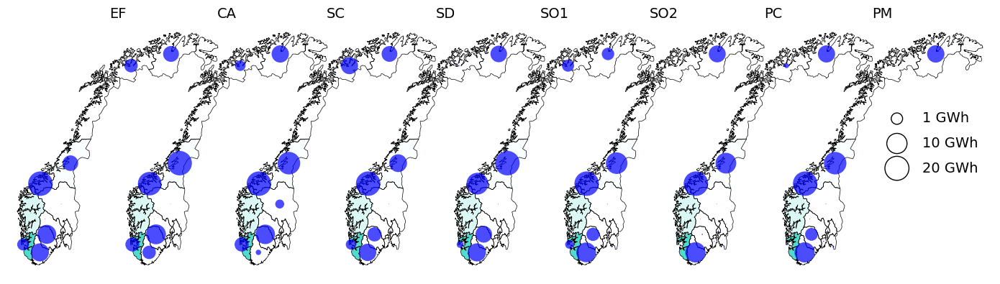

In [332]:
#plot storage

df = storetotZ_filtered.query("transmission == 'DefaultYes'")

#fig, axes = plt.subplots(2, 4, figsize=(9, 7))
fig, axes = plt.subplots(1, 8, figsize=(14, 5))
fig.subplots_adjust(wspace=-0.58, left=0.15, right=0.75, top=0.3, bottom=0.2)
axes = axes.flatten()
#axes[7].remove()

cmap = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])


centroids = Norway.centroid

offset_dict = {
    'NO020': [0, 0],
    'NO060': [0.2, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [-1, 0],
    'NO081': [0, 0],
    'NO083': [0.1, -0.35],
    'NO084': [0.5, 0.3],
    'NO085': [-0.8, 0.3],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0.2],
    'NO0A1': [-0.8, 0.05],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
    
}

max_size = 600




for i, scenario in enumerate(['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']):
    ax = axes[i]

    Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap)
    Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)
    ax.axis('off')
    
    data = df[df['exclusions'] == scenario]
    #tot_store = [data['storecaptot'].sum()]
    ax.set_title(scenario.upper(),fontsize=14, pad=-10)
    for z in ['NO020', 'NO060', 'NO071', 'NO072', 'NO073', 'NO081', 'NO083',
       'NO084', 'NO085', 'NO092', 'NO093', 'NO094', 'NO0A1', 'NO0A2',
       'NO0A3']:
        plotdata = data[data['zone'] == z]
        size = plotdata['normalized'].iloc[0]*max_size
        value = plotdata['storecaptot'].iloc[0]        
        offset_x, offset_y = offset_dict[z]
        if size > 0:  # Only plot if there's storage capacity
            ax.scatter(
                centroids.x[z]+offset_x,
                centroids.y[z]+offset_y,
                s=size,
                alpha=0.7,
                color="blue",
                edgecolor='none',
                zorder=1
                )


# Add a legend with size reference
legend_elements = [
    plt.scatter([], [], s=np.sqrt(x/df['storecaptot'].max()) * max_size, 
                color='none', edgecolor='black', label=f'{x:.0f} GWh')
    for x in [1, 10, 20]  # Reference values for legend
]
fig.legend(handles=legend_elements, 
         borderaxespad=0,frameon=False,fontsize=14, 
         bbox_to_anchor=(0.98, 0.6), ncol=1, labelspacing=0.8)

#ax_color_scale = fig.add_axes([0.74, 0.09, 0.02, 0.21])
#norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
#                         vmax=Norway['existing_hydro_ecap'].max())
#cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
#                      cax=ax_color_scale, orientation='vertical')
#cb.set_label('Existing hydro storage (GWh)', fontsize=10)
#new_ticks = [0, 100, 200, 300]
#cb.set_ticks(new_ticks)
#cb.outline.set_visible(False)
#cb.ax.tick_params(length=2)




plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_spatial_fixed8.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_spatial_fixed8T.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

/tmp/ipykernel_2053585/3366451122.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid
/tmp/ipykernel_2053585/3366451122.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


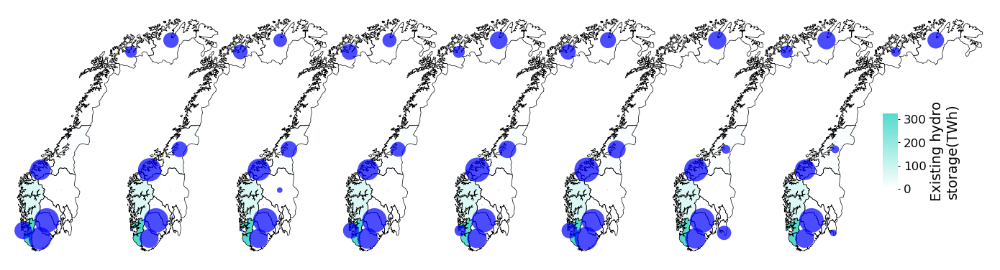

In [343]:
#plot storage

df = storetotZ_filtered.query("transmission == 'LOWOH'")

#fig, axes = plt.subplots(2, 4, figsize=(9, 7))
fig, axes = plt.subplots(1, 8, figsize=(14, 5))
fig.subplots_adjust(wspace=-0.58, left=0.15, right=0.75, top=0.3, bottom=0.2)
axes = axes.flatten()
#axes[7].remove()

cmap = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])


centroids = Norway.centroid

offset_dict = {
    'NO020': [0, 0],
    'NO060': [0.2, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [-1, 0],
    'NO081': [0, 0],
    'NO083': [0.1, -0.35],
    'NO084': [0.5, 0.3],
    'NO085': [-0.8, 0.3],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0.2],
    'NO0A1': [-0.8, 0.05],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
    
}

max_size = 600

for i, scenario in enumerate(['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']):
    ax = axes[i]

    Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap)
    Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)
    ax.axis('off')
    
    data = df[df['exclusions'] == scenario]
    #tot_store = [data['storecaptot'].sum()]
    #ax.set_title(scenario.upper(),fontsize=12, pad=-10)
    for z in ['NO020', 'NO060', 'NO071', 'NO072', 'NO073', 'NO081', 'NO083',
       'NO084', 'NO085', 'NO092', 'NO093', 'NO094', 'NO0A1', 'NO0A2',
       'NO0A3']:
        plotdata = data[data['zone'] == z]
        size = plotdata['normalized'].iloc[0]*max_size
        value = plotdata['storecaptot'].iloc[0]        
        offset_x, offset_y = offset_dict[z]
        if size > 0:  # Only plot if there's storage capacity
            ax.scatter(
                centroids.x[z]+offset_x,
                centroids.y[z]+offset_y,
                s=size,
                alpha=0.7,
                color="blue",
                edgecolor='none',
                zorder=1
                )


# Add a legend with size reference
#legend_elements = [
#    plt.scatter([], [], s=np.sqrt(x/df['storecaptot'].max()) * max_size, 
#                color='none', edgecolor='black', label=f'{x:.0f} GWh')
#    for x in [1, 10, 20]  # Reference values for legend
#]
#fig.legend(handles=legend_elements, 
#         borderaxespad=0,frameon=False,fontsize=10, 
#         bbox_to_anchor=(0.90, 0.8), ncol=1, labelspacing=1.3)

ax_color_scale = fig.add_axes([0.88, 0.35, 0.015, 0.21])
norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
                         vmax=Norway['existing_hydro_ecap'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
cb.set_label('Existing hydro\nstorage(TWh)', fontsize=14)
new_ticks = [0, 100, 200, 300]
cb.set_ticks(new_ticks)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2, labelsize=12)




plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_spatial_expand8.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_spatial_expand8T.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

In [276]:
def calculate_storage_differences(df, transmission_type):
    """Calculate storage differences from PM baseline"""
    # Get HWE baseline data
    PM_data = df[(df['transmission'] == transmission_type) & 
                  (df['exclusions'] == 'PM')][['zone', 'storecaptot']].copy()
    PM_data.rename(columns={'storecaptot': 'PM_storage'}, inplace=True)
    
    # Merge with all scenarios
    df_trans = df[df['transmission'] == transmission_type].copy()
    df_diff = df_trans.merge(PM_data, on='zone', how='left')
    
    # Calculate difference
    df_diff['storage_diff'] = df_diff['storecaptot'] - df_diff['PM_storage']
    
    # Calculate normalized size for plotting (based on absolute difference)
    max_diff = df_diff['storage_diff'].abs().max()
    df_diff['normalized_diff'] = df_diff['storage_diff'].abs() / max_diff if max_diff > 0 else 0

    max_storage = df_trans['storecaptot'].max()
    df_diff['normalized_storage'] = df_diff['storecaptot'] / max_storage if max_storage > 0 else 0
        
    
    return df_diff, max_diff, max_storage

In [277]:
df_default_diff, max_diff_default, max_storage_default = calculate_storage_differences(storetotZ_filtered, 'DefaultYes')
df_lowoh_diff, max_diff_lowoh, max_storage_lowoh = calculate_storage_differences(storetotZ_filtered, 'LOWOH')

df_default_diff[(df_default_diff['exclusions'] == 'PM')]

,transmission,exclusions,zone,technology,storecaptot,PM_storage,storage_diff,normalized_diff,normalized_storage
105,DefaultYes,PM,NO020,Li-ion-8,0.000011,0.000011,0.0,0.0,4.960682e-07
106,DefaultYes,PM,NO060,Li-ion-8,9.687889,9.687889,0.0,0.0,4.524542e-01
107,DefaultYes,PM,NO071,Li-ion-8,0.000004,0.000004,0.0,0.0,1.971857e-07
108,DefaultYes,PM,NO072,Li-ion-8,0.000024,0.000024,0.0,0.0,1.106359e-06
109,DefaultYes,PM,NO073,Li-ion-8,3.434186,3.434186,0.0,0.0,1.603871e-01
110,DefaultYes,PM,NO081,Li-ion-8,0.000015,0.000015,0.0,0.0,6.775997e-07
111,DefaultYes,PM,NO083,Li-ion-8,0.000352,0.000352,0.0,0.0,1.644422e-05
112,DefaultYes,PM,NO084,Li-ion-8,0.000014,0.000014,0.0,0.0,6.486179e-07
113,DefaultYes,PM,NO085,Li-ion-8,0.000010,0.000010,0.0,0.0,4.892684e-07
114,DefaultYes,PM,NO092,Li-ion-8,6.232002,6.232002,0.0,0.0,2.910537e-01


In [292]:
df_lowoh_diff[(df_lowoh_diff['exclusions'] == 'PM')]

,transmission,exclusions,zone,technology,storecaptot,PM_storage,storage_diff,normalized_diff,normalized_storage
0,LOWOH,PM,NO020,Li-ion-8,6.562061e-07,6.562061e-07,0.0,0.0,4.528937e-08
1,LOWOH,PM,NO060,Li-ion-8,1.557165e-01,1.557165e-01,0.0,0.0,1.074708e-02
2,LOWOH,PM,NO071,Li-ion-8,1.054274e-06,1.054274e-06,0.0,0.0,7.276281e-08
3,LOWOH,PM,NO072,Li-ion-8,3.481528e-01,3.481528e-01,0.0,0.0,2.402846e-02
4,LOWOH,PM,NO073,Li-ion-8,3.082507e+00,3.082507e+00,0.0,0.0,2.127454e-01
5,LOWOH,PM,NO081,Li-ion-8,1.601874e-06,1.601874e-06,0.0,0.0,1.105565e-07
6,LOWOH,PM,NO083,Li-ion-8,8.039801e-02,8.039801e-02,0.0,0.0,5.548829e-03
7,LOWOH,PM,NO084,Li-ion-8,1.516308e-06,1.516308e-06,0.0,0.0,1.046510e-07
8,LOWOH,PM,NO085,Li-ion-8,1.084544e-06,1.084544e-06,0.0,0.0,7.485195e-08
9,LOWOH,PM,NO092,Li-ion-8,5.016216e+00,5.016216e+00,0.0,0.0,3.462041e-01


/tmp/ipykernel_832553/2700586130.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid


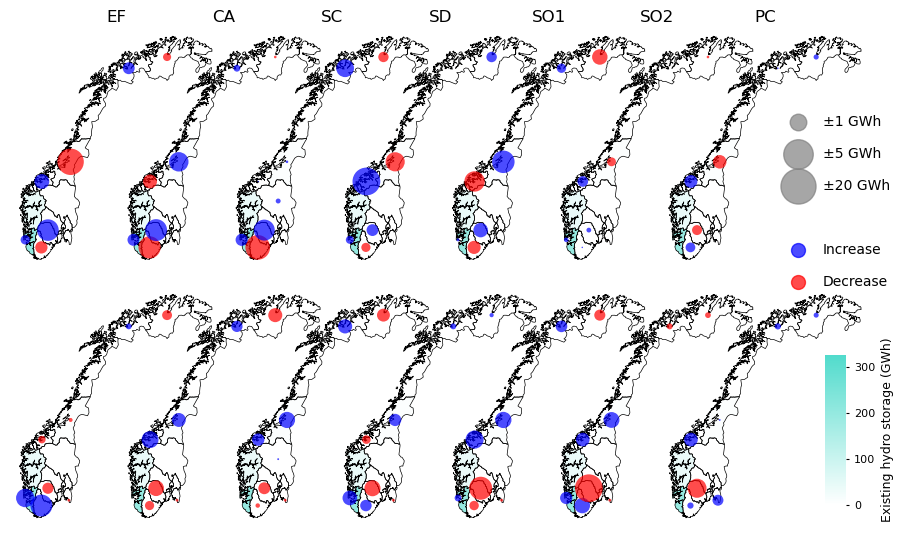

In [142]:


# Create figure with 2 rows, 8 columns
fig, axes = plt.subplots(2, 7, figsize=(14, 6))
#fig.subplots_adjust(wspace=0.05, hspace=0.15, left=0.05, right=0.90, top=0.92, bottom=0.08)
fig.subplots_adjust(wspace=-0.8, hspace=0.05, left=0.05, right=0.9, top=0.92, bottom=0.08)

# Background colormap for existing hydro
cmap_hydro = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])

# Diverging colormap for differences (red = decrease, blue = increase)
# For circles, we'll use red/blue directly

centroids = Norway.centroid
offset_dict = {
    'NO020': [0, 0],
    'NO060': [0.2, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [-1, 0],
    'NO081': [0, 0],
    'NO083': [0.1, -0.35],
    'NO084': [0.5, 0.3],
    'NO085': [-0.8, 0.3],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0.2],
    'NO0A1': [-0.8, 0.05],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
}

max_size = 400
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC']
zones = ['NO020', 'NO060', 'NO071', 'NO072', 'NO073', 'NO081', 'NO083',
         'NO084', 'NO085', 'NO092', 'NO093', 'NO094', 'NO0A1', 'NO0A2', 'NO0A3']

# Row titles
#row_titles = ['Fixed transmission', 'Expandable transmission']
transmission_types = ['DefaultYes', 'LOWOH']
df_list = [df_default_diff, df_lowoh_diff]

for row in range(2):
    df_diff = df_list[row]
    transmission = transmission_types[row]
    
    for col, scenario in enumerate(scenarios):
        ax = axes[row, col]
        
        # Plot Norway with existing hydro background
        Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap_hydro, alpha=0.6)
        Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)
        ax.axis('off')
        
        # Set title (only for top row)
        if row == 0:
            ax.set_title(scenario.upper(), fontsize=12, pad=2)
        
        ## Add row label (only for first column)
        #if col == 0:
        #    ax.text(-0.15, 0.5, row_titles[row], transform=ax.transAxes,
        #           fontsize=11, fontweight='bold', rotation=90, 
        #           va='center', ha='right')
        
        # Get data for this scenario
        data = df_diff[df_diff['exclusions'] == scenario]
        
        # Plot storage differences
        for z in zones:
            plotdata = data[data['zone'] == z]
            if len(plotdata) == 0:
                continue
                

            diff_value = plotdata['storage_diff'].iloc[0]
            size = plotdata['normalized_diff'].iloc[0] * max_size
            
            offset_x, offset_y = offset_dict[z]
            
            # Determine color based on difference
            if diff_value > 0:
                color = 'blue'  # More storage than HWE
                alpha = 0.7
            elif diff_value < 0:
                color = 'red'   # Less storage than HWE
                alpha = 0.7
            else:
                continue  # Skip if no difference
            
            if size > 0:
                ax.scatter(
                    centroids.x[z] + offset_x,
                    centroids.y[z] + offset_y,
                    s=size,  # Small grey dot for HWE
                    alpha=alpha,
                    color=color,
                    edgecolor='none',
                    zorder=2
                )

# Add legend for circle sizes (difference magnitude)
max_diff_default = df_default_diff['storage_diff'].abs().max()
max_diff_lowoh = df_lowoh_diff['storage_diff'].abs().max()
max_diff = max(max_diff_default, max_diff_lowoh)
max_storage = max(max_storage_default, max_storage_lowoh)

legend_elements = [
    plt.scatter([], [], s=np.sqrt(1/max_diff) * max_size, 
                color='grey', alpha=0.7, label='±1 GWh'),
    plt.scatter([], [], s=np.sqrt(10/max_diff) * max_size, 
                color='grey', alpha=0.7, label='±5 GWh'),
    plt.scatter([], [], s=np.sqrt(20/max_diff) * max_size, 
                color='grey', alpha=0.7, label='±20 GWh'),
    mpatches.Patch(color='none', label=''),  # Spacer
    plt.scatter([], [], s=100, color='blue', alpha=0.7, label='Increase'),
    plt.scatter([], [], s=100, color='red', alpha=0.7, label='Decrease'),
]



fig.legend(handles=legend_elements, 
          borderaxespad=0, frameon=False, fontsize=10,
          bbox_to_anchor=(0.8, 0.78), ncol=1, labelspacing=1.3,
          title='', title_fontsize=10)



# Add colorbar for existing hydro storage
ax_color_scale = fig.add_axes([0.75, 0.12, 0.015, 0.25])
norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
                    vmax=Norway['existing_hydro_ecap'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap_hydro), 
                 cax=ax_color_scale, orientation='vertical')
cb.set_label('Existing hydro storage (GWh)', fontsize=9)
new_ticks = [0, 100, 200, 300]
cb.set_ticks(new_ticks)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2, labelsize=8)

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_difference_fixed_expand.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_difference_fixed_expandT.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()


# capacity spatial distribution

In [22]:
trans_cap = makenice(found_scenarios, "tot_trans_cap")

  0%|          | 0/16 [00:00<?, ?it/s]

In [23]:
captotz = makenice(found_scenarios, "cap_z")

  0%|          | 0/16 [00:00<?, ?it/s]

In [24]:
captotz_filtered = captotz.loc[(slice(None), slice(None), slice(None),
                                ['Solar','Windonshore', 'Windoffshore','Windoffshorefloating'],
                                          'level')].droplevel(["level_2"])
captotz_filtered = captotz_filtered[captotz_filtered.gencap > 1e-04]


In [25]:
captotz_filtered.query("transmission == 'DefaultYes' and exclusions == 'PM'")

gencap
transmission exclusions zone  technology                     
DefaultYes   PM         NO060 Solar                  5.184866
                        NO085 Solar                  6.760404
                        NO092 Solar                  0.063844
                        NO093 Solar                  2.780000
                        NO094 Solar                 14.351072
                        NO0A2 Solar                  1.513754
                        NO0A3 Solar                 10.801252
                        NO060 Windonshore            7.868607
                        NO071 Windonshore            1.898513
                        NO072 Windonshore            3.475454
                        NO073 Windonshore            3.771258
                        NO083 Windonshore            5.118600
                        NO084 Windonshore            1.794901
                        NO092 Windonshore            9.320441
                        NO093 Windonshore            1.917300
                        NO092 Windoffshore           1.491500
                        NO0A1 Windoffshore           1.296147
                        NO0A3 Windoffshore           0.620000
                              Windoffshorefloating   0.870136

In [26]:
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

In [27]:
tech_map = {
    'Solar': {'label': 'Solar', 'color': '#f9d002'},
    'Windoffshore': {'label': 'WindOffshore', 'color': '#6895dd'},
    'Windoffshorefloating': {'label': 'WindOffshoreFloating', 'color': '#74c6f2'},
    'Windonshore': {'label': 'WindOnshore', 'color': '#235ebc'},
}

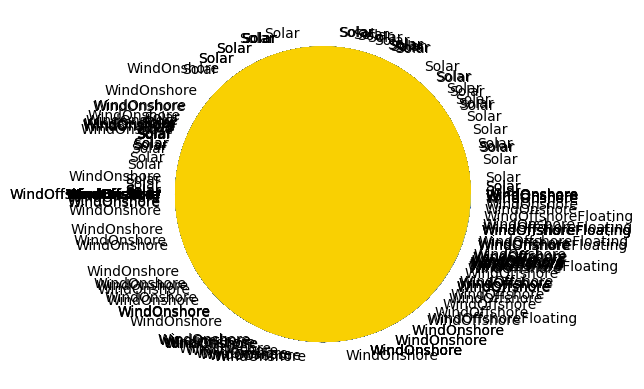

In [28]:
cap_pies_fixed = {}
cap_pies_expandable = {}
zones = ['NO020','NO060','NO071','NO072','NO073','NO081','NO083','NO084','NO085','NO092','NO093',
                  'NO094','NO0A1', 'NO0A2', 'NO0A3']
for scenario in scenarios:
    for i in zones:
        df_fixed = captotz_filtered.query(f"transmission == 'DefaultYes' and exclusions == '{scenario}' and zone == '{i}' and "
                          f"technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore')").reset_index()
        df_expandable = captotz_filtered.query(f"transmission == 'LOWOH' and exclusions == '{scenario}' and zone == '{i}' and "
                  f"technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore')").reset_index()

        active_labels_F = [tech_map[tech]['label'] for tech in df_fixed['technology']]
        active_colors_F = [tech_map[tech]['color'] for tech in df_fixed['technology']]
        active_labels_E = [tech_map[tech]['label'] for tech in df_expandable['technology']]
        active_colors_E = [tech_map[tech]['color'] for tech in df_expandable['technology']]
        
        cap_pies_fixed[(scenario, i)] = plt.pie(df_fixed['gencap'], labels = active_labels_F, colors = active_colors_F)
        cap_pies_expandable[(scenario, i)] = plt.pie(df_expandable['gencap'], labels = active_labels_E, colors = active_colors_E)
        

In [29]:
cap_pies_fixed

{('EF', 'NO020'): ([<matplotlib.patches.Wedge at 0x14fad07dc550>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOnshore')]),
 ('EF',
  'NO060'): ([<matplotlib.patches.Wedge at 0x14fad0780a90>,
   <matplotlib.patches.Wedge at 0x14fad07829e0>], [Text(-1.0720669653817554, 0.24631772517858758, 'Solar'),
   Text(1.0720669711472375, -0.24631770008504908, 'WindOnshore')]),
 ('EF',
  'NO071'): ([<matplotlib.patches.Wedge at 0x14fad0781b40>,
   <matplotlib.patches.Wedge at 0x14fad07de5c0>], [Text(1.098707908437604, 0.05330039340066869, 'Solar'),
   Text(-1.0987079115565663, -0.05330032910788181, 'WindOnshore')]),
 ('EF', 'NO072'): ([<matplotlib.patches.Wedge at 0x14fadc093b80>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOnshore')]),
 ('EF', 'NO073'): ([<matplotlib.patches.Wedge at 0x14fad07dd6f0>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOffshoreFloating')]),
 ('EF', 'NO081'): ([], []),
 ('EF',
  'NO083'): ([<matplotlib.patches.Wedge at 0x14fad07dfd90>,
   <matplotlib.patches.Wedge at 0x14fac

In [37]:
captotz_filtered.query("transmission == 'LOWOH' and zone in ['NO060'] and technology == 'Windonshore'")

gencap
transmission exclusions zone  technology           
LOWOH        PM         NO060 Windonshore  6.022442
             EF         NO060 Windonshore  0.546300
             SC         NO060 Windonshore  6.260983
             CA         NO060 Windonshore  6.444911
             SD         NO060 Windonshore  7.032658
             PC         NO060 Windonshore  6.022849
             SO1        NO060 Windonshore  7.648047
             SO2        NO060 Windonshore  7.152431

In [30]:
(captotz_filtered.query("transmission == 'DefaultYes' and zone in ['NO0A1', 'NO092', 'NO093', 'NO094'] and technology == 'Windonshore'")
         .groupby(['transmission', 'exclusions']).sum())

gencap
transmission exclusions           
DefaultYes   CA           6.610501
             EF           2.892865
             PC          11.298667
             PM          11.237741
             SC           6.748801
             SD           9.509075
             SO1         10.157131
             SO2         10.767449

In [90]:
(captotz_filtered.query("transmission == 'LOWOH' and zone in ['NO0A1', 'NO092', 'NO093', 'NO094'] and technology == 'Windonshore'")
         .groupby(['transmission', 'exclusions']).sum())

gencap
transmission exclusions           
LOWOH        CA           3.834569
             EF           2.257401
             PC          10.972657
             PM          10.871263
             SC           5.287209
             SD           8.043181
             SO1          9.715663
             SO2         10.614470

In [25]:
cap_pies_expandable

{('EF', 'NO020'): ([<matplotlib.patches.Wedge at 0x148ac2fee0e0>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOnshore')]),
 ('EF',
  'NO060'): ([<matplotlib.patches.Wedge at 0x148ac2fef640>,
   <matplotlib.patches.Wedge at 0x148ac2fee710>], [Text(-1.0486074031123536, 0.33229883258592124, 'Solar'),
   Text(1.0486074186683834, -0.33229878349706576, 'WindOnshore')]),
 ('EF',
  'NO071'): ([<matplotlib.patches.Wedge at 0x148ac2fef5e0>,
   <matplotlib.patches.Wedge at 0x148ac2df4220>], [Text(1.0988107122069057, 0.05113725392854488, 'Solar'),
   Text(-1.0988107114588097, -0.05113727000324527, 'WindOnshore')]),
 ('EF', 'NO072'): ([<matplotlib.patches.Wedge at 0x148ac331bac0>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOnshore')]),
 ('EF', 'NO073'): ([<matplotlib.patches.Wedge at 0x148ac2df55a0>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOffshoreFloating')]),
 ('EF', 'NO081'): ([<matplotlib.patches.Wedge at 0x148ac2df5b70>],
  [Text(-1.1, 1.3471114790620887e-16, 'Solar')]),
 ('EF',
  'NO083'

In [26]:
cap_pies_total_fixed = {}
cap_pies_total_expandable = {}

for scenario in scenarios:
    for i in zones:
         cap_pies_total_fixed[(scenario, i)] = (captotz_filtered.query(f"transmission == 'DefaultYes' and exclusions == '{scenario}' and zone == '{i}' and "
                          f"technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore')")
                          .values.T[0].sum())
         cap_pies_total_expandable[(scenario, i)] = (captotz_filtered.query(f"transmission == 'LOWOH' and exclusions == '{scenario}' and zone == '{i}' and "
                          f"technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore')")
                          .values.T[0].sum())


In [27]:
cap_pies_total_fixed

{('EF', 'NO020'): 1.46759999999641,
 ('EF', 'NO060'): 7.5994117817004465,
 ('EF', 'NO071'): 6.348759566155895,
 ('EF', 'NO072'): 3.3737999999928507,
 ('EF', 'NO073'): 0.7452829632114806,
 ('EF', 'NO081'): 0.0,
 ('EF', 'NO083'): 4.125099999152476,
 ('EF', 'NO084'): 0.008699999973032984,
 ('EF', 'NO085'): 7.369060106755761,
 ('EF', 'NO092'): 10.825241538307719,
 ('EF', 'NO093'): 2.784499999899043,
 ('EF', 'NO094'): 6.8674938474349565,
 ('EF', 'NO0A1'): 8.493771202483995,
 ('EF', 'NO0A2'): 0.0,
 ('EF', 'NO0A3'): 9.91459175525543,
 ('CA', 'NO020'): 2.6390631879670936,
 ('CA', 'NO060'): 15.311464557430938,
 ('CA', 'NO071'): 3.1775617409894865,
 ('CA', 'NO072'): 4.917236267372995,
 ('CA', 'NO073'): 1.2636837175789954,
 ('CA', 'NO081'): 0.03539999998721489,
 ('CA', 'NO083'): 0.7603149106648736,
 ('CA', 'NO084'): 0.0,
 ('CA', 'NO085'): 9.166578867560299,
 ('CA', 'NO092'): 8.07860141000685,
 ('CA', 'NO093'): 2.8033999999686423,
 ('CA', 'NO094'): 11.76312988685422,
 ('CA', 'NO0A1'): 5.8050318901

In [28]:
cap_pies_fractions_fixed = {}

# Iterate through each scenario
for scenario in set(key[0] for key in cap_pies_total_fixed.keys()):  # Getting unique scenarios from the keys
    # Sum the capacities for the current scenario
    total_capacity = sum(cap_pies_total_fixed[(scenario, zone)] for zone in [key[1] for key in cap_pies_total_fixed.keys() if key[0] == scenario])
    
    # Calculate the fraction for each zone and save in the new dictionary
    for zone in [key[1] for key in cap_pies_total_fixed.keys() if key[0] == scenario]:
        zone_capacity = cap_pies_total_fixed.get((scenario, zone), 0)
        fraction = zone_capacity / total_capacity if total_capacity > 0 else 0  # Avoid division by zero
        cap_pies_fractions_fixed[(scenario, zone)] = fraction

In [29]:
cap_pies_fractions_expand = {}

# Iterate through each scenario
for scenario in set(key[0] for key in cap_pies_total_expandable.keys()):  # Getting unique scenarios from the keys
    # Sum the capacities for the current scenario
    total_capacity = sum(cap_pies_total_expandable[(scenario, zone)] for zone in [key[1] for key in cap_pies_total_expandable.keys() if key[0] == scenario])
    
    # Calculate the fraction for each zone and save in the new dictionary
    for zone in [key[1] for key in cap_pies_total_expandable.keys() if key[0] == scenario]:
        zone_capacity = cap_pies_total_expandable.get((scenario, zone), 0)
        fraction = zone_capacity / total_capacity if total_capacity > 0 else 0  # Avoid division by zero
        cap_pies_fractions_expand[(scenario, zone)] = fraction

In [30]:
fixed_transmission_cap = trans_cap.query("transmission == 'DefaultYes'").query("level_2 in ['level']")
expand_transmission_cap = trans_cap.query("transmission == 'LOWOH'").query("level_2 in ['level']")
fixed_transmission_cap

transpcap
transmission exclusions Zone_1 Zone_2 level_2          
DefaultYes   EF         NO020  NO060  level         0.0
                                      level         0.0
                               NO084  level    2.111455
                                      level         0.0
                               NO0A3  level    0.703819
...                                                 ...
             PM         NO0A3  NO020  level         0.0
                               NO060  level    3.331412
                                      level         0.0
                               NO0A2  level    1.313795
                                      level         0.0

[672 rows x 1 columns]

In [31]:
def simple_rename_levels(df):
    # Get the list of indices in the DataFrame
    indices = df.index.tolist()
    
    # Iterate over indices and rename 'level' entries
    for i, idx in enumerate(indices):
        if idx[-1] == 'level':
            if i % 2 == 0:  # Even index means it's the first 'level'
                indices[i] = idx[:-1] + ('HVAC400KV',)
            else:  # Odd index means it's the second 'level'
                indices[i] = idx[:-1] + ('HVDCSubsurface',)
                
    # Assign the new list of indices to the DataFrame's index
    df.index = pd.MultiIndex.from_tuples(indices, names=df.index.names)
    
    return df

In [32]:
fixed_transmission_cap = fixed_transmission_cap.pipe(simple_rename_levels)
expand_transmission_cap = expand_transmission_cap.pipe(simple_rename_levels)
expand_transmission_cap

transpcap
transmission exclusions Zone_1 Zone_2 level_2                 
LOWOH        PM         NO020  NO060  HVAC400KV       0.236601
                                      HVDCSubsurface       0.0
                               NO084  HVAC400KV       2.111456
                                      HVDCSubsurface       0.0
                               NO0A3  HVAC400KV       0.703819
...                                                        ...
             SO2        NO0A3  NO020  HVDCSubsurface       0.0
                               NO060  HVAC400KV       3.331412
                                      HVDCSubsurface       0.0
                               NO0A2  HVAC400KV       1.837326
                                      HVDCSubsurface       0.0

[672 rows x 1 columns]

In [33]:
scenarios

['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

In [34]:
EF_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'EF'").values.sum()/2
CA_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'CA'").values.sum()/2
SC_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'SC'").values.sum()/2
SD_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'SD'").values.sum()/2
SO1_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'SO1'").values.sum()/2
SO2_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'SO2'").values.sum()/2
PC_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'PC'").values.sum()/2
PM_fixed_transmission_cap = fixed_transmission_cap.query("exclusions == 'PM'").values.sum()/2

EF_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'EF'").values.sum()/2
CA_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'CA'").values.sum()/2
SC_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'SC'").values.sum()/2
SD_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'SD'").values.sum()/2
SO1_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'SO1'").values.sum()/2
SO2_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'SO2'").values.sum()/2
PC_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'PC'").values.sum()/2
PM_expand_transmission_cap = expand_transmission_cap.query("exclusions == 'PM'").values.sum()/2

In [35]:
PM_fixed_transmission_cap

49.314223699999985

In [39]:
EF_expand_transmission_cap

50.69384726494123

/tmp/ipykernel_2053585/3234221223.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([s.upper() for s in scenarios_plot], fontsize=10)


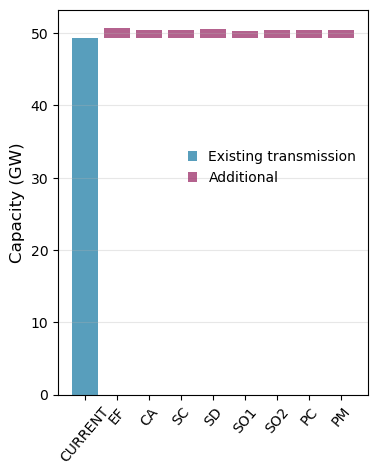

In [36]:
scenarios_plot = ['Current', 'EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

expanded_capacities = {
    'Current': PM_fixed_transmission_cap,
    'EF': EF_expand_transmission_cap,
    'CA': CA_expand_transmission_cap, 
    'SC': SC_expand_transmission_cap,
    'SD': SD_expand_transmission_cap,
    'SO1': SO1_expand_transmission_cap,
    'SO2': SO2_expand_transmission_cap,
    'PC': PC_expand_transmission_cap,
    'PM': PM_expand_transmission_cap
}

additional_capacities = {
    scenario: max(0, expanded_capacities[scenario] - expanded_capacities['Current']) 
    for scenario in scenarios_plot
}

# Prepare data for plotting
current_caps = expanded_capacities['Current']


fig, ax = plt.subplots(1,1, figsize=(4,5))

colors = ['#2E86AB', '#A23B72']  # Blue for current, Purple for additional
# Plot bars for each scenario
for i, scenario in enumerate(scenarios_plot):
    if scenario == 'Current':
        # Show only current capacity for the 'Current' scenario
        ax.bar(scenario, current_caps, color=colors[0], alpha=0.8, label='Existing transmission' if i == 0 else '')
    else:
        # Show only additional capacity, positioned at the top (starting from current_cap)
        additional_cap = additional_capacities[scenario]
        if additional_cap > 0:  # Only plot if there's additional capacity
            ax.bar(scenario, additional_cap, bottom=current_caps, color=colors[1], alpha=0.8, 
                   label='Additional' if i == 1 else '')

ax.set_ylabel('Capacity (GW)', fontsize=12)
ax.set_xticklabels([s.upper() for s in scenarios_plot], fontsize=10)
ax.legend(borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.4, 0.65))
ax.tick_params(axis='x', rotation=50)
ax.grid(axis='y', alpha=0.3)




In [37]:
additional_capacities

{'Current': 0,
 'EF': 1.379623564941248,
 'CA': 1.09494059111978,
 'SC': 1.0729021554218363,
 'SD': 1.1876809724779918,
 'SO1': 1.016987196280077,
 'SO2': 1.1403693289945451,
 'PC': 1.0953492964081306,
 'PM': 1.1773726201034336}

In [61]:
cap_pies_fractions_expand

{('EF', 'NO020'): 0.020250211689418825,
 ('EF', 'NO060'): 0.07716642637553224,
 ('EF', 'NO071'): 0.08754561787213197,
 ('EF', 'NO072'): 0.04655230594012241,
 ('EF', 'NO073'): 0.017256473425138526,
 ('EF', 'NO081'): 0.0080581382023671,
 ('EF', 'NO083'): 0.05691887996688849,
 ('EF', 'NO084'): 0.00012004418208489116,
 ('EF', 'NO085'): 0.11371433778233375,
 ('EF', 'NO092'): 0.09737704878192126,
 ('EF', 'NO093'): 0.038421037373136305,
 ('EF', 'NO094'): 0.12541154794280954,
 ('EF', 'NO0A1'): 0.19713661289225612,
 ('EF', 'NO0A2'): 0.00710979087209334,
 ('EF', 'NO0A3'): 0.1069615267017654,
 ('SD', 'NO020'): 0.05307384780326557,
 ('SD', 'NO060'): 0.11807800048915895,
 ('SD', 'NO071'): 0.05391198782263145,
 ('SD', 'NO072'): 0.07501501359859006,
 ('SD', 'NO073'): 0.021852981805845835,
 ('SD', 'NO081'): 0.004105786673768583,
 ('SD', 'NO083'): 0.02853552171522044,
 ('SD', 'NO084'): 0.0,
 ('SD', 'NO085'): 0.10133900070258002,
 ('SD', 'NO092'): 0.12098202493775673,
 ('SD', 'NO093'): 0.040607791688723

/tmp/ipykernel_2053585/1493926139.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid


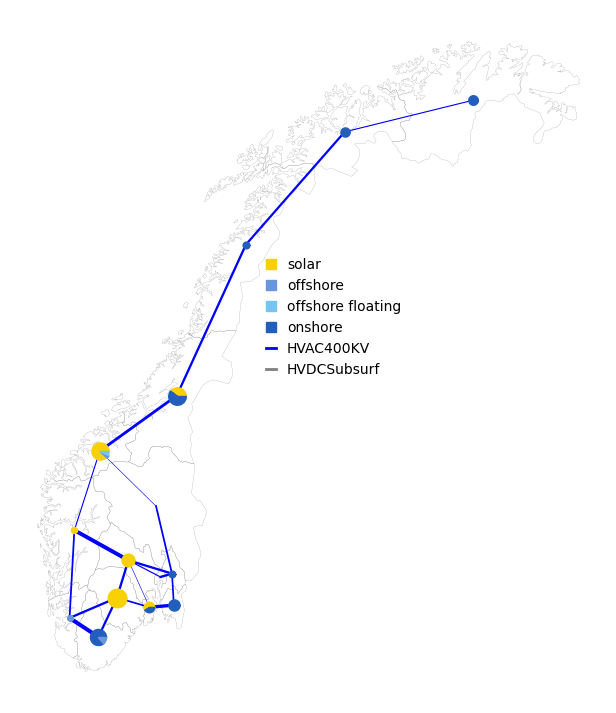

In [347]:
#Individual Plots for optim and cumulative case. only need to change the data inputs.

from matplotlib.lines import Line2D
fig, ax = plt.subplots(1,1, figsize=(9,9))

cent = Norway.centroid
Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.1, color='black', alpha=0.7)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc',
}

# offset_dict = {
#     'NO020': [0, 0],
#     'NO060': [0.2, 0],
#     'NO071': [0, 0],
#     'NO072': [0, 0],
#     'NO073': [-1, 0],
#     'NO081': [0, 0],
#     'NO083': [0.1, -0.35],
#     'NO084': [0.5, 0.3],
#     'NO085': [-0.8, 0.3],
#     'NO092': [0, 0],
#     'NO093': [0, 0],
#     'NO094': [0, 0.2],
#     'NO0A1': [-0.8, 0.05],
#     'NO0A2': [0, 0],
#     'NO0A3': [0, 0],
    
# }


offset_dict = {
    'NO020': [0, 0],
    'NO060': [0, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [0, 0],
    'NO081': [0, 0],
    'NO083': [0, 0],
    'NO084': [0, 0],
    'NO085': [0, 0],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0],
    'NO0A1': [0, 0],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
    
}



legend_entries = []
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore',
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 30
trans_HVACcolor = 'blue'
subs_color = 'black'

trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=2, label='HVAC400KV')
trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=2, linestyle='-',  label='HVDCSubsurf', alpha=0.5)

legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])

for (scenario, zone), values in cap_pies_fixed.items():
    if scenario == 'PM':
        wedges, labels = values
        for wedge, label in zip(wedges, labels): 
            color = color_mapping[label.get_text()]
            vertices = wedge.get_path().vertices.tolist()
            size = 1000 * cap_pies_fractions_fixed[(scenario, zone)]
            offset_x, offset_y = offset_dict[zone]
            ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                       s=size, zorder=100,
                       facecolor = color)

ax.legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.42, 0.65))
ax.axis('off')
#trans_HVDCcolor = 'red'

for i in [['NO073', 'NO072'], ['NO072', 'NO071'], ['NO071', 'NO060'], ['NO020', 'NO060'], ['NO060', 'NO0A3'], ['NO0A3', 'NO020'], ['NO0A3', 'NO0A2'], ['NO020', 'NO084'], ['NO0A2', 'NO085'], ['NO0A2', 'NO0A1'], ['NO085', 'NO094'], ['NO085', 'NO093'], ['NO085', 'NO084'],['NO085', 'NO081'], ['NO0A1', 'NO094'], ['NO0A1', 'NO092'], ['NO084', 'NO083'], ['NO084', 'NO081'], ['NO094', 'NO093'], ['NO094', 'NO092'], ['NO093', 'NO083']]:
    
    HVAC_cap = (fixed_transmission_cap.query("exclusions == 'PM' and Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                        .values[0][0])
    subsurf_cap = (fixed_transmission_cap.query("exclusions == 'PM' and Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                        .values[1][0])
    if subsurf_cap > 0.001:
        plt.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*fixed_transmission_cap.query("exclusions == 'PM' and Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            .values[1][0]/PM_fixed_transmission_cap), color=subs_color, linestyle='-', alpha=0.5)
    plt.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
             linewidth=(linewidth*fixed_transmission_cap.query("exclusions == 'PM' and Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                        .values[0][0]/PM_fixed_transmission_cap), color=trans_HVACcolor)        


#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/Electricity_allocation_map_optim.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/Electricity_allocation_map_optim.png', dpi=300, transparent=True, bbox_inches='tight')


plt.show()


In [100]:
scenarios

['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

/tmp/ipykernel_2053585/1477239897.py:85: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_2053585/1477239897.py:85: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_2053585/1477239897.py:85: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_2053585/1477239897.py:85: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centr

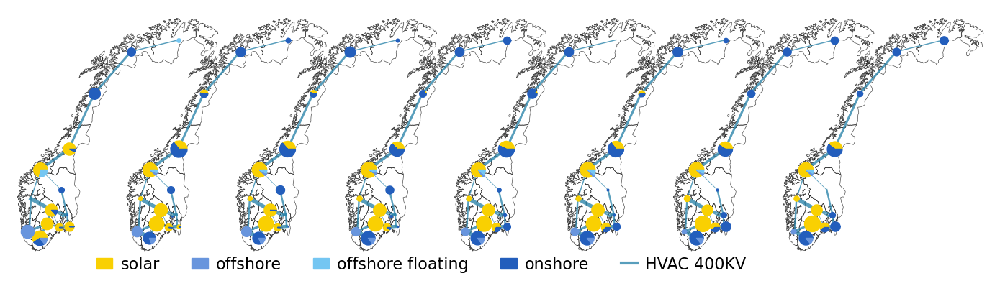

In [403]:
#cap_pies_fractions_fixed
#cap_pies_fixed 
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
scenario_titles = {
    'EF': 'EF',
    'CA': 'CA', 
    'SC': 'SC',
    'SD': 'SD',
    'SO1': 'SO1',
    'SO2': 'SO2',
    'PC': 'PC',
    'PM': 'PM',    
}

fig, axes = plt.subplots(1, 8, figsize=(14, 5))
axes = axes.flatten()

#axes[7].axis('off')

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc',
}

# Short labels for legend
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore',
}

transmission_lines = [
    ['NO073', 'NO072'], ['NO072', 'NO071'], ['NO071', 'NO060'], 
    ['NO060', 'NO0A3'], ['NO0A3', 'NO020'], ['NO0A3', 'NO0A2'], 
    ['NO020', 'NO084'], ['NO0A2', 'NO085'], ['NO0A2', 'NO0A1'], 
    ['NO085', 'NO094'], ['NO085', 'NO093'], ['NO085', 'NO084'],
    ['NO085', 'NO081'], ['NO0A1', 'NO094'], ['NO0A1', 'NO092'], 
    ['NO084', 'NO083'], ['NO084', 'NO081'], ['NO094', 'NO093'], 
    ['NO094', 'NO092'], ['NO093', 'NO083'], ['NO020', 'NO060'], 
]

scenario_transmission_caps = {
    'EF': EF_fixed_transmission_cap,
    'CA': CA_fixed_transmission_cap,
    'SC': SC_fixed_transmission_cap,
    'SD': SD_fixed_transmission_cap,
    'SO1': SO1_fixed_transmission_cap,
    'SO2': SO2_fixed_transmission_cap,
    'PC': PC_fixed_transmission_cap,
    'PM': PM_fixed_transmission_cap,
}

linewidth = 40
trans_HVACcolor = '#2E86AB'  # Better blue color
subs_color = 'black'       # Better contrast color


offset_dict = {
    'NO020': [0, 0],
    'NO060': [0, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [0, 0],
    'NO081': [0, 0],
    'NO083': [0.2, 0],
    'NO084': [0, 0],
    'NO085': [0, 0],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0],
    'NO0A1': [-0.2, 0],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
    
}



# Create plots for each scenario
for idx, scenario in enumerate(scenarios):
    ax = axes[idx]
    cent = Norway.centroid
    
    # Plot Norway boundary
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black', alpha=0.7)
    
    # Plot capacity pie charts for each zone
    for (scen, zone), values in cap_pies_fixed.items():
        if scen == scenario:
            wedges, labels = values
            for wedge, label in zip(wedges, labels): 
                color = color_mapping[label.get_text()]
                vertices = wedge.get_path().vertices.tolist()
                size = 1400 * cap_pies_fractions_fixed[(scenario, zone)]  # Slightly larger for visibility
                offset_x, offset_y = offset_dict[zone]
                ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                          s=size, zorder=100, facecolor=color)

    
    for line in transmission_lines:
        zone1, zone2 = line[0], line[1]
        
        # Get transmission capacities for this line
        hvac_cap = fixed_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[0][0]
        subsurf_cap = fixed_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[1][0]
            # Plot subsurface line if capacity > threshold
        if subsurf_cap > 0.00001:
            line_width_sub = linewidth * subsurf_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_sub, color=subs_color, linestyle='-', 
                   alpha=0.6, zorder=50)
            
            # Plot HVAC line
        if hvac_cap > 0.00001:
            line_width_hvac = linewidth * hvac_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_hvac, color=trans_HVACcolor, 
                   alpha=0.8, zorder=60)
    #ax.set_title(scenario_titles[scenario], fontsize=14)
    ax.axis('off')
    

# Create comprehensive legend
legend_entries = []
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

# Add transmission line legend
trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=3, 
                          label='HVAC 400KV', alpha=0.8)
#trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=3, 
#                             linestyle='-', label='HVDC Subsurface', alpha=0.6)

#legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])
legend_entries.extend([trans_legend_HVAC])

#fig.legend(handles=legend_entries, 
#         borderaxespad=0,frameon=False,fontsize=11, 
#         bbox_to_anchor=(0.87, 0.3), ncol=1, labelspacing=1,
#        handlelength=1, handletextpad=0.5)

#legend_ax.axis('off')


fig.legend(handles=legend_entries, 
         borderaxespad=0,frameon=False,fontsize=16, 
         bbox_to_anchor=(0.75, 0.18), ncol=6, labelspacing=1,
        handlelength=1, handletextpad=0.5)

fig.subplots_adjust(wspace=-0.82,  hspace=0, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.tight_layout(rect=[0, 0, 1, 0.99])
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/caps_spatial_fixed8.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/caps_spatial_fixedposter.png', dpi=300, transparent=True, bbox_inches='tight')



/tmp/ipykernel_2053585/2354841889.py:83: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_2053585/2354841889.py:83: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_2053585/2354841889.py:83: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_2053585/2354841889.py:83: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centr

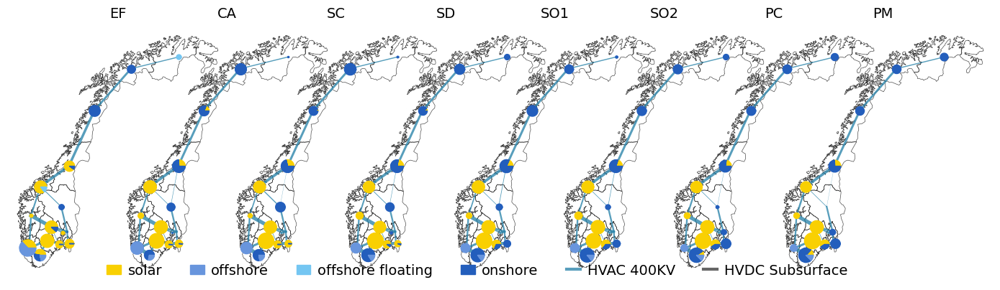

In [128]:
#cap_pies_fractions_expand
#cap_pies_expandable
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
scenario_titles = {
    'EF': 'EF',
    'CA': 'CA', 
    'SC': 'SC',
    'SD': 'SD',
    'SO1': 'SO1',
    'SO2': 'SO2',
    'PC': 'PC',
    'PM': 'PM',    
}

fig, axes = plt.subplots(1, 8, figsize=(14, 5))
axes = axes.flatten()


color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc',
}

# Short labels for legend
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore',
}

transmission_lines = [
    ['NO073', 'NO072'], ['NO072', 'NO071'], ['NO071', 'NO060'], 
    ['NO060', 'NO0A3'], ['NO0A3', 'NO020'], ['NO0A3', 'NO0A2'], 
    ['NO020', 'NO084'], ['NO0A2', 'NO085'], ['NO0A2', 'NO0A1'], 
    ['NO085', 'NO094'], ['NO085', 'NO093'], ['NO085', 'NO084'],
    ['NO085', 'NO081'], ['NO0A1', 'NO094'], ['NO0A1', 'NO092'], 
    ['NO084', 'NO083'], ['NO084', 'NO081'], ['NO094', 'NO093'], 
    ['NO094', 'NO092'], ['NO093', 'NO083'], ['NO020', 'NO060'],
]

scenario_transmission_caps = {
    'EF': EF_expand_transmission_cap,
    'CA': CA_expand_transmission_cap,
    'SC': SC_expand_transmission_cap,
    'SD': SD_expand_transmission_cap,
    'SO1': SO1_expand_transmission_cap,
    'SO2': SO2_expand_transmission_cap,
    'PC': PC_expand_transmission_cap,
    'PM': PM_expand_transmission_cap
}

linewidth = 40
trans_HVACcolor = '#2E86AB'  # Better blue color
subs_color = 'black'       # Better contrast color


offset_dict = {
    'NO020': [0, 0],
    'NO060': [0, 0],
    'NO071': [0, 0],
    'NO072': [0, 0],
    'NO073': [0, 0],
    'NO081': [0, 0],
    'NO083': [0.2, 0],
    'NO084': [0, 0],
    'NO085': [0, 0],
    'NO092': [0, 0],
    'NO093': [0, 0],
    'NO094': [0, 0],
    'NO0A1': [-0.2, 0],
    'NO0A2': [0, 0],
    'NO0A3': [0, 0],
    
}


# Create plots for each scenario
for idx, scenario in enumerate(scenarios):
    ax = axes[idx]
    cent = Norway.centroid
    
    # Plot Norway boundary
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black', alpha=0.7)
    
    # Plot capacity pie charts for each zone
    for (scen, zone), values in cap_pies_expandable.items():
        if scen == scenario:
            wedges, labels = values
            for wedge, label in zip(wedges, labels): 
                color = color_mapping[label.get_text()]
                vertices = wedge.get_path().vertices.tolist()
                size = 1400 * cap_pies_fractions_expand[(scenario, zone)]  # Slightly larger for visibility
                offset_x, offset_y = offset_dict[zone]
                ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                          s=size, zorder=100, facecolor=color)

    
    for line in transmission_lines:
        zone1, zone2 = line[0], line[1]
        
        # Get transmission capacities for this line
        hvac_cap = expand_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[0][0]
        subsurf_cap = expand_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[1][0]
            # Plot subsurface line if capacity > threshold
        if subsurf_cap > 0.00001:
            print(subsurf_cap)
            line_width_sub = linewidth * subsurf_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_sub, color=subs_color, linestyle='-', 
                   alpha=0.6, zorder=50)
            
            # Plot HVAC line
        if hvac_cap > 0.00001:
            line_width_hvac = linewidth * hvac_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_hvac, color=trans_HVACcolor, 
                   alpha=0.8, zorder=60)
    ax.set_title(scenario_titles[scenario], fontsize=14)
    ax.axis('off')
    

# Create comprehensive legend
legend_entries = []
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

# Add transmission line legend
trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=3, 
                          label='HVAC 400KV', alpha=0.8)
trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=3, 
                             linestyle='-', label='HVDC Subsurface', alpha=0.6)

legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])


fig.legend(handles=legend_entries, 
         borderaxespad=0,frameon=False,fontsize=14, 
         bbox_to_anchor=(0.85, 0.18), ncol=6, labelspacing=1,
        handlelength=1, handletextpad=0.5)


fig.subplots_adjust(wspace=-0.82,  hspace=0, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/caps_spatial_expand8.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/caps_spatial_expand8T.png', dpi=300, transparent=True, bbox_inches='tight')


#plt.tight_layout(rect=[0, 0, 1, 0.99])



In [ ]:
replacements = {
    'NO001': 'NO083', # Østfold
    'NO002': 'NO084', # Akershus
    'NO003': 'NO081', # Oslo
    'NO006': 'NO085', # Buskerud
    'NO007': 'NO093', #Vestfold
    'NO008': 'NO094', # Telemark
    'NO011': 'NO0A1', # Rogaland
    'NO015': 'NO0A3', # Møre og Romsdal 	
    'NO019': 'NO072', # Troms
    'NO020': 'NO073', # Finmark
    'NO073': 'NO020', # Innlandet
    'NO060': 'NO060', # Trøndelag
    'NO071': 'NO071', # Nordland
    'NO092': 'NO092', # Agder
    'NO0A2': 'NO0A2', # Vestland
}

/tmp/ipykernel_832553/3788393203.py:55: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/3788393203.py:55: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/3788393203.py:55: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/3788393203.py:55: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid


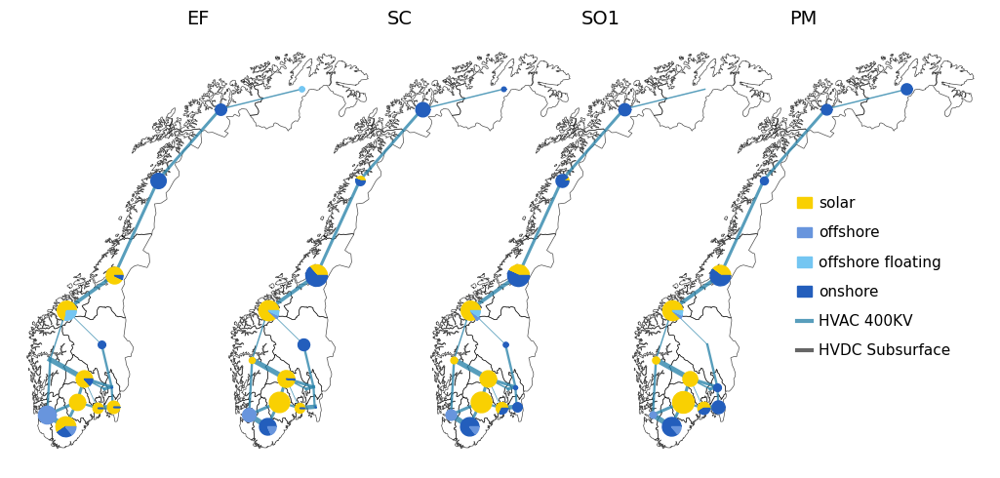

In [173]:
#cap_pies_fractions_fixed
#cap_pies_fixed 
scenarios = ['EF', 'SC', 'SO1','PM']
scenario_titles = {
    'EF': 'EF',
    'SC': 'SC', 
    'SO1': 'SO1',
    'PM': 'PM',    
}

fig, axes = plt.subplots(1, 4, figsize=(12, 5))
axes = axes.flatten()

#axes[7].axis('off')

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc',
}

# Short labels for legend
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore',
}

transmission_lines = [
    ['NO073', 'NO072'], ['NO072', 'NO071'], ['NO071', 'NO060'], 
    ['NO060', 'NO0A3'], ['NO0A3', 'NO020'], ['NO0A3', 'NO0A2'], 
    ['NO020', 'NO084'], ['NO0A2', 'NO085'], ['NO0A2', 'NO0A1'], 
    ['NO085', 'NO094'], ['NO085', 'NO093'], ['NO085', 'NO084'],
    ['NO085', 'NO081'], ['NO0A1', 'NO094'], ['NO0A1', 'NO092'], 
    ['NO084', 'NO083'], ['NO084', 'NO081'], ['NO094', 'NO093'], 
    ['NO094', 'NO092'], ['NO093', 'NO083'], ['NO020', 'NO060'], 
]

scenario_transmission_caps = {
    'EF': EF_fixed_transmission_cap,
    'SC': SC_fixed_transmission_cap,
    'SO1': SO1_fixed_transmission_cap,
    'PM': PM_fixed_transmission_cap,
}

linewidth = 40
trans_HVACcolor = '#2E86AB'  # Better blue color
subs_color = 'black'       # Better contrast color

# Create plots for each scenario
for idx, scenario in enumerate(scenarios):
    ax = axes[idx]
    cent = Norway.centroid
    
    # Plot Norway boundary
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black', alpha=0.7)
    
    # Plot capacity pie charts for each zone
    for (scen, zone), values in cap_pies_fixed.items():
        if scen == scenario:
            wedges, labels = values
            for wedge, label in zip(wedges, labels): 
                color = color_mapping[label.get_text()]
                vertices = wedge.get_path().vertices.tolist()
                size = 1400 * cap_pies_fractions_fixed[(scenario, zone)]  # Slightly larger for visibility
                offset_x, offset_y = offset_dict[zone]
                ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                          s=size, zorder=100, facecolor=color)

    
    for line in transmission_lines:
        zone1, zone2 = line[0], line[1]
        
        # Get transmission capacities for this line
        hvac_cap = fixed_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[0][0]
        subsurf_cap = fixed_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[1][0]
            # Plot subsurface line if capacity > threshold
        if subsurf_cap > 0.00001:
            print(subsurf_cap)
            line_width_sub = linewidth * subsurf_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_sub, color=subs_color, linestyle='-', 
                   alpha=0.6, zorder=50)
            
            # Plot HVAC line
        if hvac_cap > 0.00001:
            line_width_hvac = linewidth * hvac_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_hvac, color=trans_HVACcolor, 
                   alpha=0.8, zorder=60)
    ax.set_title(scenario_titles[scenario], fontsize=14)
    ax.axis('off')
    

# Create comprehensive legend
legend_entries = []
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

# Add transmission line legend
trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=3, 
                          label='HVAC 400KV', alpha=0.8)
trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=3, 
                             linestyle='-', label='HVDC Subsurface', alpha=0.6)

legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])


fig.legend(handles=legend_entries, 
         borderaxespad=0,frameon=False,fontsize=11, 
         bbox_to_anchor=(0.89, 0.6), ncol=1, labelspacing=1,
        handlelength=1, handletextpad=0.5)


#legend_ax.axis('off')
fig.subplots_adjust(wspace=-0.85,  hspace=0, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.tight_layout(rect=[0, 0, 1, 0.99])
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/plots_forests/modelling results/caps_spatial_fixed.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/plots_forests/modelling results/caps_spatial_fixedT.png', dpi=300, transparent=True, bbox_inches='tight')



/tmp/ipykernel_832553/2215966319.py:54: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/2215966319.py:54: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/2215966319.py:54: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/2215966319.py:54: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid


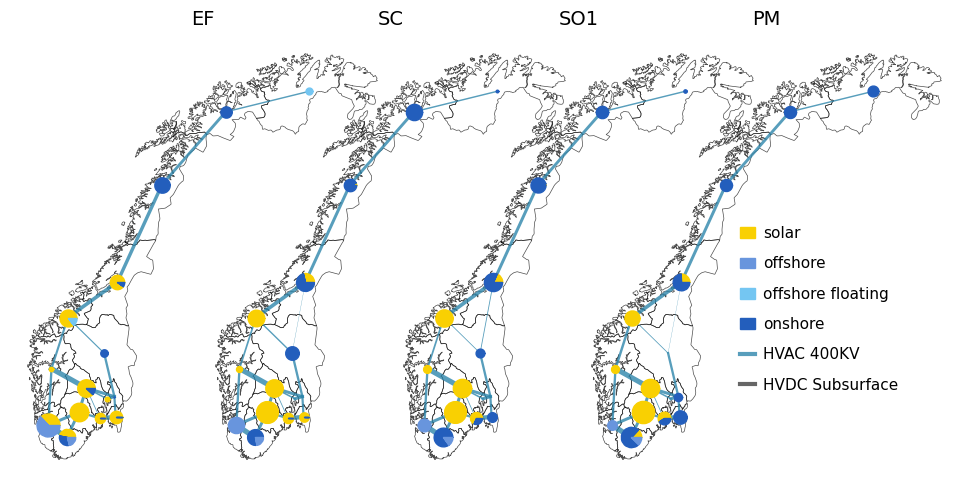

In [175]:
#cap_pies_fractions_expand
#cap_pies_expandable
scenarios = ['EF', 'SC', 'SO1','PM']
scenario_titles = {
    'EF': 'EF',
    'SC': 'SC', 
    'SO1': 'SO1',
    'PM': 'PM',    
}

fig, axes = plt.subplots(1, 4, figsize=(10, 5))
axes = axes.flatten()


color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

# Short labels for legend
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore',
}

transmission_lines = [
    ['NO073', 'NO072'], ['NO072', 'NO071'], ['NO071', 'NO060'], 
    ['NO060', 'NO0A3'], ['NO0A3', 'NO020'], ['NO0A3', 'NO0A2'], 
    ['NO020', 'NO084'], ['NO0A2', 'NO085'], ['NO0A2', 'NO0A1'], 
    ['NO085', 'NO094'], ['NO085', 'NO093'], ['NO085', 'NO084'],
    ['NO085', 'NO081'], ['NO0A1', 'NO094'], ['NO0A1', 'NO092'], 
    ['NO084', 'NO083'], ['NO084', 'NO081'], ['NO094', 'NO093'], 
    ['NO094', 'NO092'], ['NO093', 'NO083'], ['NO020', 'NO060'],
]

scenario_transmission_caps = {
    'EF': EF_expand_transmission_cap,
    'SC': SC_expand_transmission_cap,
    'SO1': SO1_expand_transmission_cap,
    'PM': PM_expand_transmission_cap
}

linewidth = 40
trans_HVACcolor = '#2E86AB'
subs_color = 'black'

# Create plots for each scenario
for idx, scenario in enumerate(scenarios):
    ax = axes[idx]
    cent = Norway.centroid
    
    # Plot Norway boundary
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black', alpha=0.7)
    
    # Plot capacity pie charts for each zone
    for (scen, zone), values in cap_pies_expandable.items():
        if scen == scenario:
            wedges, labels = values
            for wedge, label in zip(wedges, labels): 
                color = color_mapping[label.get_text()]
                vertices = wedge.get_path().vertices.tolist()
                size = 1400 * cap_pies_fractions_expand[(scenario, zone)]  # Slightly larger for visibility
                offset_x, offset_y = offset_dict[zone]
                ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                          s=size, zorder=100, facecolor=color)

    
    for line in transmission_lines:
        zone1, zone2 = line[0], line[1]
        
        # Get transmission capacities for this line
        hvac_cap = expand_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[0][0]
        subsurf_cap = expand_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[1][0]
            # Plot subsurface line if capacity > threshold
        if subsurf_cap > 0.00001:
            print(subsurf_cap)
            line_width_sub = linewidth * subsurf_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_sub, color=subs_color, linestyle='-', 
                   alpha=0.6, zorder=50)
            
            # Plot HVAC line
        if hvac_cap > 0.00001:
            line_width_hvac = linewidth * hvac_cap / scenario_transmission_caps[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_hvac, color=trans_HVACcolor, 
                   alpha=0.8, zorder=60)
    ax.set_title(scenario_titles[scenario], fontsize=14)
    ax.axis('off')
    

# Create comprehensive legend
legend_entries = []
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

# Add transmission line legend
trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=3, 
                          label='HVAC 400KV', alpha=0.8)
trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=3, 
                             linestyle='-', label='HVDC Subsurface', alpha=0.6)

legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])


fig.legend(handles=legend_entries, 
         borderaxespad=0,frameon=False,fontsize=11, 
         bbox_to_anchor=(0.92, 0.55), ncol=1, labelspacing=1,
        handlelength=1, handletextpad=0.5)


fig.subplots_adjust(wspace=-0.85,  hspace=0, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/plots_forests/modelling results/caps_spatial_expand.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/plots_forests/modelling results/caps_spatial_expandT.png', dpi=300, transparent=True, bbox_inches='tight')



#plt.tight_layout(rect=[0, 0, 1, 0.99])



/tmp/ipykernel_832553/3253610482.py:59: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/3253610482.py:59: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/3253610482.py:59: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid
/tmp/ipykernel_832553/3253610482.py:59: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid


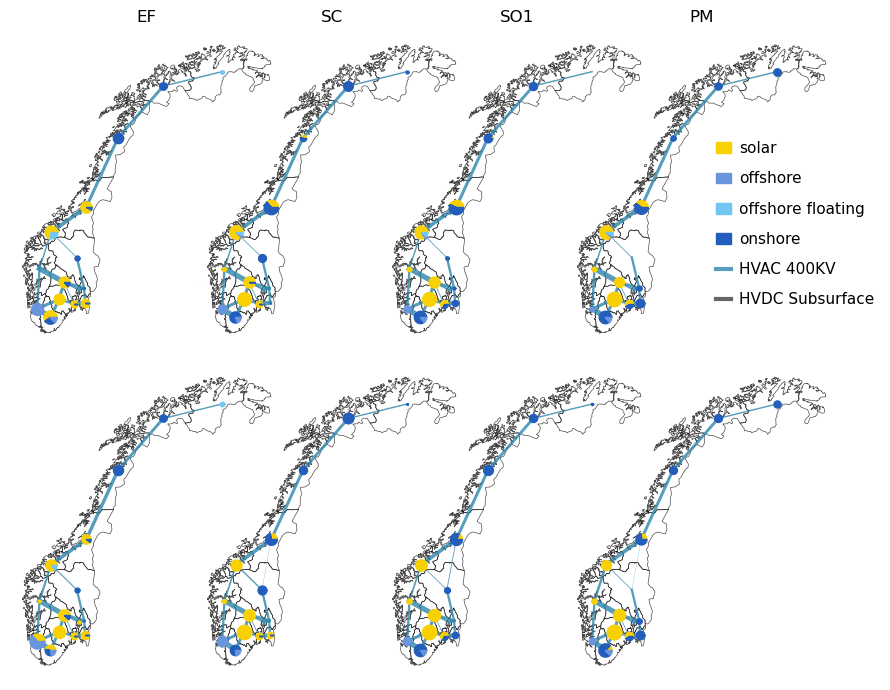

In [181]:
# Combined 2x4 plot for fixed and expandable transmission
scenarios = ['EF', 'SC', 'SO1','PM']
scenario_titles = {
    'EF': 'EF',
    'SC': 'SC', 
    'SO1': 'SO1',
    'PM': 'PM',    
}

# Create 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(12, 7))

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc',
}

# Short labels for legend
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore',
}

transmission_lines = [
    ['NO073', 'NO072'], ['NO072', 'NO071'], ['NO071', 'NO060'], 
    ['NO060', 'NO0A3'], ['NO0A3', 'NO020'], ['NO0A3', 'NO0A2'], 
    ['NO020', 'NO084'], ['NO0A2', 'NO085'], ['NO0A2', 'NO0A1'], 
    ['NO085', 'NO094'], ['NO085', 'NO093'], ['NO085', 'NO084'],
    ['NO085', 'NO081'], ['NO0A1', 'NO094'], ['NO0A1', 'NO092'], 
    ['NO084', 'NO083'], ['NO084', 'NO081'], ['NO094', 'NO093'], 
    ['NO094', 'NO092'], ['NO093', 'NO083'], ['NO020', 'NO060'], 
]

scenario_transmission_caps_fixed = {
    'EF': EF_fixed_transmission_cap,
    'SC': SC_fixed_transmission_cap,
    'SO1': SO1_fixed_transmission_cap,
    'PM': PM_fixed_transmission_cap,
}

scenario_transmission_caps_expand = {
    'EF': EF_expand_transmission_cap,
    'SC': SC_expand_transmission_cap,
    'SO1': SO1_expand_transmission_cap,
    'PM': PM_expand_transmission_cap
}

linewidth = 40
trans_HVACcolor = '#2E86AB'
subs_color = 'black'

# Row 0: Fixed transmission
for idx, scenario in enumerate(scenarios):
    ax = axes[0, idx]
    cent = Norway.centroid
    
    # Plot Norway boundary
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black', alpha=0.7)
    
    # Plot capacity pie charts for each zone
    for (scen, zone), values in cap_pies_fixed.items():
        if scen == scenario:
            wedges, labels = values
            for wedge, label in zip(wedges, labels): 
                color = color_mapping[label.get_text()]
                vertices = wedge.get_path().vertices.tolist()
                size = 600 * cap_pies_fractions_fixed[(scenario, zone)]
                offset_x, offset_y = offset_dict[zone]
                ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                          s=size, zorder=100, facecolor=color)
    
    # Plot transmission lines
    for line in transmission_lines:
        zone1, zone2 = line[0], line[1]
        
        hvac_cap = fixed_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[0][0]
        subsurf_cap = fixed_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[1][0]
        
        if subsurf_cap > 0.00001:
            line_width_sub = linewidth * subsurf_cap / scenario_transmission_caps_fixed[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_sub, color=subs_color, linestyle='-', 
                   alpha=0.6, zorder=50)
        
        if hvac_cap > 0.00001:
            line_width_hvac = linewidth * hvac_cap / scenario_transmission_caps_fixed[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_hvac, color=trans_HVACcolor, 
                   alpha=0.8, zorder=60)
    
    ax.set_title(scenario_titles[scenario], fontsize=12)
    ax.axis('off')

# Row 1: Expandable transmission
for idx, scenario in enumerate(scenarios):
    ax = axes[1, idx]
    cent = Norway.centroid
    
    # Plot Norway boundary
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black', alpha=0.7)
    
    # Plot capacity pie charts for each zone
    for (scen, zone), values in cap_pies_expandable.items():
        if scen == scenario:
            wedges, labels = values
            for wedge, label in zip(wedges, labels): 
                color = color_mapping[label.get_text()]
                vertices = wedge.get_path().vertices.tolist()
                size = 600 * cap_pies_fractions_expand[(scenario, zone)]
                offset_x, offset_y = offset_dict[zone]
                ax.scatter(cent.x[zone]+offset_x, cent.y[zone]+offset_y, marker=(vertices),
                          s=size, zorder=100, facecolor=color)
    
    # Plot transmission lines
    for line in transmission_lines:
        zone1, zone2 = line[0], line[1]
        
        hvac_cap = expand_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[0][0]
        subsurf_cap = expand_transmission_cap.query(
            f"exclusions == '{scenario}' and Zone_1 == '{zone1}' and Zone_2 == '{zone2}'"
        ).values[1][0]
        
        if subsurf_cap > 0.00001:
            line_width_sub = linewidth * subsurf_cap / scenario_transmission_caps_expand[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_sub, color=subs_color, linestyle='-', 
                   alpha=0.6, zorder=50)
        
        if hvac_cap > 0.00001:
            line_width_hvac = linewidth * hvac_cap / scenario_transmission_caps_expand[scenario]
            ax.plot([cent[zone1].x, cent[zone2].x], [cent[zone1].y, cent[zone2].y],
                   linewidth=line_width_hvac, color=trans_HVACcolor, 
                   alpha=0.8, zorder=60)
    
    ax.axis('off')


# Create comprehensive legend
legend_entries = []
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

# Add transmission line legend
trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=3, 
                          label='HVAC 400KV', alpha=0.8)
trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=3, 
                             linestyle='-', label='HVDC Subsurface', alpha=0.6)

legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])

fig.legend(handles=legend_entries, 
          borderaxespad=0, frameon=False, fontsize=11, 
          bbox_to_anchor=(0.88, 0.8), ncol=1, labelspacing=1,
          handlelength=1, handletextpad=0.5)

fig.subplots_adjust(wspace=-0.85, hspace=0.1, left=0.05, right=0.90, top=0.95, bottom=0.05)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/caps_spatial_representative.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/caps_spatial_representativeT.png', dpi=300, transparent=True, bbox_inches='tight')


plt.show()

In [182]:
scenarios

['EF', 'SC', 'SO1', 'PM']

In [185]:
SD_fixed_transmission_cap

49.314223699999985

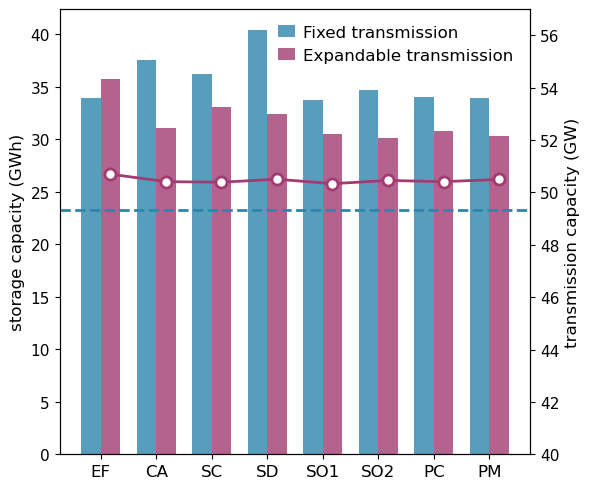

In [465]:
fig, ax1 = plt.subplots(figsize=(6, 5))
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
pivot_df_custom_store = pivot_storetot[['DefaultYes', 'LOWOH']].reindex(scenarios)

fixed_transmission = PM_fixed_transmission_cap  # Same for all scenarios
expanded_transmissions = [
    EF_expand_transmission_cap,
    CA_expand_transmission_cap,
    SC_expand_transmission_cap,
    SD_expand_transmission_cap,
    SO1_expand_transmission_cap,
    SO2_expand_transmission_cap,
    PC_expand_transmission_cap,
    PM_expand_transmission_cap
]



# Plot storage data (left y-axis)
x_pos = np.arange(len(scenarios))
width = 0.35

bars1 = ax1.bar(x_pos - width/2, pivot_df_custom_store[['DefaultYes']].values.flatten(), width, 
                color='#2E86AB', alpha=0.8, label='Fixed transmission')
bars2 = ax1.bar(x_pos + width/2, pivot_df_custom_store[['LOWOH']].values.flatten(), width,
                color='#A23B72', alpha=0.8, label='Expandable transmission')

ax1.set_xticks(x_pos)
ax1.set_xticklabels([s.upper() for s in scenarios], fontsize=12)
ax1.set_ylabel('storage capacity (GWh)', fontsize=12)
ax1.tick_params(axis='y', labelcolor='black', labelsize=11)

# Create second y-axis for transmission
ax2 = ax1.twinx()

# Plot fixed transmission (stars)
# fixed_trans_values = [fixed_transmission] * len(scenarios)
# ax2.scatter(x_pos- width/2, fixed_trans_values, marker='*', s=150, color='#2E86AB', 
#            zorder=10, label='fixed transmission')

ax2.axhline(y=fixed_transmission, color='#2E86AB', linestyle='--', linewidth=2)

ax2.plot(x_pos+ width/2, expanded_transmissions, 'o-', color='#A23B72', linewidth=2, 
         markersize=8, markerfacecolor='white', markeredgecolor='#A23B72', 
         markeredgewidth=2, zorder=9, label='expandable transmission')

# Right y-axis settings
ax2.set_ylabel('transmission capacity (GW)', fontsize=12, color='black')
ax2.set_ylim(40, 57)  # Start from 40 as suggested
ax2.tick_params(axis='y', labelcolor='black', labelsize=11)

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

ax1.legend(lines1, labels1, bbox_to_anchor=(0.45, 0.98), 
          ncol=1, borderaxespad=0., frameon=False, 
          fontsize=12, handlelength=1, handletextpad=0.5)


plt.tight_layout()


#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/store_trans.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/sotre_transT.png', dpi=300, transparent=True, bbox_inches='tight')




In [79]:
max_capacities = makenice(found_scenarios, "eq_area_max")

  0%|          | 0/16 [00:00<?, ?it/s]

In [80]:
max_capacities

maxarea
transmission exclusions technology  zone  region level_3           
DefaultYes   EF         HydroRoR    NO020 NO020  level     0.000000
                                                 lower         -inf
                                                 marginal  0.000000
                                                 scale     1.000000
                                                 upper          inf
...                                                             ...
             PM         Windonshore NO0A3 NO0A3  level     0.000001
                                                 lower         -inf
                                                 marginal  0.000000
                                                 scale     1.000000
                                                 upper     0.171600

[4700 rows x 1 columns]

In [83]:
cost_2024NOK

21.0

In [84]:
df_marginal = (max_capacities.loc[(slice(None), slice(None),
            ['Solar','Windonshore', 'Windoffshore','Windoffshorefloating'], slice(None),
                    slice(None), ['upper'])].droplevel(["region"]))*(cost_2024NOK)

In [85]:
df_marginal

maxarea
transmission exclusions technology           zone  level_3           
DefaultYes   EF         Solar                NO020 upper    4905.8520
                                             NO060 upper    3676.6800
                                             NO071 upper    2120.8320
                                             NO072 upper     512.1480
                                             NO081 upper      12.2640
...                                                               ...
             PM         Windoffshorefloating NO093 upper     450.3345
                                             NO094 upper      23.1210
                                             NO0A1 upper    2642.9655
                                             NO0A2 upper    1053.2655
                                             NO0A3 upper    7246.6275

[700 rows x 1 columns]

In [86]:
vre_gen = makenice(found_scenarios, "gen")

  0%|          | 0/16 [00:00<?, ?it/s]

In [87]:
vre_curt = makenice(found_scenarios, "curtailtot")

  0%|          | 0/16 [00:00<?, ?it/s]

In [25]:
vre_gen_filtered = vre_gen.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
             ['level'])]
vre_gen_filtered = vre_gen_filtered.groupby(["transmission","exclusions","technology"],observed=True).sum()

In [26]:
vre_gen_filtered

genamttot
transmission exclusions technology                              
DefaultYes   CA         Export                       8892.125077
                        HydroRes                    88783.638952
                        HydroRoR                    26188.942647
                        Import                       8892.125077
                        NaturalgasCCGTwithCCSnewOT      0.000000
...                                                          ...
LOWOH        SO2        NaturalgasOCGTnew               0.000000
                        Solar                       37072.867977
                        Windoffshore                33360.409754
                        Windoffshorefloating            0.001398
                        Windonshore                 76452.909128

[160 rows x 1 columns]

In [27]:
vre_curt

value
transmission exclusions vre                              
DefaultYes   EF         HydroRoR               399.114409
                        Solar                    0.000469
                        Windoffshore           374.703273
                        Windoffshorefloating    66.798580
                        Windonshore           1833.697180
...                                                   ...
             PM         HydroRoR                37.131868
                        Solar                    0.870802
                        Windoffshore             4.129901
                        Windoffshorefloating     6.565460
                        Windonshore           3772.991430

[80 rows x 1 columns]

In [294]:
max_capacities

maxarea
transmission exclusions technology  zone  region level_3           
DefaultYes   EF         HydroRoR    NO020 NO020  level     0.000000
                                                 lower         -inf
                                                 marginal  0.000000
                                                 scale     1.000000
                                                 upper          inf
...                                                             ...
             PM         Windonshore NO0A3 NO0A3  level     0.000001
                                                 lower         -inf
                                                 marginal  0.000000
                                                 scale     1.000000
                                                 upper     0.171600

[4700 rows x 1 columns]

In [293]:
df_marginal = (max_capacities.loc[(['DefaultYes'], ['SD'],
            ['Windonshore'], slice(None),
                    slice(None), ['marginal'])].droplevel(["region"]))*(cost_2024NOK)

In [580]:
def calculate_marginal_analysis(scenarios_list, transmission_type = 'DefaultYes', technology='Windonshore'):

    
    results = {}
    
    for scenario in scenarios_list:
        # Get marginal, upper, and optimal data
        df_marginal = (max_capacities.loc[([transmission_type], [scenario],
                    [technology], slice(None), slice(None), ['marginal'])]
                    .droplevel(["region"])) * cost_2024NOK
        
        df_upcap = (max_capacities.loc[([transmission_type], [scenario],
                    [technology], slice(None), slice(None), ['upper'])]
                    .droplevel(["region"]))
        
        df_optimal = (max_capacities.loc[([transmission_type], [scenario],
                    [technology], slice(None), slice(None), ['level'])]
                    .droplevel(["region"]))
        
        # Combine data
        df_analysis = df_marginal.reset_index()[['zone', 'maxarea']].copy()
        df_analysis.columns = ['zone', 'marginal']
        
        df_analysis = df_analysis.merge(df_optimal.reset_index()[['zone', 'maxarea']], 
                                       on='zone', how='left')
        df_analysis.columns = ['zone', 'marginal', 'optimal_capacity']
        
        df_analysis = df_analysis.merge(df_upcap.reset_index()[['zone', 'maxarea']], 
                                       on='zone', how='left')
        df_analysis.columns = ['zone', 'marginal', 'optimal_capacity', 'upper_limit']
        
        # Calculate constrained capacity and economic impact
        df_analysis['constrained_capacity'] = (df_analysis['upper_limit'] - 
                                              df_analysis['optimal_capacity'])
        df_analysis['economic_impact'] = (df_analysis['marginal'] * 
                                         df_analysis['constrained_capacity'])
        
        # Add scenario identifier
        df_analysis['scenario'] = scenario
        #df_analysis['transmission'] = transmission_type
        
        results[scenario] = df_analysis
    
    return results


In [581]:
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
results_dict = calculate_marginal_analysis(scenarios)

In [458]:
#(4000/((pivot_df_custom.reset_index().query("exclusions == 'PM'")['DefaultYes'].iloc[0])*1000))*100

2.637709010908666

In [48]:
gen_elec

3772.99143016425

In [46]:
sum_marginals

[4043.4225846286527,
 1527.439534673829,
 1356.9634271717669,
 1284.8032145561965,
 857.5608789284889,
 827.9227175969129,
 572.1551591450063,
 571.2616874990412]

In [582]:
sum_marginals = []
for scenario in scenarios:
    df = results_dict[scenario]
    sum_marginals.append(abs(df['marginal']).sum())
sum_marginals

[4043.4225846286527,
 1527.439534673829,
 1356.9634271717669,
 1284.8032145561965,
 857.5608789284889,
 827.9227175969129,
 572.1551591450063,
 571.2616874990412]

72.9621320102454
16.077513050040025
7.842584401707514
6.203529892323054
2.767142116933747
1.807676680039793
0.5580557490995854
1.2924083741743324


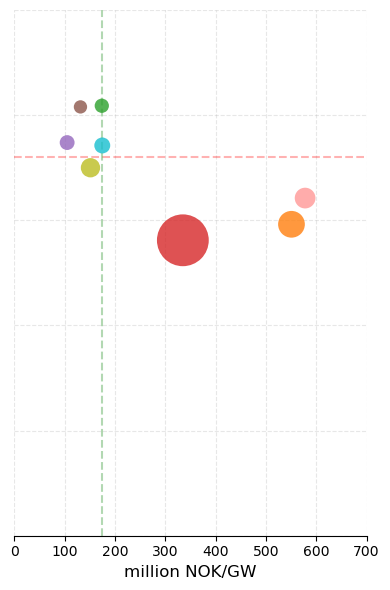

In [132]:
sum_marginals = []
sum_constrained = []
curt_rate = []
curt_gen_rate = []

scenario_colors = {
    'EF': '#d62728', 'CA': '#ff7f0e', 'SC': '#ff9896', 'SD': '#bcbd22',
    'SO1': '#17becf', 'SO2': '#9467bd', 'PC': '#8c564b', 'PM': '#2ca02c'
}

for scenario in scenarios:
    df = results_dict[scenario]
    sum_marginals.append(abs(df['marginal']).sum())
    sum_constrained.append(df['constrained_capacity'].sum())

        # Get generated electricity
    curt_elec = vre_curt.query(f"exclusions == '{scenario}' and transmission=='LOWOH' and vre=='Windoffshore'")['value'].sum()

    gen_elec = vre_gen_filtered.query(f"exclusions == '{scenario}' and transmission=='LOWOH' and technology=='Windoffshore'")['genamttot'].sum()
    
    # Get optimal capacity
    opt_cap = filtered_cap.query(f"exclusions == '{scenario}' and transmission=='LOWOH' and technology=='Windoffshore'")['gencaptot'].sum()
    
    # Calculate ratio (TWh/GW)
    ratio = curt_elec / opt_cap if opt_cap > 0 else 0
    print(ratio)
    ratio2 = gen_elec/opt_cap
    curt_rate.append(ratio)
    curt_gen_rate.append(ratio2)

# Normalize sizes for plotting (between min_size and max_size)
min_size = 100
max_size = 800
min_ratio = 1
max_ratio = 40
sizes = [(cf - min_ratio) / (max_ratio - min_ratio) * (max_size - min_size) + min_size 
         for cf in curt_rate]



# Create scatter plot
fig, ax = plt.subplots(1, 1, figsize=(4, 6))

median_x = np.median(sum_constrained)
median_y = np.median(sum_marginals) 

#ax.axhspan(median_y, ax.get_ylim()[1], xmin=0, xmax=0.5, alpha=0.05, color='red', zorder=0)
#ax.axhspan(0, median_y, xmin=0.5, xmax=1, alpha=0.05, color='green', zorder=0)


for i, scenario in enumerate(scenarios):
    ax.scatter(sum_marginals[i], sum_constrained[i], s=sizes[i], alpha=0.8, 
               color=scenario_colors[scenario], edgecolors='None', linewidth=0, 
               zorder=5)

# Labels and formatting
ax.set_xlabel('million NOK/GW', fontsize=12)
#ax.set_ylabel('unused available capacity (GW)', fontsize=12)


ax.grid(True, alpha=0.3, linestyle='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis='y', which='both', length=0)

ax.axhline(y=median_x, color='red', linestyle='--', alpha=0.3, linewidth=1.5)
ax.axvline(x=median_y, color='green', linestyle='--', alpha=0.3, linewidth=1.5)

# scenario_legend_elements = [
#     Line2D([0], [0], marker='o', color='w', markerfacecolor=scenario_colors[s], 
#            markersize=12, label=s) 
#     for s in scenarios
# ]
# scenario_legend = ax.legend(handles=scenario_legend_elements, 
#                           borderaxespad=0, frameon=False, handlelength=0.7, ncol=2,
#                           fontsize=10, bbox_to_anchor=(0.52, 0.38))


# size_legend_elements = [
#     Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
#            markersize=np.sqrt(100/np.pi), label=f'{min_ratio:.0f} TWh/GW'),
#     Line2D([0], [0], marker='o', color='w', markerfacecolor='gray',
#            markersize=np.sqrt(450/np.pi), label=f'{(min_ratio+max_ratio)/2:.0f} TWh/GW'),
#     Line2D([0], [0], marker='o', color='w', markerfacecolor='gray',
#            markersize=np.sqrt(800/np.pi), label=f'{max_ratio:.0f} TWh/GW')
# ]

# size_legend = ax.legend(handles=size_legend_elements, title='Curtailment rate',  #Realized capacity utilziation
#                      borderaxespad=0, frameon=False, handlelength=0.7,
#                           fontsize=10, bbox_to_anchor=(0.9, 0.75))
# ax.add_artist(scenario_legend)

ax.set_xlim(0, 700)  # Set limits based on the data
ax.set_ylim(0, 25) 
#ax.set_xticks(np.arange(0, 23, 3))  # Adjust tick positions for the x-axis
#ax.set_yticks(np.arange(0, 700, 50))
ax.set_yticklabels([])



plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/ratio/offshore_expand2.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/ratio/offshore_expand2T.png', dpi=300, transparent=True, bbox_inches='tight')



plt.show()

In [66]:
# Whether restrictions force better OR worse site selection and use the system generated electricity effeciently
sum_marginals

[4503.442447362218,
 1941.868890041419,
 1962.80328117699,
 1518.6475110155525,
 986.2261244444358,
 980.5112541801536,
 497.4669265015043,
 489.10749727575734]

In [ ]:
#EF not only restricts capacity but makes remaining deployment more expensive

In [71]:
sum_marginals

[4043.4225846286527,
 1527.439534673829,
 1356.9634271717669,
 1284.8032145561965,
 857.5608789284889,
 827.9227175969129,
 572.1551591450063,
 571.2616874990412]

In [131]:
curt_rate

[72.9621320102454,
 16.077513050040025,
 7.842584401707514,
 6.203529892323054,
 2.767142116933747,
 1.807676680039793,
 0.5580557490995854,
 1.2924083741743324]

In [83]:
curt_gen_rate

[2282.5380074065756,
 2200.0086126952283,
 2245.2232815268194,
 2255.6151756408867,
 2296.306702332615,
 2326.7764714870164,
 2392.90599718064,
 2388.227803670888]

In [78]:
scenarios

['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

In [305]:
pd.concat(results_dict.values(), ignore_index=True)

,zone,marginal,optimal_capacity,upper_limit,constrained_capacity,economic_impact,scenario
0,NO020,-482.081515,1.467600e+00,1.4676,3.590017e-12,-1.730681e-09,EF
1,NO060,-998.162980,5.463000e-01,0.5463,1.731726e-12,-1.728545e-09,EF
2,NO071,-216.913753,6.250800e+00,6.2508,7.978507e-12,-1.730648e-09,EF
3,NO072,-242.087011,3.373800e+00,3.3738,7.148948e-12,-1.730667e-09,EF
4,NO073,0.000000,3.565419e-06,9.4548,9.454796e+00,0.000000e+00,EF
...,...,...,...,...,...,...,...
113,NO093,-272.382477,1.917300e+00,1.9173,6.041168e-12,-1.645508e-09,PM
114,NO094,0.000000,5.374336e-08,15.7167,1.571670e+01,0.000000e+00,PM
115,NO0A1,0.000000,1.331295e-07,8.6331,8.633100e+00,0.000000e+00,PM
116,NO0A2,0.000000,1.099610e-07,5.5407,5.540700e+00,0.000000e+00,PM


In [ ]:
# Usage example:
scenarios = ['PM', 'PC', 'CA', 'EF', 'SD', 'SC', 'SO1', 'SO2']
transmission = 'DefaultYes'

# Get results for all scenarios
results_dict = calculate_marginal_analysis(scenarios, transmission)

# Access individual scenario results
print(results_dict['EF'])

# Or combine all into one dataframe for comparison
df_all_scenarios = pd.concat(results_dict.values(), ignore_index=True)

# Summary statistics
print("\nSummary by Scenario:")
summary = df_all_scenarios.groupby('scenario').agg({
    'marginal': lambda x: abs(x).sum(),  # Total constraint pressure
    'optimal_capacity': 'sum',            # Total deployment
    'upper_limit': 'sum',                 # Total available capacity
    'constrained_capacity': 'sum'         # Total unused capacity
}).round(2)

print(summary.sort_values('marginal', ascending=False))

In [296]:
df_optimal

maxarea
transmission exclusions technology  zone  level_3              
DefaultYes   SD         Windonshore NO020 level    3.576704e+00
                                    NO060 level    7.495368e+00
                                    NO071 level    2.272142e+00
                                    NO072 level    4.444358e+00
                                    NO073 level    3.053175e+00
                                    NO081 level    3.129000e-01
                                    NO083 level    1.287000e-01
                                    NO084 level    7.504787e-08
                                    NO085 level    4.872303e-08
                                    NO092 level    9.194375e+00
                                    NO093 level    3.147000e-01
                                    NO094 level    3.027449e-08
                                    NO0A1 level    6.463542e-08
                                    NO0A2 level    4.453712e-08
                                    NO0A3 level    1.134204e-07

In [297]:
df_analysis = df_marginal.reset_index()[['zone', 'maxarea']].copy()
df_analysis.columns = ['zone', 'marginal']
df_analysis = df_analysis.merge(df_optimal.reset_index()[['zone', 'maxarea']], on='zone', how='left')
df_analysis.columns = ['zone', 'marginal', 'optimal_capacity']
df_analysis = df_analysis.merge(df_upcap.reset_index()[['zone', 'maxarea']], on='zone', how='left')
df_analysis.columns = ['zone', 'marginal', 'optimal_capacity', 'upper_limit']
df_analysis['constrained_capacity'] = df_analysis['upper_limit'] - df_analysis['optimal_capacity']
df_analysis['economic_impact'] = df_analysis['marginal'] * df_analysis['constrained_capacity']
total_impact = df_analysis['economic_impact'].sum()
df_analysis

,zone,marginal,optimal_capacity,upper_limit,constrained_capacity,economic_impact
0,NO020,-5.799900e-11,3.576704e+00,49.9179,4.634120e+01,-2.687743e-09
1,NO060,-4.513682e-11,7.495368e+00,49.2972,4.180183e+01,-1.886802e-09
2,NO071,0.000000e+00,2.272142e+00,49.3065,4.703436e+01,0.000000e+00
3,NO072,-5.025495e-10,4.444358e+00,27.0744,2.263004e+01,-1.137272e-08
4,NO073,0.000000e+00,3.053175e+00,76.0980,7.304483e+01,0.000000e+00
5,NO081,-5.769584e+01,3.129000e-01,0.3129,1.597239e-11,-9.215404e-10
6,NO083,-7.406026e+02,1.287000e-01,0.1287,1.207229e-12,-8.940768e-10
7,NO084,0.000000e+00,7.504787e-08,2.2698,2.269800e+00,0.000000e+00
8,NO085,0.000000e+00,4.872303e-08,7.2102,7.210200e+00,0.000000e+00
9,NO092,-7.169587e-10,9.194375e+00,21.6954,1.250102e+01,-8.962719e-09


In [291]:
df_analysis = df_marginal.reset_index()[['zone', 'maxarea']].copy()
df_analysis.columns = ['zone', 'marginal']
df_analysis = df_analysis.merge(df_optimal.reset_index()[['zone', 'maxarea']], on='zone', how='left')
df_analysis.columns = ['zone', 'marginal', 'optimal_capacity']
df_analysis = df_analysis.merge(df_upcap.reset_index()[['zone', 'maxarea']], on='zone', how='left')
df_analysis.columns = ['zone', 'marginal', 'optimal_capacity', 'upper_limit']
df_analysis['constrained_capacity'] = df_analysis['upper_limit'] - df_analysis['optimal_capacity']
df_analysis['economic_impact'] = df_analysis['marginal'] * df_analysis['constrained_capacity']

total_impact = df_analysis['economic_impact'].sum()
df_analysis
total_impact

-5.1465781689376656e-08

In [ ]:
#constrained capacity== not economacially attractive.
#Shadow value of relaxing constraints


In [292]:
df_analysis

,zone,marginal,optimal_capacity,upper_limit,constrained_capacity,economic_impact
0,NO020,-4.820815e+02,1.467600e+00,1.4676,3.590017e-12,-1.730681e-09
1,NO060,-9.981630e+02,5.463000e-01,0.5463,1.731726e-12,-1.728545e-09
2,NO071,-2.169138e+02,6.250800e+00,6.2508,7.978507e-12,-1.730648e-09
3,NO072,-2.420870e+02,3.373800e+00,3.3738,7.148948e-12,-1.730667e-09
4,NO073,0.000000e+00,3.565419e-06,9.4548,9.454796e+00,0.000000e+00
5,NO083,-8.891096e+02,5.100000e-03,0.0051,1.943456e-12,-1.727945e-09
6,NO084,-6.411250e+01,8.700000e-03,0.0087,2.696702e-11,-1.728923e-09
7,NO085,-6.326315e+01,9.933000e-01,0.9933,2.869249e-11,-1.815178e-09
8,NO092,-7.386862e-09,2.888365e+00,7.9710,5.082635e+00,-3.754472e-08
9,NO093,-1.087692e+03,4.500000e-03,0.0045,1.589119e-12,-1.728472e-09


In [225]:
#marginal units are in million GBP per GW.
cost_2024NOK

21.0

In [266]:
df_maxcap.query("transmission == 'DefaultYes' and exclusions == 'SO1' and "
               "technology == 'Windonshore'")

maxarea
transmission exclusions technology  zone  level_3               
DefaultYes   SO1        Windonshore NO020 marginal  0.000000e+00
                                    NO060 marginal -1.211636e-08
                                    NO071 marginal -1.987788e-10
                                    NO072 marginal -1.678907e-09
                                    NO073 marginal  0.000000e+00
                                    NO081 marginal  0.000000e+00
                                    NO083 marginal -4.712433e+02
                                    NO084 marginal -1.489942e-09
                                    NO085 marginal  0.000000e+00
                                    NO092 marginal -4.424878e-10
                                    NO093 marginal -3.863176e+02
                                    NO094 marginal  0.000000e+00
                                    NO0A1 marginal  0.000000e+00
                                    NO0A2 marginal  0.000000e+00
                                    NO0A3 marginal  0.000000e+00

In [ ]:
#In which areas/fylkeys land available constraint matters most? Where is the landavailability is binding 
#bottelneck? OR whihc are hotspot regions across scenarios?
#show which scenario preserve valuable areas
#Find valuable areas.
#Which wind farm locations are strategic?

In [237]:
marginal_dict

{'NO020': 0.0,
 'NO060': 0.0,
 'NO071': 0.0,
 'NO072': 0.0,
 'NO073': 0.0,
 'NO081': 0.0,
 'NO083': -298.87921031130975,
 'NO084': -3.21314478104872e-09,
 'NO085': 0.0,
 'NO092': 0.0,
 'NO093': -272.3824771845183,
 'NO094': 0.0,
 'NO0A1': 0.0,
 'NO0A2': 0.0,
 'NO0A3': 0.0}

In [258]:
df_maxcap.query("transmission == 'DefaultYes' and exclusions == 'PM' and "
               "technology == 'Windonshore' and level_3 == 'marginal'").min()

maxarea   -298.87921
dtype: float64

/tmp/ipykernel_832553/726984931.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


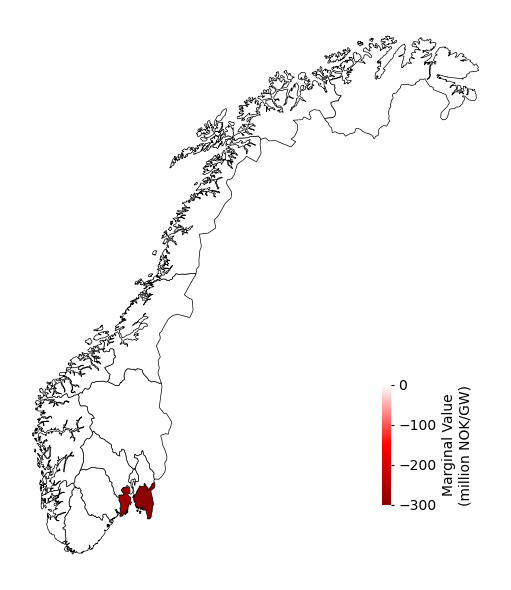

In [243]:
df_PM = df_maxcap.query("transmission == 'DefaultYes' and exclusions == 'PM' and "
               "technology == 'Windonshore' and level_3 == 'marginal'")*cost_2024NOK
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
cmap = LinearSegmentedColormap.from_list("marginal_cmap", ['darkred', 'red', 'white'])

marginal_dict = df_PM.reset_index().set_index('zone')['maxarea'].to_dict()

Norway['marginal_temp'] = Norway.index.map(lambda x: marginal_dict.get(x, 0))

Norway.plot(ax=ax, column='marginal_temp', cmap=cmap, 
           vmin=-300, vmax=0, edgecolor='black', linewidth=0.5)

ax_color_scale = fig.add_axes([0.71, 0.15, 0.015, 0.2])
norm = plt.Normalize(vmin=-300, vmax=0)
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                 cax=ax_color_scale, orientation='vertical')
cb.set_label('Marginal Value\n(million NOK/GW)', fontsize=10)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2)

ax.axis('off')

plt.tight_layout()
plt.show()

Norway.drop('marginal_temp', axis=1, inplace=True)

/tmp/ipykernel_832553/2026312033.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.91, 0.96])


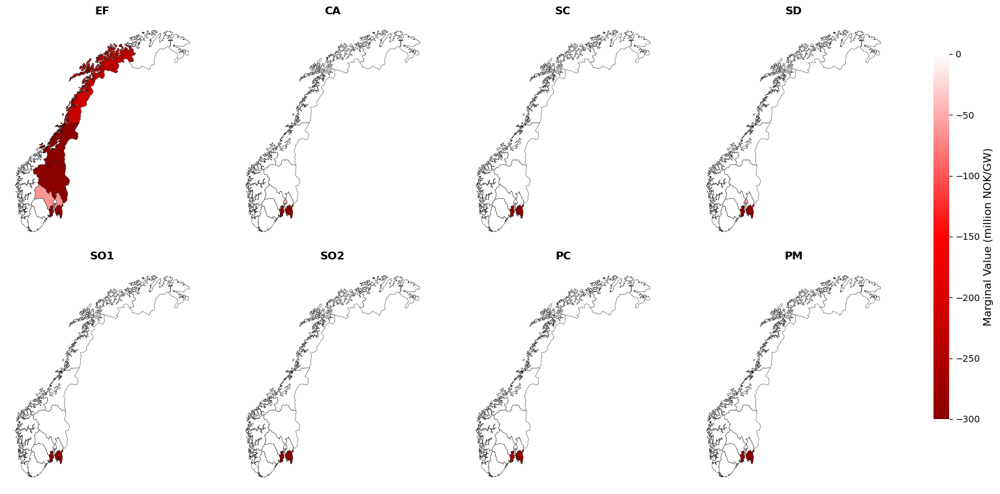

In [259]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

# Shared colormap
cmap = LinearSegmentedColormap.from_list("marginal_cmap", ['darkred', 'red', 'white'])

# Shared scale for all plots
vmin, vmax = -300, 0

for idx, scenario in enumerate(scenarios):
    ax = axes[idx]
    
    # Get data for this scenario
    df = df_maxcap.query(f"transmission == 'DefaultYes' and exclusions == '{scenario}' and "
                        f"technology == 'Windonshore'")
    
    # Create marginal dictionary
    marginal_dict = df.reset_index().set_index('zone')['maxarea'].to_dict()
    Norway['marginal_temp'] = Norway.index.map(lambda x: marginal_dict.get(x, 0))
    
    # Plot
    Norway.plot(ax=ax, column='marginal_temp', cmap=cmap, 
               vmin=vmin, vmax=vmax, edgecolor='black', linewidth=0.3)
    
    ax.set_title(f'{scenario}', fontsize=12, fontweight='bold')
    ax.axis('off')
    
    # Clean up
    Norway.drop('marginal_temp', axis=1, inplace=True)

cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
norm = plt.Normalize(vmin=vmin, vmax=vmax)
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                 cax=cbar_ax, orientation='vertical')
cb.set_label('Marginal Value (million NOK/GW)', fontsize=12)
cb.outline.set_visible(False)

plt.tight_layout(rect=[0, 0, 0.91, 0.96])
plt.show()

/tmp/ipykernel_832553/3632030984.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.91, 0.96])


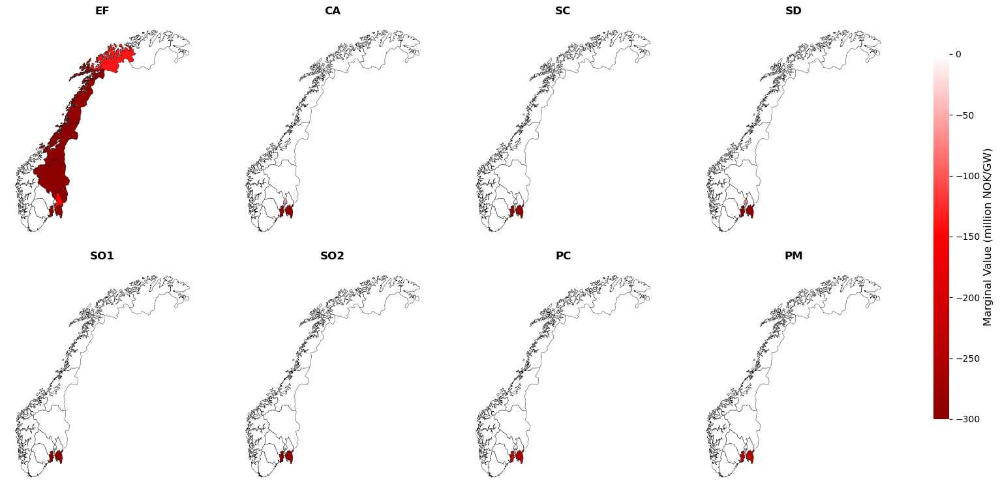

In [267]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

# Shared colormap
cmap = LinearSegmentedColormap.from_list("marginal_cmap", ['darkred', 'red', 'white'])

# Shared scale for all plots
vmin, vmax = -300, 0

for idx, scenario in enumerate(scenarios):
    ax = axes[idx]
    
    # Get data for this scenario
    df = df_maxcap.query(f"transmission == 'LOWOH' and exclusions == '{scenario}' and "
                        f"technology == 'Windonshore'")
    
    # Create marginal dictionary
    marginal_dict = df.reset_index().set_index('zone')['maxarea'].to_dict()
    Norway['marginal_temp'] = Norway.index.map(lambda x: marginal_dict.get(x, 0))
    
    # Plot
    Norway.plot(ax=ax, column='marginal_temp', cmap=cmap, 
               vmin=vmin, vmax=vmax, edgecolor='black', linewidth=0.3)
    
    ax.set_title(f'{scenario}', fontsize=12, fontweight='bold')
    ax.axis('off')
    
    # Clean up
    Norway.drop('marginal_temp', axis=1, inplace=True)

cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
norm = plt.Normalize(vmin=vmin, vmax=vmax)
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                 cax=cbar_ax, orientation='vertical')
cb.set_label('Marginal Value (million NOK/GW)', fontsize=12)
cb.outline.set_visible(False)

plt.tight_layout(rect=[0, 0, 0.91, 0.96])
plt.show()

In [407]:
found_scenarios_subset = found_scenarios[:6]

In [408]:
found_scenarios_subset

[PosixPath('/cluster/work/projects/ec85/EFF/NINA_work/modelling_results/models/2010/2010_2050_region_DefaultYes_1_EF_OPT_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/NINA_work/modelling_results/models/2010/2010_2050_region_DefaultYes_1_SC_OPT_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/NINA_work/modelling_results/models/2010/2010_2050_region_LOWOH_1_PM_OPT_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/NINA_work/modelling_results/models/2010/2010_2050_region_LOWOH_1_EF_OPT_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/NINA_work/modelling_results/models/2010/2010_2050_region_DefaultYes_1_SO1_OPT_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db'),
 PosixPath('/cluster/work/projects/ec85/EFF/NINA_work/modelling_results/models/2010/2010_2050_region_DefaultYes_1_SD_OPT_CSD_CWD_fylketechD_0.09_0.15_0.2/results.db')]

In [414]:
sub_set_aa = makenice(found_scenarios_subset, "eq_elc_balance")

  0%|          | 0/6 [00:00<?, ?it/s]

In [415]:
sub_set_aa.reset_index()['hour'].unique()

array([   0,    1,    2, ..., 8757, 8758, 8759])

In [416]:
balance_equation = makenice(found_scenarios, "eq_elc_balance")
balance_equation

  0%|          | 0/16 [00:00<?, ?it/s]

demand
transmission exclusions hour zone  level_2           
DefaultYes   EF         0    NO020 level     1.450047
                                   lower     1.450047
                                   marginal  0.041862
                                   scale     1.000000
                                   upper     1.450047
...                                               ...
             PM         8759 NO0A3 level     3.108044
                                   lower     3.108044
                                   marginal  0.042109
                                   scale     1.000000
                                   upper     3.108044

[10512000 rows x 1 columns]

In [418]:
balance_equation_filtered = (balance_equation.loc[(slice(None), slice(None),
             slice(None),slice(None), ['marginal', 'level'])])

In [419]:
balance_equation_filtered

demand
transmission exclusions hour zone  level_2           
DefaultYes   EF         0    NO020 marginal  0.041862
                             NO060 marginal  0.042592
                             NO071 marginal  0.041468
                             NO072 marginal  0.040731
                             NO073 marginal  0.041468
...                                               ...
             PM         8759 NO093 level     0.696973
                             NO094 level     2.038200
                             NO0A1 level     3.328554
                             NO0A2 level     5.080307
                             NO0A3 level     3.108044

[4204800 rows x 1 columns]

In [ ]:
NO_bidding_zone_path = 'NO_bidding_zones_shapefile/NO_bidding_zones.shp'
NO_bidding_zone = gpd.read_file(NO_bidding_zone_path)

In [305]:
NO_bidding_zone

,id,geometry
0,NO-NO1,"MULTIPOLYGON (((10.47585 59.40209, 10.45185 59..."
1,NO-NO2,"MULTIPOLYGON (((5.60792 59.13443, 5.62428 59.1..."
2,NO-NO3,"MULTIPOLYGON (((12.31430 62.28558, 10.95738 62..."
3,NO-NO4,"MULTIPOLYGON (((14.12754 64.37964, 11.78753 64..."
4,NO-NO5,"MULTIPOLYGON (((9.60473 60.30729, 9.48366 60.2..."


In [420]:
marginals_el_price = balance_equation_filtered.query("level_2 == 'marginal'").copy()
marginals_el_price = marginals_el_price.droplevel(["level_2"])  # No longer needed
marginals_el_price = (marginals_el_price.rename(columns={'demand': 'price_NOK_per_MWh'}))*cost_2024NOK*1000

In [421]:
demand_level = (balance_equation_filtered.query("level_2 == 'level'").copy())*1000
demand_level = demand_level.droplevel(["level_2"])
demand_level = demand_level.rename(columns={'demand': 'load_MW'})

In [422]:
demand_level

load_MW
transmission exclusions hour zone              
DefaultYes   EF         0    NO020  1450.046503
                             NO060  2717.120379
                             NO071  2776.866010
                             NO072   831.312504
                             NO073  1129.925568
...                                         ...
             PM         8759 NO093   696.972838
                             NO094  2038.200179
                             NO0A1  3328.554215
                             NO0A2  5080.306521
                             NO0A3  3108.043871

[2102400 rows x 1 columns]

In [423]:
zone_costs = marginals_el_price.merge(
    demand_level,
    on=['transmission', 'exclusions', 'hour', 'zone'],
    how='inner',
    suffixes=('_price', '_load')
)
zone_costs['hourly_cost_million_NOK'] = (
    zone_costs['price_NOK_per_MWh'] * 
    zone_costs['load_MW']
) / 1_000_000  # NOK to million NOK

In [424]:
zone_costs

price_NOK_per_MWh      load_MW  \
transmission exclusions hour zone                                    
DefaultYes   EF         0    NO020         879.110009  1450.046503   
                             NO060         894.432802  2717.120379   
                             NO071         870.828721  2776.866010   
                             NO072         855.345381   831.312504   
                             NO073         870.828715  1129.925568   
...                                               ...          ...   
             PM         8759 NO093         106.584209   696.972838   
                             NO094         107.275070  2038.200179   
                             NO0A1         106.246309  3328.554215   
                             NO0A2         882.157109  5080.306521   
                             NO0A3         884.290558  3108.043871   

                                    hourly_cost_million_NOK  
transmission exclusions hour zone                            
DefaultYes   EF         0    NO020                 1.274750  
                             NO060                 2.430282  
                             NO071                 2.418175  
                             NO072                 0.711059  
                             NO073                 0.983972  
...                                                     ...  
             PM         8759 NO093                 0.074286  
                             NO094                 0.218648  
                             NO0A1                 0.353647  
                             NO0A2                 4.481629  
                             NO0A3                 2.748414  

[2102400 rows x 3 columns]

In [433]:
hourly_total_costs = zone_costs.groupby(
    ['transmission', 'exclusions', 'hour']
)['hourly_cost_million_NOK'].sum().reset_index()
hourly_total_costs = hourly_total_costs.rename(
    columns={'hourly_cost_million_NOK': 'total_hourly_cost_million_NOK'}
)
hourly_total_costs

,transmission,exclusions,hour,total_hourly_cost_million_NOK
0,DefaultYes,CA,0,28.600360
1,DefaultYes,CA,1,28.398713
2,DefaultYes,CA,2,28.318719
3,DefaultYes,CA,3,28.332584
4,DefaultYes,CA,4,28.735841
...,...,...,...,...
140155,LOWOH,SO2,8755,23.733134
140156,LOWOH,SO2,8756,23.464443
140157,LOWOH,SO2,8757,22.952205
140158,LOWOH,SO2,8758,22.464836


In [509]:
summary_stats = hourly_total_costs.groupby(
    ['transmission', 'exclusions']
)['total_hourly_cost_million_NOK'].agg([
    'mean', 'median', 'std', 'min', 'max',
    ('p95', lambda x: np.percentile(x, 95)),
    ('cv', lambda x: np.std(x) / np.mean(x)),  # Coefficient of variation
    ('variance', 'var') # Calculate variance
]).reset_index()
summary_stats

,transmission,exclusions,mean,median,std,min,max,p95,cv,variance
0,DefaultYes,CA,35.001694,25.407404,227.002795,1.186298,11637.872013,33.207653,6.485110,51530.269108
1,DefaultYes,EF,39.122844,24.755516,228.354635,1.251949,13531.655170,32.340949,5.836529,52145.839267
2,DefaultYes,PC,35.003555,24.993202,225.674532,1.200929,10655.646133,32.359143,6.446821,50928.994190
3,DefaultYes,PM,35.143952,24.858713,219.370619,1.174885,10655.606432,32.220254,6.241703,48123.468493
4,DefaultYes,SC,35.315586,25.298450,221.650284,1.198685,10701.371310,32.898943,6.275915,49128.848569
5,DefaultYes,SD,34.566306,25.206773,250.144987,1.182761,15521.289908,32.848175,7.236258,62572.514703
6,DefaultYes,SO1,35.487327,25.247817,233.339464,1.332479,10691.119409,32.822643,6.574915,54447.305446
7,DefaultYes,SO2,35.434296,25.250253,228.495701,1.184517,10690.809090,32.740851,6.448065,52210.285241
8,LOWOH,CA,32.841426,25.217295,246.768141,1.200660,15552.362553,32.825601,7.513500,60894.515324
9,LOWOH,EF,35.706818,25.858860,242.027603,0.888080,15795.495014,33.638914,6.777803,58577.360746


In [ ]:
#"While EF increases mean hourly costs by 11%, its coefficient of variation decreases by 6% relative to PM,
#indicating that restrictions impose a consistent cost premium rather than increasing hour-to-hour volatility."

#This is actually a **subtle but important finding**: restrictions don't make things more chaotic,
#they just make them consistently more expensive!


/tmp/ipykernel_532465/793427897.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  b = sns.boxplot(
/tmp/ipykernel_532465/793427897.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(
/tmp/ipykernel_532465/793427897.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby('exclusions')['total_hourly_cost_million_NOK'].mean()
/tmp/ipykernel_532465/793427897.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable 

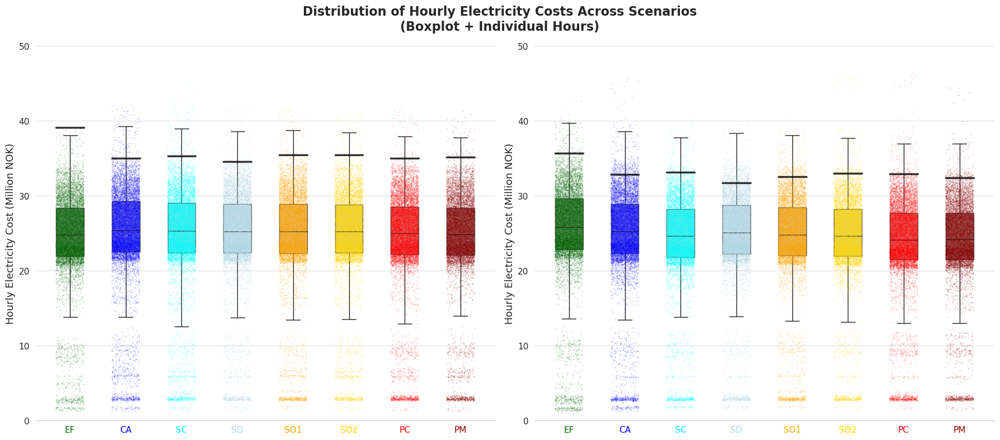

In [451]:
scenario_order = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

colors = ['darkgreen', 'blue', 'cyan', 'lightblue', 'orange', 'gold', 'red', 'darkred']
color_dict = dict(zip(scenario_order, colors))


# Create figure with two subplots (one per transmission)
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

for idx, trans in enumerate(['DefaultYes', 'LOWOH']):
    ax = axes[idx]
    
    # Filter data for this transmission
    data = hourly_total_costs[hourly_total_costs['transmission'] == trans].copy()
    
    # Ensure scenario order
    data['exclusions'] = pd.Categorical(data['exclusions'], 
                                        categories=scenario_order, 
                                        ordered=True)
    
    # Create boxplot
    b = sns.boxplot(
        x='exclusions', 
        y='total_hourly_cost_million_NOK', 
        data=data,
        width=0.5, 
        boxprops=dict(alpha=0.7),
        ax=ax,
        order=scenario_order, 
        palette=color_dict,
        showfliers=False  # Don't show outliers as individual points
    )
    
    # Add stripplot (jittered points)
    sns.stripplot(
        x='exclusions', 
        y='total_hourly_cost_million_NOK', 
        data=data,
        order=scenario_order,
        ax=ax, 
        alpha=0.2,  # More transparent since we have many points
        jitter=0.25, 
        size=1.5,  # Smaller points for 1000 hours
        palette=color_dict
    )

    
    
    # Add mean lines for each scenario
    means = data.groupby('exclusions')['total_hourly_cost_million_NOK'].mean()
    for i, scenario in enumerate(scenario_order):
        if scenario in means.index:
            ax.plot([i-0.25, i+0.25], [means[scenario], means[scenario]], 
                   color='black', linewidth=2.5, alpha=0.8, zorder=10)


    ax.set_xlabel('')
    ax.set_ylim(0, 50)
    y_ticks = [0, 10, 20, 30, 40, 50]
    ax.set_yticks(y_ticks)
    #ax.set_yticklabels([])
    #ax2.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.9)    
    ax.set_ylabel('Hourly Electricity Cost (Million NOK)', fontsize=13)


    
    # Color x-tick labels
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(colors[i])
        #label.set_fontweight('bold')
    
    # Grid and spines
    ax.grid(True, axis='y', linestyle='-', alpha=0.6)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Legend
    #ax.legend(loc='upper right', fontsize=9)

# Overall title
# fig.suptitle('Distribution of Hourly Electricity Costs Across Scenarios\n(Boxplot + Individual Hours)', 
#              fontsize=16, fontweight='bold', y=0.98)

plt.tight_layout()




In [502]:

# Calculate percentage change from PM for each hour
results = []

for trans in ['DefaultYes', 'LOWOH']:
    # Get PM baseline
    pm_data = hourly_total_costs[
        (hourly_total_costs['transmission'] == trans) & 
        (hourly_total_costs['exclusions'] == 'PM')
    ].copy()
    
    pm_data = pm_data.rename(columns={'total_hourly_cost_million_NOK': 'pm_cost'})
    pm_data = pm_data[['hour', 'pm_cost']]
    
    # Calculate % change for all scenarios
    trans_data = hourly_total_costs[hourly_total_costs['transmission'] == trans].copy()
    trans_data = trans_data.merge(pm_data, on='hour', how='left')
    
    trans_data['percent_change'] = (
        (trans_data['total_hourly_cost_million_NOK'] - trans_data['pm_cost']) / 
        trans_data['pm_cost']
    ) * 100
    
    results.append(trans_data)

cost_changes = pd.concat(results, ignore_index=True)

# Remove PM (always 0% by definition)
#cost_changes = cost_changes[cost_changes['exclusions'] != 'PM']



In [503]:
summary_stats = cost_changes.groupby(
    ['transmission', 'exclusions']
)['percent_change'].agg([
    'mean', 'median', 'std', 'min', 'max',
    ('p5', lambda x: np.percentile(x, 5)),
    ('p95', lambda x: np.percentile(x, 95))
]).reset_index()

In [504]:
summary_stats

,transmission,exclusions,mean,median,std,min,max,p5,p95
0,DefaultYes,CA,15.909493,2.374513,330.103992,-99.615456,29581.622730,-13.958312,13.782521
1,DefaultYes,EF,35.471950,-0.548577,393.498707,-92.581109,17638.496171,-17.692797,46.260243
2,DefaultYes,PC,1.057188,0.296290,44.022151,-86.037286,3798.877273,-0.313813,2.671634
3,DefaultYes,PM,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,DefaultYes,SC,10.965457,1.707827,101.838788,-92.637125,6517.427870,-10.190253,12.693079
5,DefaultYes,SD,13.784697,1.455176,434.510189,-99.604527,40178.876687,-8.606985,8.758020
6,DefaultYes,SO1,6.564512,1.193979,63.084830,-92.490383,2928.261147,-5.913681,6.960315
7,DefaultYes,SO2,6.547739,1.108262,80.241574,-92.674399,5813.818562,-1.954673,6.801287
8,LOWOH,CA,22.047327,3.441555,265.137140,-97.048087,6363.664309,-12.233363,21.887083
9,LOWOH,EF,42.389138,6.265929,587.850976,-99.634122,36272.702403,-20.953585,44.967746


/tmp/ipykernel_532465/2249371891.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  b = sns.boxplot(
/tmp/ipykernel_532465/2249371891.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(
/tmp/ipykernel_532465/2249371891.py:47: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby('exclusions')['total_hourly_cost_million_NOK'].mean()
/tmp/ipykernel_532465/2249371891.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` varia

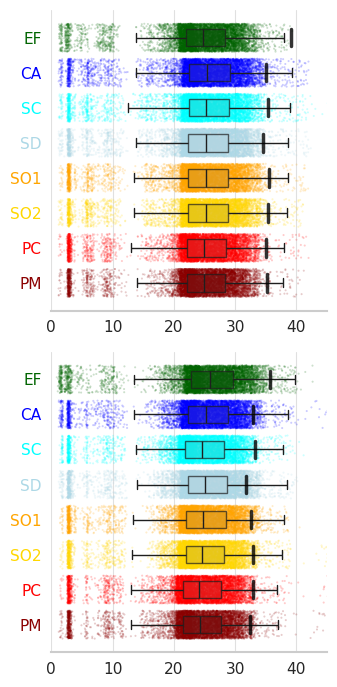

In [506]:

scenario_order = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
colors = ['darkgreen', 'blue', 'cyan', 'lightblue', 'orange', 'gold', 'red', 'darkred']
color_dict = dict(zip(scenario_order, colors))

# Create figure with two subplots arranged vertically
fig, axes = plt.subplots(2, 1, figsize=(3.5, 7))

for idx, trans in enumerate(['DefaultYes', 'LOWOH']):
    ax = axes[idx]
    
    # Filter data for this transmission
    data = hourly_total_costs[hourly_total_costs['transmission'] == trans].copy()
    
    # Ensure scenario order
    data['exclusions'] = pd.Categorical(data['exclusions'], 
                                        categories=scenario_order, 
                                        ordered=True)

    # Create horizontal boxplot
    b = sns.boxplot(
        y='exclusions',  # Swap x and y for horizontal
        x='total_hourly_cost_million_NOK',  # Swap x and y for horizontal
        data=data,
        width=0.5, 
        boxprops=dict(alpha=0.7),
        ax=ax,
        zorder=10,
        order=scenario_order, 
        palette=color_dict,
        showfliers=False  # Don't show outliers as individual points
    )
    
    # Add horizontal stripplot (jittered points)
    sns.stripplot(
        y='exclusions',  # Swap x and y for horizontal
        x='total_hourly_cost_million_NOK',  # Swap x and y for horizontal
        data=data,
        order=scenario_order,
        ax=ax, 
        alpha=0.2,  # More transparent since we have many points
        jitter=0.4, 
        size=1.5,  # Smaller points for 1000 hours
        palette=color_dict
    )

    # Add mean lines for each scenario
    means = data.groupby('exclusions')['total_hourly_cost_million_NOK'].mean()
    for i, scenario in enumerate(scenario_order):
        if scenario in means.index:
            ax.plot([means[scenario], means[scenario]], [i-0.25, i+0.25],
                   color='black', linewidth=2.5, alpha=0.8, zorder=10)

    ax.set_ylabel('')  # Y-labels are scenario names
    ax.set_xlim(0, 45)  # Adjust x-limits according to your data
    x_ticks = [0, 10, 20, 30, 40]
    ax.set_xticks(x_ticks)
    ax.set_xlabel('') # Hourly Electricity Cost (Million NOK)

    # Color y-tick labels
    for i, label in enumerate(ax.get_yticklabels()):
        label.set_color(colors[i])

    if idx == 0:  # For the first subplot
        #ax.spines['bottom'].set_visible(False)  # Hide the x-axis line
        #ax.xaxis.set_ticks([])  # Hide x-axis ticks
        ax.set_xlabel('')  # No x-label    
    # Grid and spines
    ax.grid(True, axis='x', linestyle='-', alpha=0.6)  # Change axis to 'x'
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)



plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/electricity_costs_1.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/electricity_costs_1T.png', dpi=300, transparent=True, bbox_inches='tight')


plt.show()


In [489]:
#mean change of electricity costs from PM 
#Mean hourly cost change from PM. Moreover volatality (standard deviation among cost changes) 

/tmp/ipykernel_532465/808726829.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  b = sns.boxplot(
/tmp/ipykernel_532465/808726829.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(
/tmp/ipykernel_532465/808726829.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  b = sns.boxplot(
/tmp/ipykernel_532465/808726829.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


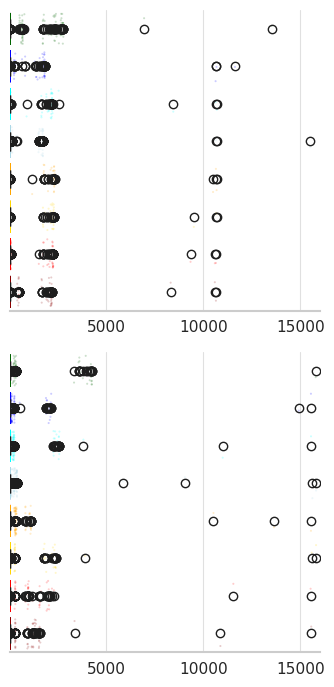

In [508]:

scenario_order = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']
colors = ['darkgreen', 'blue', 'cyan', 'lightblue', 'orange', 'gold', 'red', 'darkred']
color_dict = dict(zip(scenario_order, colors))

# Create figure with two subplots arranged vertically
fig, axes = plt.subplots(2, 1, figsize=(3.5, 7))

for idx, trans in enumerate(['DefaultYes', 'LOWOH']):
    ax = axes[idx]
    
    # Filter data for this transmission
    data = hourly_total_costs[hourly_total_costs['transmission'] == trans].copy()
    
    # Ensure scenario order
    data['exclusions'] = pd.Categorical(data['exclusions'], 
                                        categories=scenario_order, 
                                        ordered=True)

    # Create horizontal boxplot
    b = sns.boxplot(
        y='exclusions',  # Swap x and y for horizontal
        x='total_hourly_cost_million_NOK',  # Swap x and y for horizontal
        data=data,
        width=0.5, 
        boxprops=dict(alpha=0.7),
        ax=ax,
        zorder=10,
        order=scenario_order, 
        palette=color_dict,
        showfliers=True  # Don't show outliers as individual points
    )
    
    # Add horizontal stripplot (jittered points)
    sns.stripplot(
        y='exclusions',  # Swap x and y for horizontal
        x='total_hourly_cost_million_NOK',  # Swap x and y for horizontal
        data=data,
        order=scenario_order,
        ax=ax, 
        alpha=0.2,  # More transparent since we have many points
        jitter=0.4, 
        size=1.5,  # Smaller points for 1000 hours
        palette=color_dict
    )

    # Add mean lines for each scenario
    # means = data.groupby('exclusions')['total_hourly_cost_million_NOK'].mean()
    # for i, scenario in enumerate(scenario_order):
    #     if scenario in means.index:
    #         ax.plot([means[scenario], means[scenario]], [i-0.25, i+0.25],
    #                color='black', linewidth=2.5, alpha=0.8, zorder=10)

    ax.set_ylabel('')  # Y-labels are scenario names
    ax.set_xlim(45, 16000)  # Adjust x-limits according to your data
    x_ticks = [5000, 10000, 15000]
    ax.set_xticks(x_ticks)
    ax.yaxis.set_ticks([])
    ax.set_xlabel('')

    # Color y-tick labels
    for i, label in enumerate(ax.get_yticklabels()):
        label.set_color(colors[i])

    if idx == 0:  # For the first subplot
        #ax.spines['bottom'].set_visible(False)  # Hide the x-axis line
        #ax.xaxis.set_ticks([])  # Hide x-axis ticks
        ax.set_xlabel('')  # No x-label    
    # Grid and spines
    ax.grid(True, axis='x', linestyle='-', alpha=0.6)  # Change axis to 'x'
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)


plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/electricity_costs_2.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/modelling/electricity_costs_2T.png', dpi=300, transparent=True, bbox_inches='tight')



plt.show()


In [427]:
annual_el_costs = zone_costs.groupby(
    ['transmission', 'exclusions']
).agg({
    'hourly_cost_million_NOK': 'sum'
}).reset_index()
annual_el_costs = annual_el_costs.rename(
    columns={'hourly_cost_million_NOK': 'annual_cost_billion_NOK'}
)
annual_el_costs['annual_cost_billion_NOK'] = (
    annual_el_costs['annual_cost_billion_NOK'] / 1000
)
annual_el_costs

,transmission,exclusions,annual_cost_billion_NOK
0,DefaultYes,CA,306.614837
1,DefaultYes,EF,342.716118
2,DefaultYes,PC,306.631145
3,DefaultYes,PM,307.861016
4,DefaultYes,SC,309.364536
5,DefaultYes,SD,302.800843
6,DefaultYes,SO1,310.868986
7,DefaultYes,SO2,310.404430
8,LOWOH,CA,287.690895
9,LOWOH,EF,312.791722


In [428]:
total_system_costs

,exclusions,transmission,system_cost_billion_NOK
0,PM,DefaultYes,151.646750
1,PC,DefaultYes,151.652787
2,CA,DefaultYes,156.725836
3,EF,DefaultYes,157.794834
4,SD,DefaultYes,155.666146
5,SC,DefaultYes,155.717293
6,SO1,DefaultYes,154.481904
7,SO2,DefaultYes,154.033030
8,PM,LOWOH,148.960608
9,PC,LOWOH,149.024146


In [429]:
#system costs versus electricity costs
total_system_costs = pivot_df_custom.reset_index().melt(
    id_vars=['exclusions'],
    var_name='transmission',
    value_name='system_cost_billion_NOK'
)

system_electricity_costs = annual_el_costs.merge(
    total_system_costs,
    on=['transmission', 'exclusions'],
    how='inner'
)
results = []

for trans in ['DefaultYes', 'LOWOH']:
    subset = system_electricity_costs[system_electricity_costs['transmission'] == trans].copy()
    
    # Get PM baselines
    pm_system = subset[subset['exclusions'] == 'PM']['system_cost_billion_NOK'].values[0]
    pm_elec = subset[subset['exclusions'] == 'PM']['annual_cost_billion_NOK'].values[0]
    
    # Calculate % changes
    subset['system_cost_change_pct'] = ((subset['system_cost_billion_NOK'] - pm_system) / pm_system) * 100
    subset['elec_cost_change_pct'] = ((subset['annual_cost_billion_NOK'] - pm_elec) / pm_elec) * 100
    
    # Calculate ratio
    subset['elec_to_system_ratio'] = subset['annual_cost_billion_NOK'] / subset['system_cost_billion_NOK']
    
    results.append(subset)

system_electricity_costs = pd.concat(results, ignore_index=True)

In [430]:
system_electricity_costs

,transmission,exclusions,annual_cost_billion_NOK,system_cost_billion_NOK,system_cost_change_pct,elec_cost_change_pct,elec_to_system_ratio
0,DefaultYes,CA,306.614837,156.725836,3.349288,-0.404786,1.956377
1,DefaultYes,EF,342.716118,157.794834,4.054214,11.321700,2.171910
2,DefaultYes,PC,306.631145,151.652787,0.003981,-0.399489,2.021929
3,DefaultYes,PM,307.861016,151.646750,0.000000,0.000000,2.030119
4,DefaultYes,SC,309.364536,155.717293,2.684227,0.488376,1.986706
5,DefaultYes,SD,302.800843,155.666146,2.650499,-1.643655,1.945194
6,DefaultYes,SO1,310.868986,154.481904,1.869578,0.977054,2.012333
7,DefaultYes,SO2,310.404430,154.033030,1.573578,0.826157,2.015181
8,LOWOH,CA,287.690895,154.273478,3.566627,1.367714,1.864811
9,LOWOH,EF,312.791722,156.998136,5.395741,10.211976,1.992328


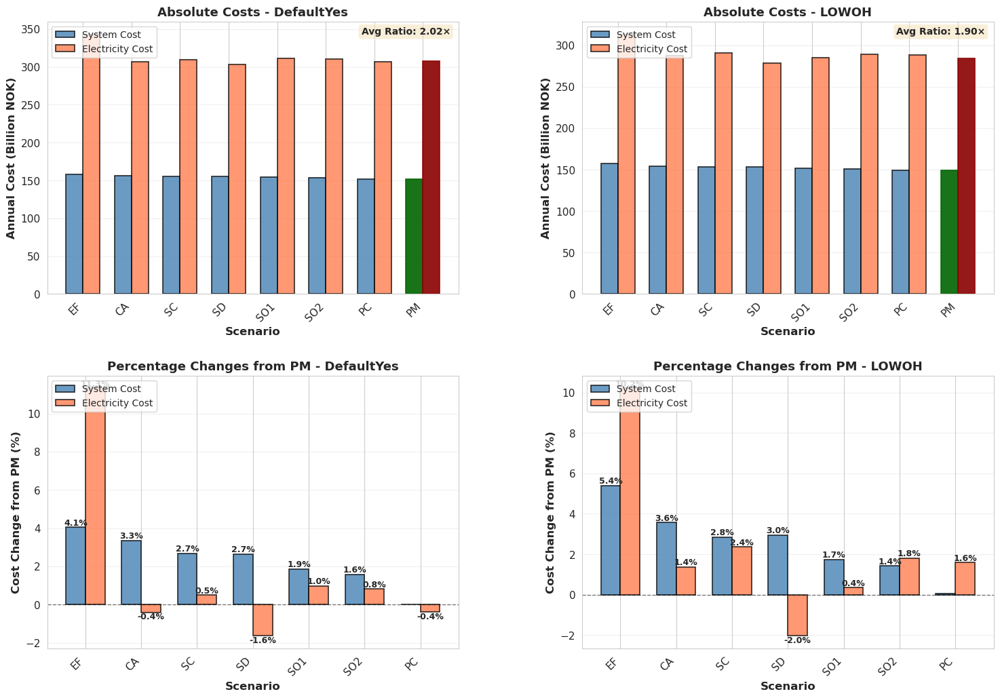

In [431]:
# Set style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 11

# Define scenario order
scenario_order = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

# Create figure with 2 rows, 2 columns
fig = plt.figure(figsize=(18, 12))

# Grid spec for better control
gs = fig.add_gridspec(2, 2, hspace=0.3, wspace=0.3)

# ==============================================================================
# PANEL 1 & 2: ABSOLUTE VALUES (TOP ROW)
# ==============================================================================

for col_idx, trans in enumerate(['DefaultYes', 'LOWOH']):
    ax = fig.add_subplot(gs[0, col_idx])
    
    data = system_electricity_costs[system_electricity_costs['transmission'] == trans].copy()
    data['exclusions'] = pd.Categorical(data['exclusions'], categories=scenario_order, ordered=True)
    data = data.sort_values('exclusions')
    
    x = np.arange(len(data))
    width = 0.35
    
    # Bars
    bars1 = ax.bar(x - width/2, data['system_cost_billion_NOK'], width, 
                   label='System Cost', color='steelblue', alpha=0.8, edgecolor='black', linewidth=1.2)
    bars2 = ax.bar(x + width/2, data['annual_cost_billion_NOK'], width,
                   label='Electricity Cost', color='coral', alpha=0.8, edgecolor='black', linewidth=1.2)
    
    # Highlight PM
    pm_idx = list(data['exclusions']).index('PM')
    bars1[pm_idx].set_color('darkgreen')
    bars1[pm_idx].set_alpha(0.9)
    bars2[pm_idx].set_color('darkred')
    bars2[pm_idx].set_alpha(0.9)
    
    ax.set_xlabel('Scenario', fontsize=12, fontweight='bold')
    ax.set_ylabel('Annual Cost (Billion NOK)', fontsize=12, fontweight='bold')
    ax.set_title(f'Absolute Costs - {trans}', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(data['exclusions'], rotation=45, ha='right')
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    
    # Add ratio annotation
    avg_ratio = data['elec_to_system_ratio'].mean()
    ax.text(0.98, 0.98, f'Avg Ratio: {avg_ratio:.2f}×', 
            transform=ax.transAxes, ha='right', va='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5),
            fontsize=10, fontweight='bold')

# ==============================================================================
# PANEL 3 & 4: PERCENTAGE CHANGES (BOTTOM ROW)
# ==============================================================================

for col_idx, trans in enumerate(['DefaultYes', 'LOWOH']):
    ax = fig.add_subplot(gs[1, col_idx])
    
    data = system_electricity_costs[system_electricity_costs['transmission'] == trans].copy()
    data['exclusions'] = pd.Categorical(data['exclusions'], categories=scenario_order, ordered=True)
    data = data.sort_values('exclusions')
    
    # Remove PM (0% by definition)
    data = data[data['exclusions'] != 'PM']
    
    x = np.arange(len(data))
    width = 0.35
    
    # Bars
    bars1 = ax.bar(x - width/2, data['system_cost_change_pct'], width,
                   label='System Cost', color='steelblue', alpha=0.8, edgecolor='black', linewidth=1.2)
    bars2 = ax.bar(x + width/2, data['elec_cost_change_pct'], width,
                   label='Electricity Cost', color='coral', alpha=0.8, edgecolor='black', linewidth=1.2)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if abs(height) > 0.1:  # Only label non-trivial values
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.1f}%',
                       ha='center', va='bottom' if height > 0 else 'top',
                       fontsize=9, fontweight='bold')
    
    ax.set_xlabel('Scenario', fontsize=12, fontweight='bold')
    ax.set_ylabel('Cost Change from PM (%)', fontsize=12, fontweight='bold')
    ax.set_title(f'Percentage Changes from PM - {trans}', fontsize=13, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(data['exclusions'], rotation=45, ha='right')
    ax.legend(loc='upper left', fontsize=10)
    ax.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax.grid(axis='y', alpha=0.3)



In [ ]:
# We notice change in electricity costs comapred to total system costs are much lower (Even negative in some scenarios)
#SHowing fixed costs dominate system costs/consumer impact (what it means?)

In [ ]:
scenarios = ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

In [592]:
var_gen_h = makenice(found_scenarios, "gen")

  0%|          | 0/14 [00:00<?, ?it/s]

In [593]:
var_gen_h

genamttot
transmission forest_excls hour zone  technology     level_3               
DefaultYes   HRV          0    NO020 HydroRes       level     1.386552e+00
                                                    lower     0.000000e+00
                                                    marginal  0.000000e+00
                                                    scale     1.000000e+00
                                                    upper              inf
...                                                                    ...
LOWOH        HWE          8759 NO0A3 Windonshore_OF level     8.306014e-09
                                                    lower     0.000000e+00
                                                    marginal  0.000000e+00
                                                    scale     1.000000e+00
                                                    upper              inf

[88914000 rows x 1 columns]

In [594]:
var_gen_h_g = var_gen_h.groupby(["transmission","forest_excls","technology", "level_3"],observed=True).sum()

In [595]:
tech_query_string_gen = (
    "technology == 'Solar' | "
    "technology == 'Windoffshore' | "
    "technology == 'Windoffshorefloating' | "
    "technology == 'Windonshore_F'  | "
    "technology == 'Windonshore_OF' | "
    "technology == 'HydroRoR' | " 
    "technology == 'HydroRes'  "
)

In [596]:
var_gen_h_g = var_gen_h_g.loc[level_slice].query(tech_query_string_gen)

In [597]:
var_gen_h_g

genamttot
transmission forest_excls technology                        
DefaultYes   ECS          HydroRes              88783.638818
                          HydroRoR              25895.906575
                          Solar                 40987.686841
                          Windoffshore          64055.151743
                          Windoffshorefloating  24335.755311
...                                                      ...
LOWOH        VRS          Solar                 44601.198413
                          Windoffshore          77056.249645
                          Windoffshorefloating  23199.673411
                          Windonshore_F          2279.169350
                          Windonshore_OF         1662.610076

[98 rows x 1 columns]

In [598]:
var_gen_h_g['share_gen'] = var_gen_h_g.groupby(['transmission', 'forest_excls'])['genamttot'].transform(lambda x: x / x.sum())

In [599]:
var_gen_h_g

genamttot  share_gen
transmission forest_excls technology                                   
DefaultYes   ECS          HydroRes              88783.638818   0.338414
                          HydroRoR              25895.906575   0.098707
                          Solar                 40987.686841   0.156232
                          Windoffshore          64055.151743   0.244157
                          Windoffshorefloating  24335.755311   0.092760
...                                                      ...        ...
LOWOH        VRS          Solar                 44601.198413   0.169501
                          Windoffshore          77056.249645   0.292842
                          Windoffshorefloating  23199.673411   0.088167
                          Windonshore_F          2279.169350   0.008662
                          Windonshore_OF         1662.610076   0.006319

[98 rows x 2 columns]

In [600]:
scenarios_not_base = ['VRS', 'ECS', 'NLF', 'LLF', 'PEB', 'HRV']
techs = ['HydroRes', 'HydroRoR',  'Solar', 'Windoffshore' , 'Windoffshorefloating' ,
         'Windonshore_F' ,'Windonshore_OF']

diff_gen_scenarios_fixed = pd.DataFrame(index=techs, columns=scenarios_not_base)

for scenario in scenarios_not_base:
        diff_gen_scenarios_fixed[scenario] = -(var_gen_h_g.query("transmission == 'DefaultYes' and forest_excls == 'HWE'")['genamttot'].values  - 
         var_gen_h_g.query(f"transmission == 'DefaultYes' and forest_excls == '{scenario}'")['genamttot'].values)

diff_gen_scenarios_fixed = diff_gen_scenarios_fixed.round(1)/1000
diff_gen_scenarios_fixed.index.name = 'technology'
diff_gen_scenarios_fixed

,VRS,ECS,NLF,LLF,PEB,HRV
technology,,,,,,
HydroRes,-0.0000,-0.0000,-0.0000,-0.0000,-0.0000,-0.0000
HydroRoR,-0.9533,-0.4745,-0.1299,-0.0613,-0.1074,-0.0999
Solar,7.5299,0.7888,-0.7237,-0.5379,-1.3177,-1.1843
Windoffshore,54.9014,51.1499,27.8506,20.6371,30.5425,28.0098
Windoffshorefloating,27.5036,22.7576,-0.2866,-0.4293,1.9502,0.3377
Windonshore_F,-63.4901,-50.4209,-43.1611,-26.5442,-13.5421,-32.7465
Windonshore_OF,-24.6353,-23.3828,16.6183,7.0659,-17.5181,5.8126


In [601]:
diff_gen_scenarios_expand = pd.DataFrame(index=techs, columns=scenarios_not_base)

for scenario in scenarios_not_base:
        diff_gen_scenarios_expand[scenario] = -(var_gen_h_g.query("transmission == 'LOWOH' and forest_excls == 'HWE'")['genamttot'].values  - 
         var_gen_h_g.query(f"transmission == 'LOWOH' and forest_excls == '{scenario}'")['genamttot'].values)

diff_gen_scenarios_expand = diff_gen_scenarios_expand.round(1)/1000
diff_gen_scenarios_expand.index.name = 'technology'
diff_gen_scenarios_expand

,VRS,ECS,NLF,LLF,PEB,HRV
technology,,,,,,
HydroRes,0.0000,-0.0000,-0.0000,0.0000,-0.0000,0.0000
HydroRoR,-0.8171,-0.5247,-0.1704,-0.1220,-0.1522,-0.1148
Solar,6.4155,4.5710,0.0319,-0.2314,0.3806,-0.7432
Windoffshore,57.0768,48.1184,27.2135,22.7322,24.4934,24.9720
Windoffshorefloating,23.1997,19.2799,0.0000,0.0000,0.0000,-0.0000
Windonshore_F,-61.3958,-48.4183,-41.6438,-32.0956,-8.3382,-29.2985
Windonshore_OF,-23.4083,-22.1816,14.7496,9.7995,-16.2801,5.2774


In [602]:
aa = var_gen_h_g.query("transmission == 'DefaultYes' and forest_excls == 'VRS'")['genamttot']/1000
aa.droplevel(['transmission', 'forest_excls']).sum()

262.7900060101888

In [603]:
diff_tot_pcap_scenarios

,VRS,ECS,NLF,LLF,PEB,HRV
technology,,,,,,
Solar,7.4,5.2,0.4,0.1,0.5,-0.5
Windoffshore,10.4,8.7,4.9,4.0,4.4,4.5
Windoffshorefloating,5.0,4.1,0.0,0.0,0.0,-0.0
Windonshore_F,-23.9,-18.2,-15.4,-11.3,-0.6,-10.5
Windonshore_OF,-10.5,-10.0,6.3,4.1,-7.4,2.3


In [604]:
plot_data_1

,HWE
technology,
Solar,3.777092e+01
Windoffshore,3.499256e+00
Windoffshorefloating,6.434467e-08
Windonshore_F,2.495857e+01
Windonshore_OF,1.117327e+01


/tmp/ipykernel_3476757/2154327072.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  f.tight_layout()


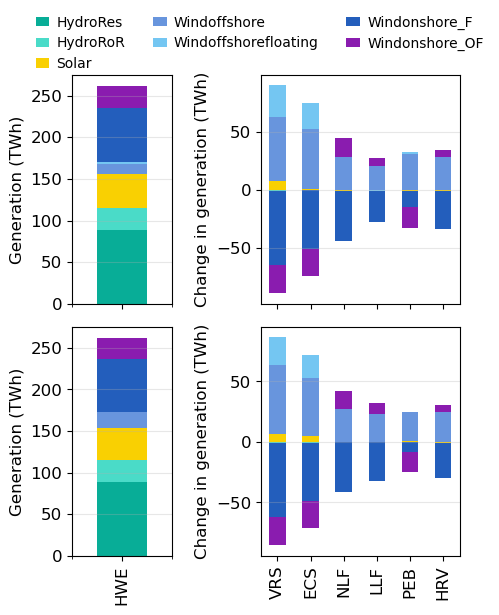

In [605]:
f = plt.figure(figsize=(5,6.5))

gs = gridspec.GridSpec(2, 2, figure=f, width_ratios=[0.5, 1], wspace=0.6, hspace=0.1)
ax1 = f.add_subplot(gs[0,0])
ax2 = f.add_subplot(gs[1,0],sharex=ax1)
ax3 = f.add_subplot(gs[0,1])
ax4 = f.add_subplot(gs[1,1],sharex=ax3)

plot_data_1 = pd.DataFrame({'HWE': var_gen_h_g.query("transmission == 'DefaultYes' and forest_excls == 'HWE'")['genamttot']/1000})
plot_data_1 = plot_data_1.droplevel(['transmission', 'forest_excls'])
colors_1 = [colordict.get(tech, '#808080') for tech in plot_data_1.index]
(
    plot_data_1
    #.rename(columns=scenarios_rename)
    #.query("technology==@gen_technologies")
    .transpose()
    .plot(kind="bar", stacked=True ,ax=ax1, fontsize=12, legend=False, color=colors_1)
)

ax1.set_ylabel("Generation (TWh)", fontsize=12)
#ax1.tick_params(axis='x', rotation=90, labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.grid(axis='y', alpha=0.3)

(
    diff_gen_scenarios_fixed
    #.rename(columns=scenarios_rename)
    #.query("technology==@gen_technologies")
    .transpose()
    .plot(kind="bar", stacked=True ,ax=ax3, fontsize=12, legend=False, color=colors_1)
)

ax3.set_ylabel("Change in generation (TWh)", fontsize=12)
#ax2.tick_params(axis='x', rotation=90, labelsize=12)
ax3.tick_params(axis='y', labelsize=12)
ax3.grid(axis='y', alpha=0.3)

plot_data_2 = pd.DataFrame({'HWE': var_gen_h_g.query("transmission == 'LOWOH' and forest_excls == 'HWE'")['genamttot']/1000})
plot_data_2 = plot_data_2.droplevel(['transmission', 'forest_excls'])
(
    plot_data_2
    #.rename(columns=scenarios_rename)
    #.query("technology==@gen_technologies")
    .transpose()
    .plot(kind="bar", stacked=True ,ax=ax2, fontsize=12, legend=False, color=colors_1)
)

ax2.set_ylabel("Generation (TWh)", fontsize=12)
ax2.tick_params(axis='y', labelsize=12)
ax2.grid(axis='y', alpha=0.3)
#ax2.grid(axis='y', alpha=0.3)
#ax2.set_xticklabels(['HWE'])
#ax2.set_xlabel('')

(
    diff_gen_scenarios_expand
    #.rename(columns=scenarios_rename)
    #.query("technology==@gen_technologies")
    .transpose()
    .plot(kind="bar", stacked=True ,ax=ax4, fontsize=12, legend=False, color=colors_1)
)

ax4.set_ylabel("Change in generation (TWh)", fontsize=12)
#ax2.tick_params(axis='x', rotation=90, labelsize=12)
ax4.tick_params(axis='y', labelsize=12)
ax4.grid(axis='y', alpha=0.3)

handles1, labels1 = ax1.get_legend_handles_labels()
#handles2, labels2 = ax2.get_legend_handles_labels()
#handles = handles1 + handles2
#labels = labels1+labels2

f.legend(handles1, labels1, loc='upper center', bbox_to_anchor=(0.5, 0.95), 
          ncol=3, borderaxespad=0., frameon=False, 
          fontsize=10, handlelength=1, handletextpad=0.5)
f.subplots_adjust(top=0.85)
f.tight_layout()


#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/plots_forests/modelling results/gen_diff_both.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/plots_forests/modelling results/gen_diff_bothT.png', dpi=300, transparent=True, bbox_inches='tight')



In [592]:
Norway

,name,geometry,existing_hydro_ecap
NO020,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852...",0.00000
NO060,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62...",0.12800
NO071,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65...",0.00000
NO072,Troms,"MULTIPOLYGON (((20.62316 69.03636, 20.36272 69...",0.00000
NO073,Finnmark,"MULTIPOLYGON (((28.95408 69.02726, 28.83961 69...",0.00000
NO081,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017...",0.00000
NO083,Østfold,"MULTIPOLYGON (((11.88374 59.80538, 11.88980 59...",0.00000
NO084,Akershus,"POLYGON ((11.87463 59.88494, 11.84959 59.87242...",0.00000
NO085,Buskerud,"POLYGON ((10.48666 59.80317, 10.48455 59.78864...",0.00000
NO092,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ...",0.00000


In [593]:
Norway.to_file("Norway.geojson", driver="GeoJSON")

In [ ]:
replacements = {
    'NO001': 'NO083', # Østfold
    'NO002': 'NO084', # Akershus
    'NO003': 'NO081', # Oslo
    'NO006': 'NO085', # Buskerud
    'NO007': 'NO093', #Vestfold
    'NO008': 'NO094', # Telemark
    'NO011': 'NO0A1', # Rogaland
    'NO015': 'NO0A3', # Møre og Romsdal 	
    'NO019': 'NO072', # Troms
    'NO020': 'NO073', # Finmark
    'NO073': 'NO020', # Innlandet
    'NO060': 'NO060', # Trøndelag
    'NO071': 'NO071', # Nordland
    'NO092': 'NO092', # Agder
    'NO0A2': 'NO0A2', # Vestland
}

/tmp/ipykernel_3926348/1062699732.py:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  b = sns.boxplot(x='scenarios', y='percent_change', data=year_data,
/tmp/ipykernel_3926348/1062699732.py:123: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order,
/tmp/ipykernel_3926348/1062699732.py:129: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(ax2.get_xticklabels(), ha='center')


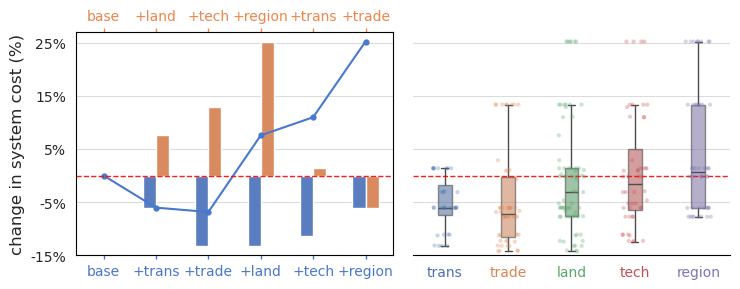

In [56]:
#Final cost plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7.5, 3))
#plt.subplots_adjust(wspace=-0.3, left=0.05, right=0.95, top=0.95, bottom=0.1)
sns.set_style("whitegrid")

# Data and palette setup
df_2050 = df[df['demandyear'] == '2050']

palette = {
    'trading': sns.color_palette('muted')[0],
    'landscape': sns.color_palette('muted')[1]
}


sns.barplot(
     data=df_2050, x='scenarios', y='percent_change', hue='1st preference',
     width=0.5, palette=palette, errorbar=None, ax=ax1
 )

ax1.set_xlabel("")
ax1.set_ylabel("change in system cost (%)", fontsize=12)
ax1.legend_.remove()
ax1.set_ylim(-15, 27)
y_ticks = [-15, -5, 5, 15, 25]
ax1.set_yticks(y_ticks)


# Adjust x-axis ticks and labels
ax1.tick_params(axis='x', colors=palette['trading'], direction='out', length=3, width=1)
top_ax = ax1.secondary_xaxis('top')
scenario_labels = ['base', '+land', '+tech', '+region', '+trans', '+trade']
top_ax.set_xticks(range(len(scenario_labels)))
top_ax.set_xticklabels(scenario_labels)
top_ax.tick_params(axis='x', colors=palette['landscape'], direction='out', labelsize=10, length=3, width=1)
#top_ax.spines['top'].set_color('black')

# Add bottom x-axis
b_ax = ax1.secondary_xaxis('bottom')
b_ax.set_xticks(range(len(scenario_labels)))
b_ax.set_xticklabels(['' for _ in b_ax.get_xticks()])
b_ax.tick_params(axis='x', colors=palette['trading'], direction='out',labelsize=10, length=3, width=1)

# Add line plot
ax1.plot(costind_pref.index, costind_pref['2050'], marker='o', color=palette['trading'], linestyle='-', markersize=3.5)

# Additional customization
ax1.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.9)
ax1.grid(True, axis='y', linestyle='-', alpha=0.7)

for spine in ax1.spines.values():
    spine.set_edgecolor('black')
    

ax1.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0f}%'.format(y)))
#ax1.tick_params(axis='both', labelsize=10, direction='out', length=3, width=1)

# Boxplot showing the impact of preferring the given preference (ImpExp==2)

#filtered_cost = cost[(cost.index.get_level_values('transmission') != 'DefaultNO')&
#                      (cost.index.get_level_values('ImpExp').isin(['1', '2']))                      
#]

filtered_cost2 = cost[(cost.index.get_level_values('transmission').isin(['Subsurf', 'DefaultYes', 'LOWOH']))&
                      (cost.index.get_level_values('ImpExp').isin(['1', '2']))
]

colors = sns.color_palette("deep", n_colors=5)

def remove_outliers(data, low, high):
    return data[(data >= low) & (data <= high)]

year = '2050'
data_to_plot = []

cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '2') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
cost_trading['scenarios'] = 'trade'    
cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF'])) & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
cost_landscapes['scenarios'] = 'land'
cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
cost_technology['scenarios'] = 'tech'      
cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
cost_transmission['scenarios'] = 'trans'    
cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
cost_regional['scenarios'] = 'region'
costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
costs_combined['Year'] = year
data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

outlier_ranges = {
    'trade': (-100, 100),
    'trans': (-100, 100),
    'land': (-100, 100),
    'tech': (-100, 100),
    'region': (-100, 100)
}

scenario_order = ['trans', 'trade', 'land', 'tech', 'region']
year_data = data_to_plot[data_to_plot['Year'] == year]

# Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )

# Create boxplot
b = sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax2,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax2, alpha=0.3, jitter=0.2, size=3, palette=colors)


# Customize subplot
ax2.set_xlabel('')
ax2.set_xticklabels(ax2.get_xticklabels(), ha='center')
ax2.set_ylim(-15, 27)
y_ticks = [-15, -5, 5, 15, 25]
ax2.set_yticks(y_ticks)
ax2.set_yticklabels([])
#ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax2.grid(True, axis='y', linestyle='-', alpha=0.7)
ax2.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.9)    
ax2.set_ylabel('')
#ax2.tick_params(axis='both', direction='out', length=3, width=2, colors='black')

for i, label in enumerate(ax2.get_xticklabels()):
    label.set_color(colors[i])

ax2.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
#ax2.spines['bottom'].set_visible(False)
ax2.spines['right'].set_visible(False)

for spine in ax2.spines.values():
    spine.set_edgecolor('black')

#sns.despine()

plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/ScenariosPriorityImpact_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/ScenariosPriorityImpact_2050.png', dpi=300, transparent=True, bbox_inches='tight')
plt.show()


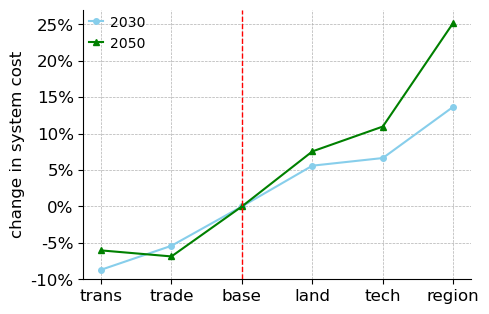

In [41]:
scenarios = ['trans', 'trade', 'base', 'land', 'tech','region'] # plot sequence wrt data30
#scenarios = ['Optimal', '+landscape', '+regional', '+technology', '+transmission']
#data = cost_seq_pref_5.loc[['2030'],['percent_change']]
data30 = cost_Ind_pref.unstack(level=0).sort_values(by=[('percent_change', '2030')], ascending=True)

years = [2030, 2040, 2050]
fig, ax = plt.subplots(figsize=(5, 3.5))

line_width = 1.5
scatter_size = 50
r1 = np.arange(len(scenarios))  # 2030 slightly to the left
r2 = np.arange(len(scenarios))  # 2040 at the center
r3 = np.arange(len(scenarios))  # 2050 slightly to the right

#change bar_width accordingly
bar_width = 0.48
plt.plot(r1, data30['percent_change']['2030'], color='skyblue', linewidth=line_width, linestyle='-', marker='o', markersize=4, label='2030')
#plt.plot(r2, data30['percent_change']['2040'], color='orange', linewidth=line_width, linestyle='-', marker='s', markersize=4, label='2040')
plt.plot(r3, data30['percent_change']['2050'], color='green', linewidth=line_width, linestyle='-', marker='^', markersize=4, label='2050')

#plt.plot(r1, data30['percent_change']['2030'], color='skyblue', linestyle='--')
#plt.plot(r2, data30['percent_change']['2030'], color='orange', linestyle='--')
#plt.plot(r3, data30['percent_change']['2030'], color='green', linestyle='--')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
#custom x-axis
#ax.set_xticks([r + bar_width for r in range(len(scenarios))])
ax.set_xticks(np.arange(len(scenarios)))
ax.set_xticklabels(scenarios, ha='center',fontsize=12)
ax.set_xlim(-0.25, 5.25)

#custom y-axis
ax.set_ylim(-10, 27) 
ax.set_yticks(np.arange(-10, 27, 5))
ax.tick_params(axis='y', which='major', labelsize=12)
ax.set_ylabel('change in system cost', fontsize=12)

# Add percent signs to the y-tick labels
def percent_formatter(x, pos):
    return f'{x:.0f}%'
ax.yaxis.set_major_formatter(FuncFormatter(percent_formatter))

#Horizontal line
ax.axvline(x=2, color='red', linestyle='--', linewidth=1)

ax.legend(loc='upper left', borderaxespad=0., frameon=False, 
          fontsize=10, handlelength=1, handletextpad=0.5)

ax.spines['left'].set_visible(True)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['right'].set_visible(False)

#for spine in ax2.spines.values():
#    spine.set_edgecolor('black')

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/ppt_systemcostChange.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/ppt_systemcostChange.png', dpi=300, transparent=True, bbox_inches='tight')


#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/ScenariosPriorityImpact_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/ScenariosPriorityImpact_2050.png', dpi=300, transparent=True, bbox_inches='tight')
plt.show()

In [60]:
# Comments
# cost variaitons due to the consideration of each preference individually

In [61]:
filtered_cost

costs  \
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs variable                
2050       Subsurf      2      OPT         CWD             fylketechD  costs     8535.468085   
2040       DefaultYes   2      QS1         CWDHA           fylketechC  costs     9485.273982   
2030       DefaultYes   2      QS1         CWDH            fylketechD  costs     5349.386340   
                        1      OPT         CWD             fylketechD  costs     5445.491412   
2050       LOWOH        1      OPT         CWD             fylketechC  costs     9819.423261   
...                                                                                      ...   
           DefaultYes   1      OPT         CWD             fylketechD  costs     9837.183122   
2030       Subsurf      2      QS1         CWDH            fylketechC  costs     4956.912742   
           DefaultYes   1      OPT         CWDH            fylketechC  costs     6190.769534   
2040       LOWOH        1      OPT         CWDHAF          fylketechC  costs     8444.735432   
2030       Subsurf      2      OPT         CWDH            fylketechD  costs     4733.955418   

                                                                                 percent_change  
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs variable                  
2050       Subsurf      2      OPT         CWD             fylketechD  costs         -13.232599  
2040       DefaultYes   2      QS1         CWDHA           fylketechC  costs          11.244366  
2030       DefaultYes   2      QS1         CWDH            fylketechD  costs          -1.764856  
                        1      OPT         CWD             fylketechD  costs           0.000000  
2050       LOWOH        1      OPT         CWD             fylketechC  costs          -0.180538  
...                                                                                         ...  
           DefaultYes   1      OPT         CWD             fylketechD  costs           0.000000  
2030       Subsurf      2      QS1         CWDH            fylketechC  costs          -8.972169  
           DefaultYes   1      OPT         CWDH            fylketechC  costs          13.686150  
2040       LOWOH        1      OPT         CWDHAF          fylketechC  costs          -0.959188  
2030       Subsurf      2      OPT         CWDH            fylketechD  costs         -13.066516  

[288 rows x 2 columns]

/tmp/ipykernel_593739/1837627912.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), ha='center', fontsize=14)
/tmp/ipykernel_593739/1837627912.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(y_ticks, fontsize=14)


<Figure size 600x400 with 0 Axes>

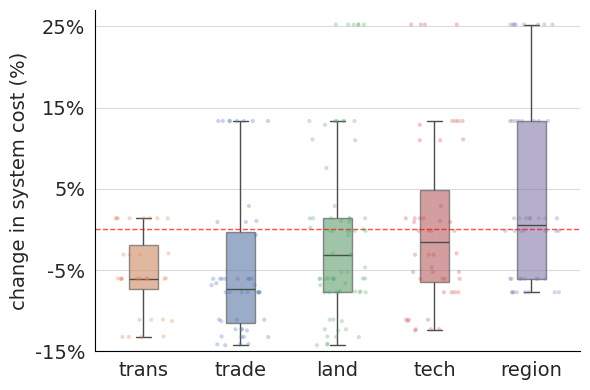

In [58]:
#Boxplot showing the impact of preferring the given preference (ImpExp==2)
# Set up the plot
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
colors = sns.color_palette("deep", n_colors=5)

def remove_outliers(data, low, high):
    return data[(data >= low) & (data <= high)]

year = '2050'
data_to_plot = []

cost_trading = filtered_cost[(filtered_cost.index.get_level_values('ImpExp') == '2') & 
                (filtered_cost.index.get_level_values('demandyear') == year)].copy()
cost_trading['scenarios'] = 'trade'    
cost_landscapes = filtered_cost[(filtered_cost.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost.index.get_level_values('demandyear') == year)].copy()
cost_landscapes['scenarios'] = 'land'
cost_technology = filtered_cost[(filtered_cost.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost.index.get_level_values('demandyear') == year)].copy()
cost_technology['scenarios'] = 'tech'      
cost_transmission = filtered_cost[(filtered_cost.index.get_level_values('transmission') == 'Subsurf') & 
                (filtered_cost.index.get_level_values('demandyear') == year)].copy()
cost_transmission['scenarios'] = 'trans'    
cost_regional = filtered_cost[(filtered_cost.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost.index.get_level_values('demandyear') == year)].copy()
cost_regional['scenarios'] = 'region'
costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
costs_combined['Year'] = year
data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

fig, ax = plt.subplots(figsize=(6, 4))

# Outlier ranges for each scenario
outlier_ranges = {
    'trade': (-100, 100),
    'trans': (-100, 100),
    'land': (-100, 100),
    'tech': (-100, 100),
    'region': (-100, 100)
}

scenario_order = ['trans', 'trade', 'land', 'tech', 'region']


year_data = data_to_plot[data_to_plot['Year'] == year]
    
# Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
b = sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.3, boxprops=dict(alpha=0.6), ax=ax,
            order=scenario_order, hue='scenarios', palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              hue='scenarios', ax=b, alpha=0.3, jitter=0.3, size=3, palette=colors)
    
# Customize subplot

ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), ha='center', fontsize=14)
ax.set_ylim(-15, 27)
y_ticks = [-15, -5, 5, 15, 25]
ax.set_yticklabels(y_ticks, fontsize=14)
ax.set_yticks(y_ticks)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax.grid(True, axis='y', linestyle='-', alpha=0.7)
ax.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.7)    
ax.set_ylabel('change in system cost (%)', fontsize=14)

sns.despine()

ax.spines['left'].set_visible(True)
#ax2.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(True)
#ax2.spines['right'].set_visible(False)

for spine in ax.spines.values():
    spine.set_edgecolor('black')



plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/ppt_ScenariosPriorityImpact_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/ppt_ScenariosPriorityImpact_2050.png', dpi=300, transparent=True, bbox_inches='tight')
plt.show()


/tmp/ipykernel_3926348/1422984633.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='scenarios', y='percent_change', data=year_data,
/tmp/ipykernel_3926348/1422984633.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order,
/tmp/ipykernel_3926348/1422984633.py:78: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[idx].set_xticklabels(axes[idx].get_xticklabels(), ha='center')
/tmp/ipykernel_3926348/1422984633.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the sa

<Figure size 1000x300 with 0 Axes>

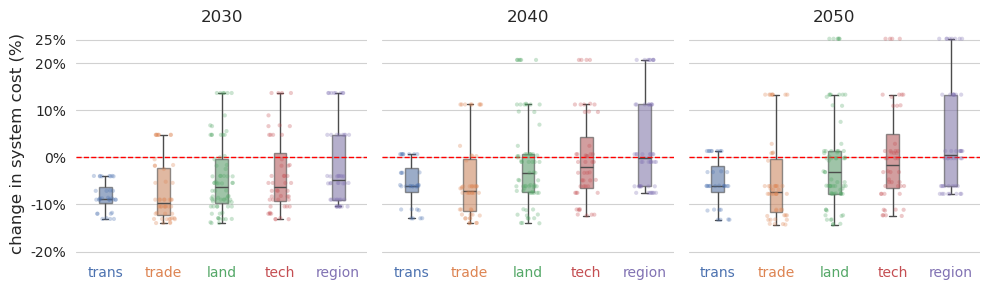

In [63]:
#Boxplot showing the impact of preferring the given preference (ImpExp==2)
# Set up the plot


filtered_cost2 = cost[(cost.index.get_level_values('transmission').isin(['Subsurf', 'DefaultYes', 'LOWOH']))&
                      (cost.index.get_level_values('ImpExp').isin(['1', '2']))
]

plt.figure(figsize=(10, 3))
sns.set_style("whitegrid")
colors = sns.color_palette("deep", n_colors=5)

def remove_outliers(data, low, high):
    return data[(data >= low) & (data <= high)]

demand_years = ['2030', '2040', '2050']
data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '2') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

fig, axes = plt.subplots(1, 3, figsize=(10, 3), sharey=True)

# Outlier ranges for each scenario
outlier_ranges = {
    'trade': (-100, 100),
    'trans': (-100, 100),
    'land': (-100, 100),
    'tech': (-100, 100),
    'region': (-100, 100)
}

scenario_order = ['trans', 'trade', 'land', 'tech', 'region']

for idx, year in enumerate(demand_years):
    year_data = data_to_plot[data_to_plot['Year'] == year]
    
    # Remove outliers
    for scenario in year_data['scenarios'].unique():
        mask = year_data['scenarios'] == scenario
        year_data.loc[mask, 'percent_change'] = remove_outliers(
            year_data.loc[mask, 'percent_change'],
            outlier_ranges[scenario][0],
            outlier_ranges[scenario][1]
        )
    # Create boxplot
    sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
                width=0.22, boxprops=dict(alpha=0.6), ax=axes[idx],
                order=scenario_order, palette=colors, showfliers=False)
    
    # Add strip plot
    sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
                  ax=axes[idx], alpha=0.3, jitter=0.2, size=3, palette=colors)

    
    # Customize subplot
    axes[idx].set_title(f'{year}', fontsize=12)
    axes[idx].set_xlabel('')
    axes[idx].set_xticklabels(axes[idx].get_xticklabels(), ha='center')
    axes[idx].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
    axes[idx].grid(True, axis='y', linestyle='-', alpha=0.9)
    axes[idx].axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
    axes[idx].spines['left'].set_visible(False)
    axes[idx].spines['top'].set_visible(False)
    axes[idx].spines['right'].set_visible(False)
    axes[idx].spines['bottom'].set_visible(False)
    
    xtick_label_colors = {label: color for label, color in zip(scenario_order, colors)}

    for tick in axes[idx].get_xticklabels():
        text = tick.get_text()
        if text in xtick_label_colors:
            tick.set_color(xtick_label_colors[text])

    
    #axes[idx].spines['bottom'].set_color('black')

    # Only show y-label for the first subplot
    if idx == 0:
        axes[idx].set_ylabel('change in system cost (%)', fontsize=12)
        axes[idx].set_ylim(-21, 27)
        y_ticks = [-20, -10, 0, 10, 20, 25]
        axes[idx].set_yticks(y_ticks)
    else:
        axes[idx].set_ylabel('')

#sns.despine()
plt.tight_layout()
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/ScenariosPrioirityImpact_allyears.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/ScenariosPrioirityImpact_allyears.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

/tmp/ipykernel_3926348/3290412374.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='scenarios', y='percent_change', data=year_data,
/tmp/ipykernel_3926348/3290412374.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order,
/tmp/ipykernel_3926348/3290412374.py:79: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(ax1.get_xticklabels(), ha='center')
/tmp/ipykernel_3926348/3290412374.py:137: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<Figure size 1000x300 with 0 Axes>

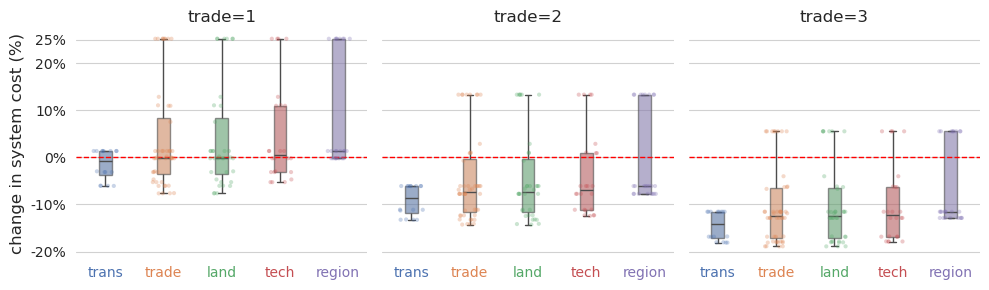

In [66]:
#Boxplot showing the impact of different trading levels impact on choice scenarios

filtered_cost2 = cost[(cost.index.get_level_values('transmission').isin(['Subsurf', 'DefaultYes', 'LOWOH']))&
                      (cost.index.get_level_values('ImpExp').isin(['1', '2', '3']))
]


plt.figure(figsize=(10, 3))
sns.set_style("whitegrid")
colors = sns.color_palette("deep", n_colors=5)

def remove_outliers(data, low, high):
    return data[(data >= low) & (data <= high)]

demand_years = ['2050']
data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '1') & 
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '1')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '1')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '1')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '1')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 3), sharey=True)

# Outlier ranges for each scenario
outlier_ranges = {
    'trade': (-100, 100),
    'trans': (-100, 100),
    'land': (-100, 100),
    'tech': (-100, 100),
    'region': (-100, 100)
}

scenario_order = ['trans', 'trade', 'land', 'tech', 'region']

year_data = data_to_plot[data_to_plot['Year'] == '2050']
    
    # Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax1,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax1, alpha=0.3, jitter=0.2, size=3, palette=colors)



# Customize subplot
ax1.set_title("trade=1", fontsize=12)
ax1.set_xlabel('')
#for tick, color in zip(ax1.get_xticklabels(), colors):
#    tick.set_color(color)
ax1.set_xticklabels(ax1.get_xticklabels(), ha='center')
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax1.grid(True, axis='y', linestyle='-', alpha=0.9)
ax1.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
ax1.spines['left'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
#axes[idx].spines['bottom'].set_color('black')

xtick_label_colors = {label: color for label, color in zip(scenario_order, colors)}

for tick in ax1.get_xticklabels():
    text = tick.get_text()
    if text in xtick_label_colors:
        tick.set_color(xtick_label_colors[text])

ax1.set_ylabel('change in system cost (%)', fontsize=12)
ax1.set_ylim(-21, 27)
y_ticks = [-20, -10, 0, 10, 20, 25]
ax1.set_yticks(y_ticks)


data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '2') &  
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '2')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '2')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '2')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '2')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

year_data = data_to_plot[data_to_plot['Year'] == '2050']
    
    # Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax2,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax2, alpha=0.3, jitter=0.2, size=3, palette=colors)
    
# Customize subplot
ax2.set_title("trade=2", fontsize=12)
ax2.set_xlabel('')
ax2.set_xticklabels(ax2.get_xticklabels(), ha='center')
#ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax2.grid(True, axis='y', linestyle='-', alpha=0.9)
ax2.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
ax2.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)

for tick in ax2.get_xticklabels():
    text = tick.get_text()
    if text in xtick_label_colors:
        tick.set_color(xtick_label_colors[text])

#ax1.set_ylabel('change in system cost (%)', fontsize=12)
ax2.set_ylim(-21, 27)
y_ticks = [-20, -10, 0, 10, 20, 25]
ax2.set_yticks(y_ticks)
ax2.set_ylabel('')


data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '3') &  
                (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '3')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '3')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '3')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('ImpExp') == '3')&(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

year_data = data_to_plot[data_to_plot['Year'] == '2050']
    
    # Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax3,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax3, alpha=0.3, jitter=0.2, size=3, palette=colors)
    
# Customize subplot
ax3.set_title("trade=3", fontsize=12)
ax3.set_xlabel('')
ax3.set_xticklabels(ax3.get_xticklabels(), ha='center')
#ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax3.grid(True, axis='y', linestyle='-', alpha=0.9)
ax3.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
ax3.spines['left'].set_visible(False)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['bottom'].set_visible(False)

for tick in ax3.get_xticklabels():
    text = tick.get_text()
    if text in xtick_label_colors:
        tick.set_color(xtick_label_colors[text])

#ax1.set_ylabel('change in system cost (%)', fontsize=12)
ax3.set_ylim(-21, 27)
y_ticks = [-20, -10, 0, 10, 20, 25]
ax3.set_yticks(y_ticks)
ax3.set_ylabel('')

#sns.despine()
plt.tight_layout()
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/TradingImpact_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/TradingImpact_2050.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

/tmp/ipykernel_3926348/4071405876.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='scenarios', y='percent_change', data=year_data,
/tmp/ipykernel_3926348/4071405876.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order,
/tmp/ipykernel_3926348/4071405876.py:79: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(ax1.get_xticklabels(), ha='center')
/tmp/ipykernel_3926348/4071405876.py:137: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<Figure size 1000x300 with 0 Axes>

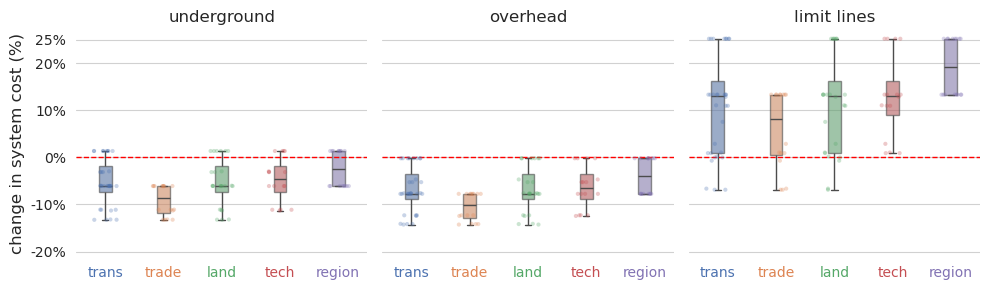

In [69]:
#Boxplot showing the impact of different transmission choices on choice-scenarios

filtered_cost2 = cost[(cost.index.get_level_values('transmission').isin(['Subsurf', 'DefaultYes', 'LOWOH']))&
                      (cost.index.get_level_values('ImpExp').isin(['1', '2']))
]


plt.figure(figsize=(10, 3))
sns.set_style("whitegrid")
colors = sns.color_palette("deep", n_colors=5)

def remove_outliers(data, low, high):
    return data[(data >= low) & (data <= high)]

demand_years = ['2050']
data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '2') & 
                (filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('transmission') == 'Subsurf') &(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('transmission') == 'Subsurf') &(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & 
                        (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('transmission') == 'Subsurf') & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 3), sharey=True)

# Outlier ranges for each scenario
outlier_ranges = {
    'trade': (-100, 100),
    'trans': (-100, 100),
    'land': (-100, 100),
    'tech': (-100, 100),
    'region': (-100, 100)
}

scenario_order = ['trans', 'trade', 'land', 'tech', 'region']

year_data = data_to_plot[data_to_plot['Year'] == '2050']
    
    # Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax1,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax1, alpha=0.3, jitter=0.2, size=3, palette=colors)



# Customize subplot
ax1.set_title("underground", fontsize=12)
ax1.set_xlabel('')
#for tick, color in zip(ax1.get_xticklabels(), colors):
#    tick.set_color(color)
ax1.set_xticklabels(ax1.get_xticklabels(), ha='center')
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax1.grid(True, axis='y', linestyle='-', alpha=0.9)
ax1.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
ax1.spines['left'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
#axes[idx].spines['bottom'].set_color('black')

xtick_label_colors = {label: color for label, color in zip(scenario_order, colors)}

for tick in ax1.get_xticklabels():
    text = tick.get_text()
    if text in xtick_label_colors:
        tick.set_color(xtick_label_colors[text])

ax1.set_ylabel('change in system cost (%)', fontsize=12)
ax1.set_ylim(-21, 27)
y_ticks = [-20, -10, 0, 10, 20, 25]
ax1.set_yticks(y_ticks)


data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '2') & 
                (filtered_cost2.index.get_level_values('transmission') == 'LOWOH') & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('transmission') == 'LOWOH') &(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('transmission') == 'LOWOH') &(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'LOWOH') & 
                        (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('transmission') == 'LOWOH') & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

year_data = data_to_plot[data_to_plot['Year'] == '2050']
    
    # Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax2,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax2, alpha=0.3, jitter=0.2, size=3, palette=colors)
    
# Customize subplot
ax2.set_title("overhead", fontsize=12)
ax2.set_xlabel('')
ax2.set_xticklabels(ax2.get_xticklabels(), ha='center')
#ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax2.grid(True, axis='y', linestyle='-', alpha=0.9)
ax2.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
ax2.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)

for tick in ax2.get_xticklabels():
    text = tick.get_text()
    if text in xtick_label_colors:
        tick.set_color(xtick_label_colors[text])

#ax1.set_ylabel('change in system cost (%)', fontsize=12)
ax2.set_ylim(-21, 27)
y_ticks = [-20, -10, 0, 10, 20, 25]
ax2.set_yticks(y_ticks)
ax2.set_ylabel('')


data_to_plot = []
for year in demand_years:
    cost_trading = filtered_cost2[(filtered_cost2.index.get_level_values('ImpExp') == '2') & 
                (filtered_cost2.index.get_level_values('transmission') == 'DefaultYes') & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_trading['scenarios'] = 'trade'    
    cost_landscapes = filtered_cost2[(filtered_cost2.index.get_level_values('corines_onshore').isin(['CWDH', 'CWDHA', 'CWDHAF']))& #== 'CWDHAF') & 
                (filtered_cost2.index.get_level_values('transmission') == 'DefaultYes')  & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_landscapes['scenarios'] = 'land'
    cost_technology = filtered_cost2[(filtered_cost2.index.get_level_values('varnewpcapQ') == 'QS1') & 
                (filtered_cost2.index.get_level_values('transmission') == 'DefaultYes')  &(filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_technology['scenarios'] = 'tech'      
    cost_transmission = filtered_cost2[(filtered_cost2.index.get_level_values('transmission') == 'DefaultYes') & 
                        (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_transmission['scenarios'] = 'trans'    
    cost_regional = filtered_cost2[(filtered_cost2.index.get_level_values('fylke_techs') == 'fylketechC') & 
                (filtered_cost2.index.get_level_values('transmission') == 'DefaultYes') & (filtered_cost2.index.get_level_values('demandyear') == year)].copy()
    cost_regional['scenarios'] = 'region'
    costs_combined = pd.concat([cost_trading, cost_transmission, cost_landscapes, cost_technology, cost_regional], axis=0)
    costs_combined['Year'] = year
    data_to_plot.append(costs_combined)

data_to_plot = pd.concat(data_to_plot, axis=0)
data_to_plot.reset_index(inplace=True)

year_data = data_to_plot[data_to_plot['Year'] == '2050']
    
    # Remove outliers
for scenario in year_data['scenarios'].unique():
    mask = year_data['scenarios'] == scenario
    year_data.loc[mask, 'percent_change'] = remove_outliers(
        year_data.loc[mask, 'percent_change'],
        outlier_ranges[scenario][0],
        outlier_ranges[scenario][1]
    )
# Create boxplot
sns.boxplot(x='scenarios', y='percent_change', data=year_data, 
            width=0.22, boxprops=dict(alpha=0.6), ax=ax3,
            order=scenario_order, palette=colors, showfliers=False)

# Add strip plot
sns.stripplot(x='scenarios', y='percent_change', data=year_data, order=scenario_order, 
              ax=ax3, alpha=0.3, jitter=0.2, size=3, palette=colors)
    
# Customize subplot
ax3.set_title("limit lines", fontsize=12)
ax3.set_xlabel('')
ax3.set_xticklabels(ax3.get_xticklabels(), ha='center')
#ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x:.0f}%"))
ax3.grid(True, axis='y', linestyle='-', alpha=0.9)
ax3.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=1)
ax3.spines['left'].set_visible(False)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['bottom'].set_visible(False)

for tick in ax3.get_xticklabels():
    text = tick.get_text()
    if text in xtick_label_colors:
        tick.set_color(xtick_label_colors[text])

#ax1.set_ylabel('change in system cost (%)', fontsize=12)
ax3.set_ylim(-21, 27)
y_ticks = [-20, -10, 0, 10, 20, 25]
ax3.set_yticks(y_ticks)
ax3.set_ylabel('')

#sns.despine()
plt.tight_layout()
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/TransmissionImpact_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/TransmissionImpact_2050.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

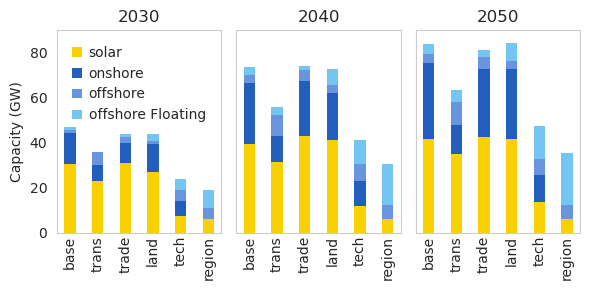

In [94]:
# Create the plot
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(6, 3))
axes = [ax1, ax2, ax3]
years = ['2030', '2040', '2050']

for ax, year in zip(axes, years):
    year_data = all_cap_plot[all_cap_plot.index.get_level_values('demandyear') == year]
    bottom = np.zeros(len(year_data))
    
    for technology in ['Solar',  'Windonshore', 'Windoffshore', 'Windoffshorefloating']:
        ax.bar(year_data.index.get_level_values('scenarios'), year_data[technology], width=0.4, 
               bottom=bottom, label=technology, color=colordict[technology], linewidth=0, edgecolor='none')
        bottom += year_data[technology].values
    
    ax.set_title(f'{year}', fontsize=12)
    ax1.set_ylabel('Capacity (GW)', fontsize=10)
    ax.set_ylim(0, 90)
    ax.set_yticks(range(0, 91, 20))
    #ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.tick_params(axis='x', labelsize=10, rotation=90, pad=-1)
    ax.tick_params(axis='y', labelsize=10)
    ax.grid(False)

    if ax != ax1:  # Remove y-axis tick labels for 2nd and 3rd plots
        ax.set_yticklabels([])

# Customize the plot
custom_labels = ['solar',  'onshore', 'offshore', 'offshore Floating']
handles, _ = ax1.get_legend_handles_labels()
fig.legend(handles, custom_labels, loc='upper center', bbox_to_anchor=(0.24, 0.85), borderaxespad=0., frameon=False, 
          fontsize=10, handlelength=0.7, handletextpad=0.5)
fig.tight_layout()


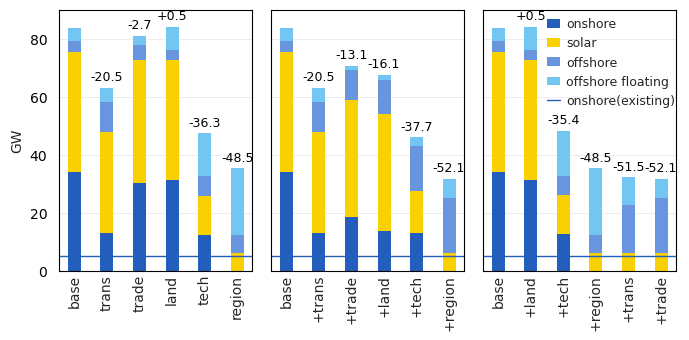

In [105]:
#Plotting the capacities for Ind, trading, regional sceanrios
fig, axes = plt.subplots(1, 3, figsize=(7, 3.5))
#Choose year to plot
years = '2050'
plot_data = [all_cap_plot, all_cap_plot_trade, all_cap_plot_region]

for ax, dataset in zip(axes, plot_data):
    
    year_data = dataset[dataset.index.get_level_values('demandyear') == year]
    bottom = np.zeros(len(year_data))

    scenario_labels = year_data.index.get_level_values('scenarios').unique()
    cumulative_heights = {scenario: np.zeros(len(year_data)) for scenario in scenario_labels}

    #for technology in ['Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore']:
    for technology in ['Windonshore', 'Solar', 'Windoffshore', 'Windoffshorefloating']:
        bars = ax.bar(year_data.index.get_level_values('scenarios'), year_data[technology], width=0.4, 
            bottom=bottom, label=technology, color=colordict[technology], linewidth=0, edgecolor='none')

        for bar, scenario in zip(bars, year_data.index.get_level_values('scenarios')):
            cumulative_heights[scenario] += bar.get_height()
    
        bottom += year_data[technology].values
    
   
    ax.set_ylim(0, 90)
    ax.set_yticks(range(0, 91, 20))
    #ax.set_yticklabels([str(i) for i in range(0, 91, 20)], fontsize=10, color="black")
    ax.grid(False)
    ax.yaxis.grid(True, color='gray', linestyle='-', linewidth=0.5,  alpha=0.2)

    ax.tick_params(axis='x', labelsize=10, rotation=90, pad=-1)
    ax.tick_params(axis='y', labelsize=10, direction='out', length=5, width=2, colors='black')

    for spine in ax.spines.values():
        spine.set_edgecolor('black')

    if ax != axes[0]:  # Remove y-axis tick labels for other plots except the first one
        ax.set_yticklabels([])
    ax.tick_params(axis='y', labelsize=10, direction='out', length=5, width=2, colors='black')
    optim_total = year_data.loc[year_data.index.get_level_values('scenarios') == 'base'].sum(axis=1).values[0]
    for scenario in year_data.index.get_level_values('scenarios').unique():
        if scenario != 'base':
            scenario_total = year_data[year_data.index.get_level_values('scenarios') == scenario].sum(axis=1).values[0]
            difference = scenario_total - optim_total
            bar_index = np.where(year_data.index.get_level_values('scenarios') == scenario)[0][0]
            bar_height = cumulative_heights[scenario][bar_index]
            ax.annotate(f'{difference:+.1f}', xy=(bars[bar_index].get_x() + bars[bar_index].get_width() / 2,
                                                  bar_height),
                        xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9, color='black')

for ax in axes:
    ax.axhline(y=5, color='#235ebc', linestyle='-', linewidth=1)

axes[0].set_ylabel('GW', fontsize=10)
custom_labels = ['onshore', 'solar', 'offshore', 'offshore floating', 'onshore(existing)']
handles, _ = axes[0].get_legend_handles_labels()
handles.append(ax.lines[0])
fig.legend(handles, custom_labels, loc='upper center', bbox_to_anchor=(0.88, 0.95), borderaxespad=0., frameon=False, 
           fontsize=9, handlelength=1, handletextpad=0.5)

fig.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/capacities_new_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/capacities_new_2050.png', transparent=True, dpi=300, bbox_inches='tight')

plt.show()
    

    

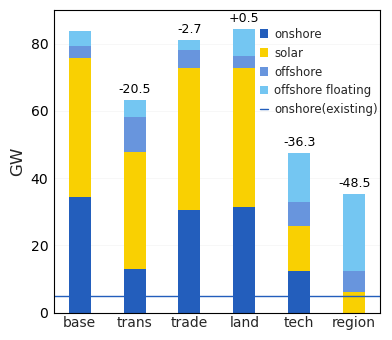

In [379]:
#Plotting the capacities for Ind, trading, regional sceanrios
fig, ax = plt.subplots(figsize=(4, 3.5))
#Choose year to plot
years = '2050'
dataset = all_cap_plot

    
year_data = dataset[dataset.index.get_level_values('demandyear') == year]
bottom = np.zeros(len(year_data))

scenario_labels = year_data.index.get_level_values('scenarios').unique()
cumulative_heights = {scenario: np.zeros(len(year_data)) for scenario in scenario_labels}

    #for technology in ['Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore']:
for technology in ['Windonshore', 'Solar', 'Windoffshore', 'Windoffshorefloating']:
    bars = ax.bar(year_data.index.get_level_values('scenarios'), year_data[technology], width=0.4, 
        bottom=bottom, label=technology, color=colordict[technology], linewidth=0, edgecolor='none')

    for bar, scenario in zip(bars, year_data.index.get_level_values('scenarios')):
            cumulative_heights[scenario] += bar.get_height()
    
    bottom += year_data[technology].values
    
   
ax.set_ylim(0, 90)
ax.set_yticks(range(0, 91, 20))
ax.grid(False)
ax.grid(True, axis='y', linestyle='-', linewidth=0.5, alpha=0.2)

ax.tick_params(axis='x', labelsize=10, rotation=0, pad=-1)
ax.tick_params(axis='y', labelsize=10, direction='out', length=5, width=2, colors='black', pad=-1)

for spine in ax.spines.values():
    spine.set_edgecolor('black')

    
optim_total = year_data.loc[year_data.index.get_level_values('scenarios') == 'base'].sum(axis=1).values[0]
for scenario in year_data.index.get_level_values('scenarios').unique():
    if scenario != 'base':
        scenario_total = year_data[year_data.index.get_level_values('scenarios') == scenario].sum(axis=1).values[0]
        difference = scenario_total - optim_total
        bar_index = np.where(year_data.index.get_level_values('scenarios') == scenario)[0][0]
        bar_height = cumulative_heights[scenario][bar_index]
        ax.annotate(f'{difference:+.1f}', xy=(bars[bar_index].get_x() + bars[bar_index].get_width() / 2,
                                                  bar_height),
                        xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9, color='black')

ax.axhline(y=5, color='#235ebc', linestyle='-', linewidth=1)


ax.set_ylabel('GW', fontsize=12)
custom_labels = ['onshore', 'solar', 'offshore', 'offshore floating', 'onshore(existing)']
handles, _ = ax.get_legend_handles_labels()
handles.append(ax.lines[0])
fig.legend(handles, custom_labels, loc='upper center', bbox_to_anchor=(0.81, 0.92), borderaxespad=0., frameon=False, 
           fontsize=8.5, handlelength=0.7, handletextpad=0.5)

fig.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/ppt_capacities_2050.png', dpi=300, transparent=True, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/ppt_capacities_2050.png', dpi=300, bbox_inches='tight')

plt.show()
    

    

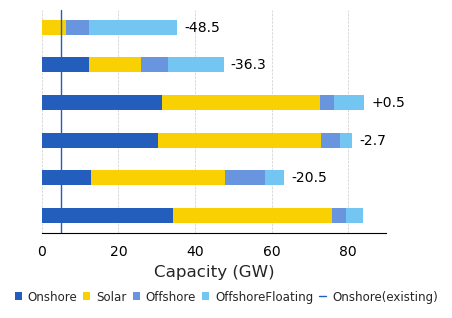

In [109]:
# Plot for poster

#Plotting the capacities for Ind, trading, regional sceanrios
fig, ax = plt.subplots(figsize=(4, 3))
#Choose year to plot
years = '2050'
dataset = all_cap_plot

    
year_data = dataset[dataset.index.get_level_values('demandyear') == year]
left = np.zeros(len(year_data))

scenario_labels = year_data.index.get_level_values('scenarios').unique()
cumulative_widths = {scenario: np.zeros(len(year_data)) for scenario in scenario_labels}

    #for technology in ['Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore']:
for technology in ['Windonshore', 'Solar', 'Windoffshore', 'Windoffshorefloating']:
    bars = ax.barh(year_data.index.get_level_values('scenarios'), year_data[technology], height=0.4, 
        left=left, label=technology, color=colordict[technology], linewidth=0, edgecolor='none')

    for bar, scenario in zip(bars, year_data.index.get_level_values('scenarios')):
            cumulative_widths[scenario] += bar.get_width()
    
    left += year_data[technology].values
    
   
ax.set_xlim(0, 90)
ax.set_xticks(range(0, 91, 20))
ax.grid(False)
ax.grid(True, axis='x', linestyle='--', linewidth=0.5)

#ax.tick_params(axis='y', labelsize=10, rotation=0,)# pad=-1)
ax.tick_params(axis='x', labelsize=10, direction='out', length=5, width=2, colors='black',)# pad=-1)

for spine in ax.spines.values():
    spine.set_edgecolor('Black')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

scenario_text = ['Cost optimal', 'Transmission lines', 'Electricity trading', 'Landscape choices', 'Technology preferences', 
                        'Regional preferences']

optim_total = year_data.loc[year_data.index.get_level_values('scenarios') == 'optim'].sum(axis=1).values[0]
for i, scenario in enumerate (year_data.index.get_level_values('scenarios').unique()):
    if scenario != 'optim':
        scenario_total = year_data[year_data.index.get_level_values('scenarios') == scenario].sum(axis=1).values[0]
        difference = scenario_total - optim_total
        #bar_index = np.where(year_data.index.get_level_values('scenarios') == scenario)[0][0]
        bar_width = cumulative_widths[scenario][i]
        ax.annotate(f'{difference:+.1f}', xy=(bar_width, i),
                        xytext=(5, 0), textcoords="offset points", ha='left', va='center', fontsize=10, color='black')

#ax.text(50, 5.45, 'Regional preferences', ha='right', va='center', fontsize=10, fontweight='bold')
#ax.text(55, 4.45, 'Technology preferences', ha='right', va='center', fontsize=10, fontweight='bold')
#ax.text(45, 3.45, 'Landscape choices', ha='right', va='center', fontsize=10, fontweight='bold')
#ax.text(43, 2.45, 'Electricity trading', ha='right', va='center', fontsize=10, fontweight='bold')
#ax.text(43.5, 1.45, 'Transmission lines', ha='right', va='center', fontsize=10, fontweight='bold')
#ax.text(32, 0.45, 'Cost optimal', ha='right', va='center', fontsize=10, fontweight='bold')

ax.axvline(x=5, color='#235ebc', linestyle='-', linewidth=1)

ax.set_yticks([])
ax.set_xlabel('Capacity (GW)', fontsize=12)
custom_labels = ['Onshore', 'Solar', 'Offshore', 'OffshoreFloating', 'Onshore(existing)']
handles, _ = ax.get_legend_handles_labels()
handles.append(ax.lines[0])
fig.legend(handles, custom_labels, loc='upper right', bbox_to_anchor=(1.05, 0.03), ncol=len(custom_labels), borderaxespad=0., frameon=False, 
           fontsize=8.5, handlelength=0.6, handletextpad=0.5, labelspacing=0.1, columnspacing=0.5)

#fig.legend(handles, custom_labels, loc='upper right', bbox_to_anchor=(1.05, 0.95), borderaxespad=0., frameon=False, 
#           fontsize=9.5, handlelength=0.7, handletextpad=0.5)

fig.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/capacities_2050_posterHTL.png', dpi=300, transparent=True, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/capacities_new_2050.jpg', dpi=300, bbox_inches='tight')

plt.show()



# Demand


In [109]:
# How much demand do we see in each scenario?
dem = makenice(found_scenarios, "demand")

  0%|          | 0/960 [00:00<?, ?it/s]

In [115]:
demandyears = (dem.query("transmission == 'DefaultYes' and fylke_techs == 'fylketechD' and "
              "varnewpcapQ == 'OPT' and corines_onshore == 'CWDHAF' and ImpExp == '1'")
               .query("demandyear in ['2030', '2040', '2050']").groupby('demandyear').sum().div(1000))

<AxesSubplot: xlabel='demandyear'>

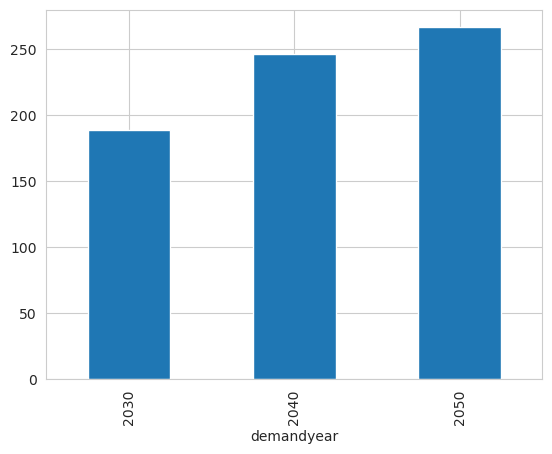

In [116]:
demandyears['value'].plot(kind = 'bar')

In [118]:
fylke_demand = (dem.query("transmission == 'DefaultYes' and fylke_techs == 'fylketechD' and "
              "varnewpcapQ == 'OPT' and corines_onshore == 'CWDHAF' and ImpExp == '1'")
               .query("demandyear in ['2050']").groupby(['demandyear', 'zone']).sum().div(1000))

In [1407]:
fylke_demand

value
demandyear zone           
2050       NO03  16.739944
           NO11  28.438827
           NO15  25.333990
           NO18  23.371044
           NO30  36.418417
           NO34  13.257118
           NO38  24.398412
           NO42  19.922544
           NO46  42.929789
           NO50  20.457088
           NO54  14.960058

In [365]:
#Demand is TWh because it already converted into GWh by model and further here divided by 1000.
demand_2050_TWh = {
    'NO42': (19.9225544), 'NO11': (28.438827), 'NO38': (24.398412),
    'NO30': (36.418417), 'NO46': (42.929789), 'NO15': (25.333990),
    'NO03': (16.739944), 'NO34': (13.257118), 'NO50': (20.457088),
    'NO18': (23.371044), 'NO54': (14.960058) 
}
Norway['demand_2050_TWh'] = Norway.index.map(lambda x: demand_2050_TWh.get(x, None))

/tmp/ipykernel_3926348/2718719580.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


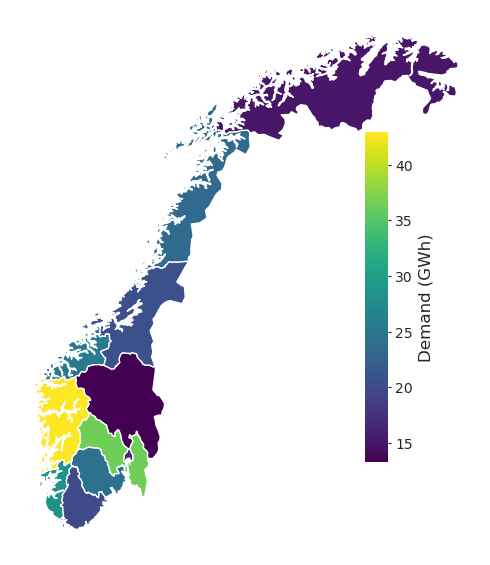

In [157]:
# Plot the map with demand values using color gradient
fig, ax = plt.subplots(1, 1, figsize=(5, 6))

Norway.plot(ax=ax, column='demand_2050_TWh', cmap='viridis', legend=False)

ax_color_scale = fig.add_axes([0.74, 0.2, 0.045, 0.55])  # Adjust position as needed
cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=Norway['demand_2050_TWh'].min(), 
                         vmax=Norway['demand_2050_TWh'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
cb.set_label('Demand (GWh)', fontsize=12)

cb.outline.set_visible(False)
cb.ax.tick_params(length=2)

ax.axis('off')
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/demand_2050.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/demand_2050.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()


In [ ]:
NStatisD = fylke_demand.query("zone== 'NO54' or zone == 'NO18'").sum()
SStatisD = fylke_demand.query("zone== 'NO42'").sum()
EStatisD = fylke_demand.query("zone== 'NO30' or zone == 'NO34' or zone == 'NO03' or zone == 'NO38'").sum()
WStatisD = fylke_demand.query("zone== 'NO46' or zone == 'NO15' or zone == 'NO11'").sum()
CStatisD = fylke_demand.query("zone== 'NO50'").sum()

In [1413]:
(EStatisD+SStatisD)/fylke_demand.sum()

value    0.415947
dtype: float64

In [1415]:
EStatisD

value    90.81389
dtype: float64

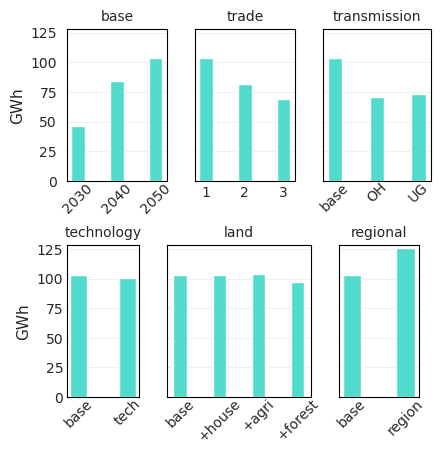

In [173]:
#Storage plot
#fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(8, 4.5))
fig = plt.figure(figsize=(4, 4))

#"Lion": "#baf238",
#"PumpedHydro": "#51dbcc",

# Format: [left, bottom, width, height]
ax1 = fig.add_axes([0.05, 0.57, 0.25, 0.38]) 
ax2 = fig.add_axes([0.37, 0.57, 0.25, 0.38])  
ax3 = fig.add_axes([0.69, 0.57, 0.27, 0.38])  
ax4 = fig.add_axes([0.05, 0.03, 0.18, 0.38]) 
ax5 = fig.add_axes([0.30, 0.03, 0.36, 0.38])  
ax6 = fig.add_axes([0.73, 0.03, 0.20, 0.38])

# Plot 1
categories = store_optim.index
values = store_optim['storeecaptot']
ax1.bar(categories, values, color='#51dbcc', width=0.35)
ax1.set_xticks(categories)
ax1.tick_params(axis='x', labelsize=10, rotation=45, pad=-4)
#ax1.set_xticklabels(categories, ha='center')
ax1.set_ylabel('GWh', fontsize=11)
ax1.set_ylim(0, max(values) * 1.1)
ax1.set_title('base', fontsize=10)
ax1.grid(axis='y', linestyle='-', alpha=0.7)
ax1.grid(axis='x', which='both', linestyle='-', linewidth=0)
for spine in ax1.spines.values():
        spine.set_edgecolor('black')
ax1.grid(False)

# Plot 2
categories = ['1', '2', '3']
values = store_ImpExp['storeecaptot']
ax2.bar(categories, values, color='#51dbcc', width=0.35)
ax2.set_xticks(categories)
ax2.tick_params(axis='x', labelsize=10, rotation=0, pad=0)
ax2.set_xticklabels(categories, ha='center')
ax2.set_yticklabels([])
ax2.set_ylim(0, max(values) * 1.1)
ax2.set_title('trade', fontsize=10)
ax2.grid(axis='y', linestyle='-', alpha=0.7)
ax2.grid(axis='x', which='both', linestyle='-', linewidth=0)
for spine in ax2.spines.values():
        spine.set_edgecolor('black')
ax2.grid(False)

# Plot 3
categories = ['base', 'OH', 'UG']
values = store_trans['storeecaptot']
ax3.bar(categories, values, color='#51dbcc', width=0.35)
ax3.set_xticks(categories)
ax3.tick_params(axis='x', labelsize=10, rotation=45, pad=-4)
ax3.set_yticklabels([])
ax3.set_xticklabels(categories, ha='center')
#ax3.set_ylabel('Storage Capacity')
ax3.set_ylim(0, max(values) * 1.1)
ax3.set_title('transmission', fontsize=10)
ax3.grid(axis='y', linestyle='-', alpha=0.7)
ax3.grid(axis='x', which='both', linestyle='-', linewidth=0)
for spine in ax3.spines.values():
        spine.set_edgecolor('black')
ax3.grid(False)

#ylim = int(max(values) * 1.1)
ylim = 128
#ax1.set_ylim(0, max(values) * 1.1)
ax1.set_ylim(0, ylim)
ax1.set_yticks(range(0, ylim, 25))
#ax2.set_ylim(0, max(values) * 1.1)
ax2.set_ylim(0, ylim)
ax2.set_yticks(range(0, ylim, 25))
#ax3.set_ylim(0, max(values) * 1.1)
ax3.set_ylim(0, ylim)
ax3.set_yticks(range(0, ylim, 25))
ax1.grid(axis='y', linestyle='-', alpha=0.3)
ax1.grid(axis='x', which='both', linestyle='-', linewidth=0)
ax2.grid(axis='y', linestyle='-', alpha=0.3)
ax2.grid(axis='x', which='both', linestyle='-', linewidth=0)
ax3.grid(axis='y', linestyle='-', alpha=0.3)
ax3.grid(axis='x', which='both', linestyle='-', linewidth=0)


# Plot 4
categories = ['base', 'tech']
values = store_tech['storeecaptot']
ax4.bar(categories, values, color='#51dbcc', width=0.35)
ax4.set_xticks(categories)
ax4.tick_params(axis='x', labelsize=10, rotation=45, pad=-4)
ax4.tick_params(axis='y', labelsize=10, rotation=0, pad=-1)
#ax4.tick_params(axis='x', which='major')
ax4.set_xticklabels(categories, ha='center')
ax4.set_ylabel('GWh', fontsize=11)
ax4.set_ylim(0, max(values) * 1.1)
ax4.set_title('technology', fontsize=10)
ax4.grid(axis='y', linestyle='-', alpha=0.7)
ax4.grid(axis='x', which='both', linestyle='-', linewidth=0)
for spine in ax4.spines.values():
        spine.set_edgecolor('black')
ax4.grid(False)

# Plot 5
categories = ['base', '+house', '+agri', '+forest']
values = store_land['storeecaptot']
ax5.bar(categories, values, color='#51dbcc', width=0.35)
ax5.set_xticks(categories)
#ax5.tick_params(axis='x', which='major')
ax5.set_xticklabels(categories, ha='center')
ax5.tick_params(axis='x', labelsize=10, rotation=45, pad=-4)
ax5.set_yticklabels([])
ylim = int(max(values) * 1.1)
ax5.set_ylim(0, max(values) * 1.1)
ax5.set_yticks(range(0, ylim, 50))
ax5.set_title('land', fontsize=10)
ax5.grid(axis='y', linestyle='-', alpha=0.7)
ax5.grid(axis='x', which='both', linestyle='-', linewidth=0)
for spine in ax5.spines.values():
        spine.set_edgecolor('black')
ax5.grid(False)

# Plot 6
categories = ['base', 'region']
values = store_region['storeecaptot']
ax6.bar(categories, values, color='#51dbcc', width=0.35)
ax6.set_xticks(categories)
ax6.tick_params(axis='x', labelsize=10, rotation=45, pad=-4)
#ax6.tick_params(axis='x', which='major')
ax6.set_xticklabels(categories, ha='center')
ax6.set_yticklabels([])
#ax.set_ylim(0, 90)
ylim = int(max(values) * 1.02)
ax6.set_ylim(0, max(values) * 1.02)
ax6.set_yticks(range(0, ylim, 25))
ax6.set_title('regional', fontsize=10)
ax6.grid(axis='y', linestyle='-', alpha=0.3)
ax6.grid(axis='x', which='both', linestyle='-', linewidth=0)
for spine in ax6.spines.values():
        spine.set_edgecolor('black')
#ax6.grid(False)

ax4.set_ylim(0, max(values) * 1.02)
ax4.set_yticks(range(0, ylim, 25))
ax5.set_ylim(0, max(values) * 1.02)
ax5.set_yticks(range(0, ylim, 25))
ax5.grid(axis='y', linestyle='-', alpha=0.3)
ax5.grid(axis='x', which='both', linestyle='-', linewidth=0)
ax4.grid(axis='y', linestyle='-', alpha=0.3)
ax4.grid(axis='x', which='both', linestyle='-', linewidth=0)

#fig.tight_layout()  # Adjust the layout so labels don't overlap

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/storageCapNew_scenarios.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/storageCapNew_scenarios.png', dpi=300, transparent=True, bbox_inches='tight')
plt.show()  


In [ ]:
#timespan beocmes important to conisder the impact of given preference. For instance, regional preference will be
#challenging for 2050 compared to 2040 where land prefennce is driving the needed storage capacity

In [159]:
storetotZ = makenice(found_scenarios, "store_totecap_z")

  0%|          | 0/960 [00:00<?, ?it/s]

In [184]:
storetotZ

storecaptot
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology  level_2                
2030       DefaultNO    2      QS1         CWDH            fylketechC  NO03 Li-ion-8    level      4.479228e+00
                                                                                        lo         0.000000e+00
                                                                                        marginal   0.000000e+00
                                                                                        up        1.000000e+100
                                                                            PumpedHydro level      0.000000e+00
...                                                                                                         ...
           Subsurf      2      OPT         CWDH            fylketechD  NO54 Li-ion-8    up        1.000000e+100
                                                                            PumpedHydro level      0.000000e+00
                                                                                        lo         0.000000e+00
                                                                                        marginal   0.000000e+00
                                                                                        up         0.000000e+00

[84480 rows x 1 columns]

In [185]:
storetotZ_Lion = storetotZ.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
                                          slice(None), slice(None),
                                          ['Li-ion-8'], 'level')].droplevel("level_2")
filtered_storetotZ_Lion= storetotZ_Lion[(storetotZ_Lion.index.get_level_values('transmission') != 'DefaultNO')&
                      (storetotZ_Lion.index.get_level_values('ImpExp').isin(['1', '2', '3']))]

grouped = storetotZ_Ind_pref.groupby(['demandyear', 'Scenario Name'])
storetotZ_Ind_pref['normalized'] = grouped['storecaptot'].transform(lambda x: np.sqrt(x / x.max()))
storetotZ_Ind_pref                                     



In [186]:
filtered_storetotZ_Lion= storetotZ_Lion[(storetotZ_Lion.index.get_level_values('transmission') != 'DefaultNO')&
                      (storetotZ_Lion.index.get_level_values('ImpExp').isin(['1', '2', '3']))]

In [187]:
storetotZ_Ind_pref=filtered_storetotZ_Lion.query(Ind_query_string_2)

In [188]:
storetotZ_Ind_pref

storecaptot
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology              
2030       DefaultYes   1      OPT         CWD             fylketechD  NO03 Li-ion-8    7.426757e+00
                                                                       NO11 Li-ion-8    1.471247e-07
                                                                       NO15 Li-ion-8    1.354046e-05
                                                                       NO18 Li-ion-8    2.222062e-07
                                                                       NO30 Li-ion-8    2.565226e+01
...                                                                                              ...
2050       DefaultYes   1      OPT         CWD             fylketechD  NO38 Li-ion-8    7.773242e+00
                                                                       NO42 Li-ion-8    8.165844e-06
                                                                       NO46 Li-ion-8    5.159523e-05
                                                                       NO50 Li-ion-8    9.631763e+00
                                                                       NO54 Li-ion-8    9.529139e+00

[198 rows x 1 columns]

In [189]:
scenario_dict = { #for independent preferences scenarios
    ('DefaultYes', '1', 'OPT', 'CWD', 'fylketechD'): {'scenario': 'base', 'order': 1},
    ('Subsurf', '1', 'OPT', 'CWD', 'fylketechD'): {'scenario': 'trans', 'order': 2},
    ('DefaultYes', '2', 'OPT', 'CWD', 'fylketechD'): {'scenario': 'trade', 'order': 3},
    ('DefaultYes', '1', 'OPT', 'CWDHAF', 'fylketechD'): {'scenario': 'land', 'order': 4},
    ('DefaultYes', '1', 'QS1', 'CWD', 'fylketechD'): {'scenario': 'tech', 'order': 5},
    ('DefaultYes', '1', 'OPT', 'CWD', 'fylketechC'): {'scenario': 'region', 'order': 6}    
}
def map_scenario(row):
    scenario_key = tuple(row[['transmission', 'ImpExp', 'varnewpcapQ', 'corines_onshore', 'fylke_techs']])
    scenario_info = scenario_dict.get(scenario_key, {'scenario': 'Unknown Scenario', 'order': -1})
    return pd.Series([scenario_info['scenario'], scenario_info['order']], 
                     index=['Scenario Name', 'Scenario Index'])
AA = storetotZ_Ind_pref.reset_index().apply(map_scenario, axis=1)
storetotZ_Ind_pref = pd.concat([storetotZ_Ind_pref.reset_index(), AA], axis=1)

In [190]:
storetotZ_Ind_pref = (storetotZ_Ind_pref.drop(columns=["transmission", "ImpExp", "varnewpcapQ",
                    "corines_onshore", "fylke_techs"]))


In [191]:
grouped = storetotZ_Ind_pref.groupby(['demandyear', 'Scenario Name'])
storetotZ_Ind_pref['normalized'] = grouped['storecaptot'].transform(lambda x: np.sqrt(x / x.max()))
storetotZ_Ind_pref                                     

,demandyear,zone,technology,storecaptot,Scenario Name,Scenario Index,normalized
0,2030,NO03,Li-ion-8,7.426757e+00,base,1,0.538068
1,2030,NO11,Li-ion-8,1.471247e-07,base,1,0.000076
2,2030,NO15,Li-ion-8,1.354046e-05,base,1,0.000727
3,2030,NO18,Li-ion-8,2.222062e-07,base,1,0.000093
4,2030,NO30,Li-ion-8,2.565226e+01,base,1,1.000000
...,...,...,...,...,...,...,...
193,2050,NO38,Li-ion-8,7.773242e+00,base,1,0.369916
194,2050,NO42,Li-ion-8,8.165844e-06,base,1,0.000379
195,2050,NO46,Li-ion-8,5.159523e-05,base,1,0.000953
196,2050,NO50,Li-ion-8,9.631763e+00,base,1,0.411770


In [192]:
storetotZ_Ind_pref[(storetotZ_Ind_pref['demandyear'] == '2050') & 
                    (storetotZ_Ind_pref['Scenario Name'] == 'region')]

,demandyear,zone,technology,storecaptot,Scenario Name,Scenario Index,normalized
154,2050,NO03,Li-ion-8,33.036723,region,6,0.933620
155,2050,NO11,Li-ion-8,0.000002,region,6,0.000230
156,2050,NO15,Li-ion-8,37.901560,region,6,1.000000
157,2050,NO18,Li-ion-8,2.186268,region,6,0.240172
158,2050,NO30,Li-ion-8,0.000176,region,6,0.002156
159,2050,NO34,Li-ion-8,8.343465,region,6,0.469186
160,2050,NO38,Li-ion-8,0.000002,region,6,0.000232
161,2050,NO42,Li-ion-8,0.000002,region,6,0.000254
162,2050,NO46,Li-ion-8,24.456631,region,6,0.803285
163,2050,NO50,Li-ion-8,13.936122,region,6,0.606377


In [1042]:
optim_2050['piesize'] = np.sqrt(optim_2050['storecaptot'] / optim_2050['storecaptot'].max()) * 1000

/tmp/ipykernel_1600841/4108092195.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  optim_2050['piesize'] = np.sqrt(optim_2050['storecaptot'] / optim_2050['storecaptot'].max()) * 1000


In [193]:
Norway

,name,geometry,available_area_proportion,disagree_area_proportion,existing_hydro_ecap,demand_2050_GWh
NO03,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017...",0.028767,0.882317,0.000,16.739944
NO11,Rogaland,"MULTIPOLYGON (((6.39763 58.27300, 6.34752 58.2...",0.172801,0.269752,324.950,28.438827
NO15,Møre og Romsdal,"MULTIPOLYGON (((5.46168 62.00674, 5.46803 62.0...",0.193538,0.224314,0.000,25.333990
NO18,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65...",0.199754,0.162317,0.000,23.371044
NO30,Viken,"MULTIPOLYGON (((11.08302 59.07730, 11.08237 59...",0.093058,0.692719,0.000,36.418417
NO34,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852...",0.235504,0.550388,0.000,13.257118
NO38,Vestfold og Telemark,"POLYGON ((10.28443 59.69571, 10.29721 59.69180...",0.088886,0.585787,0.000,24.398412
NO42,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ...",0.085288,0.462611,0.000,19.922554
NO46,Vestland,"MULTIPOLYGON (((5.05714 60.19367, 5.05437 60.2...",0.288490,0.234149,65.452,42.929789
NO50,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62...",0.149781,0.314106,8.987,20.457088


In [1174]:
Norway['existing_hydro_ecap']

NO03      0.000
NO11    324.950
NO15      0.000
NO18      0.000
NO30      0.000
NO34      0.000
NO38      0.000
NO42      0.000
NO46     65.452
NO50      8.987
NO54      0.000
Name: existing_hydro_ecap, dtype: float64

/tmp/ipykernel_3926348/2927052135.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid
/tmp/ipykernel_3926348/2927052135.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


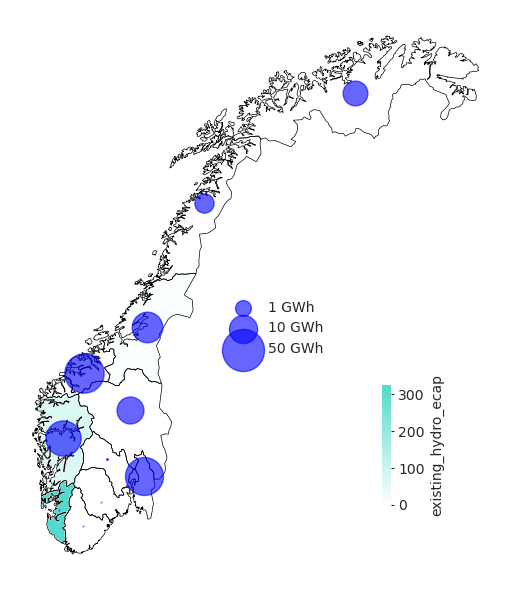

In [194]:
#plot storage

df = storetotZ_Ind_pref[(storetotZ_Ind_pref['demandyear'] == '2050') & 
                    (storetotZ_Ind_pref['Scenario Name'] == 'region')]

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
cmap = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])
Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap)
Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)

#cmap = plt.get_cmap('Greens')
ax_color_scale = fig.add_axes([0.71, 0.15, 0.015, 0.2])
norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
                         vmax=Norway['existing_hydro_ecap'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
cb.set_label('existing_hydro_ecap', fontsize=10)
new_ticks = [0, 100, 200, 300]
cb.set_ticks(new_ticks)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2)


max_size = 800

centroids = Norway.centroid

offset_dict = {
    'NO42': [0, 0],
    'NO03': [0.6, 0],
    'NO54': [0, 0],
    'NO15': [0, 0],
    'NO38': [0, -0.2],
    'NO50': [0, 0],
    'NO11': [0, 0],
    'NO34': [0, 0.2],
    'NO30': [-0.8, 0.3],
    'NO18': [0, 0],
    'NO46': [0, 0],
}


# Create circles at each zone's centroid
for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
    #zone = row['zone']
    plotdata = df[df['zone'] == i]
    size = plotdata['normalized'].iloc[0]*max_size
    value = plotdata['storecaptot'].iloc[0]
    offset_x, offset_y = offset_dict[i]
    if size > 0:  # Only plot if there's storage capacity
        ax.scatter(
            centroids.x[i]+offset_x,
            centroids.y[i]+offset_y,
            s=size,
            alpha=0.6,
            color="blue",
            zorder=1
        )
ax.axis('off')

# Add a legend with size reference
legend_elements = [
    plt.scatter([], [], s=np.sqrt(x/df['storecaptot'].max()) * max_size, 
                color='blue', alpha=0.6, label=f'{x:.0f} GWh')
    for x in [1, 10, 50]  # Reference values for legend
]
ax.legend(handles=legend_elements, 
         borderaxespad=0,frameon=False,fontsize=10, 
         bbox_to_anchor=(0.65, 0.5))

plt.tight_layout()
plt.show()


/tmp/ipykernel_3926348/3530399943.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid
/tmp/ipykernel_3926348/3530399943.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


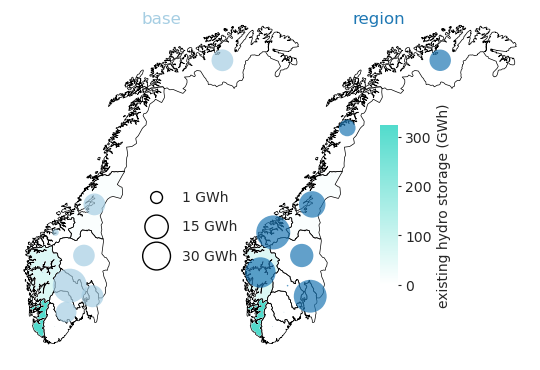

In [199]:
#plot storage

df = storetotZ_Ind_pref[(storetotZ_Ind_pref['demandyear'] == '2050')]

fig, axes = plt.subplots(1, 2, figsize=(5.5, 4))
fig.subplots_adjust(wspace=-0.5, left=0.15, right=0.75, top=0.5, bottom=0.15)

cmap = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])

for ax in axes:
    Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap)
    Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)
    ax.axis('off')

centroids = Norway.centroid

offset_dict = {
    'NO42': [0, 0],
    'NO03': [0.6, 0],
    'NO54': [0, 0],
    'NO15': [0, 0],
    'NO38': [0, -0.2],
    'NO50': [0, 0],
    'NO11': [0, 0],
    'NO34': [0, 0.2],
    'NO30': [-0.8, 0.3],
    'NO18': [0, 0],
    'NO46': [0, 0],
}

max_size = 600

palette = {
    'base': sns.color_palette('Paired')[0],
    'region': sns.color_palette('Paired')[1]
}


for i, scenario in enumerate(['base', 'region']):
    ax = axes[i]
    data = df[df['Scenario Name'] == scenario]
    tot_store = [data['storecaptot'].sum()]
    ax.set_title(scenario, color=palette[scenario], fontsize=12, pad=-10)
    for z in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        plotdata = data[data['zone'] == z]
        size = plotdata['normalized'].iloc[0]*max_size
        value = plotdata['storecaptot'].iloc[0]        
        offset_x, offset_y = offset_dict[z]
        if size > 0:  # Only plot if there's storage capacity
            ax.scatter(
                centroids.x[z]+offset_x,
                centroids.y[z]+offset_y,
                s=size,
                alpha=0.7,
                color=palette[scenario],
                edgecolor='none',
                zorder=1
                )


# Add a legend with size reference
legend_elements = [
    plt.scatter([], [], s=np.sqrt(x/df['storecaptot'].max()) * max_size, 
                color='none', edgecolor='black', label=f'{x:.0f} GWh')
    for x in [1, 15, 30]  # Reference values for legend
]
fig.legend(handles=legend_elements, 
         borderaxespad=0,frameon=False,fontsize=10, 
         bbox_to_anchor=(0.45, 0.5), ncol=1, labelspacing=1.1)


ax_color_scale = fig.add_axes([0.7, 0.25, 0.032, 0.4])
norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
                         vmax=Norway['existing_hydro_ecap'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
cb.set_label('existing hydro storage (GWh)', fontsize=10)
new_ticks = [0, 100, 200, 300]
cb.set_ticks(new_ticks)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2)


plt.tight_layout()
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/store_ecap_zonal_main.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/store_ecap_zonal_main.png', dpi=300, transparent=True, bbox_inches='tight')
plt.show()


/tmp/ipykernel_3926348/73621463.py:16: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = Norway.centroid
/tmp/ipykernel_3926348/73621463.py:87: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


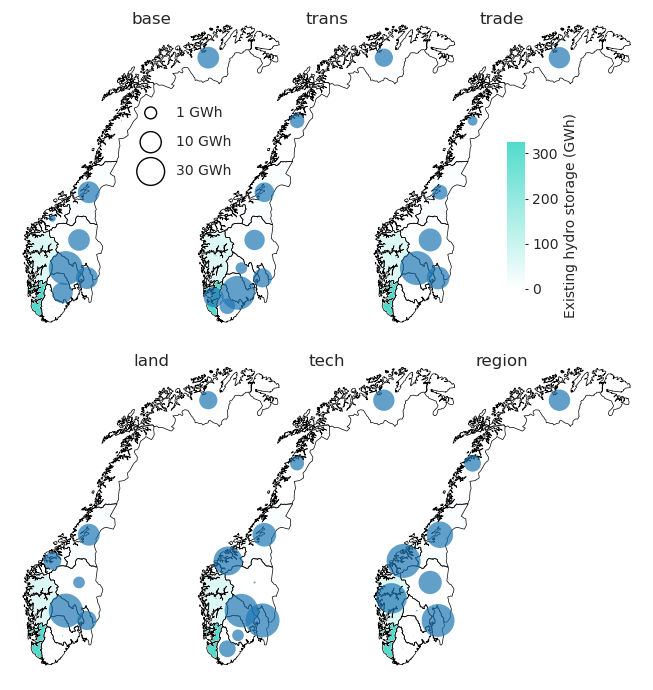

In [201]:
#plot storage

df = storetotZ_Ind_pref[(storetotZ_Ind_pref['demandyear'] == '2050')]

fig, axes = plt.subplots(2, 3, figsize=(9, 7))
fig.subplots_adjust(wspace=-0.8, left=0.15, right=0.75, top=0.3, bottom=0.2)
axes = axes.flatten()

cmap = LinearSegmentedColormap.from_list("custom_cmap", ['white', '#51dbcc'])

for ax in axes:
    Norway.plot(ax=ax, column='existing_hydro_ecap', cmap=cmap)
    Norway.boundary.plot(ax=ax, linewidth=0.5, color='black', zorder=1)
    ax.axis('off')

centroids = Norway.centroid

offset_dict = {
    'NO42': [0, 0],
    'NO03': [0.6, 0],
    'NO54': [0, 0],
    'NO15': [0, 0],
    'NO38': [0, -0.2],
    'NO50': [0, 0],
    'NO11': [0, 0],
    'NO34': [0, 0.2],
    'NO30': [-0.8, 0.3],
    'NO18': [0, 0],
    'NO46': [0, 0],
}

max_size = 600

palette = {
    'base': sns.color_palette('Paired')[1],
    'region': sns.color_palette('Paired')[1]
}
0.7


for i, scenario in enumerate(['base', 'trans', 'trade', 'land', 'tech', 'region']):
    ax = axes[i]
    data = df[df['Scenario Name'] == scenario]
    tot_store = [data['storecaptot'].sum()]
    ax.set_title(scenario,fontsize=12, pad=-10)
    for z in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        plotdata = data[data['zone'] == z]
        size = plotdata['normalized'].iloc[0]*max_size
        value = plotdata['storecaptot'].iloc[0]        
        offset_x, offset_y = offset_dict[z]
        if size > 0:  # Only plot if there's storage capacity
            ax.scatter(
                centroids.x[z]+offset_x,
                centroids.y[z]+offset_y,
                s=size,
                alpha=0.7,
                color=palette['base'],
                edgecolor='none',
                zorder=1
                )


# Add a legend with size reference
legend_elements = [
    plt.scatter([], [], s=np.sqrt(x/df['storecaptot'].max()) * max_size, 
                color='none', edgecolor='black', label=f'{x:.0f} GWh')
    for x in [1, 10, 30]  # Reference values for legend
]
fig.legend(handles=legend_elements, 
         borderaxespad=0,frameon=False,fontsize=10, 
         bbox_to_anchor=(0.40, 0.85), ncol=1, labelspacing=1.1)

ax_color_scale = fig.add_axes([0.7, 0.58, 0.02, 0.21])
norm = plt.Normalize(vmin=Norway['existing_hydro_ecap'].min(), 
                         vmax=Norway['existing_hydro_ecap'].max())
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
cb.set_label('Existing hydro storage (GWh)', fontsize=10)
new_ticks = [0, 100, 200, 300]
cb.set_ticks(new_ticks)
cb.outline.set_visible(False)
cb.ax.tick_params(length=2)




plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/store_ecap_zonal2.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/store_ecap_zonal2.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

In [ ]:
storage_pcap = makenice(sqlite_list, "storage_pcap")

In [ ]:
storage_pcap

In [ ]:
# FX the RoR
# Dispatch (when is the pgen used)
# aggregate to national dispatch, plot demand and pgen and see when pgen happens
# random 500 hours

In [ ]:
scale = 1
(
    p_cap2.reindex(
        p_cap2.groupby(["scenario"]).sum().sort_index()
        # .sort_values("installed_capacity_GW")
        .index.to_list(),
        level=0,
    )
    .unstack()
    .loc[:, "installed_capacity_GW"]
    .plot.barh(
        stacked=True,
        title="Norwegian installed generation capacity 2030 (Weather year/Nature_Fauna_Sami_Neighbours_Solar)",
        ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
    )
)
# plt.savefig("output.svg", bbox_inches="tight")
# fig = plot.get_figure()
# fig.savefig("output.svg")

# is there a cutoff now?
# drop the grid.

In [ ]:
(p_cap2.unstack().loc[:, "installed_capacity_GW"])

In [ ]:
# get rid of the left three bars
scale = 1
(
    p_cap2
    # .reindex(
    #    p_cap2.groupby(["scenario"])
    #    .sum()
    #    #.sort_index()
    #    .sort_values("installed_capacity_GW")
    #    .index.to_list(),
    #    level=0,
    # )
    .unstack()
    .loc[:, "installed_capacity_GW"]
    .loc[:, ["Gas", "GasCCS", "OnWind", "Solar", "Windoffshore"]]
    .plot.bar(
        stacked=True,
        title="Norwegian installed generation capacity (without hydro) 2030 (Weather year/Nature_Fauna_Sami_Neighbours_Solar)",
        ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
    )
)

In [ ]:
# build a small scenario table
# Why no batteries? Costs?

In [ ]:
# Have a (REGIONAL) run with no wind at all for non extreme ones.

In [ ]:
# Existing wind does not produce cause it has no area
# One of them could be the baseline (none scenario/todays system)

In [ ]:
# Why does Hydro RoR change?
# Why is there still wind in the extreme cases?
# What is the storage situation like?

In [ ]:
p_cap2.assign(scen=lambda df: df.index.get_level_values(0).str[64:-11])

In [ ]:
scen

In [ ]:
pd.read_parquet(
    "/cluster/work/projects/ec85/joint-wind/model-aggregated/results/models/1995/corrected_wind_capacity_factors_1995.parquet"
)

## Total generation capacity


In [ ]:
pcaptot = pd.concat(
    [
        storage_pcap.rename(columns={"storepcaptot": "pcaptot"}),
        caps.rename(columns={"gencaptot": "pcaptot"}),
    ],
    axis=0,
).sort_index()

In [ ]:
(
    pcaptot.query(
        "level_1 == 'level' and year == '2010' and Spatial== 'grid' and Solar == 'High'"
    )
    .droplevel(["level_1", "year", "Spatial", "Solar", "Cutoff"])
    .unstack()
    .loc[:, "pcaptot"]
    .rename(
        columns={
            "Li-ion-8": "Lion",
            "Windonshore": "OnWind",
            "NaturalgasCCGTwithCCSnewOT": "GasCCS",
            "NaturalgasOCGTnew": "Gas",
            "Windonshore": "OnWind",
        }
    )
    .plot.barh(
        stacked=True,
        title="Norwegian installed generation capacity 2030 (Weather year/Nature_Fauna_Sami_Neighbours_Solar)",
        ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
        # subplots=True
    )
)
# Go into the appendix with the "real optimum" show the "realistic optimum" in the main text

# Do delta plots going up and down plot 4 applied energy

In [ ]:
# How much new transmission is there?

In [ ]:
(
    storetot.query("level_1 == 'level'")
    .droplevel("level_1")
    .unstack()
    .loc[:, "storepcaptot"]
    # .loc[:,["Import","Solar","Windoffshore","Windonshore"]]
    # .sort_values(["Windonshore"])
    # .rename(columns={"Windonshore":"OnWind"})
    .plot.barh(
        stacked=True,
        title="Norwegian electrictiy storage power capcacity 2030",
        # ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        # color=colordict
    )
)

# scatterplot pv correlation with battery

In [ ]:
storetot

In [93]:
shapefile = shpreader.natural_earth(resolution='10m',
                                      category='cultural',
                                      name='admin_1_states_provinces')
world = gpd.read_file(shapefile)
Norway = world[world.iso_a2=="NO"]
Norway = Norway[["iso_3166_2","name","geometry"]]
Norway = Norway.set_index('iso_3166_2').drop(['NO-21', 'NO-X01~'])
#Norway.plot()





In [94]:
Norway

,name,geometry
iso_3166_2,,
NO-19,Troms,"MULTIPOLYGON (((20.62316 69.03636, 20.36272 69..."
NO-18,Nordland,"MULTIPOLYGON (((18.18929 68.53842, 18.17184 68..."
NO-17,Nord-Trøndelag,"MULTIPOLYGON (((14.33207 65.11396, 14.31068 65..."
NO-16,Sør-Trøndelag,"MULTIPOLYGON (((12.05983 63.20477, 12.22270 63..."
NO-04,Hedmark,"POLYGON ((12.27952 62.34421, 12.28636 62.33542..."
NO-02,Akershus,"POLYGON ((11.87463 59.88494, 11.84959 59.87242..."
NO-01,Østfold,"MULTIPOLYGON (((11.88374 59.80538, 11.88980 59..."
NO-20,Finnmark,"MULTIPOLYGON (((28.95408 69.02726, 28.83961 69..."
NO-03,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017..."


/tmp/ipykernel_3476757/2245635907.py:8: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  Nordland = gpd.GeoDataFrame([{'name':'Nordland', 'geometry':Norway.loc[['NO-18']].explode().drop(('NO-18',25)).unary_union}], index=['NO-71'])


<AxesSubplot: >

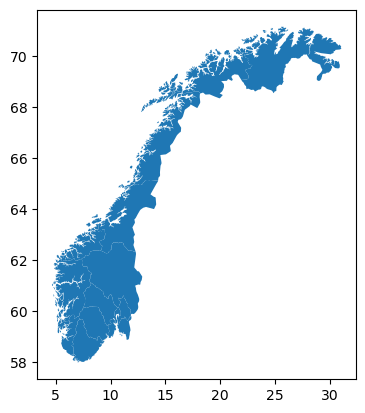

In [95]:
Trøndelag = gpd.GeoDataFrame([{'name':'Trøndelag', 'geometry':Norway.loc[['NO-17', 'NO-16']].unary_union}], index=['NO-60'])
#TromsFinnmark = gpd.GeoDataFrame([{'name':'Troms og Finnmark', 'geometry':Norway.loc[['NO-19', 'NO-20']].unary_union}], index=['NO-54'])
Vestland = gpd.GeoDataFrame([{'name':'Vestland', 'geometry':Norway.loc[['NO-12', 'NO-14']].unary_union}], index=['NO-A2'])
#Viken = gpd.GeoDataFrame([{'name':'Viken', 'geometry':Norway.loc[['NO-02', 'NO-06', 'NO-01']].unary_union}], index=['NO-30'])
Innlandet = gpd.GeoDataFrame([{'name':'Innlandet', 'geometry':Norway.loc[['NO-04', 'NO-05']].unary_union}], index=['NO-73'])
#VestfoldTelemark = gpd.GeoDataFrame([{'name':'Vestfold og Telemark', 'geometry':Norway.loc[['NO-07', 'NO-08']].unary_union}], index=['NO-38'])
Agder = gpd.GeoDataFrame([{'name':'Agder', 'geometry':Norway.loc[['NO-09', 'NO-10']].unary_union}], index=['NO-92'])
Nordland = gpd.GeoDataFrame([{'name':'Nordland', 'geometry':Norway.loc[['NO-18']].explode().drop(('NO-18',25)).unary_union}], index=['NO-71'])

Norway = Norway.drop(['NO-17', 'NO-16', 'NO-12', 'NO-14', 'NO-04', 'NO-05', 'NO-09', 'NO-10', 'NO-18'])
Norway = pd.concat([Norway, Trøndelag.set_crs(Norway.crs),
                    Vestland.set_crs(Norway.crs),Innlandet.set_crs(Norway.crs),
                    Agder.set_crs(Norway.crs), Nordland.set_crs(Norway.crs)])
Norway = Norway.sort_index()
Norway.plot()

In [96]:
replacements = {
    'NO001': 'NO083', # Østfold
    'NO002': 'NO084', # Akershus
    'NO003': 'NO081', # Oslo
    'NO006': 'NO085', # Buskerud
    'NO007': 'NO093', #Vestfold
    'NO008': 'NO094', # Telemark
    'NO011': 'NO0A1', # Rogaland
    'NO015': 'NO0A3', # Møre og Romsdal 	
    'NO019': 'NO072', # Troms
    'NO020': 'NO073', # Finmark
    'NO073': 'NO020', # Innlandet
    'NO060': 'NO060', # Trøndelag
    'NO071': 'NO071', # Nordland
    'NO092': 'NO092', # Agder
    'NO0A2': 'NO0A2', # Vestland
}
Norway.index = Norway.index.str.replace('-', '0')
Norway.index = Norway.index.to_series().replace(replacements)

Norway = Norway.sort_index()
Norway

,name,geometry
NO020,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852..."
NO060,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62..."
NO071,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65..."
NO072,Troms,"MULTIPOLYGON (((20.62316 69.03636, 20.36272 69..."
NO073,Finnmark,"MULTIPOLYGON (((28.95408 69.02726, 28.83961 69..."
NO081,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017..."
NO083,Østfold,"MULTIPOLYGON (((11.88374 59.80538, 11.88980 59..."
NO084,Akershus,"POLYGON ((11.87463 59.88494, 11.84959 59.87242..."
NO085,Buskerud,"POLYGON ((10.48666 59.80317, 10.48455 59.78864..."
NO092,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ..."


In [97]:
existing_hydro_ecap = {
    'NO0A1': (3.969), 'NO0A2': (0.89356), 'NO0A3': (0),
    'NO020': (0), 'NO060': (0.128), 'NO071': (0),
    'NO072': (0), 'NO073': (0), 'NO081': (0),
    'NO083': (0), 'NO084': (0), 'NO085': (0),
    'NO092': (0), 'NO093': (0), 'NO094': (0),
}
Norway['existing_hydro_ecap'] = Norway.index.map(lambda x: existing_hydro_ecap.get(x, None))
Norway


,name,geometry,existing_hydro_ecap
NO020,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852...",0.00000
NO060,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62...",0.12800
NO071,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65...",0.00000
NO072,Troms,"MULTIPOLYGON (((20.62316 69.03636, 20.36272 69...",0.00000
NO073,Finnmark,"MULTIPOLYGON (((28.95408 69.02726, 28.83961 69...",0.00000
NO081,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017...",0.00000
NO083,Østfold,"MULTIPOLYGON (((11.88374 59.80538, 11.88980 59...",0.00000
NO084,Akershus,"POLYGON ((11.87463 59.88494, 11.84959 59.87242...",0.00000
NO085,Buskerud,"POLYGON ((10.48666 59.80317, 10.48455 59.78864...",0.00000
NO092,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ...",0.00000


In [216]:
captotz = makenice(found_scenarios, "cap_z")

captotztech = captotz.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
                                          slice(None), slice(None), ['Solar','Windonshore','Windoffshore','Windoffshorefloating'],
                                          'level')].droplevel(["level_2"])

  0%|          | 0/960 [00:00<?, ?it/s]

In [217]:
gentotz = makenice(found_scenarios, "gen_z")

  0%|          | 0/960 [00:00<?, ?it/s]

In [218]:
gentotz

genamttotz
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology           level_2              
2030       DefaultNO    2      QS1         CWDH            fylketechC  NO03 HydroRoR             value    1.957938e+01
                                                                            Solar                value    7.946128e+02
                                                                            Windonshore          value    1.250994e-12
                                                                       NO11 HydroRoR             value    3.182981e+03
                                                                            Solar                value    5.218070e+02
...                                                                                                                ...
           Subsurf      2      OPT         CWDH            fylketechD  NO54 HydroRoR             value    1.683857e+03
                                                                            Solar                value    8.365886e-06
                                                                            Windoffshore         value    3.435751e-06
                                                                            Windoffshorefloating value    3.015498e-06
                                                                            Windonshore          value    8.733219e+03

[44160 rows x 1 columns]

In [219]:
gentotz = gentotz.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
                                          slice(None), slice(None),
                                          ['Solar','Windonshore','Windoffshore','Windoffshorefloating'])].droplevel("level_2")


In [220]:
gentotz

genamttotz
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology                      
2030       DefaultNO    2      QS1         CWDH            fylketechC  NO03 Solar                 794.612799
                                                                       NO11 Solar                 521.807000
                                                                       NO15 Solar                 269.988972
                                                                       NO18 Solar                 245.581107
                                                                       NO30 Solar                 813.035552
...                                                                                                      ...
           Subsurf      2      OPT         CWDH            fylketechD  NO38 Windoffshorefloating    0.000001
                                                                       NO42 Windoffshorefloating    0.000002
                                                                       NO46 Windoffshorefloating    0.000002
                                                                       NO50 Windoffshorefloating    0.000002
                                                                       NO54 Windoffshorefloating    0.000003

[33600 rows x 1 columns]

In [221]:
captotztech = captotz.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
                                          slice(None), slice(None), ['Solar','Windonshore','Windoffshore','Windoffshorefloating'],
                                          'level')].droplevel(["level_2"])

In [222]:
filtered_gentotz= gentotz[(gentotz.index.get_level_values('transmission') != 'DefaultNO')&
                      (gentotz.index.get_level_values('ImpExp').isin(['1', '2', '3']))]
filtered_captotz= captotztech[(captotztech.index.get_level_values('transmission') != 'DefaultNO')&
                      (captotztech.index.get_level_values('ImpExp').isin(['1', '2', '3']))]
filtered_captotz

gencap
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology                        
2050       Subsurf      2      OPT         CWD             fylketechD  NO03 Solar                 8.200000e-01
                                                                       NO11 Solar                 6.215101e+00
                                                                       NO15 Solar                 1.795441e+00
                                                                       NO18 Solar                 1.510722e-07
                                                                       NO30 Solar                 1.331074e+01
...                                                                                                        ...
2030       Subsurf      2      OPT         CWDH            fylketechD  NO38 Windoffshorefloating  3.924651e-10
                                                                       NO42 Windoffshorefloating  4.289039e-10
                                                                       NO46 Windoffshorefloating  4.077839e-10
                                                                       NO50 Windoffshorefloating  4.873798e-10
                                                                       NO54 Windoffshorefloating  6.936851e-10

[19008 rows x 1 columns]

In [223]:
gentotz_Ind_pref=filtered_gentotz.query(Ind_query_string_2)
captotz_Ind_pref=filtered_captotz.query(Ind_query_string_2)
captotz_Ind_pref

gencap
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology                        
2030       DefaultYes   1      OPT         CWD             fylketechD  NO03 Solar                 2.391954e-07
                                                                       NO11 Solar                 2.121180e-07
                                                                       NO15 Solar                 3.866422e-07
                                                                       NO18 Solar                 9.836116e-08
                                                                       NO30 Solar                 1.511345e+01
...                                                                                                        ...
2050       DefaultYes   1      OPT         CWD             fylketechD  NO38 Windoffshorefloating  2.872714e-09
                                                                       NO42 Windoffshorefloating  3.685379e-09
                                                                       NO46 Windoffshorefloating  6.560283e-09
                                                                       NO50 Windoffshorefloating  4.923725e-09
                                                                       NO54 Windoffshorefloating  1.521486e+00

[792 rows x 1 columns]

In [224]:
scenario_dict = { #for independent preferences scenarios
    ('DefaultYes', '1', 'OPT', 'CWD', 'fylketechD'): {'scenario': 'base', 'order': 1},
    ('Subsurf', '1', 'OPT', 'CWD', 'fylketechD'): {'scenario': 'trans', 'order': 2},
    ('DefaultYes', '2', 'OPT', 'CWD', 'fylketechD'): {'scenario': 'trade', 'order': 3},
    ('DefaultYes', '1', 'OPT', 'CWDHAF', 'fylketechD'): {'scenario': 'land', 'order': 4},
    ('DefaultYes', '1', 'QS1', 'CWD', 'fylketechD'): {'scenario': 'tech', 'order': 5},
    ('DefaultYes', '1', 'OPT', 'CWD', 'fylketechC'): {'scenario': 'region', 'order': 6}    
}
def map_scenario(row):
    scenario_key = tuple(row[['transmission', 'ImpExp', 'varnewpcapQ', 'corines_onshore', 'fylke_techs']])
    scenario_info = scenario_dict.get(scenario_key, {'scenario': 'Unknown Scenario', 'order': -1})
    return pd.Series([scenario_info['scenario'], scenario_info['order']], 
                     index=['Scenario Name', 'Scenario Index'])

In [225]:
AA = gentotz_Ind_pref.reset_index().apply(map_scenario, axis=1)
gentotz_Ind_pref = pd.concat([gentotz_Ind_pref.reset_index(), AA], axis=1)
BB = captotz_Ind_pref.reset_index().apply(map_scenario, axis=1)
captotz_Ind_pref = pd.concat([captotz_Ind_pref.reset_index(), BB], axis=1)
captotz_Ind_pref

,demandyear,transmission,ImpExp,varnewpcapQ,corines_onshore,fylke_techs,zone,technology,gencap,Scenario Name,Scenario Index
0,2030,DefaultYes,1,OPT,CWD,fylketechD,NO03,Solar,2.391954e-07,base,1
1,2030,DefaultYes,1,OPT,CWD,fylketechD,NO11,Solar,2.121180e-07,base,1
2,2030,DefaultYes,1,OPT,CWD,fylketechD,NO15,Solar,3.866422e-07,base,1
3,2030,DefaultYes,1,OPT,CWD,fylketechD,NO18,Solar,9.836116e-08,base,1
4,2030,DefaultYes,1,OPT,CWD,fylketechD,NO30,Solar,1.511345e+01,base,1
...,...,...,...,...,...,...,...,...,...,...,...
787,2050,DefaultYes,1,OPT,CWD,fylketechD,NO38,Windoffshorefloating,2.872714e-09,base,1
788,2050,DefaultYes,1,OPT,CWD,fylketechD,NO42,Windoffshorefloating,3.685379e-09,base,1
789,2050,DefaultYes,1,OPT,CWD,fylketechD,NO46,Windoffshorefloating,6.560283e-09,base,1
790,2050,DefaultYes,1,OPT,CWD,fylketechD,NO50,Windoffshorefloating,4.923725e-09,base,1


In [226]:
captotz_Ind_pref = (captotz_Ind_pref.drop(columns=["transmission", "ImpExp", "varnewpcapQ",
                    "corines_onshore", "fylke_techs"]))#.set_index(["demandyear", "Scenario Index", "Scenario Name"]))
gentotz_Ind_pref = (gentotz_Ind_pref.drop(columns=["transmission", "ImpExp", "varnewpcapQ",
                    "corines_onshore", "fylke_techs"]))#.set_index(["demandyear", "Scenario Index", "Scenario Name"]))
gentotz_Ind_pref

,demandyear,zone,technology,genamttotz,Scenario Name,Scenario Index
0,2030,NO03,Solar,0.000217,base,1
1,2030,NO11,Solar,0.000205,base,1
2,2030,NO15,Solar,0.000332,base,1
3,2030,NO18,Solar,0.000077,base,1
4,2030,NO30,Solar,15678.130942,base,1
...,...,...,...,...,...,...
625,2050,NO38,Windoffshorefloating,0.000010,base,1
626,2050,NO42,Windoffshorefloating,0.000016,base,1
627,2050,NO46,Windoffshorefloating,0.000025,base,1
628,2050,NO50,Windoffshorefloating,0.000017,base,1


In [227]:
gentotz_Ind_pref[(gentotz_Ind_pref['demandyear'] == '2050')&
                      (gentotz_Ind_pref['Scenario Name'] == 'base')]

,demandyear,zone,technology,genamttotz,Scenario Name,Scenario Index
187,2050,NO03,Solar,794.612369,base,1
188,2050,NO11,Solar,2444.313322,base,1
189,2050,NO15,Solar,0.000057,base,1
190,2050,NO18,Solar,0.000040,base,1
191,2050,NO30,Solar,28575.525224,base,1
192,2050,NO34,Solar,0.000048,base,1
193,2050,NO38,Solar,7202.236117,base,1
194,2050,NO42,Solar,852.132528,base,1
195,2050,NO46,Solar,3059.726734,base,1
196,2050,NO50,Solar,0.000032,base,1


In [228]:
def zone_tech_change(df_group, value_column, base_scenario='base', scaling_factor=1):
    if base_scenario in df_group['Scenario Name'].values:
        base_value = df_group.loc[df_group['Scenario Name'] == base_scenario, value_column].values[0]
        df_group['absolute_change'] = df_group[value_column] - base_value
        
        df_group['percent_change'] = np.where(
            base_value != 0,
            (df_group[value_column] - base_value) / base_value,
            np.where(
                df_group[value_column] != 0,
                1,  # Placeholder for large increases when starting from zero
                0  # No change when both are zero
            ))      
        # Calculate the weighted change
        df_group['weighted_change'] = (
            df_group['percent_change'] +
            df_group['absolute_change'] * scaling_factor)
    else:
        # Set changes to NaN when there is no 'optim' scenario to use as a base
        df_group['absolute_change'] = np.nan
        df_group['percent_change'] = np.nan
        df_group['weighted_change'] = np.nan

    return df_group

In [229]:
captotz_Ind_pref_change = (captotz_Ind_pref.groupby(['demandyear', 'zone', 'technology'], group_keys=False).
                     apply(zone_tech_change, value_column='gencap', base_scenario='base', scaling_factor=1))
gentotz_Ind_pref_change = (gentotz_Ind_pref.groupby(['demandyear', 'zone', 'technology'], group_keys=False).
                     apply(zone_tech_change, value_column='genamttotz', base_scenario='base', scaling_factor=0.001))

In [230]:
gentotz_Ind_pref_change

,demandyear,zone,technology,genamttotz,Scenario Name,Scenario Index,absolute_change,percent_change,weighted_change
0,2030,NO03,Solar,0.000217,base,1,0.0,0.0,0.0
1,2030,NO11,Solar,0.000205,base,1,0.0,0.0,0.0
2,2030,NO15,Solar,0.000332,base,1,0.0,0.0,0.0
3,2030,NO18,Solar,0.000077,base,1,0.0,0.0,0.0
4,2030,NO30,Solar,15678.130942,base,1,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
625,2050,NO38,Windoffshorefloating,0.000010,base,1,0.0,0.0,0.0
626,2050,NO42,Windoffshorefloating,0.000016,base,1,0.0,0.0,0.0
627,2050,NO46,Windoffshorefloating,0.000025,base,1,0.0,0.0,0.0
628,2050,NO50,Windoffshorefloating,0.000017,base,1,0.0,0.0,0.0


In [231]:
captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & (captotz_Ind_pref_change['technology'] == 'Windonshore')&
                            (captotz_Ind_pref_change['Scenario Name'] == 'base')]

,demandyear,zone,technology,gencap,Scenario Name,Scenario Index,absolute_change,percent_change,weighted_change
385,2050,NO03,Windonshore,3.622311e-08,base,1,0.0,0.0,0.0
386,2050,NO11,Windonshore,2.589618e-08,base,1,0.0,0.0,0.0
387,2050,NO15,Windonshore,0.000000e+00,base,1,0.0,0.0,0.0
388,2050,NO18,Windonshore,3.046540e+00,base,1,0.0,0.0,0.0
389,2050,NO30,Windonshore,1.115064e+01,base,1,0.0,0.0,0.0
390,2050,NO34,Windonshore,1.978182e-08,base,1,0.0,0.0,0.0
391,2050,NO38,Windonshore,1.690872e-08,base,1,0.0,0.0,0.0
392,2050,NO42,Windonshore,6.198922e-08,base,1,0.0,0.0,0.0
393,2050,NO46,Windonshore,5.462251e+00,base,1,0.0,0.0,0.0
394,2050,NO50,Windonshore,1.298499e+01,base,1,0.0,0.0,0.0


In [232]:
Norway = Norway.to_crs("EPSG:4326").assign(
        center = lambda x : x.geometry.centroid,
        x_coord = lambda x : x.centroid.x,
        y_coord = lambda x : x.centroid.y,
)
Norway

/tmp/ipykernel_3926348/2873928674.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = lambda x : x.geometry.centroid,
/tmp/ipykernel_3926348/2873928674.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  x_coord = lambda x : x.centroid.x,
/tmp/ipykernel_3926348/2873928674.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  y_coord = lambda x : x.centroid.y,


,name,geometry,available_area_proportion,disagree_area_proportion,existing_hydro_ecap,demand_2050_GWh,center,x_coord,y_coord
NO03,Oslo,"POLYGON ((10.75660 59.84416, 10.75847 59.85017...",0.028767,0.882317,0.000,16.739944,POINT (10.65234 59.96925),10.652344,59.969246
NO11,Rogaland,"MULTIPOLYGON (((6.39763 58.27300, 6.34752 58.2...",0.172801,0.269752,324.950,28.438827,POINT (6.22278 59.11269),6.222784,59.112690
NO15,Møre og Romsdal,"MULTIPOLYGON (((5.46168 62.00674, 5.46803 62.0...",0.193538,0.224314,0.000,25.333990,POINT (7.69552 62.60278),7.695516,62.602775
NO18,Nordland,"MULTIPOLYGON (((12.06373 65.04560, 12.07594 65...",0.199754,0.162317,0.000,23.371044,POINT (14.81302 66.91939),14.813023,66.919387
NO30,Viken,"MULTIPOLYGON (((11.08302 59.07730, 11.08237 59...",0.093058,0.692719,0.000,36.418417,POINT (9.87421 60.10487),9.874210,60.104874
NO34,Innlandet,"POLYGON ((11.16219 60.62149, 11.12638 60.59852...",0.235504,0.550388,0.000,13.257118,POINT (10.43534 61.45051),10.435337,61.450511
NO38,Vestfold og Telemark,"POLYGON ((10.28443 59.69571, 10.29721 59.69180...",0.088886,0.585787,0.000,24.398412,POINT (8.72504 59.51194),8.725044,59.511941
NO42,Agder,"POLYGON ((8.22250 58.15168, 8.22242 58.14012, ...",0.085288,0.462611,0.000,19.922554,POINT (7.62799 58.71692),7.627988,58.716915
NO46,Vestland,"MULTIPOLYGON (((5.05714 60.19367, 5.05437 60.2...",0.288490,0.234149,65.452,42.929789,POINT (6.45740 60.94731),6.457400,60.947315
NO50,Trøndelag,"MULTIPOLYGON (((12.09330 62.90743, 12.09702 62...",0.149781,0.314106,8.987,20.457088,POINT (11.44390 63.76109),11.443896,63.761094


In [105]:
for idx, row in Norway.iterrows():
        zone = row.values[0]
        print(idx)
        centroid = row['geometry'].centroid
        x, y = centroid.x, centroid.y


NO03
NO11
NO15
NO18
NO30
NO34
NO38
NO42
NO46
NO50
NO54


In [106]:
#To get the index of maximum values
#max_capacities = {scenario: {tech: cap2040[(cap2040['Scenario Name'] == scenario) & (cap2040['technology'] == tech)]['gencap'].idxmax() 
#                             for tech in technologies} 
#                  for scenario in scenarios}
#max_capacities.loc[26]

In [233]:
(captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & 
                        (captotz_Ind_pref_change['technology'] == 'Windonshore') &
                        (captotz_Ind_pref_change['Scenario Name'] == 'base')]['gencap'].sum())

34.23735462178513

In [234]:
captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & (captotz_Ind_pref_change['technology'] == 'Windonshore')&
                            (captotz_Ind_pref_change['Scenario Name'] == 'base')]

,demandyear,zone,technology,gencap,Scenario Name,Scenario Index,absolute_change,percent_change,weighted_change
385,2050,NO03,Windonshore,3.622311e-08,base,1,0.0,0.0,0.0
386,2050,NO11,Windonshore,2.589618e-08,base,1,0.0,0.0,0.0
387,2050,NO15,Windonshore,0.000000e+00,base,1,0.0,0.0,0.0
388,2050,NO18,Windonshore,3.046540e+00,base,1,0.0,0.0,0.0
389,2050,NO30,Windonshore,1.115064e+01,base,1,0.0,0.0,0.0
390,2050,NO34,Windonshore,1.978182e-08,base,1,0.0,0.0,0.0
391,2050,NO38,Windonshore,1.690872e-08,base,1,0.0,0.0,0.0
392,2050,NO42,Windonshore,6.198922e-08,base,1,0.0,0.0,0.0
393,2050,NO46,Windonshore,5.462251e+00,base,1,0.0,0.0,0.0
394,2050,NO50,Windonshore,1.298499e+01,base,1,0.0,0.0,0.0


In [235]:
(captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & 
                        (captotz_Ind_pref_change['Scenario Name'] == 'region')]['gencap'].sum())

35.30696322531381

In [110]:
Nonshorecap = (captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & 
                        (captotz_Ind_pref_change['technology'] == 'Windonshore') &
                        (captotz_Ind_pref_change['zone'].isin (['NO54', 'NO18'])) & 
                        (captotz_Ind_pref_change['Scenario Name'] == 'region')]['gencap'].sum())
((captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & 
                        (captotz_Ind_pref_change['technology'] == 'Windonshore') &
                        (captotz_Ind_pref_change['zone'].isin (['NO42'])) & 
                        (captotz_Ind_pref_change['Scenario Name'] == 'region')]['gencap'].sum())/
                         (captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050') & 
                        (captotz_Ind_pref_change['Scenario Name'] == 'region')]['gencap'].sum()))  

1.8373092377819368e-14

In [111]:
NStatis = df_pop_area.query("zone== 'NO54' or zone == 'NO18'").sum()
SStatis = df_pop_area.query("zone== 'NO42'").sum()
EStatis = df_pop_area.query("zone== 'NO30' or zone == 'NO34' or zone == 'NO03' or zone == 'NO38'").sum()
WStatis = df_pop_area.query("zone== 'NO46' or zone == 'NO15' or zone == 'NO11'").sum()
CStatis = df_pop_area.query("zone== 'NO50'").sum()

NameError: name 'df_pop_area' is not defined

In [411]:
max_capacities
scenario_capacities = max_capacities['optim']
max_scen_cap = max(scenario_capacities, key=scenario_capacities.get)
max_scen_value = scenario_capacities[max_scen_cap]

In [414]:
max_scen_value

27.57156755322543

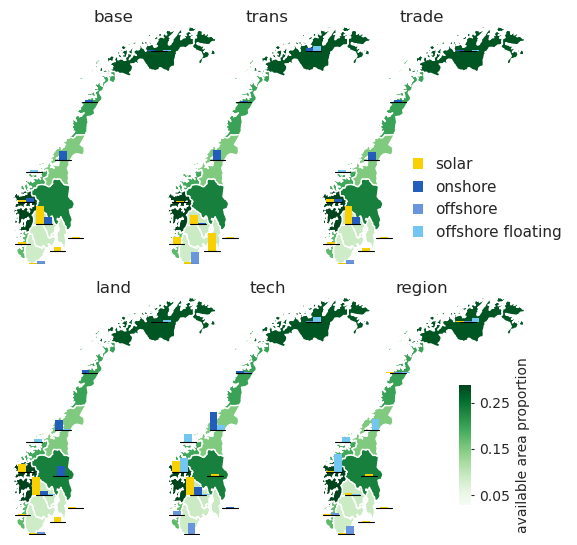

In [237]:
#plot
#year = 2050

#cap2040 = captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050')]
cap2040 = captotz_Ind_pref[(captotz_Ind_pref['demandyear'] == '2050')]
captotz_Ind_pref
scenarios = ['base', 'trans', 'trade', 'land', 'tech', 'region']
technologies = ['Solar', 'Windonshore', 'Windoffshore', 'Windoffshorefloating']
technologies_legend = ['solar', 'onshore', 'offshore', 'offshore floating']
colors = ['#f9d002', '#235ebc', '#6895dd', '#74c6f2']
max_capacities = {scenario: {tech: cap2040[(cap2040['Scenario Name'] == scenario) & (cap2040['technology'] == tech)]['gencap'].max() 
                             for tech in technologies} 
                  for scenario in scenarios}

offset_dict = {
    'NO42': [0.5, -0.68],
    'NO03': [2.4, -0.5],
    'NO54': [0, 0],
    'NO15': [0, 0.5],
    'NO38': [2, -0.8],
    'NO50': [0., 0],
    'NO11': [0, 0],
    'NO34': [0.7, -0.2],
    'NO30': [-0.9, 0.1],
    'NO18': [0, 0],
    'NO46': [0.2, 0.5],
}

def create_additional_legends(fig, cap2040, technologies_legend, max_capacities):

    legend_elements = [plt.Rectangle((0,0),0.5,0.5, facecolor=color, edgecolor='none') for color in colors]
    tech_legend = fig.legend(legend_elements, technologies_legend,borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=11, bbox_to_anchor=(0.75, 0.74))


    ax_color_scale = fig.add_axes([0.66, 0.15, 0.01, 0.2])  # Adjust position as needed
    cmap = plt.get_cmap('Greens')
    norm = plt.Normalize(vmin=Norway['available_area_proportion'].min(), 
                         vmax=Norway['available_area_proportion'].max())
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
    cb.set_label('available area proportion', fontsize=10)
    new_ticks = [0.05, 0.15, 0.25]
    cb.set_ticks(new_ticks)
    cb.outline.set_visible(False)
    cb.ax.tick_params(length=2)
    
    return tech_legend, ax_color_scale    

indices_in_ranges = []

# Function to create bar plots for each zone
def create_zone_plot(ax, data, scenario, zone, technologies, colors, x_scaled, y_scaled, max_capacities, offset_dict):

    width = 1
    scale_factor = 1
    
    x_offset, y_offset = offset_dict.get(zone, [0, 0])
    trans = (transforms.Affine2D()
             .scale(scale_factor)
             .translate(x_scaled+x_offset, y_scaled+y_offset) + ax.transData)
    non_zero_techs = []
    non_zero_values = []
    non_zero_colors = []

    #calculating the maximum of in given scenario across technologies and zones for normalizing
    scenario_capacities = max_capacities[scenario]
    max_scen_cap = max(scenario_capacities, key=scenario_capacities.get)
    max_scen_value = scenario_capacities[max_scen_cap]
    
    for i, tech in enumerate(technologies):
        values = data[(data['Scenario Name'] == scenario) & 
                      (data['zone'] == zone) & 
                      (data['technology'] == tech)]
        normalized_value = 0
        value = values['gencap'].values[0]
        if value>0.0001:   
            #normalized_value = value / max_capacities[scenario][tech]
            normalized_value = value / max_scen_value
        #else:
        #    normalized_value = value / max_capacities[scenario][tech]

        if normalized_value > 0.0001:
            non_zero_techs.append(tech)
            non_zero_values.append(normalized_value)
            non_zero_colors.append(colors[i])

        # Check if the normalized value falls within the specified ranges for making bar length legends insskap
        #if 1 <= normalized_value <= 0.8 or 0.5 <= normalized_value <= 0.7 or 0.2 <= normalized_value <= 0.4:
        indices_in_ranges.append({
                'row_index': values.index[0],
                'scenario': scenario,
                'zone': zone,
                'technology': tech,
                'normalized_value': normalized_value
            })
    
    if non_zero_techs:
        for i, (value, color) in enumerate(zip(non_zero_values, non_zero_colors)):
            x_pos = (i - len(non_zero_techs)/2 + 0.5) * width
            ax.bar(x_pos, value, width, color=color, transform=trans, edgecolor='none')
        
        ax.plot([-0.5*len(technologies)/2, 0.5*len(technologies)/2], [0, 0], color='black', linewidth=0.8, transform=trans)
    ax.yaxis.set_visible(False)
    ax.set_xticks([])
    

fig, axs = plt.subplots(2, 3, figsize=(12, 6))
fig.subplots_adjust(wspace=-0.8, hspace=0.13, left=0.05, right=0.95, top=0.95, bottom=0.1)
axs = axs.flatten()

for i, scenario in enumerate(scenarios):
    ax = axs[i]
    Norway.plot(ax=ax, column='available_area_proportion', cmap='Greens', legend=False)

    for idx, row in Norway.iterrows():
        zone = idx
        x_scaled = row['x_coord']
        y_scaled = row['y_coord']

        create_zone_plot(ax, cap2040, scenario, zone, technologies, colors, x_scaled, y_scaled, max_capacities, offset_dict)
    

    ax.set_title(scenario, pad=-0.2)
    ax.set_xlim(Norway.total_bounds[0], Norway.total_bounds[2])
    ax.set_ylim(Norway.total_bounds[1], Norway.total_bounds[3])
    ax.axis('off')    

tech_legend, ax_color_scale = create_additional_legends(fig, cap2040, technologies_legend, max_capacities)

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/tech_cap_zonal_norm_acrosstech.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/tech_cap_zonal_norm_acrosstech.png', dpi=300, transparent=True, bbox_inches='tight')



In [440]:
indices_in_ranges

[{'row_index': 187,
  'scenario': 'optim',
  'zone': 'NO03',
  'technology': 'Solar',
  'normalized_value': 0.029740782724990308},
 {'row_index': 385,
  'scenario': 'optim',
  'zone': 'NO03',
  'technology': 'Windonshore',
  'normalized_value': 0},
 {'row_index': 583,
  'scenario': 'optim',
  'zone': 'NO03',
  'technology': 'Windoffshore',
  'normalized_value': 0},
 {'row_index': 781,
  'scenario': 'optim',
  'zone': 'NO03',
  'technology': 'Windoffshorefloating',
  'normalized_value': 0},
 {'row_index': 188,
  'scenario': 'optim',
  'zone': 'NO11',
  'technology': 'Solar',
  'normalized_value': 0.08772787531379025},
 {'row_index': 386,
  'scenario': 'optim',
  'zone': 'NO11',
  'technology': 'Windonshore',
  'normalized_value': 0},
 {'row_index': 584,
  'scenario': 'optim',
  'zone': 'NO11',
  'technology': 'Windoffshore',
  'normalized_value': 0},
 {'row_index': 782,
  'scenario': 'optim',
  'zone': 'NO11',
  'technology': 'Windoffshorefloating',
  'normalized_value': 0},
 {'row_inde

In [239]:
merged_df = pd.merge(
    gentotz_Ind_pref_change,
    captotz_Ind_pref_change[['demandyear', 'zone', 'technology', 'Scenario Name', 'gencap']],
    on=['demandyear', 'zone', 'technology', 'Scenario Name'],
    how='left'
)
merged_df['ratio'] = merged_df.apply(
    lambda row: 0 if row['gencap'] < 0.001 else row['genamttotz'] / (row['gencap']*8760), 
    axis=1
)
merged_df

,demandyear,zone,technology,genamttotz,Scenario Name,Scenario Index,absolute_change,percent_change,weighted_change,gencap,ratio
0,2030,NO03,Solar,0.000217,base,1,0.0,0.0,0.0,2.391954e-07,0.000000
1,2030,NO11,Solar,0.000205,base,1,0.0,0.0,0.0,2.121180e-07,0.000000
2,2030,NO15,Solar,0.000332,base,1,0.0,0.0,0.0,3.866422e-07,0.000000
3,2030,NO18,Solar,0.000077,base,1,0.0,0.0,0.0,9.836116e-08,0.000000
4,2030,NO30,Solar,15678.130942,base,1,0.0,0.0,0.0,1.511345e+01,0.118420
...,...,...,...,...,...,...,...,...,...,...,...
625,2050,NO38,Windoffshorefloating,0.000010,base,1,0.0,0.0,0.0,2.872714e-09,0.000000
626,2050,NO42,Windoffshorefloating,0.000016,base,1,0.0,0.0,0.0,3.685379e-09,0.000000
627,2050,NO46,Windoffshorefloating,0.000025,base,1,0.0,0.0,0.0,6.560283e-09,0.000000
628,2050,NO50,Windoffshorefloating,0.000017,base,1,0.0,0.0,0.0,4.923725e-09,0.000000


In [240]:
# calcualting the weighted avergae change in capacity factor
def calculate_weighted_avg_UR_change(df, tech, year, scenario1, scenario2):
    """
    Calculate the weighted average capacity factor and percentage change between two scenarios for a given technology and year.

    Parameters:
    df (DataFrame): The data frame containing the generation and capacity data.
    tech (str): The technology to filter (e.g., 'Windonshore', 'Solar').
    year (str): The year to filter (e.g., '2050').
    scenario1 (str): The first scenario to compare (e.g., 'optim').
    scenario2 (str): The second scenario to compare (e.g., 'land').

    Returns:
    tuple: A tuple containing the weighted average capacity factors for 
           scenario1 and scenario2, and the percentage change.
    """

    # Filter data for scenario1
    df_scenario1 = df[
        (df['demandyear'] == year) & 
        (df['Scenario Name'] == scenario1) & 
        (df['technology'] == tech)
    ]

    # Calculate the total installed capacity for scenario1
    total_capacity_scenario1 = df_scenario1['gencap'].sum()

    # Calculate the weighted average capacity factor for scenario1
    if total_capacity_scenario1 > 0:
        weighted_avg_UR_scenario1 = (df_scenario1['ratio'] * df_scenario1['gencap']).sum() / total_capacity_scenario1
    else:
        weighted_avg_UR_scenario1 = 0

    # Filter data for scenario2
    df_scenario2 = df[
        (df['demandyear'] == year) & 
        (df['Scenario Name'] == scenario2) & 
        (df['technology'] == tech)
    ]

    # Calculate the total installed capacity for scenario2
    total_capacity_scenario2 = df_scenario2['gencap'].sum()

    # Calculate the weighted average capacity factor for scenario2
    if total_capacity_scenario2 > 0:
        weighted_avg_UR_scenario2 = (df_scenario2['ratio'] * df_scenario2['gencap']).sum() / total_capacity_scenario2
    else:
        weighted_avg_UR_scenario2 = 0

    # Calculate percentage change in weighted average capacity factor
    if weighted_avg_UR_scenario1 > 0:
        percent_change = ((weighted_avg_UR_scenario2 - weighted_avg_UR_scenario1) / weighted_avg_UR_scenario1) * 100
    else:
        percent_change = 0

    return weighted_avg_UR_scenario1, weighted_avg_UR_scenario2, percent_change

# Example usage:
weighted_avg_base, weighted_avg_land, percent_change = calculate_weighted_avg_UR_change(
    merged_df, tech='Windonshore', year='2050', scenario1='base', scenario2='land'
)

print(f"Weighted average utlization ratio for 'base': {weighted_avg_base:.4f}")
print(f"Weighted average utilization for 'land': {weighted_avg_land:.4f}")
print(f"Percentage change: {percent_change:.2f}%")


Weighted average utlization ratio for 'base': 0.2188
Weighted average utilization for 'land': 0.1887
Percentage change: -13.78%


In [241]:
merged_df[(merged_df['demandyear'] == '2050') & (merged_df['Scenario Name'] == 'land')& (merged_df['technology'] == 'Windonshore')]

,demandyear,zone,technology,genamttotz,Scenario Name,Scenario Index,absolute_change,percent_change,weighted_change,gencap,ratio
308,2050,NO03,Windonshore,28.619574,land,4,2.861951e+01,4.485439e+05,4.485440e+05,1.350000e-02,0.242006
309,2050,NO11,Windonshore,0.000055,land,4,-1.475366e-07,-2.694201e-03,-2.694201e-03,2.635742e-08,0.000000
310,2050,NO18,Windonshore,6289.488388,land,4,-7.150318e+02,-1.020815e-01,-8.171133e-01,2.804072e+00,0.256048
311,2050,NO30,Windonshore,7611.557386,land,4,-1.516844e+04,-6.658667e-01,-1.583431e+01,4.435500e+00,0.195897
312,2050,NO34,Windonshore,18502.711673,land,4,1.850271e+04,5.630631e+08,5.630631e+08,1.165364e+01,0.181247
313,2050,NO38,Windonshore,0.000027,land,4,-8.493748e-07,-3.067842e-02,-3.067842e-02,1.853963e-08,0.000000
314,2050,NO42,Windonshore,0.000125,land,4,-2.940711e-05,-1.907191e-01,-1.907191e-01,5.259146e-08,0.000000
315,2050,NO46,Windonshore,0.000161,land,4,-9.573687e+03,-1.000000e+00,-1.057369e+01,1.017322e-07,0.000000
316,2050,NO50,Windonshore,18877.971186,land,4,-4.233547e+03,-1.831791e-01,-4.416726e+00,1.210673e+01,0.178002
317,2050,NO54,Windonshore,433.668205,land,4,-2.733033e+03,-8.630536e-01,-3.596087e+00,2.908264e-01,0.170224


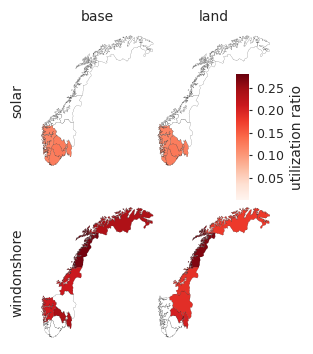

In [243]:
#plot Ratio
year = '2050'

data_plot = merged_df[(merged_df['demandyear'] == year)]
scenarios = ['base','land']
technologies = ['Solar', 'Windonshore']
#colors = ['#f9d002','#235ebc']

 
fig, axs = plt.subplots(2, 2, figsize=(10, 4.5), sharex=True, sharey=True)
fig.subplots_adjust(wspace=-0.8, left=0.15, right=0.85, top=0.9, bottom=0.2)
#axs = axs.flatten()

cmap = plt.cm.Reds
cmap.set_under('white')

for row, technology in enumerate(technologies):
    for col, scenario in enumerate(scenarios):
        scenario_data = data_plot[(data_plot['technology'] == technology) & (data_plot['Scenario Name'] == scenario)]
        zone_scenario_data = Norway.reset_index().merge(scenario_data, left_on='index', right_on='zone')

        ax = axs[row, col]

        zone_scenario_data.plot(ax=ax, column='ratio', cmap=cmap, vmin=0.0001, vmax=0.27, linewidth=0.1, edgecolor='black')
        #ax.set_title(f"{technology} - {scenario.capitalize()}", fontsize=10)
        ax.axis('off')

        # Set scenario names as titles on top
        if row == 0:
            ax.set_title(scenario, fontsize=10)


label_technologies = ['solar', 'windonshore'] 
for row, technology in enumerate(label_technologies):
    axs[row, 0].text(-0.15, 0.5, technology, 
                      va='center', ha='center', 
                      rotation='vertical', transform=axs[row, 0].transAxes, fontsize=10)


# Create a color bar with customized properties
cax = fig.add_axes([0.58, 0.52, 0.013, 0.28])
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0.0001, vmax=0.28))
sm.set_array([])  # You can set this to the range of your data
cb = fig.colorbar(sm, cax=cax)
cb.set_label('utilization ratio', fontsize=10)
cb.ax.tick_params(labelsize=9)


cb.outline.set_edgecolor('none') 
cb.set_ticks([0.05, 0.1, 0.15, 0.2, 0.25])
cb.ax.tick_params(length=2)             

#plt.tight_layout()
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/capacityfactor_change.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/capacityfactor.png', dpi=300, transparent=True, bbox_inches='tight')


  

In [129]:
area = makenice(found_scenarios, "area")

  0%|          | 0/16 [00:00<?, ?it/s]

In [133]:
capfacs = makenice(found_scenarios, "vre_gen")

  0%|          | 0/16 [00:00<?, ?it/s]

In [134]:
capfacs

value
transmission exclusions hour technology  region       
DefaultYes   EF         0    HydroRoR    NO020    0.30
                                         NO060    0.21
                                         NO071    0.21
                                         NO072    0.28
                                         NO073    0.25
...                                                ...
             PM         8759 Windonshore NO093    0.99
                                         NO094    0.99
                                         NO0A1    0.91
                                         NO0A2    0.99
                                         NO0A3    1.00

[10371840 rows x 1 columns]

In [135]:
capfacsSW=capfacs.loc[(slice(None), slice(None), slice(None),
                                        ['Solar','Windonshore'], slice(None))]

In [136]:
capfacsSW

value
transmission exclusions hour technology  region       
DefaultYes   EF         0    Solar       NO020    0.00
                                         NO060    0.00
                                         NO071    0.00
                                         NO072    0.00
                                         NO073    0.00
...                                                ...
             PM         8759 Windonshore NO093    0.99
                                         NO094    0.99
                                         NO0A1    0.91
                                         NO0A2    0.99
                                         NO0A3    1.00

[4204800 rows x 1 columns]

In [139]:
areaSW = area.loc[(slice(None), slice(None),
                                        ['Solar','Windonshore'], slice(None), slice(None))]

In [142]:
areaSW = areaSW.reset_index()
capfacsSW = capfacsSW.reset_index()

In [144]:
areaSW = areaSW[(areaSW['transmission'] == 'DefaultYes')]
areaSW

,index,transmission,exclusions,technology,zone,region,value
0,0,DefaultYes,EF,Solar,NO020,NO020,233.6120
1,1,DefaultYes,EF,Solar,NO060,NO060,175.0800
2,2,DefaultYes,EF,Solar,NO071,NO071,100.9920
3,3,DefaultYes,EF,Solar,NO072,NO072,24.3880
4,4,DefaultYes,EF,Solar,NO081,NO081,0.5840
...,...,...,...,...,...,...,...
455,455,DefaultYes,PM,Windonshore,NO093,NO093,1.9173
456,456,DefaultYes,PM,Windonshore,NO094,NO094,15.7167
457,457,DefaultYes,PM,Windonshore,NO0A1,NO0A1,8.6331
458,458,DefaultYes,PM,Windonshore,NO0A2,NO0A2,5.5407


In [145]:
capfacsSW = capfacsSW[(capfacsSW['transmission'] == 'DefaultYes')]
capfacsSW

,index,transmission,exclusions,hour,technology,region,value
0,0,DefaultYes,EF,0,Solar,NO020,0.00
1,1,DefaultYes,EF,0,Solar,NO060,0.00
2,2,DefaultYes,EF,0,Solar,NO071,0.00
3,3,DefaultYes,EF,0,Solar,NO072,0.00
4,4,DefaultYes,EF,0,Solar,NO073,0.00
...,...,...,...,...,...,...,...
4204795,4204795,DefaultYes,PM,8759,Windonshore,NO093,0.99
4204796,4204796,DefaultYes,PM,8759,Windonshore,NO094,0.99
4204797,4204797,DefaultYes,PM,8759,Windonshore,NO0A1,0.91
4204798,4204798,DefaultYes,PM,8759,Windonshore,NO0A2,0.99


In [147]:
scenarios

['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC', 'PM']

In [148]:
# calculating the average change in counties capacity factor in optim versus land
df_filtered = capfacsSW[
    (capfacsSW['technology'] == 'Windonshore')]

mean_changes = {}
median_changes = {}
std_changes = {}

for scenario in scenarios:
    # Calculate mean CF for each scenario
    mean_cf = df_filtered.groupby('exclusions')['value'].mean()
    median_cf = df_filtered.groupby('exclusions')['value'].median()
    std_cf = df_filtered.groupby('exclusions')['value'].std()
    
    # Calculate changes
    mean_change = mean_cf[scenario] - mean_cf['PM']
    median_change = median_cf[scenario] - median_cf['PM']
    std_change = std_cf[scenario] - std_cf['PM']

    mean_changes[scenario] = mean_change
    median_changes[scenario] = median_change
    std_changes[scenario] = std_change

#print(f"Mean CF Change (EF - PM): {mean_change:.4f}")
#print(f"Median CF Change (EF - PM): {median_change:.4f}")
#print(f"Standard Deviation CF Change (EF - PM): {std_change:.4f}")

# Optional: Detailed regional analysis for additional insights
#region_mean_cf = df_filtered.groupby(['region', 'exclusions'])['value'].mean().unstack()
#region_mean_change = region_mean_cf['EF'] - region_mean_cf['PM']
#print(f"Regional mean CF changes:\n{region_mean_change}")


In [159]:

# Filter for the relevant technology
df_filtered = capfacsSW[capfacsSW['technology'] == 'Windonshore']

# Group by region and exclusions (scenario), then calculate mean, median, and std
grouped = df_filtered.groupby(['region', 'exclusions'])['value'].agg(['mean', 'median', 'std']).reset_index()

# Rename columns for clarity
grouped.rename(columns={'mean': 'Mean CF', 'median': 'Median CF', 'std': 'Std CF'}, inplace=True)

# Calculate the changes against PM for each scenario
results = []

pm_values = grouped[grouped['exclusions'] == 'PM'].set_index('region')

for scenario in ['EF', 'CA', 'SC', 'SD', 'SO1', 'SO2', 'PC']:

    scenario_values = grouped[grouped['exclusions'] == scenario].set_index('region')

        # Calculate changes and percent changes
    mean_change = scenario_values['Mean CF'] - pm_values['Mean CF']
    median_change = scenario_values['Median CF'] - pm_values['Median CF']
    std_change = scenario_values['Std CF'] - pm_values['Std CF']
    
    mean_percent_change = ((scenario_values['Mean CF'] - pm_values['Mean CF']) / pm_values['Mean CF']) * 100
    median_percent_change = ((scenario_values['Median CF'] - pm_values['Median CF']) / pm_values['Median CF']) * 100
    std_percent_change = ((scenario_values['Std CF'] - pm_values['Std CF']) / pm_values['Std CF']) * 100


    # Collect the results
    for region in scenario_values.index:
        if region in pm_values.index:  # Ensure the region exists in PM values
            results.append({
                'Region': region,
                'Scenario': scenario,
                'Mean CF Change': mean_change[region],
                'Median CF Change': median_change[region],
                'Std CF Change': std_change[region],
                'mean Percent Change': mean_percent_change[region],
                'median Percent Change': median_percent_change[region],
                'std Percent Change': std_percent_change[region]
            })

# Create a DataFrame from results
change_df = pd.DataFrame(results)
change_df

,Region,Scenario,Mean CF Change,Median CF Change,Std CF Change,mean Percent Change,median Percent Change,std Percent Change
0,NO020,EF,0.057977,0.05,0.049487,21.844113,26.315789,20.677138
1,NO060,EF,0.028169,0.03,0.011595,11.626241,17.647059,5.162553
2,NO071,EF,0.027483,0.02,0.025856,10.895588,11.111111,11.446492
3,NO072,EF,-0.004850,-0.02,0.011534,-1.820098,-9.090909,5.308117
4,NO073,EF,-0.050502,-0.06,-0.012017,-17.520515,-26.086957,-5.113206
...,...,...,...,...,...,...,...,...
100,NO093,PC,-0.000002,0.00,-0.000003,-0.000696,0.000000,-0.001119
101,NO094,PC,-0.004484,-0.01,-0.004463,-2.121638,-6.666667,-2.162397
102,NO0A1,PC,0.002962,0.01,-0.002551,1.125081,6.250000,-0.951567
103,NO0A2,PC,0.000959,0.00,0.002833,0.433808,0.000000,1.236088


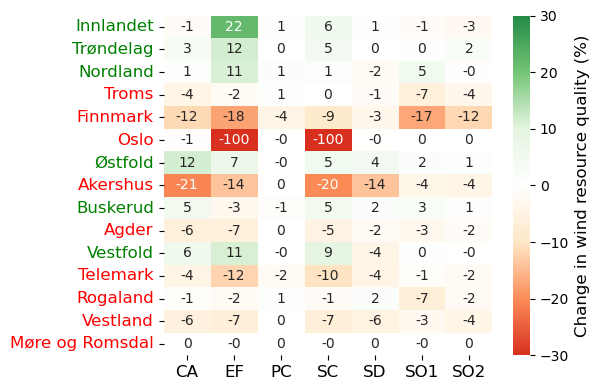

In [304]:

# Region code to name mapping
region_names = {
    'NO020': 'Innlandet',
    'NO060': 'Trøndelag',
    'NO071': 'Nordland',
    'NO072': 'Troms',
    'NO073': 'Finnmark',
    'NO081': 'Oslo',
    'NO083': 'Østfold',
    'NO084': 'Akershus',
    'NO085': 'Buskerud',
    'NO092': 'Agder',
    'NO093': 'Vestfold',
    'NO094': 'Telemark',
    'NO0A1': 'Rogaland',
    'NO0A2': 'Vestland',
    'NO0A3': 'Møre og Romsdal'
}

# Pivot the data for heatmap
heatmap_data = change_df.pivot(index='Region', columns='Scenario', values='mean Percent Change')

# Replace region codes with names
heatmap_data.index = heatmap_data.index.map(region_names)

# Create figure with appropriate size
fig, ax = plt.subplots(figsize=(6, 4))

# Create custom diverging colormap matching your established palette
colors = ['#d7301f', '#fc8d59', '#fee8c8', '#ffffff', '#e5f5e0', '#74c476', '#238b45']
cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=256)

# Plot heatmap
sns.heatmap(heatmap_data, 
            annot=True, 
            fmt='.0f', 
            cmap=cmap, 
            center=0,
            cbar_kws={'label': 'Change in wind resource quality (%)', 'shrink': 1}, 
            linewidths=0, 
            linecolor='white',
            vmin=-30, 
            vmax=30,
            ax=ax,
            annot_kws={'fontsize': 10, 'fontweight': 'normal'})  # Adjust annotation fontsize here

# Customize labels
ax.set_xlabel('', fontsize=12)
ax.set_ylabel('', fontsize=12)
ax.tick_params(axis='both', labelsize=12)
ax.tick_params(axis='x', rotation=0)
ax.tick_params(axis='y', rotation=0)

# Define the regions that will be colored green and red
green_regions = ['Innlandet', 'Trøndelag', 'Nordland', 'Østfold', 'Buskerud', 'Vestfold']
red_regions = [name for name in region_names.values() if name not in green_regions]

# Customize y-tick label colors
for label in ax.get_yticklabels():
    if label.get_text() in green_regions:
        label.set_color('green')  # Set text color to green
    elif label.get_text() in red_regions:
        label.set_color('red')    # Set text color to red



# Adjust colorbar
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)
cbar.set_label('Change in wind resource quality (%)', fontsize=12)

plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/CF_change.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/CF_changeT.png', dpi=300, transparent=True, bbox_inches='tight')


plt.show()

In [191]:
heatmap_data

Scenario,CA,EF,PC,SC,SD,SO1,SO2
Region,,,,,,,
Innlandet,-1.412031,21.844113,0.781499,5.763821,0.586662,-1.338053,-2.527290
Trøndelag,3.351331,11.626241,0.341117,4.530635,0.404723,0.474454,2.487232
Nordland,1.383049,10.895588,1.488498,0.979811,-2.220301,5.260204,-0.410027
Troms,-4.078835,-1.820098,1.040484,0.062112,-1.284649,-6.520910,-3.607640
Finnmark,-11.610905,-17.520515,-4.400326,-9.265200,-3.287473,-17.189827,-11.877436
Oslo,-0.618702,-100.000000,-0.051410,-100.000000,-0.024140,0.017882,0.000894
Østfold,11.662326,6.607214,-0.006900,5.196902,4.478637,1.541752,1.276111
Akershus,-20.668121,-13.851206,0.016334,-20.230860,-13.848693,-3.916502,-4.351250
Buskerud,5.103386,-2.953472,-0.781680,4.729694,1.872602,2.562041,0.759802


In [217]:
areaSW

,index,transmission,exclusions,technology,zone,region,value
0,0,DefaultYes,EF,Solar,NO020,NO020,233.6120
1,1,DefaultYes,EF,Solar,NO060,NO060,175.0800
2,2,DefaultYes,EF,Solar,NO071,NO071,100.9920
3,3,DefaultYes,EF,Solar,NO072,NO072,24.3880
4,4,DefaultYes,EF,Solar,NO081,NO081,0.5840
...,...,...,...,...,...,...,...
455,455,DefaultYes,PM,Windonshore,NO093,NO093,1.9173
456,456,DefaultYes,PM,Windonshore,NO094,NO094,15.7167
457,457,DefaultYes,PM,Windonshore,NO0A1,NO0A1,8.6331
458,458,DefaultYes,PM,Windonshore,NO0A2,NO0A2,5.5407


In [275]:
areaSW_grouped = (areaSW[(areaSW['technology'] == 'Windonshore')]
 .groupby(["exclusions"])['value'].sum().reset_index())
areaSW_grouped

,exclusions,value
0,CA,173.7402
1,EF,37.2963
2,PC,353.7852
3,PM,417.5940
4,SC,170.8722
5,SD,306.9051
6,SO1,139.2486
7,SO2,262.2897


In [268]:
areaSW

,index,transmission,exclusions,technology,zone,region,value
0,0,DefaultYes,EF,Solar,NO020,NO020,233.6120
1,1,DefaultYes,EF,Solar,NO060,NO060,175.0800
2,2,DefaultYes,EF,Solar,NO071,NO071,100.9920
3,3,DefaultYes,EF,Solar,NO072,NO072,24.3880
4,4,DefaultYes,EF,Solar,NO081,NO081,0.5840
...,...,...,...,...,...,...,...
455,455,DefaultYes,PM,Windonshore,NO093,NO093,1.9173
456,456,DefaultYes,PM,Windonshore,NO094,NO094,15.7167
457,457,DefaultYes,PM,Windonshore,NO0A1,NO0A1,8.6331
458,458,DefaultYes,PM,Windonshore,NO0A2,NO0A2,5.5407


In [269]:
capfacsSW

,index,transmission,exclusions,hour,technology,region,value
0,0,DefaultYes,EF,0,Solar,NO020,0.00
1,1,DefaultYes,EF,0,Solar,NO060,0.00
2,2,DefaultYes,EF,0,Solar,NO071,0.00
3,3,DefaultYes,EF,0,Solar,NO072,0.00
4,4,DefaultYes,EF,0,Solar,NO073,0.00
...,...,...,...,...,...,...,...
4204795,4204795,DefaultYes,PM,8759,Windonshore,NO093,0.99
4204796,4204796,DefaultYes,PM,8759,Windonshore,NO094,0.99
4204797,4204797,DefaultYes,PM,8759,Windonshore,NO0A1,0.91
4204798,4204798,DefaultYes,PM,8759,Windonshore,NO0A2,0.99


In [270]:
#Merging
capfacs_area=capfacsSW.merge(areaSW[['exclusions', 'technology', 'region', 'value']], 
                          on=['exclusions', 'technology', 'region'], 
                          how='left').fillna({'value_y': 0})
capfacs_area.rename(columns={"value_x": "CF", "value_y": "capacityPotential"}, inplace=True)
capfacs_area['supply'] = (capfacs_area['CF']*capfacs_area['capacityPotential'])/1000
capfacs_area

,index,transmission,exclusions,hour,technology,region,CF,capacityPotential,supply
0,0,DefaultYes,EF,0,Solar,NO020,0.00,233.6120,0.000000
1,1,DefaultYes,EF,0,Solar,NO060,0.00,175.0800,0.000000
2,2,DefaultYes,EF,0,Solar,NO071,0.00,100.9920,0.000000
3,3,DefaultYes,EF,0,Solar,NO072,0.00,24.3880,0.000000
4,4,DefaultYes,EF,0,Solar,NO073,0.00,0.0000,0.000000
...,...,...,...,...,...,...,...,...,...
2102395,4204795,DefaultYes,PM,8759,Windonshore,NO093,0.99,1.9173,0.001898
2102396,4204796,DefaultYes,PM,8759,Windonshore,NO094,0.99,15.7167,0.015560
2102397,4204797,DefaultYes,PM,8759,Windonshore,NO0A1,0.91,8.6331,0.007856
2102398,4204798,DefaultYes,PM,8759,Windonshore,NO0A2,0.99,5.5407,0.005485


In [271]:
capfacs_area = (capfacs_area[(capfacs_area['technology'] == 'Windonshore')]
             .groupby(["exclusions", "region"])
             .agg({
                 'supply': 'sum',
                 'CF': 'mean',
                 'capacityPotential': 'first'  # or 'max', 'min', 'mean' - all same since it's constant
             })
             .reset_index())


In [240]:
# costs [capex, fixedOM, varOM] in £k/MW
# multiply capacities with 1000
costs = {
    'Windonshore_2050': [55.326, 20, 0.00502567],
}
cost_2024GBP = 1.5
cost_2024NOK = cost_2024GBP*14

In [241]:
capfacs_area['LCOE'] = np.where(
    capfacs_area['CF'] > 0,
    ((55.326 + 20 + (capfacs_area['CF'] * 8760 * 0.00502567)) 
     / (capfacs_area['CF'] * 8760)) * 1000 * cost_2024NOK,
    0  # or use np.nan if you prefer
)
capfacs_area

,exclusions,region,supply,CF,capacityPotential,LCOE
0,CA,NO020,45.925173,0.261666,20.0355,795.641548
1,CA,NO060,42.032969,0.250408,19.1619,826.667641
2,CA,NO071,70.070725,0.255727,31.2792,811.666730
3,CA,NO072,45.669016,0.255624,20.3946,811.950534
4,CA,NO073,96.940616,0.254779,43.4349,814.295892
...,...,...,...,...,...,...
115,SO2,NO093,4.382211,0.327476,1.5276,656.956616
116,SO2,NO094,25.653348,0.207172,14.1354,977.161205
117,SO2,NO0A1,17.240593,0.257774,7.6350,806.059862
118,SO2,NO0A2,7.838201,0.212102,4.2186,956.904778


In [302]:
pd.set_option('display.max_rows', None)
print(capfacs_area)

    exclusions region      supply        CF  capacityPotential         LCOE
0           CA  NO020   45.925173  0.261666            20.0355   795.641548
1           CA  NO060   42.032969  0.250408            19.1619   826.667641
2           CA  NO071   70.070725  0.255727            31.2792   811.666730
3           CA  NO072   45.669016  0.255624            20.3946   811.950534
4           CA  NO073   96.940616  0.254779            43.4349   814.295892
5           CA  NO081    0.078698  0.253779             0.0354   817.088708
6           CA  NO083    0.072826  0.369486             0.0225   594.260916
7           CA  NO084    1.371722  0.216224             0.7242   940.674120
8           CA  NO085   10.584184  0.202916             5.9544   995.446470
9           CA  NO092   32.245885  0.281929            13.0566   746.040345
10          CA  NO093    0.070997  0.346355             0.0234   626.900146
11          CA  NO094   18.956142  0.202162            10.7040   998.763008
12          

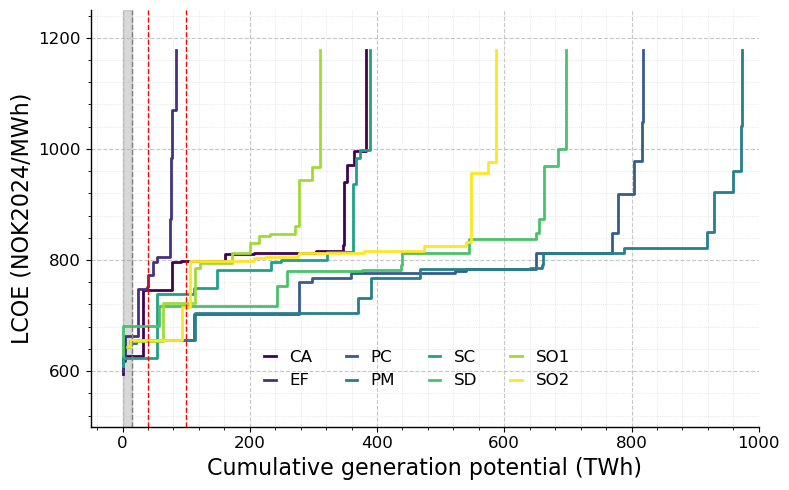

In [307]:
from matplotlib.ticker import MultipleLocator
# Define scenarios and colors (matching your established palette)
scenarios = ['CA', 'EF', 'PC', 'PM', 'SC', 'SD', 'SO1', 'SO2']
#colors = ['#d7301f', '#fc8d59', '#fdbb84', '#fee8c8', '#74c476', '#a1d99b', '#41ab5d', '#238b45']
colors = plt.cm.viridis(np.linspace(0, 1, len(scenarios)))

# Create figure
fig, ax = plt.subplots(figsize=(8, 5))

# Plot each scenario
for scenario, color in zip(scenarios, colors):
    # Filter data for this scenario
    df_scenario = capfacs_area[capfacs_area['exclusions'] == scenario].copy()
    
    # Remove rows with LCOE = 0 or NaN
    df_scenario = df_scenario[df_scenario['LCOE'] > 0]
    
    # Sort by LCOE
    df_scenario = df_scenario.sort_values('LCOE')
    
    # Calculate cumulative supply
    df_scenario['cumulative_supply'] = df_scenario['supply'].cumsum()
    
    # Plot step line
    ax.step(df_scenario['cumulative_supply'], df_scenario['LCOE'], 
            where='post', color=color, linewidth=2, label=scenario)

# Labels and formatting
ax.set_xlabel('Cumulative generation potential (TWh)', fontsize=16)
ax.set_ylabel('LCOE (NOK2024/MWh)', fontsize=16)
ax.tick_params(axis='both', labelsize=12)


# Grid
ax.grid(True, linestyle='--', alpha=0.7, axis='both')

ax.xaxis.set_major_locator(MultipleLocator(200))  # Example: Major ticks every 100 TWh
ax.yaxis.set_major_locator(MultipleLocator(200))   # Example: Major ticks every 100 NOK2024/MWh

# Set minor ticks (you can adjust the spacing as needed)
ax.xaxis.set_minor_locator(MultipleLocator(40))    # Example: Minor ticks every 20 TWh
ax.yaxis.set_minor_locator(MultipleLocator(40))

ax.grid(which='minor', linestyle=':', linewidth=0.5, alpha=0.5)

# Axis limits
ax.set_xlim(-50, 1000)  # Add 5% padding
ax.set_ylim(500, 1250)  # Adjust based on your data range

# Add a vertical line at x = 15
ax.axvline(x=15, color='grey', linestyle='--', linewidth=1)

# Fill between 0 to 15 on the x-axis with grey color
ax.fill_betweenx(y=[500, 1250], x1=0, x2=15, color='grey', alpha=0.3)

# Legend
ax.legend(borderaxespad=0, frameon=False, handlelength=0.7, ncol=4,
                           fontsize=12, bbox_to_anchor=(0.25, 0.2))

#ax.legend(loc='upper left', fontsize=11, frameon=True, 
#          fancybox=False, shadow=False, ncol=2)

ax.axvline(x=40, color='red', linestyle='--', linewidth=1)
ax.axvline(x=100, color='red', linestyle='--', linewidth=1)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)

plt.tight_layout()
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/Cum_supply.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/NINAPlots/Cum_supplyT.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

In [ ]:
# Based on base scenario of Statnett, Electricity consumption may incerase by 80 TWh by 2050

# Transmission plot

In [246]:
trans_cap = makenice(found_scenarios, "trans_cap")

captotztrans = captotz[captotz.gencap > 1e-04]

captotztrans.query("demandyear=='2050' and transmission == 'LOWOH' and fylke_techs == 'fylketechD' and "
              "varnewpcapQ == 'OPT' and corines_onshore == 'CWDHAF' and ImpExp == '1' and "
                  "technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore')").reset_index()

captotztrans.query("demandyear=='2050' and transmission == 'DefaultYes' and fylke_techs == 'fylketechD' and "
              "varnewpcapQ == 'OPT' and corines_onshore == 'CWD' and ImpExp == '1'").reset_index()



  0%|          | 0/960 [00:00<?, ?it/s]

In [22]:
captotz

gencap
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone technology           level_2                
2030       DefaultNO    2      QS1         CWDH            fylketechC  NO03 Export               level      0.000000e+00
                                                                                                 lo         0.000000e+00
                                                                                                 marginal   0.000000e+00
                                                                                                 up         0.000000e+00
                                                                            HydroRes             level      0.000000e+00
...                                                                                                                  ...
           Subsurf      2      OPT         CWDH            fylketechD  NO54 Windoffshorefloating up        1.000000e+100
                                                                            Windonshore          level      3.755676e+00
                                                                                                 lo         0.000000e+00
                                                                                                 marginal   0.000000e+00
                                                                                                 up        1.000000e+100

[422400 rows x 1 columns]

In [23]:
#Optim versus land preference query
captotztrans = captotz[captotz.gencap > 1e-04]
captotztrans.query("demandyear=='2050' and transmission == 'LOWOH' and fylke_techs == 'fylketechD' and "
              "varnewpcapQ == 'OPT' and corines_onshore == 'CWDHAF' and ImpExp == '1' and "
                  "technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore')").reset_index()


,demandyear,transmission,ImpExp,varnewpcapQ,corines_onshore,fylke_techs,zone,technology,level_2,gencap
0,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO03,Solar,up,1.000000e+100
1,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO03,Windoffshore,up,1.000000e+100
2,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO03,Windoffshorefloating,up,1.000000e+100
3,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO03,Windonshore,level,1.350000e-02
4,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO03,Windonshore,up,1.000000e+100
5,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO11,Solar,level,4.869185e+00
6,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO11,Solar,up,1.000000e+100
7,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO11,Windoffshore,up,1.000000e+100
8,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO11,Windoffshorefloating,up,1.000000e+100
9,2050,LOWOH,1,OPT,CWDHAF,fylketechD,NO11,Windonshore,up,1.000000e+100


In [24]:
fix_optim_pies = {}
#Subsurf_optim_pies = {}
#fix_land_pies = {}
#Subsurf_land_pies = {}
cumulative_pies = {}

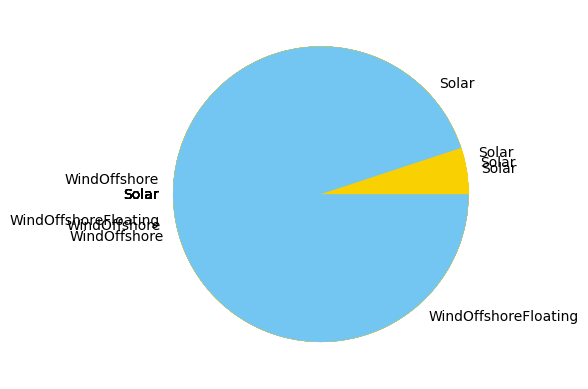

In [26]:
#change the query strings for getting pies

tech_map = {
    'Solar': {'label': 'Solar', 'color': '#f9d002'},
    'Windoffshore': {'label': 'WindOffshore', 'color': '#6895dd'},
    'Windoffshorefloating': {'label': 'WindOffshoreFloating', 'color': '#74c6f2'},
    'Windonshore': {'label': 'WindOnshore', 'color': '#235ebc'}
}

for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
    df = captotztrans.query("demandyear=='2050' and zone ==" + "'" + i +"'"+ "and transmission == 'Subsurf' and fylke_techs == 'fylketechC' and "
              "varnewpcapQ == 'QS1' and corines_onshore == 'CWDHAF' and ImpExp == '2' and "
              "technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore') and level_2 == 'level'").reset_index()
    #df = df.set_index('technology').reindex(tech_map.keys(), fill_value=0).reset_index()
    #df['gencap'] = np.where(df['gencap'] == 0, small_value, df['gencap'])  
    active_labels = [tech_map[tech]['label'] for tech in df['technology']]
    active_colors = [tech_map[tech]['color'] for tech in df['technology']]
    cumulative_pies[i] = plt.pie(df['gencap'], labels = active_labels, colors = active_colors)

    

In [571]:
fix_optim_pies

{'NO03': ([<matplotlib.patches.Wedge at 0x1475c61572b0>],
  [Text(-1.1, 1.3471114790620887e-16, 'Solar')]),
 'NO11': ([<matplotlib.patches.Wedge at 0x1475c1d1d9c0>],
  [Text(-1.1, 1.3471114790620887e-16, 'Solar')]),
 'NO15': ([<matplotlib.patches.Wedge at 0x1475c4710ca0>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOffshoreFloating')]),
 'NO18': ([<matplotlib.patches.Wedge at 0x1475c47138e0>],
  [Text(-1.1, 1.3471114790620887e-16, 'WindOnshore')]),
 'NO30': ([<matplotlib.patches.Wedge at 0x1475c4710520>,
  [Text(-0.6797408357379379, 0.8648424112115974, 'Solar'),
   Text(0.6797407547655442, -0.8648424748535242, 'WindOnshore')]),
 'NO34': ([], []),
 'NO38': ([<matplotlib.patches.Wedge at 0x1475c4712020>],
  [Text(-1.1, 1.3471114790620887e-16, 'Solar')]),
 'NO42': ([<matplotlib.patches.Wedge at 0x1475c47102b0>,
  [Text(0.9155669119387181, 0.6097025748371083, 'Solar'),
   Text(-0.9155669404809548, -0.6097025319763271, 'WindOffshore')]),
 'NO46': ([<matplotlib.patches.Wedge at 0x1475cb70f40

In [27]:
fix_optim_cap_tot = {}
#lowoh_optim_cap_tot = {}
#fix_land_cap_tot = {}
#lowoh_land_cap_tot = {}
cumulative_cap_tot = {}

In [573]:
cumulative_cap_tot = {}

In [181]:
captotztrans.query("demandyear=='2050' and zone ==" + "'" + 'NO54' +"'"+ "and transmission == 'LOWOH' and "
                "fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and corines_onshore == 'CWDHAF' and ImpExp == '1' and "
                  "technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore') "
                   "and level_2 == 'level'").values.T[0].sum()

10.124602495829716

In [29]:
#change the query strings for getting cap_tot
for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
    cumulative_cap_tot[i] = captotztrans.query("demandyear=='2050' and zone ==" + "'" + i +"'"+ "and transmission == 'Subsurf' and "
                "fylke_techs == 'fylketechC' and varnewpcapQ == 'QS1' and corines_onshore == 'CWDHAF' and ImpExp == '2' and "
                "technology in ('Solar', 'Windoffshore', 'Windoffshorefloating', 'Windonshore') "
                "and level_2 == 'level'").values.T[0].sum()


In [577]:
cumulative_cap_tot

{'NO03': 0.8200000000000691,
 'NO11': 8.336795069853755,
 'NO15': 1.27021130754756,
 'NO18': 0.29498219109121193,
 'NO30': 0.7835285259897452,
 'NO34': 0.829291740109216,
 'NO38': 0.5250319023402595,
 'NO42': 11.463039611465422,
 'NO46': 0.4699931353468044,
 'NO50': 0.35002103385886196,
 'NO54': 6.548812604284044}

In [30]:
fix_optim_cap_frac = {}
#lowoh_optim_cap_frac = {}
#fix_land_cap_frac = {}
#lowoh_land_cap_frac = {}
cumulative_cap_frac = {}

In [31]:
#change the query strings for getting cap_frac
for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
    fix_optim_cap_frac[i] = fix_optim_cap_tot[i]/sum(fix_optim_cap_tot.values())
    #lowoh_optim_cap_frac[i] = lowoh_optim_cap_tot[i]/sum(lowoh_optim_cap_tot.values())
    #fix_land_cap_frac[i] = fix_land_cap_tot[i]/sum(fix_land_cap_tot.values())
    #lowoh_land_cap_frac[i] = lowoh_land_cap_tot[i]/sum(lowoh_land_cap_tot.values())
    cumulative_cap_frac[i] = cumulative_cap_tot[i]/sum(cumulative_cap_tot.values())
#cap_frac WRT total Country capacities    

In [191]:
trans_cap.query("demandyear=='2050' and transmission == 'LOWOH' and ImpExp == '1' "
            "and corines_solar == 'CSD' and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
                            "corines_onshore == 'CWDHAF' and ImpExp == '1' and Zone_1 == 'NO46'"
               ).query("level_2 in ['level', 'trans']")

def simple_rename_levels(df):
    # Get the list of indices in the DataFrame
    indices = df.index.tolist()
    
    # Iterate over indices and rename 'level' entries
    for i, idx in enumerate(indices):
        if idx[-1] == 'level':
            if i % 2 == 0:  # Even index means it's the first 'level'
                indices[i] = idx[:-1] + ('HVAC400KV',)
            else:  # Odd index means it's the second 'level'
                indices[i] = idx[:-1] + ('HVDCSubsurface',)
                
    # Assign the new list of indices to the DataFrame's index
    df.index = pd.MultiIndex.from_tuples(indices, names=df.index.names)
    
    return df



transpcap
demandyear transmission ImpExp varnewpcapQ corines_solar corines_onshore fylke_techs Zone_1 Zone_2 level_2                
2050       LOWOH        1      OPT         CSD           CWDHAF          fylketechD  NO46   NO11   level          1.793578
                                                                                                   level               0.0
                                                                                                   trans         HVAC400KV
                                                                                                   trans    HVDCSubsurface
                                                                                            NO15   level               3.0
                                                                                                   level               0.0
                                                                                                   trans         HVAC400KV
                                                                                                   trans    HVDCSubsurface
                                                                                            NO30   level               3.9
                                                                                                   level               0.0
                                                                                                   trans         HVAC400KV
                                                                                                   trans    HVDCSubsurface
                                                                                            NO34   level               0.0
                                                                                                   level               0.0
                                                                                                   trans         HVAC400KV
                                                                                                   trans    HVDCSubsurface
                                                                                            NO38   level          0.000003
                                                                                                   level               0.0
                                                                                                   trans         HVAC400KV
                                                                                                   trans    HVDCSubsurface

In [32]:
def simple_rename_levels(df):
    # Get the list of indices in the DataFrame
    indices = df.index.tolist()
    
    # Iterate over indices and rename 'level' entries
    for i, idx in enumerate(indices):
        if idx[-1] == 'level':
            if i % 2 == 0:  # Even index means it's the first 'level'
                indices[i] = idx[:-1] + ('HVAC400KV',)
            else:  # Odd index means it's the second 'level'
                indices[i] = idx[:-1] + ('HVDCSubsurface',)
                
    # Assign the new list of indices to the DataFrame's index
    df.index = pd.MultiIndex.from_tuples(indices, names=df.index.names)
    
    return df


fix_optim_trans = {}
#lowoh_optim_trans = {}
#fix_land_trans = {}
#lowoh_land_trans = {}
Cumulative_trans = {}


fix_optim_trans = trans_cap.query("demandyear=='2050' and transmission == 'DefaultYes' and ImpExp == '1' "
            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
                            "corines_onshore == 'CWD' and level_2 == 'level'")
#lowoh_optim_trans = trans_cap.query("demandyear=='2050' and transmission == 'LOWOH' and ImpExp == '1' "
#            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
#                            "corines_onshore == 'CWD' and ImpExp == '1' and level_2 == 'level'")
#fix_land_trans = trans_cap.query("demandyear=='2050' and transmission == 'DefaultYes' and ImpExp == '1' "
#            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
#                            "corines_onshore == 'CWDHAF' and ImpExp == '1' and level_2 == 'level'")
#lowoh_land_trans = trans_cap.query("demandyear=='2050' and transmission == 'LOWOH' and ImpExp == '1' "
#            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
#                            "corines_onshore == 'CWDHAF' and ImpExp == '1' and level_2 == 'level'")
Cumulative_trans = trans_cap.query("demandyear=='2050' and transmission == 'Subsurf' and ImpExp == '2' "
            "and fylke_techs == 'fylketechC' and varnewpcapQ == 'QS1' and "
                            "corines_onshore == 'CWDHAF' and level_2 == 'level'")


fix_optim_trans=fix_optim_trans.pipe(simple_rename_levels)
#lowoh_optim_trans=lowoh_optim_trans.pipe(simple_rename_levels)
#fix_land_trans=fix_land_trans.pipe(simple_rename_levels)
#lowoh_land_trans=lowoh_land_trans.pipe(simple_rename_levels)
Cumulative_trans=Cumulative_trans.pipe(simple_rename_levels)

trans_tot = fix_optim_trans.values.sum()
trans_tot

In [33]:
fix_optim_trans = {}
#lowoh_optim_trans = {}
#fix_land_trans = {}
#lowoh_land_trans = {}
Cumulative_trans = {}

In [581]:
trans_cap

transpcap
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs Zone_1 Zone_2 level_2                 
2030       DefaultNO    2      QS1         CWDH            fylketechC  NO03   NO30   level            1.95934
                                                                                     level                0.0
                                                                                     lo                   0.0
                                                                                     lo                   0.0
                                                                                     marginal             0.0
...                                                                                                       ...
           Subsurf      2      OPT         CWDH            fylketechD  NO54   NO18   marginal        0.001035
                                                                                     trans          HVAC400KV
                                                                                     trans     HVDCSubsurface
                                                                                     up                  50.0
                                                                                     up                  50.0

[307200 rows x 1 columns]

In [34]:
fix_optim_trans = trans_cap.query("demandyear=='2050' and transmission == 'DefaultYes' and ImpExp == '1' "
            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
                            "corines_onshore == 'CWD' and level_2 == 'level'")
#lowoh_optim_trans = trans_cap.query("demandyear=='2050' and transmission == 'LOWOH' and ImpExp == '1' "
#            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
#                            "corines_onshore == 'CWD' and ImpExp == '1' and level_2 == 'level'")
#fix_land_trans = trans_cap.query("demandyear=='2050' and transmission == 'DefaultYes' and ImpExp == '1' "
#            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
#                            "corines_onshore == 'CWDHAF' and ImpExp == '1' and level_2 == 'level'")
#lowoh_land_trans = trans_cap.query("demandyear=='2050' and transmission == 'LOWOH' and ImpExp == '1' "
#            "and fylke_techs == 'fylketechD' and varnewpcapQ == 'OPT' and "
#                            "corines_onshore == 'CWDHAF' and ImpExp == '1' and level_2 == 'level'")
Cumulative_trans = trans_cap.query("demandyear=='2050' and transmission == 'Subsurf' and ImpExp == '2' "
            "and fylke_techs == 'fylketechC' and varnewpcapQ == 'QS1' and "
                            "corines_onshore == 'CWDHAF' and level_2 == 'level'")


fix_optim_trans=fix_optim_trans.pipe(simple_rename_levels)
#lowoh_optim_trans=lowoh_optim_trans.pipe(simple_rename_levels)
#fix_land_trans=fix_land_trans.pipe(simple_rename_levels)
#lowoh_land_trans=lowoh_land_trans.pipe(simple_rename_levels)
Cumulative_trans=Cumulative_trans.pipe(simple_rename_levels)

trans_tot = fix_optim_trans.values.sum()
trans_tot

55.00000000000001

In [35]:
Cumulative_trans.values.sum()

96.04307091311247

In [68]:
Cumulative_trans

transpcap
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs Zone_1 Zone_2 level_2                 
2050       Subsurf      2      QS1         CWDHAF          fylketechC  NO03   NO30   HVAC400KV            3.0
                                                                                     HVDCSubsurface       0.0
                                                                       NO11   NO38   HVAC400KV            0.9
                                                                                     HVDCSubsurface       0.0
                                                                              NO42   HVAC400KV            1.2
...                                                                                                       ...
                                                                       NO50   NO18   HVDCSubsurface       0.0
                                                                              NO34   HVAC400KV            0.6
                                                                                     HVDCSubsurface       0.0
                                                                       NO54   NO18   HVAC400KV       4.286122
                                                                                     HVDCSubsurface       0.0

[64 rows x 1 columns]

In [69]:
Cumulative_trans_tot

96.04307091311247

In [36]:
fix_optim_trans_tot = fix_optim_trans.values.sum()
#lowoh_optim_trans_tot = lowoh_optim_trans.values.sum()
#fix_land_trans_tot = fix_land_trans.values.sum()
#lowoh_land_trans_tot = lowoh_land_trans.values.sum()
Cumulative_trans_tot = Cumulative_trans.values.sum()

In [72]:
Cumulative_trans.query("level_2 == 'HVDCSubsurface'")

transpcap
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs Zone_1 Zone_2 level_2                 
2050       Subsurf      2      QS1         CWDHAF          fylketechC  NO03   NO30   HVDCSubsurface       0.0
                                                                       NO11   NO38   HVDCSubsurface       0.0
                                                                              NO42   HVDCSubsurface       0.0
                                                                              NO46   HVDCSubsurface  0.361614
                                                                       NO15   NO34   HVDCSubsurface       0.0
                                                                              NO46   HVDCSubsurface       0.0
                                                                              NO50   HVDCSubsurface       0.0
                                                                       NO18   NO50   HVDCSubsurface       0.0
                                                                              NO54   HVDCSubsurface       0.0
                                                                       NO30   NO03   HVDCSubsurface       0.0
                                                                              NO34   HVDCSubsurface       0.0
                                                                              NO38   HVDCSubsurface  5.074655
                                                                              NO46   HVDCSubsurface       0.0
                                                                       NO34   NO15   HVDCSubsurface       0.0
                                                                              NO30   HVDCSubsurface       0.0
                                                                              NO46   HVDCSubsurface       0.0
                                                                              NO50   HVDCSubsurface       0.0
                                                                       NO38   NO11   HVDCSubsurface       0.0
                                                                              NO30   HVDCSubsurface  5.074655
                                                                              NO42   HVDCSubsurface  5.850575
                                                                              NO46   HVDCSubsurface       0.0
                                                                       NO42   NO11   HVDCSubsurface       0.0
                                                                              NO38   HVDCSubsurface  5.850575
                                                                       NO46   NO11   HVDCSubsurface  0.361614
                                                                              NO15   HVDCSubsurface       0.0
                                                                              NO30   HVDCSubsurface       0.0
                                                                              NO34   HVDCSubsurface       0.0
                                                                              NO38   HVDCSubsurface       0.0
                                                                       NO50   NO15   HVDCSubsurface       0.0
                                                                              NO18   HVDCSubsurface       0.0
                                                                              NO34   HVDCSubsurface       0.0
                                                                       NO54   NO18   HVDCSubsurface       0.0

In [77]:
i = ['NO15', 'NO34']
Cumulative_trans.query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'").values[1][0]

1.1751659644986402e-08

In [ ]:
fix_optim_pies
lowoh_optim_pies
fix_land_pies
lowoh_land_pies
cumulative_pies

fix_optim_cap_tot
lowoh_optim_cap_tot
fix_land_cap_tot
lowoh_land_cap_tot
cumulative_cap_tot

fix_optim_cap_frac
lowoh_optim_cap_frac
fix_land_cap_frac
lowoh_land_cap_frac
cumulative_cap_frac

fix_optim_trans
lowoh_optim_trans
fix_land_trans
lowoh_land_trans
Cumulative_trans

fix_optim_trans_tot
lowoh_optim_trans_tot
fix_land_trans_tot
lowoh_land_trans_tot
Cumulative_trans_tot

In [37]:
Cumulative_trans_tot

96.04307091311247

/tmp/ipykernel_2799651/479710054.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cent = Norway.centroid


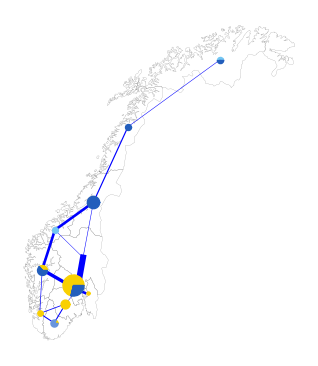

In [123]:
#Individual Plots for optim and cumulative case. only need to change the data inputs.

from matplotlib.lines import Line2D
fig, ax = plt.subplots(1,1, figsize=(6,4.5))

cent = Norway.centroid
Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.1, color='black', alpha=0.7)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

offset_dict = {
    'NO42': [0, 0],
    'NO03': [0.25, 0], #for optim case
    #'NO03': [0.2, 0], #for cumulative case
    'NO54': [0, 0],
    'NO15': [0, 0],
    'NO38': [0, 0],
    'NO50': [0, 0],
    'NO11': [0, 0], #for optim case
    #'NO11': [-0.2, 0.2], #for cumulative case
    'NO34': [0, 0], #for optim case
    #'NO34': [0, 0.1], #fpr cumulative case
    'NO30': [-0.4, 0.2], #for optim case
    #'NO30': [-0.1, 0.05],  #for cumulative case
    'NO18': [0, 0],
    'NO46': [0, 0],
}


legend_entries = []
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore'
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 60
trans_HVACcolor = 'blue'
subs_color = 'black'

trans_legend_HVAC = Line2D([0], [0], color=trans_HVACcolor, linewidth=2, label='HVAC400KV')
trans_legend_subsurf = Line2D([0], [0], color=subs_color, linewidth=2, linestyle='-',  label='HVDCSubsurf', alpha=0.5)


legend_entries.extend([trans_legend_HVAC, trans_legend_subsurf])

for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
    wedges, labels = fix_optim_pies[i]
    for wedge, label in zip(wedges, labels): 
        color = color_mapping[label.get_text()]
        vertices = wedge.get_path().vertices.tolist()
        size = 500 * fix_optim_cap_frac[i]
        offset_x, offset_y = offset_dict[i]
        ax.scatter(cent.x[i]+offset_x, cent.y[i]+offset_y, marker=(vertices),
                   s=size, zorder=100,
                   facecolor = color)

#ax.legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
#                             fontsize=10, bbox_to_anchor=(0.42, 0.65))
ax.axis('off')
#trans_HVDCcolor = 'red'

for i in [['NO03', 'NO30'], ['NO11', 'NO38'], ['NO11', 'NO42'], ['NO11', 'NO46'], ['NO15', 'NO34'], ['NO15', 'NO46'], ['NO15', 'NO50'], ['NO18', 'NO50'], ['NO18', 'NO54'], ['NO30', 'NO34'], ['NO30', 'NO38'], ['NO30', 'NO46'],['NO34', 'NO46'], ['NO34', 'NO50'], ['NO38', 'NO42'], ['NO38', 'NO46']]:
    
    HVAC_cap = (fix_optim_trans.query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                        .values[0][0])
    subsurf_cap = (fix_optim_trans.query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                        .values[1][0])
    if subsurf_cap > 0.001:
        plt.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*Cumulative_trans.query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            .values[1][0]/Cumulative_trans_tot), color=subs_color, linestyle='-', alpha=0.5)
    plt.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
             linewidth=(linewidth*fix_optim_trans.query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                        .values[0][0]/Cumulative_trans_tot), color=trans_HVACcolor)        


#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/Electricity_allocation_map_optim.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/Electricity_allocation_map_optim.png', dpi=300, transparent=True, bbox_inches='tight')


plt.show()


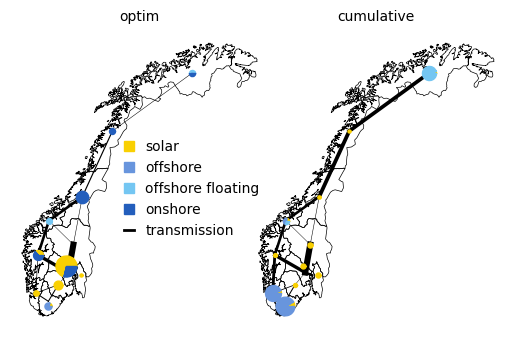

In [60]:
#Transmission subplot
from matplotlib.lines import Line2D
data_plot = {
    'Optim': {
        'fix': {'pies': fix_optim_pies, 'cap_frac': fix_optim_cap_frac, 'trans': fix_optim_trans, 'trans_tot': fix_optim_trans_tot},
        #'lowoh': {'pies': lowoh_optim_pies, 'cap_frac': lowoh_optim_cap_frac, 'trans': lowoh_optim_trans, 'trans_tot': lowoh_optim_trans_tot}
    },
    'Land': {
        #'fix': {'pies': fix_land_pies, 'cap_frac': fix_land_cap_frac, 'trans': fix_land_trans, 'trans_tot': fix_land_trans_tot},
        'cumulative': {'pies': cumulative_pies, 'cap_frac': cumulative_cap_frac, 'trans': Cumulative_trans, 'trans_tot': Cumulative_trans_tot}
    }
}
fig, axs = plt.subplots(1, 2, figsize=(10, 3.5))
#fig.subplots_adjust(wspace=-0.7,  hspace=0, left=0.05, right=0.95, top=0.1, bottom=0)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

offset_dict1 = {
    'NO42': [0, -0.4], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

offset_dict2 = {
    'NO42': [0, -0.22], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

legend_entries = []
short_labels = {
    'Solar': 'solar',
    'WindOffshore': 'offshore',
    'WindOffshoreFloating': 'offshore floating',
    'WindOnshore': 'onshore'
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 60
trans_HVACcolor = 'black'

trans_legend = Line2D([0], [0], color=trans_HVACcolor, linewidth=2, label='transmission')

legend_entries.append(trans_legend)


max_trans_tot = Cumulative_trans_tot #change the maximum value according to scenario plots

def plot_subplot(ax, data, title, ax_row):
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black')
    
    for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        wedges, labels = data['pies'][i]
        for wedge, label in zip(wedges, labels): 
            color = color_mapping[label.get_text()]
            vertices = wedge.get_path().vertices.tolist()
            size = 500 * data['cap_frac'][i]
            offset_x, offset_y = offset_dict1[i]
            if ax_row == 0:
                offset_x, offset_y = offset_dict2[i]
            ax.scatter(cent.x[i]+offset_x, cent.y[i]+offset_y, marker=(vertices),
                       s=size, zorder=100, facecolor=color)

    ax.axis('off')
    ax.set_title(title, fontsize=10)
    #trans_HVDCcolor = 'red'

    for i in [['NO03', 'NO30'], ['NO11', 'NO38'], ['NO11', 'NO42'], ['NO11', 'NO46'], 
              ['NO15', 'NO34'], ['NO15', 'NO46'], ['NO15', 'NO50'], ['NO18', 'NO50'], 
              ['NO18', 'NO54'], ['NO30', 'NO34'], ['NO30', 'NO38'], ['NO30', 'NO46'],
              ['NO34', 'NO46'], ['NO34', 'NO50'], ['NO38', 'NO42'], ['NO38', 'NO46']]:
        ax.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*data['trans'].query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            #.values[0][0]/data['trans_tot']), color=trans_HVACcolor)
                            .values[0][0]/max_trans_tot), color=trans_HVACcolor)
axs[0].legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.42, 0.65))


plot_subplot(axs[0], data_plot['Optim']['fix'], 'optim', 0)
plot_subplot(axs[1], data_plot['Land']['cumulative'], 'cumulative', 0)
#plot_subplot(axs[1, 0], data_plot['Optim']['lowoh'], 'optim-trans', 1)
#plot_subplot(axs[1, 1], data_plot['Land']['lowoh'], 'land-trans', 1)

fig.subplots_adjust(wspace=-0.85,  hspace=0, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.jpg', dpi=300, bbox_inches='tight')

plt.show()



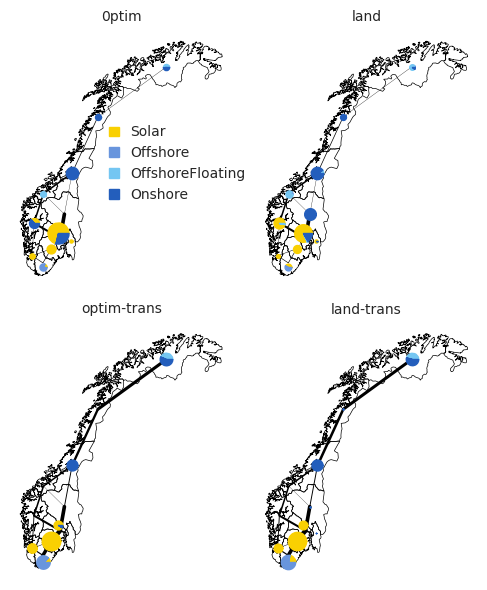

In [1459]:
#Transmission subplot

data_plot = {
    'Optim': {
        'fix': {'pies': fix_optim_pies, 'cap_frac': fix_optim_cap_frac, 'trans': fix_optim_trans, 'trans_tot': fix_optim_trans_tot},
        'lowoh': {'pies': lowoh_optim_pies, 'cap_frac': lowoh_optim_cap_frac, 'trans': lowoh_optim_trans, 'trans_tot': lowoh_optim_trans_tot}
    },
    'Land': {
        'fix': {'pies': fix_land_pies, 'cap_frac': fix_land_cap_frac, 'trans': fix_land_trans, 'trans_tot': fix_land_trans_tot},
        'lowoh': {'pies': lowoh_land_pies, 'cap_frac': lowoh_land_cap_frac, 'trans': lowoh_land_trans, 'trans_tot': lowoh_land_trans_tot}
    }
}
fig, axs = plt.subplots(2, 2, figsize=(12, 6))
#fig.subplots_adjust(wspace=-0.7,  hspace=0, left=0.05, right=0.95, top=0.1, bottom=0)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

offset_dict1 = {
    'NO42': [0, -0.4], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

offset_dict2 = {
    'NO42': [0, -0.22], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

legend_entries = []
short_labels = {
    'Solar': 'Solar',
    'WindOffshore': 'Offshore',
    'WindOffshoreFloating': 'OffshoreFloating',
    'WindOnshore': 'Onshore'
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 40
trans_HVACcolor = 'black'

max_trans_tot = lowoh_land_trans_tot #change the maximum value according to scenario plots

def plot_subplot(ax, data, title, ax_row):
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black')
    
    for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        wedges, labels = data['pies'][i]
        for wedge, label in zip(wedges, labels): 
            color = color_mapping[label.get_text()]
            vertices = wedge.get_path().vertices.tolist()
            size = 500 * data['cap_frac'][i]
            offset_x, offset_y = offset_dict1[i]
            if ax_row == 0:
                offset_x, offset_y = offset_dict2[i]
            ax.scatter(cent.x[i]+offset_x, cent.y[i]+offset_y, marker=(vertices),
                       s=size, zorder=100, facecolor=color)

    ax.axis('off')
    ax.set_title(title, fontsize=10)
    #trans_HVDCcolor = 'red'

    for i in [['NO03', 'NO30'], ['NO11', 'NO38'], ['NO11', 'NO42'], ['NO11', 'NO46'], 
              ['NO15', 'NO34'], ['NO15', 'NO46'], ['NO15', 'NO50'], ['NO18', 'NO50'], 
              ['NO18', 'NO54'], ['NO30', 'NO34'], ['NO30', 'NO38'], ['NO30', 'NO46'],
              ['NO34', 'NO46'], ['NO34', 'NO50'], ['NO38', 'NO42'], ['NO38', 'NO46']]:
        ax.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*data['trans'].query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            #.values[0][0]/data['trans_tot']), color=trans_HVACcolor)
                            .values[0][0]/max_trans_tot), color=trans_HVACcolor)
axs[0, 0].legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.42, 0.65))


plot_subplot(axs[0, 0], data_plot['Optim']['fix'], '0ptim', 0)
plot_subplot(axs[0, 1], data_plot['Land']['fix'], 'land', 0)
plot_subplot(axs[1, 0], data_plot['Optim']['lowoh'], 'optim-trans', 1)
plot_subplot(axs[1, 1], data_plot['Land']['lowoh'], 'land-trans', 1)

fig.subplots_adjust(wspace=-0.85,  hspace=0, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.jpg', dpi=300, bbox_inches='tight')

plt.show()



In [1455]:
lowoh_optim_trans_tot

104.71968174194971

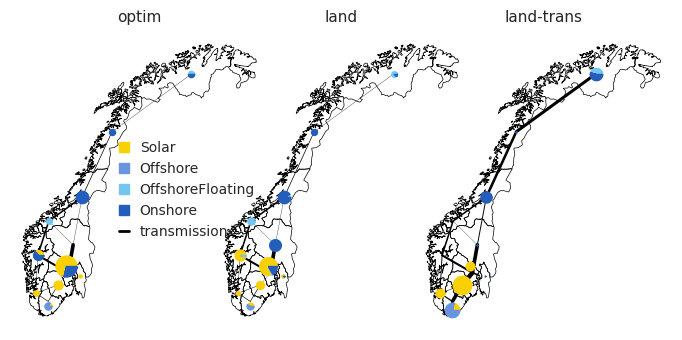

In [1456]:
#Transmission subplot
from matplotlib.lines import Line2D
data_plot = {
    'Optim': {
        'fix': {'pies': fix_optim_pies, 'cap_frac': fix_optim_cap_frac, 'trans': fix_optim_trans, 'trans_tot': fix_optim_trans_tot},
        'lowoh': {'pies': lowoh_optim_pies, 'cap_frac': lowoh_optim_cap_frac, 'trans': lowoh_optim_trans, 'trans_tot': lowoh_optim_trans_tot}
    },
    'Land': {
        'fix': {'pies': fix_land_pies, 'cap_frac': fix_land_cap_frac, 'trans': fix_land_trans, 'trans_tot': fix_land_trans_tot},
        'lowoh': {'pies': lowoh_land_pies, 'cap_frac': lowoh_land_cap_frac, 'trans': lowoh_land_trans, 'trans_tot': lowoh_land_trans_tot}
    }
}
fig, axs = plt.subplots(1, 3, figsize=(14, 3.5))
#fig.subplots_adjust(wspace=-0.7,  hspace=0, left=0.05, right=0.95, top=0.1, bottom=0)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

offset_dict1 = {
    'NO42': [0, -0.4], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

offset_dict2 = {
    'NO42': [0, -0.22], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

legend_entries = []
short_labels = {
    'Solar': 'Solar',
    'WindOffshore': 'Offshore',
    'WindOffshoreFloating': 'OffshoreFloating',
    'WindOnshore': 'Onshore'
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 40
trans_HVACcolor = 'black'

# Create a Line2D object for the legend to represent the transmission line
trans_legend = Line2D([0], [0], color=trans_HVACcolor, linewidth=2, label='transmission')

legend_entries.append(trans_legend)

max_trans_tot = lowoh_land_trans_tot #change the maximum value according to scenario plots

def plot_subplot(ax, data, title, ax_row):
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black')
    
    for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        wedges, labels = data['pies'][i]
        for wedge, label in zip(wedges, labels): 
            color = color_mapping[label.get_text()]
            vertices = wedge.get_path().vertices.tolist()
            size = 500 * data['cap_frac'][i]
            offset_x, offset_y = offset_dict1[i]
            if ax_row == 0:
                offset_x, offset_y = offset_dict2[i]
            ax.scatter(cent.x[i]+offset_x, cent.y[i]+offset_y, marker=(vertices),
                       s=size, zorder=100, facecolor=color)

    ax.axis('off')
    ax.set_title(title, fontsize=11)
    #trans_HVDCcolor = 'red'

    for i in [['NO03', 'NO30'], ['NO11', 'NO38'], ['NO11', 'NO42'], ['NO11', 'NO46'], 
              ['NO15', 'NO34'], ['NO15', 'NO46'], ['NO15', 'NO50'], ['NO18', 'NO50'], 
              ['NO18', 'NO54'], ['NO30', 'NO34'], ['NO30', 'NO38'], ['NO30', 'NO46'],
              ['NO34', 'NO46'], ['NO34', 'NO50'], ['NO38', 'NO42'], ['NO38', 'NO46']]:
        ax.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*data['trans'].query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            #.values[0][0]/data['trans_tot']), color=trans_HVACcolor)
                            .values[0][0]/max_trans_tot), color=trans_HVACcolor)
        
axs[0].legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.4, 0.65))


plot_subplot(axs[0], data_plot['Optim']['fix'], 'optim', 0)
plot_subplot(axs[1], data_plot['Land']['fix'], 'land', 0)
#plot_subplot(axs[2], data_plot['Optim']['lowoh'], 'Optim-Trans', 1)
plot_subplot(axs[2], data_plot['Land']['lowoh'], 'land-trans', 1)

fig.subplots_adjust(wspace=-0.9,  hspace=-0.9, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation6.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.jpg', dpi=300, bbox_inches='tight')

plt.show()
#Why not having this plot when all preferences are in place ??? Why just for only Land and Trans? Because aiming to show the impact
#on transmission when land+trans take place. trans has similar impact  with optim so not displayed here. Probably one table could be made to 
# in supplemental to show the capacities under all scenarios

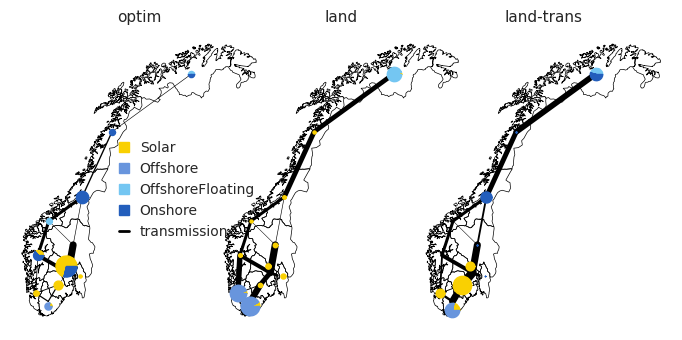

In [212]:
#Transmission subplot for Poster
from matplotlib.lines import Line2D
data_plot = {
    'Optim': {
        'fix': {'pies': fix_optim_pies, 'cap_frac': fix_optim_cap_frac, 'trans': fix_optim_trans, 'trans_tot': fix_optim_trans_tot},
        'lowoh': {'pies': lowoh_optim_pies, 'cap_frac': lowoh_optim_cap_frac, 'trans': lowoh_optim_trans, 'trans_tot': lowoh_optim_trans_tot}
    },
    'Land': {
        'fix': {'pies': cumulative_pies, 'cap_frac': cumulative_cap_frac, 'trans': Cumulative_trans, 'trans_tot': Cumulative_trans_tot},
        'lowoh': {'pies': lowoh_land_pies, 'cap_frac': lowoh_land_cap_frac, 'trans': lowoh_land_trans, 'trans_tot': lowoh_land_trans_tot}
    }
}
fig, axs = plt.subplots(1, 3, figsize=(14, 3.5))
#fig.subplots_adjust(wspace=-0.7,  hspace=0, left=0.05, right=0.95, top=0.1, bottom=0)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

offset_dict1 = {
    'NO42': [0, -0.4], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

offset_dict2 = {
    'NO42': [0, -0.22], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

legend_entries = []
short_labels = {
    'Solar': 'Solar',
    'WindOffshore': 'Offshore',
    'WindOffshoreFloating': 'OffshoreFloating',
    'WindOnshore': 'Onshore'
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 40
trans_HVACcolor = 'black'

# Create a Line2D object for the legend to represent the transmission line
trans_legend = Line2D([0], [0], color=trans_HVACcolor, linewidth=2, label='transmission')

legend_entries.append(trans_legend)

max_trans_tot = fix_optim_trans_tot #change the maximum value according to scenario plots

def plot_subplot(ax, data, title, ax_row):
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black')
    
    for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        wedges, labels = data['pies'][i]
        for wedge, label in zip(wedges, labels): 
            color = color_mapping[label.get_text()]
            vertices = wedge.get_path().vertices.tolist()
            size = 500 * data['cap_frac'][i]
            offset_x, offset_y = offset_dict1[i]
            if ax_row == 0:
                offset_x, offset_y = offset_dict2[i]
            ax.scatter(cent.x[i]+offset_x, cent.y[i]+offset_y, marker=(vertices),
                       s=size, zorder=100, facecolor=color)

    ax.axis('off')
    ax.set_title(title, fontsize=11)
    #trans_HVDCcolor = 'red'

    for i in [['NO03', 'NO30'], ['NO11', 'NO38'], ['NO11', 'NO42'], ['NO11', 'NO46'], 
              ['NO15', 'NO34'], ['NO15', 'NO46'], ['NO15', 'NO50'], ['NO18', 'NO50'], 
              ['NO18', 'NO54'], ['NO30', 'NO34'], ['NO30', 'NO38'], ['NO30', 'NO46'],
              ['NO34', 'NO46'], ['NO34', 'NO50'], ['NO38', 'NO42'], ['NO38', 'NO46']]:
        ax.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*data['trans'].query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            #.values[0][0]/data['trans_tot']), color=trans_HVACcolor)
                            .values[0][0]/max_trans_tot), color=trans_HVACcolor)
        
axs[0].legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.4, 0.65))


plot_subplot(axs[0], data_plot['Optim']['fix'], 'optim', 0)
plot_subplot(axs[1], data_plot['Land']['fix'], 'land', 0)
#plot_subplot(axs[2], data_plot['Optim']['lowoh'], 'Optim-Trans', 1)
plot_subplot(axs[2], data_plot['Land']['lowoh'], 'land-trans', 1)

fig.subplots_adjust(wspace=-0.9,  hspace=-0.9, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation6.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.jpg', dpi=300, bbox_inches='tight')

plt.show()
#Why not having this plot when all preferences are in place ??? Why just for only Land and Trans? Because aiming to show the impact
#on transmission when land+trans take place. trans has similar impact  with optim so not displayed here. Probably one table could be made to 
# in supplemental to show the capacities under all scenarios

In [247]:
clusterpath = "/cluster/work/projects/ec85/EFF/"

In [248]:
scenarios = glob.glob(clusterpath + "models/**/*.db", recursive=True)

In [249]:
scenarios

['/cluster/work/projects/ec85/EFF/models/2010/2010_2030_region_DefaultNO_2_QS1_CSD_CWDH_NSD_NWD_fylketechC_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2050_region_Subsurf_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2040_region_DefaultNO_4_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2040_region_DefaultYes_2_QS1_CSD_CWDHA_NSD_NWD_fylketechC_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2030_region_DefaultYes_2_QS1_CSD_CWDH_NSD_NWD_fylketechD_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2040_region_Subsurf_3_OPT_CSD_CWDHAF_NSD_NWD_fylketechC_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2/results.db',
 '/cluster/work/projects/ec85/EFF/models/2010/2010_2040_region_

In [250]:
for i in range(len(scenarios)):
    scenarios[i] = scenarios[i].replace('/cluster/work/projects/ec85/EFF/','')
    scenarios[i] = scenarios[i].replace('models/2010/','')    
    scenarios[i] = scenarios[i].replace('.db','')
    scenarios[i] = scenarios[i].replace('/results','')

In [251]:
scenarios_short = scenarios

In [252]:
scenarios_short

['2010_2030_region_DefaultNO_2_QS1_CSD_CWDH_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2050_region_Subsurf_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultNO_4_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_2_QS1_CSD_CWDHA_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_2_QS1_CSD_CWDH_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_Subsurf_3_OPT_CSD_CWDHAF_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_Subsurf_4_QS1_CSD_CWDH_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2050_region_Subsurf_5_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_LOWOH_3_QS1_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_3_OPT_CSD_CWDHAF_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2050_region_LOWOH_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2050_region_LOWOH_3_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09

In [253]:
ind_scenario_string = ['2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_OPT_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_OPT_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_OPT_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2'
]

In [254]:
ind_filtered_strings = [s for s in scenarios_short if s in ind_scenario_string]

In [255]:
ind_filtered_strings

['2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_OPT_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2',
 '2010_2050_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2030_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_OPT_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2040_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_

In [256]:
gen = []
how = 'quick'

if how == 'quick':
    for scenario in tqdm(ind_filtered_strings):
        con = sqlite3.connect(clusterpath + "models/2010/" + str(scenario) + "/results.db")
        gen.append(
            pd
            .read_sql_query("SELECT * from var_gen", con)
            .drop(columns={'lo','up','marginal'})   #It is optional
            .set_index(['z','h','g'])
            .stack()
            .reset_index()
            .rename(columns={
                        "z": "zone",
                        "g": "technology",
                        "h": "hour",
                        "level_3" : "type",
                        0: 'electricity_generatioN_GWh'
                    })
            .assign(scenario=scenario)
            .astype({'hour' : int})
            .set_index(['scenario','zone','technology','hour','type'])
            .sort_index()
            )
        con.close()
    df_gen = pd.concat(gen)
    del(gen)
    df_gen

  0%|          | 0/18 [00:00<?, ?it/s]

In [286]:
df_gen

electricity_generatioN_GWh
scenario                                           zone technology  hour type                             
2010_2030_region_DefaultYes_1_OPT_CSD_CWD_NSD_N... NO03 HydroRoR    0    level                    0.004700
                                                                    1    level                    0.004700
                                                                    2    level                    0.004700
                                                                    3    level                    0.004700
                                                                    4    level                    0.004700
...                                                                                                    ...
2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_N... NO54 Windonshore 8755 level                    0.430094
                                                                    8756 level                    0.398235
                                                                    8757 level                    0.382306
                                                                    8758 level                    0.302659
                                                                    8759 level                    0.270800

[15925680 rows x 1 columns]

In [287]:
gen = (df_gen
       .loc[slice(None),slice(None),slice(None),slice(None),'level']
       .groupby(['scenario','zone'])
       .sum()
       .reset_index()
       .set_index(['scenario','zone'])
           .rename(columns={'electricity_generatioN_GWh' : 'generation_GWh'})

)


In [288]:
gen

generation_GWh
scenario                                           zone                
2010_2030_region_DefaultYes_1_OPT_CSD_CWDHAF_NS... NO03       48.601107
                                                   NO11    14240.801041
                                                   NO15    11100.107137
                                                   NO18    19486.438790
                                                   NO30    41753.079446
...                                                                 ...
2010_2050_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_... NO38    28117.248106
                                                   NO42    84584.881634
                                                   NO46    33304.477259
                                                   NO50    26185.471003
                                                   NO54    36725.014851

[198 rows x 1 columns]

In [289]:
string2050 = ['2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_Subsurf_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_2_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_QS1_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_OPT_CSD_CWDHAF_NSD_NWD_fylketechD_0.09_0.15_0.2',
 '2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechC_0.09_0.15_0.2']

In [290]:
pd.set_option('display.max_colwidth', None)

In [291]:
replacement_names = ['base', 'trans', 'trade', 'tech', 'land', 'region']
gen2050 = gen.loc[string2050].reset_index()
gen2050['scenario_name'] = gen2050['scenario'].apply(
    lambda x: replacement_names[string2050.index(x)] if x in string2050 else x
)


In [292]:
gen2050[gen2050['scenario_name'] == 'base']

,scenario,zone,generation_GWh,scenario_name
0,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO03,814.073817,base
1,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO11,16780.293861,base
2,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO15,20331.094955,base
3,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO18,22835.305849,base
4,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO30,68219.456051,base
5,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO34,8140.188010,base
6,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO38,17203.582523,base
7,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO42,38600.954417,base
8,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO46,44979.215320,base
9,2010_2050_region_DefaultYes_1_OPT_CSD_CWD_NSD_NWD_fylketechD_0.09_0.15_0.2,NO50,31611.226150,base


In [293]:
gen2050 = gen2050.groupby(['scenario_name', 'zone']).sum()

/tmp/ipykernel_3926348/2990261998.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gen2050 = gen2050.groupby(['scenario_name', 'zone']).sum()


In [294]:
gen2050

generation_GWh
scenario_name zone                
base          NO03      814.073817
              NO11    16780.293861
              NO15    20331.094955
              NO18    22835.305849
              NO30    68219.456051
...                            ...
trans         NO38    28117.248106
              NO42    84584.881634
              NO46    33304.477259
              NO50    26185.471003
              NO54    36725.014851

[66 rows x 1 columns]

In [295]:
filtered_demand = dem[(dem.index.get_level_values('transmission') != 'DefaultNO')&
                      (dem.index.get_level_values('ImpExp').isin(['1', '2', '3']))] 

In [296]:
demand_Ind_pref = filtered_demand.query(Ind_query_string_2)

In [297]:
replacement_names = ['base', 'trans', 'trade', 'tech', 'land', 'region']
scenarios_demand = pd.DataFrame()

In [298]:
demand_Ind_pref

value
demandyear transmission ImpExp varnewpcapQ corines_onshore fylke_techs zone hour          
2030       DefaultYes   1      OPT         CWD             fylketechD  NO03 0     1.578478
                                                                            1     1.530680
                                                                            2     1.502299
                                                                            3     1.489948
                                                                            4     1.518702
...                                                                                    ...
2050       DefaultYes   1      OPT         CWD             fylketechD  NO54 8755  1.858600
                                                                            8756  1.837100
                                                                            8757  1.796200
                                                                            8758  1.758700
                                                                            8759  1.719000

[1734480 rows x 1 columns]

In [313]:
# Need to manually change the query for getting demand scenarios
result = demand_Ind_pref.query("demandyear == '2050' and transmission == 'DefaultYes' and ImpExp == '2' and "
                "varnewpcapQ == 'OPT' and corines_onshore == 'CWD' and "
                "fylke_techs == 'fylketechD'").groupby('zone').sum()
result['scenario'] = 'region'
scenarios_demand = scenarios_demand.append(result)

/tmp/ipykernel_3926348/2252233639.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scenarios_demand = scenarios_demand.append(result)


In [314]:
scenarios_demand

,value,scenario
zone,,
NO03,16739.9436,base
NO11,28438.8274,base
NO15,25333.9905,base
NO18,23371.0442,base
NO30,36418.4166,base
...,...,...
NO38,24398.4115,region
NO42,19922.5443,region
NO46,42929.7889,region


In [315]:
scenarios_demand = scenarios_demand.groupby(['scenario', 'zone']).sum()

In [316]:
scenarios_demand

value
scenario zone            
base     NO03  16739.9436
         NO11  28438.8274
         NO15  25333.9905
         NO18  23371.0442
         NO30  36418.4166
...                   ...
trans    NO38  24398.4115
         NO42  19922.5443
         NO46  42929.7889
         NO50  20457.0884
         NO54  14960.0577

[66 rows x 1 columns]

In [317]:
df_pop_area = pd.read_csv("/fp/homes01/u01/ec-javedm/ec85/models/shahzad/df_pop_area.csv").set_index('zone')

In [318]:
df_pop_area

,name,Population,Area
zone,,,
NO03,Oslo,717710,426.40
NO11,Rogaland,499417,8575.73
NO15,Møre og Romsdal,270624,13839.56
NO18,Nordland,243081,35759.14
NO30,Viken,1310774,22768.30
NO34,Innlandet,376304,49390.84
NO38,Vestfold og Telemark,433525,15924.74
NO42,Agder,319850,14981.02
NO46,Vestland,651299,31968.72


In [319]:
captotzF = captotz.loc[(slice(None), slice(None), slice(None), slice(None), slice(None),
                    slice(None), slice(None), ['Solar','Windonshore','Windoffshore','Windoffshorefloating', 'HydroRes', 'HydroRoR'],
                                          'level')].droplevel(["level_2"])

In [320]:
captotz.index.get_level_values('technology').unique()

Index(['Export', 'HydroRes', 'HydroRoR', 'Import',
       'NaturalgasCCGTwithCCSnewOT', 'NaturalgasOCGTnew', 'Solar',
       'Windoffshore', 'Windoffshorefloating', 'Windonshore'],
      dtype='object', name='technology')

In [321]:
filtered_captotzF= captotzF[(captotzF.index.get_level_values('transmission') != 'DefaultNO')&
                      (captotzF.index.get_level_values('ImpExp').isin(['1', '2', '3']))]

In [322]:
df_captotzF = filtered_captotzF.query(Ind_query_string_2)
df_captotzF = df_captotzF.groupby([
    "demandyear", "transmission", "ImpExp", "varnewpcapQ", "corines_onshore", "fylke_techs", "zone"]).sum()

In [323]:
df_captotzF.reset_index()

,demandyear,transmission,ImpExp,varnewpcapQ,corines_onshore,fylke_techs,zone,gencap
0,2030,DefaultYes,1,OPT,CWD,fylketechC,NO03,0.824700
1,2030,DefaultYes,1,OPT,CWD,fylketechC,NO11,4.472899
2,2030,DefaultYes,1,OPT,CWD,fylketechC,NO15,3.216850
3,2030,DefaultYes,1,OPT,CWD,fylketechC,NO18,4.465413
4,2030,DefaultYes,1,OPT,CWD,fylketechC,NO30,4.565137
...,...,...,...,...,...,...,...,...
193,2050,Subsurf,1,OPT,CWD,fylketechD,NO38,19.477869
194,2050,Subsurf,1,OPT,CWD,fylketechD,NO42,15.141039
195,2050,Subsurf,1,OPT,CWD,fylketechD,NO46,10.121452
196,2050,Subsurf,1,OPT,CWD,fylketechD,NO50,10.341583


In [324]:
replacement_names = ['base', 'trans', 'trade', 'tech', 'land', 'region']
scenarios_gencap = pd.DataFrame()

In [335]:
# Need to manually change the query for getting demand scenarios
result = df_captotzF.query("demandyear == '2050' and transmission == 'DefaultYes' and ImpExp == '1'and "
                "varnewpcapQ == 'OPT' and corines_onshore == 'CWD' and "
                "fylke_techs == 'fylketechC'").groupby('zone').sum()
result['scenario'] = 'region'
scenarios_gencap = scenarios_gencap.append(result)

/tmp/ipykernel_3926348/2257502881.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scenarios_gencap = scenarios_gencap.append(result)


In [336]:
scenarios_gencap

,gencap,scenario
zone,,
NO03,0.824700,base
NO11,6.375330,base
NO15,4.416041,base
NO18,7.005475,base
NO30,42.017827,base
...,...,...
NO38,3.201393,region
NO42,8.854440,region
NO46,19.957014,region


In [337]:
scenarios_gencap = scenarios_gencap.groupby(["scenario", "zone"]).sum()

In [338]:
scenarios_demand

value
scenario zone            
base     NO03  16739.9436
         NO11  28438.8274
         NO15  25333.9905
         NO18  23371.0442
         NO30  36418.4166
...                   ...
trans    NO38  24398.4115
         NO42  19922.5443
         NO46  42929.7889
         NO50  20457.0884
         NO54  14960.0577

[66 rows x 1 columns]

In [339]:
gen2050

generation_GWh
scenario_name zone                
base          NO03      814.073817
              NO11    16780.293861
              NO15    20331.094955
              NO18    22835.305849
              NO30    68219.456051
...                            ...
trans         NO38    28117.248106
              NO42    84584.881634
              NO46    33304.477259
              NO50    26185.471003
              NO54    36725.014851

[66 rows x 1 columns]

In [340]:
dem_gen_self = gen2050.assign(
    demand = scenarios_demand.value,
    self_suf = lambda x: x.generation_GWh/x.demand,
)

In [341]:
dem_gen_self.head(22)

generation_GWh      demand  self_suf
scenario_name zone                                      
base          NO03      814.073817  16739.9436  0.048631
              NO11    16780.293861  28438.8274  0.590049
              NO15    20331.094955  25333.9905  0.802522
              NO18    22835.305849  23371.0442  0.977077
              NO30    68219.456051  36418.4166  1.873213
              NO34     8140.188010  13257.1181  0.614024
              NO38    17203.582523  24398.4115  0.705111
              NO42    38600.954417  19922.5443  1.937551
              NO46    44979.215320  42929.7889  1.047739
              NO50    31611.226150  20457.0884  1.545246
              NO54    16368.238930  14960.0577  1.094129
land          NO03      842.767218  16739.9436  0.050345
              NO11    15635.069519  28438.8274  0.549779
              NO15    27938.825696  25333.9905  1.102820
              NO18    23328.346572  23371.0442  0.998173
              NO30    49823.504275  36418.4166  1.368085
              NO34    26653.981256  13257.1181  2.010541
              NO38    15923.333850  24398.4115  0.652638
              NO42    34881.531725  19922.5443  1.750857
              NO46    43891.908145  42929.7889  1.022411
              NO50    33475.987626  20457.0884  1.636400
              NO54    17281.910876  14960.0577  1.155203

In [342]:
#Gini coefficients
#Self_sufficiency: zones generation based on what they consume (Gen per dem)
df_score = pd.DataFrame(columns=['scenario','principle','zone','score'])
df_score

,scenario,principle,zone,score


In [343]:
df_gini = pd.DataFrame(columns=['scenario','gini_c','principle' ])
temp_gen_dem = pd.DataFrame(columns=['scenario_name','zone', 'cumulative_gen', 'cumulative_dem', 'principle'])

for scenario in tqdm(dem_gen_self.reset_index().scenario_name.unique()):
    temp = dem_gen_self.loc[scenario, slice(None)].assign(
        share_gen = lambda x : x.generation_GWh/x.generation_GWh.sum(),
        share_dem = lambda x : x.demand/x.demand.sum()
    ).sort_values(
        'self_suf',
        ascending = True
    ).assign(
        cumulative_gen = lambda x: x.share_gen.cumsum(),
        cumulative_dem = lambda x: x.share_dem.cumsum(),
        score = lambda x: x.share_gen * (x.share_dem + 2*(1-x.cumulative_dem))        
    )
    gini = 1-temp.score.sum()
    df_gini = pd.concat([df_gini, pd.DataFrame({'scenario': scenario, 'gini_c': gini, 'principle': 'genperdem'}, index=[0])])

    temp_temp = temp.reset_index().sort_values('self_suf', ascending = True).assign(scenario_name=scenario,
                    principle='genperdem').loc[:, ['zone', 'cumulative_gen', 'cumulative_dem', 'scenario_name', 'principle']] 
    temp_temp_frame = [temp_gen_dem, temp_temp]
    temp_gen_dem = pd.concat(temp_temp_frame)
    
    new_score = temp.reset_index().loc[
        :, ["zone", "self_suf"]
    ].assign(
        scenario = scenario,
        score = lambda x : x.self_suf/x.self_suf.sum(),
        principle = 'genperdem'        
    ).drop(
        columns={'self_suf'}
    )
    frames = [df_score, new_score]
    df_score = pd.concat(frames)            #Each time run, repeatedly add the same rows, be careful

    
df_score


  0%|          | 0/6 [00:00<?, ?it/s]

,scenario,principle,zone,score
0,base,genperdem,NO03,0.004328
1,base,genperdem,NO11,0.052517
2,base,genperdem,NO34,0.054651
3,base,genperdem,NO38,0.062759
4,base,genperdem,NO15,0.071429
...,...,...,...,...
6,trans,genperdem,NO46,0.059302
7,trans,genperdem,NO38,0.088092
8,trans,genperdem,NO50,0.097846
9,trans,genperdem,NO54,0.187652


In [344]:
df_gini

,scenario,gini_c,principle
0,base,0.273579,genperdem
0,land,0.242934,genperdem
0,region,0.338976,genperdem
0,tech,0.290111,genperdem
0,trade,0.316908,genperdem
0,trans,0.409580,genperdem


In [345]:
#Equality: Zones equity based on population
temp_cap_pop = pd.DataFrame(columns=['scenario_name','zone', 'cumulative_cap', 'cumulative_pop', 'cap_per_pop', 'principle'])

for scenario in tqdm(scenarios_gencap.reset_index().scenario.unique()):
    temp = scenarios_gencap.loc[scenario].assign(
        share_cap = lambda x : x.gencap/x.gencap.sum(),
        population = df_pop_area.Population,
        cap_per_pop = lambda x : x.gencap/x.population,
        share_pop = lambda x : x.population/x.population.sum()
    ).sort_values(
            'cap_per_pop',
            ascending=True
    ).assign(
        cumulative_cap = lambda x: x.share_cap.cumsum(),
        cumulative_pop = lambda x: x.share_pop.cumsum(),
        score = lambda x: x.share_cap * (x.share_pop + 2*(1-x.cumulative_pop))
    )

    gini = 1-temp.score.sum()

    # Check if the combination of scenario and principle already exists in the DataFrame
    if ((df_gini['scenario'] == scenario) & (df_gini['principle'] == 'capperpop')).any():
    # Update the gini_c value for the existing row
        df_gini.loc[(df_gini['scenario'] == scenario) & (df_gini['principle'] == 'capperpop'), 'gini_c'] = gini
    else:
    # Add a new row to the DataFrame
        new_row = pd.DataFrame({'scenario': [scenario], 'gini_c': [gini], 'principle': ['capperpop']})
        df_gini = pd.concat([df_gini, new_row], ignore_index=True)

    temp_temp = temp.reset_index().sort_values('cap_per_pop', ascending = True).assign(scenario_name=scenario,
                    principle='capperpop').loc[:, ['zone', 'cumulative_cap', 'cumulative_pop',
                                                   'cap_per_pop', 'scenario_name', 'principle']] 
    temp_temp_frame = [temp_cap_pop, temp_temp]
    temp_cap_pop = pd.concat(temp_temp_frame)

    new_score = temp.reset_index().loc[
        :,["zone","cap_per_pop"]
    ].assign(
        scenario = scenario,
        score = lambda x : x.cap_per_pop/x.cap_per_pop.sum(),
        principle = 'capperpop'
    ).drop(
        columns={'cap_per_pop'}
    )

    frames = [df_score, new_score]
    df_score = pd.concat(frames)            #be careful, it duplicates the values with each rerun    
    
    


df_score

  0%|          | 0/6 [00:00<?, ?it/s]

,scenario,principle,zone,score
0,base,genperdem,NO03,0.004328
1,base,genperdem,NO11,0.052517
2,base,genperdem,NO34,0.054651
3,base,genperdem,NO38,0.062759
4,base,genperdem,NO15,0.071429
...,...,...,...,...
6,trans,capperpop,NO50,0.093359
7,trans,capperpop,NO11,0.094300
8,trans,capperpop,NO54,0.158400
9,trans,capperpop,NO38,0.195886


In [346]:
#Equality: Zones equity based on areas
temp_cap_area = pd.DataFrame(columns=['scenario_name','zone', 'cumulative_cap', 'cumulative_area', 'cap_per_area', 'principle'])

for scenario in tqdm(scenarios_gencap.reset_index().scenario.unique()):
    temp = scenarios_gencap.loc[scenario].assign(
        share_cap = lambda x : x.gencap/x.gencap.sum(),
        land_area = df_pop_area.Area,
        cap_per_area = lambda x : x.gencap/x.land_area,
        share_area = lambda x : x.land_area/x.land_area.sum()
    ).sort_values(
            'cap_per_area',
            ascending=True
    ).assign(
        cumulative_cap = lambda x: x.share_cap.cumsum(),
        cumulative_area = lambda x: x.share_area.cumsum(),
        score = lambda x: x.share_cap * (x.share_area + 2*(1-x.cumulative_area))
    )

    gini = 1-temp.score.sum()

    # Check if the combination of scenario and principle already exists in the DataFrame
    if ((df_gini['scenario'] == scenario) & (df_gini['principle'] == 'capperarea')).any():
    # Update the gini_c value for the existing row
        df_gini.loc[(df_gini['scenario'] == scenario) & (df_gini['principle'] == 'capperarea'), 'gini_c'] = gini
    else:
    # Add a new row to the DataFrame
        new_row = pd.DataFrame({'scenario': [scenario], 'gini_c': [gini], 'principle': ['capperarea']})
        df_gini = pd.concat([df_gini, new_row], ignore_index=True)

    temp_temp = temp.reset_index().sort_values('cap_per_area', ascending = True).assign(scenario_name=scenario,
                    principle='capperarea').loc[:, ['zone', 'cumulative_cap', 'cumulative_area',
                                                    'cap_per_area', 'scenario_name', 'principle']] 
    temp_temp_frame = [temp_cap_area, temp_temp]
    temp_cap_area = pd.concat(temp_temp_frame)

    new_score = temp.reset_index().loc[
        :,["zone","cap_per_area"]
    ].assign(
        scenario = scenario,
        score = lambda x : x.cap_per_area/x.cap_per_area.sum(),
        principle = 'capperarea'
    ).drop(
        columns={'cap_per_area'}
    )

    frames = [df_score, new_score]
    df_score = pd.concat(frames)            #be careful, it duplicates the values with each rerun    
    
    


df_score

  0%|          | 0/6 [00:00<?, ?it/s]

,scenario,principle,zone,score
0,base,genperdem,NO03,0.004328
1,base,genperdem,NO11,0.052517
2,base,genperdem,NO34,0.054651
3,base,genperdem,NO38,0.062759
4,base,genperdem,NO15,0.071429
...,...,...,...,...
6,trans,capperarea,NO30,0.077984
7,trans,capperarea,NO42,0.145048
8,trans,capperarea,NO38,0.175536
9,trans,capperarea,NO11,0.180769


In [347]:
temp_cap_area

,scenario_name,zone,cumulative_cap,cumulative_area,cap_per_area,principle
0,base,NO34,0.020675,0.162444,0.000049,capperarea
1,base,NO54,0.057317,0.395698,0.000061,capperarea
2,base,NO18,0.117089,0.513308,0.000196,capperarea
3,base,NO15,0.154767,0.558826,0.000319,capperarea
4,base,NO50,0.281875,0.688718,0.000377,capperarea
...,...,...,...,...,...,...
6,trans,NO30,0.521592,0.868745,0.000543,capperarea
7,trans,NO42,0.678226,0.918017,0.001011,capperarea
8,trans,NO38,0.879724,0.970392,0.001223,capperarea
9,trans,NO11,0.991469,0.998598,0.001260,capperarea


In [214]:
#ploting dataframes for equity/gini
temp_gen_dem
temp_cap_pop
temp_cap_area
df_score
df_gini

,scenario,gini_c,principle
0,land,0.242934,genperdem
1,optim,0.273579,genperdem
2,region,0.338811,genperdem
3,tech,0.252588,genperdem
4,trade,0.316908,genperdem
5,trans,0.440928,genperdem
6,land,0.263217,capperpop
7,optim,0.283462,capperpop
8,region,0.441436,capperpop
9,tech,0.376488,capperpop


<Figure size 800x800 with 0 Axes>

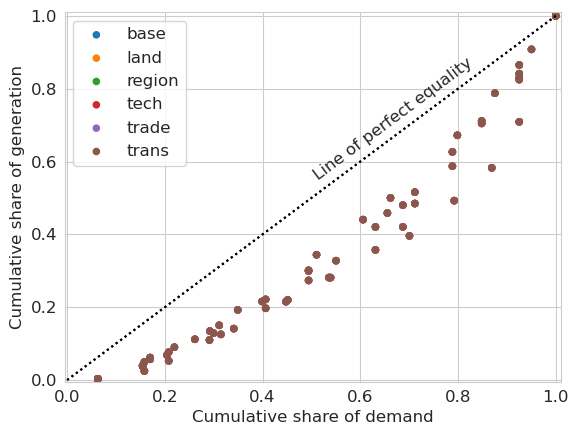

In [348]:
# zone score plot

# create the df for the linear plot
df1 = pd.DataFrame({
   'x': [0,1],
   'y': [0,1]
   }
)

plt.figure(figsize=(8,8))
ax = df1.plot(
    legend = False,
    linestyle = ':',
    color = 'k',
    #ax=plt.gca()
)

colors = sns.color_palette('tab10', n_colors=temp_gen_dem['scenario_name'].nunique())

for idx, scenario in enumerate(temp_gen_dem['scenario_name'].unique()):
    scenario_data = temp_gen_dem[temp_gen_dem['scenario_name'] == scenario]
    
    ax.scatter(
    x = temp_gen_dem['cumulative_dem'],
    y = temp_gen_dem['cumulative_gen'],
    label=scenario,
    color=colors[idx],
    s = 30,
    edgecolor='none'
    #xlim = [0,1],
    #ylim = [0,1],
    )

    # Prepare data for interpolation
    x = scenario_data['cumulative_dem'].to_numpy(copy=True)
    x = np.insert(x, 0, 0)
    y = scenario_data['cumulative_gen'].to_numpy(copy=True)
    y = np.insert(y, 0, 0)

    # Interpolate and the line
    f = interp1d(x, y)
    B = integrate.quad(f,0,1, epsabs = 1e-4)            #Integarting the piecewise funtion from 0 to 1
    G = 1-2*B[0]
    #x_interp = np.linspace(0, 1, num=500)
    #y_interp = f(x_interp)
    #ax.plot(x, y, color=colors[idx], linestyle='-', alpha=0.6)

plt.text(
    df1.x.mean(),
    df1.y.mean()+0.05, 
    'Line of perfect equality',
    rotation = 45,
    #rotation=math.degrees(math.atan(a/b)), 
    #ha = 'center',
    transform_rotates_text=True,
    size = 12
)

ax.set_xlabel('Cumulative share of demand', fontsize=12)
ax.set_ylabel('Cumulative share of generation', fontsize=12)
ax.set_xlim(-0.005, 1.01)
ax.set_ylim(-0.005, 1.01)

handles, labels = ax.get_legend_handles_labels()
unique_labels = {label: handle for handle, label in zip(handles[2:], labels[2:])}
ax.tick_params(axis='both', which='both', direction='out', length=2, labelsize=12)
ax.legend(unique_labels.values(), unique_labels.keys(), fontsize=12, title_fontsize=14)    


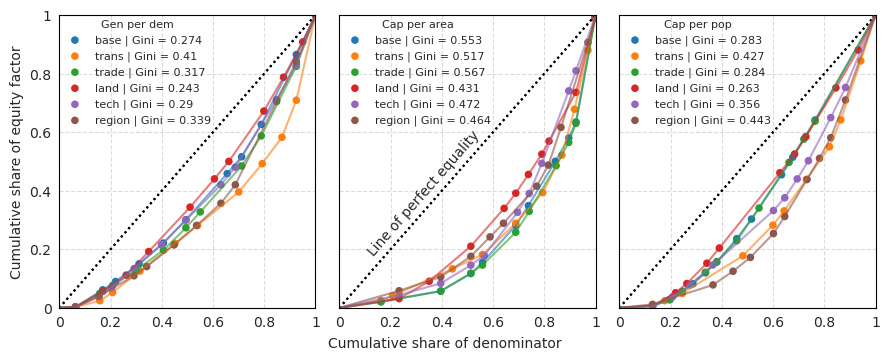

In [350]:
plt.figure(figsize=(9, 3.5))


dataframes = [temp_gen_dem, temp_cap_area, temp_cap_pop]
x_columns = ['cumulative_dem', 'cumulative_area', 'cumulative_pop']
y_columns = ['cumulative_gen', 'cumulative_cap', 'cumulative_cap']
subplot_texts = ['Gen per dem', 'Cap per area', 'Cap per pop']

plot_order = ['base', 'trans', 'trade', 'land', 'tech', 'region'] 

for i, (df, x_col, y_col) in enumerate(zip(dataframes, x_columns, y_columns), 1):
    ax = plt.subplot(1, 3, i)

    df1 = pd.DataFrame({'x': [0,1], 'y': [0,1]})
    df1.plot(legend=None, linestyle=':', color='k', ax=ax)

    colors = sns.color_palette('tab10', n_colors=df['scenario_name'].nunique())

    scatter_handles = []
    scatter_labels = []    

    #for idx, scenario in enumerate(df['scenario_name'].unique()):
    for idx, scenario in enumerate(plot_order):
        scenario_data = df[df['scenario_name'] == scenario]
        principle = scenario_data['principle'].unique()[0]

        gini_value = round(df_gini.set_index(['scenario', 'principle']).loc[(str(scenario), str(principle))].gini_c, 3)
        label = f"{scenario} | Gini = {gini_value}"
        scatter = ax.scatter(
            x=scenario_data[x_col],
            y=scenario_data[y_col],
            label= label,
            color=colors[idx],
            s=30,
            edgecolor='none'
        )

        scatter_handles.append(scatter)
        scatter_labels.append(label)
        
        x = scenario_data[x_col].to_numpy(copy=True)
        x = np.insert(x, 0, 0)
        y = scenario_data[y_col].to_numpy(copy=True)
        y = np.insert(y, 0, 0)
        
        f = interp1d(x, y)
        B = integrate.quad(f, 0, 1, epsabs=1e-4)
        G = 1 - 2 * B[0]
        
        ax.plot(x, y, color=colors[idx], linestyle='-', alpha=0.6)
        ax.grid(True, linestyle='--', alpha=0.7)
    #ax.tick_params(axis='both', which='major', labelsize=8)

    if i == 2:
        plt.text(
            df1.x.mean()-0.4,
            df1.y.mean()-0.32,
            'Line of perfect equality',
            rotation=45,
            transform_rotates_text=True,
            size=10
        )

    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xticklabels(['0', '0.2', '0.4', '0.6', '0.8', '1'])
    #ax.set_xlabel(f'Cumulative share of {x_col.split("_")[1]}', fontsize=12)
    #ax.set_ylabel(f'Cumulative share of {y_col.split("_")[1]}', fontsize=12)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.tick_params(axis='both', which='both', direction='out', length=2, labelsize=10)

    if i != 1:
        ax.tick_params(axis='y', which='both', length=0, labelleft=False)
    else:
        ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1])
        ax.set_yticklabels(['0', '0.2', '0.4', '0.6', '0.8', '1'])
        ax.set_ylabel('Cumulative share of equity factor', fontsize=10)


    #ax.text(0.5, 0.96, subplot_texts[i-1], transform=ax.transAxes, ha='center', va='top')
    #Ordering the legend
    
    ax.legend(handles=scatter_handles, labels=scatter_labels, title=f"{subplot_texts[i-1]}",borderaxespad=0,frameon=False,
              fontsize=8, title_fontsize=8)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')


fig = plt.gcf()
fig.text(0.5, -0.01, 'Cumulative share of denominator', ha='center', fontsize=10)
#ordered_indices = [scatter_labels.index(label) for label in legend_order]
#print(scatter_labels.index)

plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/Equity_analysis.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/Equity_analysis.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()


In [ ]:
#Outreach: People preferences not necessarily increase the equity but it could go both ways, i.e., making equality worst or
# good. Regradless of prefence scenario, the gini vaues remain higher for trading and transmission scenarios illustrating 
# model installed the new capacities in the zones that are linked to neighbouring countries, exporting the electricity while importing
# to meet the demand of zones that donot have interconnections. For example: 
# Land and regional preferences making the system more equatible then optimal case for all of the equality definations. 

In [351]:
df_gini

,scenario,gini_c,principle
0,base,0.273579,genperdem
1,land,0.242934,genperdem
2,region,0.338976,genperdem
3,tech,0.290111,genperdem
4,trade,0.316908,genperdem
5,trans,0.409580,genperdem
6,base,0.283462,capperpop
7,land,0.263217,capperpop
8,region,0.443381,capperpop
9,tech,0.355950,capperpop


In [352]:
dem_gen_self

generation_GWh      demand  self_suf
scenario_name zone                                      
base          NO03      814.073817  16739.9436  0.048631
              NO11    16780.293861  28438.8274  0.590049
              NO15    20331.094955  25333.9905  0.802522
              NO18    22835.305849  23371.0442  0.977077
              NO30    68219.456051  36418.4166  1.873213
...                            ...         ...       ...
trans         NO38    28117.248106  24398.4115  1.152421
              NO42    84584.881634  19922.5443  4.245687
              NO46    33304.477259  42929.7889  0.775789
              NO50    26185.471003  20457.0884  1.280019
              NO54    36725.014851  14960.0577  2.454871

[66 rows x 3 columns]

In [353]:
dem_gen_self = dem_gen_self.assign(principle = 'selfsufficiency').reset_index()
temp_cap_pop
temp_cap_area

,scenario_name,zone,cumulative_cap,cumulative_area,cap_per_area,principle
0,base,NO34,0.020675,0.162444,0.000049,capperarea
1,base,NO54,0.057317,0.395698,0.000061,capperarea
2,base,NO18,0.117089,0.513308,0.000196,capperarea
3,base,NO15,0.154767,0.558826,0.000319,capperarea
4,base,NO50,0.281875,0.688718,0.000377,capperarea
...,...,...,...,...,...,...
6,trans,NO30,0.521592,0.868745,0.000543,capperarea
7,trans,NO42,0.678226,0.918017,0.001011,capperarea
8,trans,NO38,0.879724,0.970392,0.001223,capperarea
9,trans,NO11,0.991469,0.998598,0.001260,capperarea


In [354]:
temp_cap_area['cap_per_area_normalized'] = (temp_cap_area.groupby('scenario_name')['cap_per_area']
                                            .transform(lambda x: x / x.sum()).round(2))
temp_cap_area

,scenario_name,zone,cumulative_cap,cumulative_area,cap_per_area,principle,cap_per_area_normalized
0,base,NO34,0.020675,0.162444,0.000049,capperarea,0.01
1,base,NO54,0.057317,0.395698,0.000061,capperarea,0.01
2,base,NO18,0.117089,0.513308,0.000196,capperarea,0.03
3,base,NO15,0.154767,0.558826,0.000319,capperarea,0.04
4,base,NO50,0.281875,0.688718,0.000377,capperarea,0.05
...,...,...,...,...,...,...,...
6,trans,NO30,0.521592,0.868745,0.000543,capperarea,0.08
7,trans,NO42,0.678226,0.918017,0.001011,capperarea,0.15
8,trans,NO38,0.879724,0.970392,0.001223,capperarea,0.18
9,trans,NO11,0.991469,0.998598,0.001260,capperarea,0.18


In [355]:
temp_cap_pop['cap_per_pop_normalized'] = (temp_cap_pop.groupby('scenario_name')['cap_per_pop']
                                            .transform(lambda x: x / x.sum()))
temp_cap_pop

,scenario_name,zone,cumulative_cap,cumulative_pop,cap_per_pop,principle,cap_per_pop_normalized
0,base,NO03,0.007037,0.129312,0.000001,capperpop,0.005239
1,base,NO34,0.027712,0.197112,0.000006,capperpop,0.029362
2,base,NO11,0.082107,0.287094,0.000013,capperpop,0.058206
3,base,NO15,0.119786,0.335853,0.000016,capperpop,0.074404
4,base,NO54,0.156427,0.379935,0.000018,capperpop,0.080033
...,...,...,...,...,...,...,...
6,trans,NO50,0.438169,0.730198,0.000021,capperpop,0.093359
7,trans,NO11,0.549914,0.820180,0.000022,capperpop,0.094300
8,trans,NO54,0.641869,0.864262,0.000036,capperpop,0.158400
9,trans,NO38,0.843367,0.942371,0.000045,capperpop,0.195886


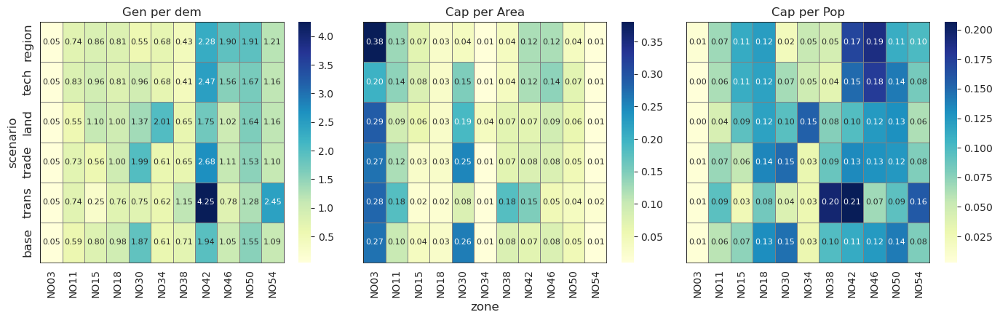

In [357]:
scenarios_order = ['region','tech','land', 'trade', 'trans', 'base']


# Pivot the DataFrame to get the desired format


# Plot the heatmap
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 4.5))

pivot_data1 = dem_gen_self.pivot_table(index='scenario_name', columns='zone', values='self_suf')
pivot_data1 = pivot_data1.reindex(scenarios_order)

sns.heatmap(pivot_data1, ax=ax1, cmap='YlGnBu', cbar=True, annot=True, fmt=".2f", linewidths=.5, linecolor='gray',annot_kws={'size': 8})

ax1.set_title('Gen per dem', fontsize=12)
ax1.set_xlabel('')
ax1.set_ylabel('scenario', fontsize=12)
ax1.tick_params(axis='y', labelsize=12)


pivot_data2 = temp_cap_area.pivot_table(index='scenario_name', columns='zone', values='cap_per_area_normalized')
pivot_data2 = pivot_data2.reindex(scenarios_order)
sns.heatmap(pivot_data2, ax=ax2, cmap='YlGnBu', cbar=True, annot=True, fmt=".2f", linewidths=.5, linecolor='gray', annot_kws={'size': 8})

ax2.set_title('Cap per Area', fontsize=12)
ax2.set_xlabel('zone', fontsize=12)
ax2.set_ylabel('')
ax2.tick_params(axis='y', length=0, labelleft=False)


pivot_data3 = temp_cap_pop.pivot_table(index='scenario_name', columns='zone', values='cap_per_pop_normalized')
pivot_data3 = pivot_data3.reindex(scenarios_order)
sns.heatmap(pivot_data3, ax=ax3, cmap='YlGnBu', cbar=True, annot=True,fmt=".2f", linewidths=.5, linecolor='gray',annot_kws={'size': 8})
ax3.set_title('Cap per Pop', fontsize=12)
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='y', length=0, labelleft=False)

# Customize the colorbar for each subplot
#for ax in [ax3]:
    #cbar = ax.collections[0].colorbar
    #cbar.ax.tick_params(labelsize=9, size=2)  # Customize colorbar tick size and font size
    #cbar.set_ticks([round(tick, 3) for tick in cbar.get_ticks()])  # Set rounded ticks
for ax in [ax1, ax2, ax3]:
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.5)
        spine.set_edgecolor('black')
plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/heatmap_justiceDefiantions.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/heatmap_justiceDefiantions.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()

In [ ]:
Norway

In [177]:
df_pop_area

,name,Population,Area
zone,,,
NO03,Oslo,717710,426.40
NO11,Rogaland,499417,8575.73
NO15,Møre og Romsdal,270624,13839.56
NO18,Nordland,243081,35759.14
NO30,Viken,1310774,22768.30
NO34,Innlandet,376304,49390.84
NO38,Vestfold og Telemark,433525,15924.74
NO42,Agder,319850,14981.02
NO46,Vestland,651299,31968.72


In [1402]:
df_pop_area.Population.sum()

5550203

In [1396]:
NStatis = df_pop_area.query("zone== 'NO54' or zone == 'NO18'").sum()
SStatis = df_pop_area.query("zone== 'NO42'").sum()
EStatis = df_pop_area.query("zone== 'NO30' or zone == 'NO34' or zone == 'NO03' or zone == 'NO38'").sum()
WStatis = df_pop_area.query("zone== 'NO46' or zone == 'NO15' or zone == 'NO11'").sum()
CStatis = df_pop_area.query("zone== 'NO50'").sum()

In [1397]:
NStatis

name          NordlandTroms og Finnmark
Population                       487744
Area                          106679.86
dtype: object

In [1398]:
WStatis

name          RogalandMøre og RomsdalVestland
Population                            1421340
Area                                 54384.01
dtype: object

In [1403]:
(SStatis.Population + EStatis.Population)/df_pop_area.Population.sum()

0.5690175656638145

In [360]:
scenarios_demand

value
scenario zone            
base     NO03  16739.9436
         NO11  28438.8274
         NO15  25333.9905
         NO18  23371.0442
         NO30  36418.4166
...                   ...
trans    NO38  24398.4115
         NO42  19922.5443
         NO46  42929.7889
         NO50  20457.0884
         NO54  14960.0577

[66 rows x 1 columns]

In [370]:
#Norway['demand_GW'] = scenarios_demand.query("scenario=='optim'").droplevel('scenario').div(1000)
Norway['population'] = df_pop_area['Population'].div(1000000)
Norway['Area'] = df_pop_area['Area']

In [369]:
Norway

name  \
NO03                  Oslo   
NO11              Rogaland   
NO15       Møre og Romsdal   
NO18              Nordland   
NO30                 Viken   
NO34             Innlandet   
NO38  Vestfold og Telemark   
NO42                 Agder   
NO46              Vestland   
NO50             Trøndelag   
NO54     Troms og Finnmark   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

/tmp/ipykernel_3926348/357375923.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


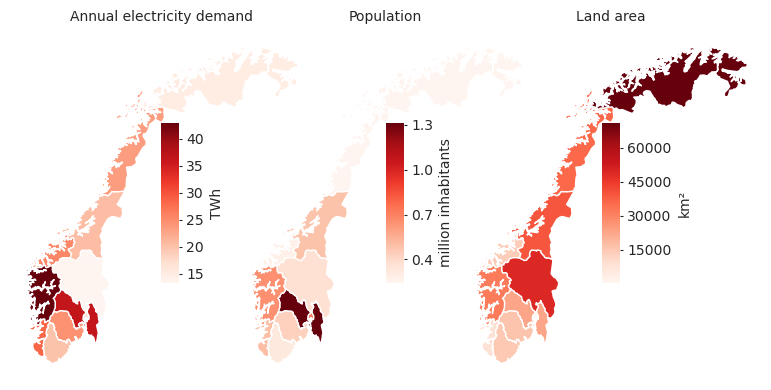

In [373]:
fig, axes = plt.subplots(1, 3, figsize=(9, 4))
fig.subplots_adjust(wspace=-0.4, left=0.15, right=0.75, top=0.3, bottom=0.2)

# plot demand
ax1 = axes[0]

Norway.plot(ax=ax1, column='demand_2050_TWh', cmap='Reds', legend=False)

ax_color_scale1 = fig.add_axes([0.25, 0.28, 0.02, 0.4])  # Adjust position as needed
cmap = plt.get_cmap('Reds')
norm = plt.Normalize(vmin=Norway['demand_2050_TWh'].min(), 
                         vmax=Norway['demand_2050_TWh'].max())
cb1 = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale1, orientation='vertical')
cb1.set_label('TWh', fontsize=10)
new_ticks = [15, 20, 25, 30, 35, 40]
cb1.set_ticks(new_ticks)
cb1.outline.set_visible(False)
cb1.ax.tick_params(length=2)

ax1.axis('off')

ax1.set_title('Annual electricity demand', fontsize=10)


# plot population
ax2 = axes[1]

Norway.plot(ax=ax2, column='population', cmap='Reds', legend=False)

ax_color_scale2 = fig.add_axes([0.5, 0.28, 0.02, 0.4])  # Adjust position as needed
cmap = plt.get_cmap('Reds')
norm = plt.Normalize(vmin=Norway['population'].min(), 
                         vmax=Norway['population'].max())
cb2 = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale2, orientation='vertical')
cb2.set_label('million inhabitants', fontsize=10)
new_ticks = [0.4, 0.7, 1, 1.3]
cb2.set_ticks(new_ticks)
cb2.outline.set_visible(False)
cb2.ax.tick_params(length=2)

ax2.axis('off')

ax2.set_title('Population', fontsize=10)

# plot area
ax3 = axes[2]

Norway.plot(ax=ax3, column='Area', cmap='Reds', legend=False)

ax_color_scale3 = fig.add_axes([0.74, 0.28, 0.02, 0.4])  # Adjust position as needed
cmap = plt.get_cmap('Reds')
norm = plt.Normalize(vmin=Norway['Area'].min(), 
                         vmax=Norway['Area'].max())
cb3 = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale3, orientation='vertical')
cb3.set_label('km²', fontsize=10)
new_ticks = [15000, 30000, 45000, 60000]
cb3.set_ticks(new_ticks)
cb3.outline.set_visible(False)
cb3.ax.tick_params(length=2)

ax3.axis('off')

ax3.set_title('Land area', fontsize=10)

plt.tight_layout()

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/Equitydenominators.png', dpi=300, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/updated/transperent/Equitydenominators.png', dpi=300, transparent=True, bbox_inches='tight')

plt.show()






In [ ]:
(
    pd.concat([gentot, storage_gen_tot.rename(columns={"storecaptot": "value"})])
    .query("year == '2010' and Spatial == 'grid'")
    .unstack()
    .loc[:, "value"]
    .rename(columns={"Li-ion-8": "Lion", "Windonshore": "OnWind"})
    .drop(columns=["HydroRes", "HydroRoR"])
    .plot.barh(
        stacked=True,
        title="Electricity generation in 2030 in Norway without hydropower because that is almost constant",
        # ylabel="Scenario",
        xlabel="GWh",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
    )
)  #
# Include penalty generation

In [ ]:
gentot.concat(storetot)

In [ ]:
# How expensive is each scenario?
costs = makenice(sqlite_list, "cost")

In [ ]:
costs.query("variable == 'costs' & level_1 == 'level'").sort_values(by="costs",ascending=False)

In [ ]:
costs.query("variable == 'costs' & level_1 == 'level'").sort_values(by="costs",ascending=False)

In [ ]:
costs.query("variable == 'costs' & level_1 == 'level'").sort_values(by="costs",ascending=False).plot.barh()

In [ ]:
costs.query("variable == 'costs' & level_1 == 'level'").sort_values(by="costs",ascending=False).plot.barh()

In [ ]:
costs.query("variable == 'costs' & level_1 == 'level'").sort_values(by="costs",ascending=False).plot.barh()

In [ ]:
costs.query("variable == 'costs' & level_1 == 'level'").sort_values(by="costs",ascending=False).plot.barh()

In [ ]:
costs

In [ ]:
barplot(costs.query('level_1 == "level"').rename(columns={"costs": "value"}))

In [ ]:
costs.query(
    "level_1 == 'level' and year == '2010'"
    "and Spatial == 'grid'"
    "and Neigh != 'High'"
).unstack(["Solar"]).plot.barh(subplots=True, figsize=(15, 15))

In [ ]:
# 4.1 General cost overview
barplot(
    costs.query(
        "level_1 == 'level' and Spatial == 'grid' and Solar != 'High' and Neigh != 'High'"
    ),
    True,
)

In [ ]:
#

barplot(
    costs.query(
        #    'level_1 == "level" and year == "2010" and Cutoff == "0.15" and Neigh != "High"'
        'level_1 == "level"'
        #' and Neigh != "High"'
        'and Spatial == "grid" and year == "2010" and Solar == "High"'
    )
    .assign(relcost=lambda df: (df.costs / df.costs.min()).mul(100) - 100)
    .loc[:, ["relcost"]]
    .rename(
        columns={"relcost": "Relative cost increase compared to cheapest scenario [%]"}
    ),
    True,
)
# plt.xlim(1,1.2)
# stacked bars for load shedding

# Maybe reduce the number of bars and take Figure 4 from the low carbon paper as in inspiration?
# Create this with more info from the distribution of costs from the bottom
# Two panels on costs

In [ ]:
(
    costs.sort_index()
    .reset_index()
    .assign(
        name=lambda df: df.year.astype(str)
        + "_"
        + df.Nature
        + "_"
        + df.Fauna
        + "_"
        + df.Sami
        + "_"
        + df.Neigh
        + "_"
        + df.Solar
        + "_"
        + df.Spatial
    )
    .query('level_1 == "level"')
    .drop(columns=["variable", "level_1"])
    .set_index("name")
    # .sort_values(by="costs")
    .loc[:, "costs"]
    .plot.barh(figsize=(10, 15))
)

In [ ]:
df_costs.loc[(slice(None), "var_system_costs", slice(None))]

## Generator power capacity


### Total


In [ ]:
caps.index.levels

In [ ]:
level_to_change = 2
caps.index.set_levels(caps.index.levels[level_to_change].astype(int), level=level_to_change)

In [ ]:
# How much capacity per scenario?
caps = makenice(sqlite_list, "cap")
caps.index = caps.index.set_levels(caps.index.levels[level_to_change].astype(int), level=level_to_change)

In [ ]:
caps.query("level_1=='level'")

In [ ]:
caps.query("level_1=='level'&technology=='Windoffshore'")

In [ ]:
caps.query("level_1=='level'&technology=='NuclearEPR'")

In [ ]:
scale = 1
(
    caps.query(
        "level_1 == 'level'"
        ## "& year == '2010'"
        ## "& ((Neigh == 'High' and Solar == 'Low') or (Neigh == 'None' and Solar == 'Low'))"
        ## " & Solar == 'Low'"
    )
    .droplevel("level_1")
    .unstack()
    .loc[:, "gencaptot"]
    .loc[:, ["Solar", "Windoffshore", "Windonshore", "Windoffshorefloating"]]
    .sort_index()
    ###.sort_values(["Windonshore"])
    .rename(
        columns={
            "NaturalgasCCGTwithCCSnewOT": "GasCCS",
            "NaturalgasOCGTnew": "Gas",
            "Windonshore": "OnWind",
        },
    )
    # .query("year == '2010'")  # and ( Neigh == 'High' or Neigh == 'None') ")
    # .drop(columns=[
    #    "HydroRes",
    #    "HydroRoR",
    #    "Import"
    # ])
    # .loc[:,[
    #     #"OnWind",
    #     #"Solar"]
    # ]]
    .plot.barh(
        #stacked=True,
        title="Norwegian optimal installed electrictiy generation capacity without hydro and imports because they are fixed 2030",
        # ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
    )
)

In [ ]:
scale = 1
(
    caps.query(
        "level_1 == 'level'"
        ## "& year == '2010'"
        ## "& ((Neigh == 'High' and Solar == 'Low') or (Neigh == 'None' and Solar == 'Low'))"
        ## " & Solar == 'Low'"
    )
    .droplevel("level_1")
    .unstack()
    .loc[:, "gencaptot"]
    .loc[:, ["Solar", "Windoffshore", "Windonshore"]]
    .sort_index()
    ###.sort_values(["Windonshore"])
    .rename(
        columns={
            "NaturalgasCCGTwithCCSnewOT": "GasCCS",
            "NaturalgasOCGTnew": "Gas",
            "Windonshore": "OnWind",
        },
    )
    # .query("year == '2010'")  # and ( Neigh == 'High' or Neigh == 'None') ")
    # .drop(columns=[
    #    "HydroRes",
    #    "HydroRoR",
    #    "Import"
    # ])
    # .loc[:,[
    #     #"OnWind",
    #     #"Solar"]
    # ]]
    .plot.barh(
        #stacked=True,
        title="Norwegian optimal installed electrictiy generation capacity without hydro and imports because they are fixed 2030",
        # ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
    )
)

In [ ]:
scale = 1
(
    caps.query(
        "level_1 == 'level'"
        ## "& year == '2010'"
        ## "& ((Neigh == 'High' and Solar == 'Low') or (Neigh == 'None' and Solar == 'Low'))"
        ## " & Solar == 'Low'"
    )
    .droplevel("level_1")
    .unstack()
    .loc[:, "gencaptot"]
    .loc[:, ["Solar", "Windoffshore", "Windonshore"]]
    .sort_index()
    ###.sort_values(["Windonshore"])
    .rename(
        columns={
            "NaturalgasCCGTwithCCSnewOT": "GasCCS",
            "NaturalgasOCGTnew": "Gas",
            "Windonshore": "OnWind",
        },
    )
    # .query("year == '2010'")  # and ( Neigh == 'High' or Neigh == 'None') ")
    # .drop(columns=[
    #    "HydroRes",
    #    "HydroRoR",
    #    "Import"
    # ])
    # .loc[:,[
    #     #"OnWind",
    #     #"Solar"]
    # ]]
    .plot.barh(
        #stacked=True,
        title="Norwegian optimal installed electrictiy generation capacity without hydro and imports because they are fixed 2030",
        # ylabel="Scenario",
        xlabel="GW",
        figsize=(21.533 / scale, 12.582 / scale),
        color=colordict,
    )
)

### New


In [ ]:
# TODO: What percentage of total land area are we using?
caps

In [ ]:
# How much new capacity per scenario?
newcaps = makenice(sqlite_list, "newcap")

In [ ]:
newcaps

In [ ]:
(
    newcaps.reset_index()
    #.assign(
    #    name=lambda df: df.year.astype(str)
    #    + "_"
    #    + df.Nature
    #    + "_"
    #    + df.Fauna
    #    + "_"
    #    + df.Sami
    #    + "_"
    #    + df.Neigh
    #    + "_"
    #    + df.Solar
    #    + "_"
    #    + df.Spatial
    #)
    #.query('level_1 == "level"')
    # .drop(columns=["level_1"])
    # .set_index("name")
    # .sort_values(by="gencapnew")
    # .loc[:, "gencapnew"]
    # .plot.barh(figsize=(10, 15))
)

## Storage capacity


In [ ]:
import connectorx as cx

db_path = str(sqlite_list[0])  # path to your SQLite database
conn = "sqlite://" + db_path  # connection token
# query = 'SELECT h,vre,r,AVG(value) FROM vre_gen GROUP BY h'            # query string
query = "SELECT vre,r,AVG(value) FROM vre_gen WHERE vre='Windoffshore' GROUP BY vre,r;"
cx.read_sql(conn, query)  # read data from SQLite

In [ ]:
sql_conn = sqlite3.connect(sqlite_list[0], timeout=60)
connectorx.read_sql(sql_conn, "SELECT * FROM vre_gen")

In [ ]:
capfacs = makenice(sqlite_list, "vre_gen")

In [ ]:
for scenario in tqdm(scenariolist):
        scenarioname = str(scenario).split("/")[-2]
        year = str(scenario).split("/")[-3]
        #    scenarioname = str(scenario)[18:-11]
        scenarionamesplit = scenarioname.split("_")

        if parameter != "capacityfactor":
            con = sqlite3.connect(scenario)

        appendme = pd.read_sql_query(f"SELECT * from {table}", con)

        if tabletype == "multiple":
            appendme = appendme.set_index(index).stack().reset_index()

        appendme = (
            appendme.rename(columns=indexdict)
            .assign(
                year=year,
                Nature=scenarionamesplit[0],
                Fauna=scenarionamesplit[1],
                Sami=scenarionamesplit[2],
                Neigh=scenarionamesplit[3],
                Solar=scenarionamesplit[4],
                Spatial=scenarionamesplit[5],
                Cutoff=scenarionamesplit[6]
            )
            .astype(types)
            .set_index(indexlist)
            .sort_index()
        )
        returnlist.append(appendme)
        con.close()
    return pd.concat(returnlist)

In [ ]:
str(scenario).split("/")[-2]

In [ ]:
pd.read_parquet(scenario / "vre_1995_.parquet", engine="pyarrow")

In [ ]:
collectionlist = []

for scenario in tqdm(
    requested_scenarios.query("status == 'optimal' & spatials == 'grid'")
    .groupby("years")
    .first()
    .path
):
    scenarioname = str(scenario).split("/")[-1]
    year = str(scenario).split("/")[-2]
    scenarionamesplit = scenarioname.split("_")
    (
        collectionlist.append(
            pd.read_parquet(scenario / ("vre_" + year + "_.parquet"))
            # .query("technology == 'Windonshore'")
            # .groupby("spatial")
            # .mean()
            .assign(
                year=year,
                Nature=scenarionamesplit[0],
                Fauna=scenarionamesplit[1],
                Sami=scenarionamesplit[2],
                Neigh=scenarionamesplit[3],
                Solar=scenarionamesplit[4],
                Spatial=scenarionamesplit[5],
                Cutoff=scenarionamesplit[6],
            )
            .set_index()
            .sort_index()
        )
    )

gridcapfacs = pd.concat(collectionlist)

In [ ]:
collectionlist = []
for scenario in tqdm(sqlite_list):
    scenarioname = str(scenario).split("/")[-2]
    year = str(scenario).split("/")[-3]
    scenarionamesplit = scenarioname.split("_")
    (
        collectionlist.append(
            pd.read_parquet(sqlite_list[0].parent / ("vre_" + year + "_.parquet"))
            .query("technology == 'Windonshore'")
            .groupby("spatial")
            .mean()
            .assign(
                year=year,
                Nature=scenarionamesplit[0],
                Fauna=scenarionamesplit[1],
                Sami=scenarionamesplit[2],
                Neigh=scenarionamesplit[3],
                Solar=scenarionamesplit[4],
                Spatial=scenarionamesplit[5],
                Cutoff=scenarionamesplit[6],
            )
            .set_index()
            .sort_index()
        )
    )
gridcapfacs = pd.concat(collectionlist)

In [ ]:
pd.read_csv(
    sqlite_list[0].parent / "vre_1995_.csv", index_col=["time", "technology", "spatial"]
).to_parquet(sqlite_list[0].parent / "vre_1995_.parquet", compression="zstd")

In [ ]:
sql_conn = sqlite3.connect(sqlite_list[0], timeout=60)
pd.read_sql_query("SELECT vre,r,AVG(value) FROM vre_gen WHERE vre='Windoffshore' GROUP BY vre,r;", sql_conn) ^

In [ ]:
sql_conn = sqlite3.connect(sqlite_list[0], timeout=60)
data = []
for chunk in pd.read_sql_query("""SELECT * from people""", sql_conn, chunksize=10000):
    data.append(chunk)
df = pd.concat(data)

In [ ]:
meancapfacs = capfacs.groupby(
    [
        "year",
        "Nature",
        "Fauna",
        "Sami",
        "Neigh",
        "Solar",
        "Spatial",
        "technology",
        "region",
        "Cutoff",
    ]
).mean()

In [ ]:
meancapfacs

In [ ]:
meancapfacs.unstack().query("technology == 'Windonshore'")

In [ ]:
meancapfacs.query("technology == 'Windonshore'").unstack(-2)

In [ ]:
(
    meancapfacs.query(
        'technology == ["Windonshore"] and Cutoff == "0.15" and Solar =="Low"'
    )
    .unstack(-2)
    .sort_index(ascending=False)
)

In [ ]:
# Both scenarios with the same capfacs but different areas
# plot capacity factor increase from 0.0 to 0.15, make sure it always increases (xy scatterplot)

In [ ]:
area.reset_index().loc[:, ["year"]]

In [ ]:
# We need the Cumulative Supply [TWh/yr]
# We have the areas. If we multiply those with the capacity / area. This is capacity.
# TODO calculate LCOE based on formula in sheet generator cost
# TODO check what andy did in the offshore wind paper (supply curves)
# TODO james ieee paper supply curves in plots
capacity = area * (capacity / area)
yearly energy generated = capacity * yearlycapfac * 8760

lcoe = (annualized capex + fom)  * capacity + varom * yearly energy generated / yearly energy generated

In [ ]:
pargencapex = makenice(sqlite_list, "pargencapex")

In [ ]:
pargenfom = makenice(sqlite_list, "pargenfom")

In [ ]:
pargenvarom = makenice(sqlite_list, "pargenvarom")

In [ ]:
capacity = (
    area.query("technology == ['Windonshore','Solar'] and ")
    # .droplevel(["region"])
    # .unstack([-1, -2])
    # .loc[:, "value"]  # .T
)
capacity

In [ ]:
capexfom = (
    (
        pargencapex.query("technology == ['Windonshore','Solar']")
        .unstack()
        .add(pargenfom.query("technology == ['Windonshore','Solar']").unstack())
    ).loc[
        :, "value"
    ]  # .T
    # .mul(
    #        (area.query("technology == ['Windonshore','Solar']")
    #        .droplevel(["region"])
    #        .unstack([-1, -2])
    #    ))
)
capexfom

In [ ]:
component1 = capexfom.reindex(capacity.columns, level=1, axis=1).mul(capacity)

In [ ]:
yearly_energy_gen.droplevel(0, axis=1)

In [ ]:
varom = (
    pargenvarom.query("technology == ['Windonshore','Solar']")
    .unstack()
    .droplevel(0, axis=1)
)
varom

In [ ]:
component2 = varom.reindex(
    yearly_energy_gen.droplevel(0, axis=1).columns, axis=1, level=1
).mul(yearly_energy_gen.droplevel(0, axis=1))

In [ ]:
costcomponent = component1.add(component2)
costcomponent

In [ ]:
lcoe = costcomponent.div(yearly_energy_gen.droplevel(0, axis=1))
lcoe

In [ ]:
yearly_energy_gen.loc[scenario, :]

In [ ]:
fix, ax = plt.subplots(figsize=(16, 8))
for scenario in lcoe.query(
    "year=='2010' and Cutoff != '0.0' and Solar != 'High'"
).index:
    # x axis = gen sorted ascending by value
    xaxis = (
        yearly_energy_gen.loc[scenario, :]
        .droplevel(0)
        .loc[(slice(None), "Windonshore")]
        .fillna(0)
        .sort_values()
    )
    # y axis = gen sorted ascending by value
    yaxis = (
        lcoe.loc[scenario, :].loc[(slice(None), "Windonshore")].fillna(0).sort_values()
    )
    pd.DataFrame(
        index=xaxis.reindex(yaxis.index).cumsum().values,
        data=yaxis.values,
        columns=[yaxis.name],
    ).plot(drawstyle="steps", ax=ax)
xaxis = (
    yearly_energy_gen.loc[scenario, :]
    .droplevel(0)
    .loc[(slice(None), "Solar")]
    .fillna(0)
    .sort_values()
)
yaxis = lcoe.loc[scenario, :].loc[(slice(None), "Solar")].fillna(0).sort_values()
pd.DataFrame(
    index=xaxis.reindex(yaxis.index).cumsum().values,
    data=yaxis.values,
    columns=[yaxis.name],
).plot(drawstyle="steps", ax=ax)

# Oskar


In [ ]:
gen = []
# Options are 'quick', 'full' or 'super-quick'
how = "full"

if how == "quick":
    for scenario in scenarios_short:
        print(scenario + ".db")
        con = sqlite3.connect("data/" + str(scenario) + ".db")
        gen.append(
            pd.read_sql_query("SELECT * from var_gen", con)
            .drop(columns={"lo", "up", "marginal"})
            .set_index(["z", "h", "g"])
            .stack()
            .reset_index()
            .rename(
                columns={
                    "z": "zone",
                    "g": "technology",
                    "h": "hour",
                    "level_3": "type",
                    0: "electricity_generatioN_GWh",
                }
            )
            .assign(scenario=scenario)
            .astype({"hour": int})
            .set_index(["scenario", "zone", "technology", "hour", "type"])
            .sort_index()
        )
        con.close()
    df_gen = pd.concat(gen)
    del gen

if how == "full":
    for scenario in scenarios_short:
        print(scenario + ".db")
        con = sqlite3.connect("data/" + str(scenario) + ".db")
        gen.append(
            pd.read_sql_query("SELECT * from var_gen", con)
            .set_index(["z", "h", "g"])
            .stack()
            .reset_index()
            .rename(
                columns={
                    "z": "zone",
                    "g": "technology",
                    "h": "hour",
                    "level_3": "type",
                    0: "electricity_generatioN_GWh",
                }
            )
            .assign(scenario=scenario)
            .astype({"hour": int})
            .set_index(["scenario", "zone", "technology", "hour", "type"])
            .sort_index()
        )
    con.close()
    df_gen = pd.concat(gen)
    del gen

In [ ]:
gen = (
    df_gen.loc[slice(None), slice(None), slice(None), slice(None), "level"]
    .groupby(["scenario", "zone"])
    .sum()
    .reset_index()
    .set_index(["scenario", "zone"])
    .rename(columns={"electricity_generatioN_GWh": "generation_GWh"})
    .assign(
        demand=dem.demand_GWh,
        self_suf=lambda x: x.generation_GWh / x.demand,
    )
)

In [ ]:
gen

In [ ]:
temp = (
    gen.loc["HR_Solar_maximizing", slice(None)]
    .assign(
        share_gen=lambda x: x.generation_GWh / x.generation_GWh.sum(),
        share_dem=lambda x: x.demand / x.demand.sum(),
    )
    .sort_values("self_suf", ascending=True)
    .assign(
        cumulative_gen=lambda x: x.share_gen.cumsum(),
        cumulative_dem=lambda x: x.share_dem.cumsum(),
        score=lambda x: x.share_gen * (x.share_dem + 2 * (1 - x.cumulative_dem)),
    )
)

gini = 1 - temp.score.sum()
gini

## Country score


In [ ]:
df_score = pd.DataFrame(columns=["scenario", "principle", "zone", "score"])

In [ ]:
df_score

## Countries should generate what they consume (Gen per dem)


In [ ]:
df_gini = pd.DataFrame(columns=["scenario", "gini_c", "principle"])

for scenario in gen.reset_index().scenario.unique():
    print(scenario)
    temp = (
        gen.loc[scenario, slice(None)]
        .assign(
            share_gen=lambda x: x.generation_GWh / x.generation_GWh.sum(),
            share_dem=lambda x: x.demand / x.demand.sum(),
        )
        .sort_values("self_suf", ascending=True)
        .assign(
            cumulative_gen=lambda x: x.share_gen.cumsum(),
            cumulative_dem=lambda x: x.share_dem.cumsum(),
            score=lambda x: x.share_gen * (x.share_dem + 2 * (1 - x.cumulative_dem)),
        )
    )
    gini = 1 - temp.score.sum()
    df_gini = df_gini.append(
        {"scenario": scenario, "gini_c": gini, "principle": "genperdem"},
        ignore_index=True,
    )

    new_score = (
        temp.reset_index()
        .loc[:, ["zone", "self_suf"]]
        .assign(
            scenario=scenario,
            score=lambda x: x.self_suf / x.self_suf.sum(),
            principle="genperdem",
        )
        .drop(columns={"self_suf"})
    )
    df_score = df_score.append(new_score)

## Test


In [ ]:
temp_gen_dem = temp.copy().sort_values("self_suf", ascending=True)
temp_gen_dem

In [ ]:
import numpy as np
from scipy import integrate
from scipy.interpolate import interp1d

# create the df for the linear plot
df1 = pd.DataFrame({"x": [0, 1], "y": [0, 1]})

plt.figure(figsize=(8, 8))
ax = df1.plot(legend=None, linestyle=":", color="k")

temp_gen_dem.plot.scatter(
    x="cumulative_dem", y="cumulative_gen", xlim=[0, 1], ylim=[0, 1], ax=ax
)

x = temp_gen_dem.cumulative_dem.to_numpy(copy=True)
x = np.insert(x, 0, 0)
y = temp_gen_dem.cumulative_gen.to_numpy(copy=True)
y = np.insert(y, 0, 0)
f = interp1d(x, y)

B = integrate.quad(f, 0, 1, epsabs=1e-4)
G = 1 - 2 * B[0]

plt.plot(x, y)

plt.xlabel("Cumulative share of population from lowest to highest capacity per capita")
plt.ylabel("Cumulative share of installed capacity")
# plt.tick_params(axis='y', which='both', labelleft='off', labelright='on')
plt.title(label="Gini-Coefficient = " + str(G), fontsize=12)

plt.text(
    df1.x.mean(),
    df1.y.mean() + 0.05,
    "Line of perfect equality",
    rotation=45,
    # rotation=math.degrees(math.atan(a/b)),
    # ha = 'center',
    transform_rotates_text=True,
    size=12,
)

## Countries should generate based on their capability (Gen per nom GDP)


In [ ]:
df_econ = (
    pd.read_csv("economic_indic.tsv", sep="\t")
    .set_index("country")
    .rename({"GB": "UK"})
    .sort_index()
)

In [ ]:
for scenario in gen.reset_index().scenario.unique():
    print(scenario)
    temp = (
        gen.loc[scenario, slice(None)]
        .assign(
            share_gen=lambda x: x.generation_GWh / x.generation_GWh.sum(),
            share_dem=lambda x: x.demand / x.demand.sum(),
            gdp_nom=df_econ.gdp_nom,
            gen_per_gdp=lambda x: x.generation_GWh / x.gdp_nom,
            share_gdp=lambda x: x.gdp_nom / x.gdp_nom.sum(),
        )
        .sort_values("gen_per_gdp", ascending=True)
        .assign(
            cumulative_gen=lambda x: x.share_gen.cumsum(),
            cumulative_gdp=lambda x: x.share_gdp.cumsum(),
            score=lambda x: x.share_gen * (x.share_dem + 2 * (1 - x.cumulative_gdp)),
        )
    )

    gini = 1 - temp.score.sum()
    df_gini = df_gini.append(
        {"scenario": scenario, "gini_c": gini, "principle": "genpernomgdp"},
        ignore_index=True,
    )

    new_score = (
        temp.reset_index()
        .loc[:, ["zone", "gen_per_gdp"]]
        .assign(
            scenario=scenario,
            score=lambda x: x.gen_per_gdp / x.gen_per_gdp.sum(),
            principle="genpernomgdp",
        )
        .drop(columns={"gen_per_gdp"})
    )
    df_score = df_score.append(new_score)

## Countries should generate based on their capability (Gen per cap GDP)


In [ ]:
df_econ = (
    pd.read_csv("economic_indic.tsv", sep="\t")
    .set_index("country")
    .rename({"GB": "UK"})
    .sort_index()
)

In [ ]:
for scenario in gen.reset_index().scenario.unique():
    print(scenario)
    temp = (
        gen.loc[scenario, slice(None)]
        .assign(
            share_gen=lambda x: x.generation_GWh / x.generation_GWh.sum(),
            share_dem=lambda x: x.demand / x.demand.sum(),
            gdp_nom_cap=df_econ.gdp_nom_cap_USD,
            gen_per_gdp=lambda x: x.generation_GWh / x.gdp_nom_cap,
            share_gdp=lambda x: x.gdp_nom_cap / x.gdp_nom_cap.sum(),
        )
        .sort_values("gen_per_gdp", ascending=True)
        .assign(
            cumulative_gen=lambda x: x.share_gen.cumsum(),
            cumulative_gdp=lambda x: x.share_gdp.cumsum(),
            score=lambda x: x.share_gen * (x.share_dem + 2 * (1 - x.cumulative_gdp)),
        )
    )

    gini = 1 - temp.score.sum()
    df_gini = df_gini.append(
        {"scenario": scenario, "gini_c": gini, "principle": "genpercapgdp"},
        ignore_index=True,
    )

    new_score = (
        temp.reset_index()
        .loc[:, ["zone", "gen_per_gdp"]]
        .assign(
            scenario=scenario,
            score=lambda x: x.gen_per_gdp / x.gen_per_gdp.sum(),
            principle="genpercapgdp",
        )
        .drop(columns={"gen_per_gdp"})
    )
    df_score = df_score.append(new_score)

## Countries should install based on population (Cap per pop)


In [ ]:
df_pop = (
    pd.read_csv("population_2021.tsv", sep="\t")
    .set_index("country")
    .rename({"GB": "UK"})
    .sort_index()
)

In [ ]:
for scenario in p_cap2.reset_index().scenario.unique():
    print(scenario)
    temp = (
        p_cap2.loc[scenario, slice(None), slice(None), "level"]
        .groupby("zone")
        .sum()
        .reset_index()
        .set_index("zone")
        .assign(
            population=df_pop.population,
            cap_per_pop=lambda x: x.installed_capacity_GW / x.population,
            share_cap=lambda x: x.installed_capacity_GW / x.installed_capacity_GW.sum(),
            share_pop=lambda x: x.population / x.population.sum(),
        )
        .sort_values("cap_per_pop", ascending=True)
        .assign(
            cumulative_cap=lambda x: x.share_cap.cumsum(),
            cumulative_pop=lambda x: x.share_pop.cumsum(),
            score=lambda x: x.share_cap * (x.share_pop + 2 * (1 - x.cumulative_pop)),
        )
    )

    gini = 1 - temp.score.sum()
    df_gini = df_gini.append(
        {"scenario": scenario, "gini_c": gini, "principle": "capperpop"},
        ignore_index=True,
    )

    new_score = (
        temp.reset_index()
        .loc[:, ["zone", "cap_per_pop"]]
        .assign(
            scenario=scenario,
            score=lambda x: x.cap_per_pop / x.cap_per_pop.sum(),
            principle="capperpop",
        )
        .drop(columns={"cap_per_pop"})
    )
    df_score = df_score.append(new_score)

## Countries should install based on land-area (Cap per area)


In [ ]:
df_land = pd.read_csv("land_area_wb.tsv", sep="\t").set_index("country")

In [ ]:
df_land

In [ ]:
for scenario in p_cap2.reset_index().scenario.unique():
    print(scenario)
    temp = (
        p_cap2.loc[scenario, slice(None), slice(None), "level"]
        .groupby("zone")
        .sum()
        .reset_index()
        .set_index("zone")
        .assign(
            land_area=df_land.land_area_2021,
            cap_per_area=lambda x: x.installed_capacity_GW / x.land_area,
            share_cap=lambda x: x.installed_capacity_GW / x.installed_capacity_GW.sum(),
            share_land=lambda x: x.land_area / x.land_area.sum(),
        )
        .sort_values("cap_per_area", ascending=True)
        .assign(
            cumulative_cap=lambda x: x.share_cap.cumsum(),
            cumulative_area=lambda x: x.share_land.cumsum(),
            score=lambda x: x.share_cap * (x.share_land + 2 * (1 - x.cumulative_area)),
        )
    )

    gini = 1 - temp.score.sum()
    df_gini = df_gini.append(
        {"scenario": scenario, "gini_c": gini, "principle": "capperland"},
        ignore_index=True,
    )

    new_score = (
        temp.reset_index()
        .loc[:, ["zone", "cap_per_area"]]
        .assign(
            scenario=scenario,
            score=lambda x: x.cap_per_area / x.cap_per_area.sum(),
            principle="capperland",
        )
        .drop(columns={"cap_per_area"})
    )
    df_score = df_score.append(new_score)

## Countries should install based on inverse-emissions (Cap per CO2)


In [ ]:
df_emissions = (
    pd.read_csv("emissions_1970_2021.tsv", sep="\t")
    .drop(columns={"Unnamed: 0"})
    .set_index("zone")
)

In [ ]:
df_emissions.emissions_1970_2021

In [ ]:
for scenario in p_cap2.reset_index().scenario.unique():
    print(scenario)
    temp = (
        p_cap2.loc[scenario, slice(None), slice(None), "level"]
        .groupby("zone")
        .sum()
        .reset_index()
        .set_index("zone")
        .assign(
            emitted=df_emissions.emissions_1970_2021,
            cap_per_emit=lambda x: x.installed_capacity_GW / x.emitted,
            share_cap=lambda x: x.installed_capacity_GW / x.installed_capacity_GW.sum(),
            share_emit=lambda x: x.emitted / x.emitted.sum(),
        )
        .sort_values("cap_per_emit", ascending=True)
        .assign(
            cumulative_cap=lambda x: x.share_cap.cumsum(),
            cumulative_emit=lambda x: x.share_emit.cumsum(),
            score=lambda x: x.share_cap * (x.share_emit + 2 * (1 - x.cumulative_emit)),
        )
    )

    gini = 1 - temp.score.sum()
    df_gini = df_gini.append(
        {"scenario": scenario, "gini_c": gini, "principle": "capperco2"},
        ignore_index=True,
    )

    new_score = (
        temp.reset_index()
        .loc[:, ["zone", "cap_per_emit"]]
        .assign(
            scenario=scenario,
            score=lambda x: x.cap_per_emit / x.cap_per_emit.sum(),
            principle="capperco2",
        )
        .drop(columns={"cap_per_emit"})
    )
    df_score = df_score.append(new_score)

## Current system


In [ ]:
df_current = (
    pd.read_csv("country_capacities_entsoe.tsv", sep="\t")
    .groupby("country_code")
    .sum()
    .assign(
        demand=dem.loc["HR_Solar_maximizing"].demand_GWh,
        land=df_land.rename({"GB": "UK"}).land_area_2021,
        emissions_1970_2021=df_emissions.emissions_1970_2021,
        gdp_nom_cap=df_econ.gdp_nom_cap_USD,
        gdp_nom=df_econ.gdp_nom,
    )
)
df_current

In [ ]:
current_ginis = pd.DataFrame(columns=["scenario", "principle", "gini_c"])

## Gini plotting


In [ ]:
df_score.set_index(["scenario", "zone", "principle"]).loc[
    (slice(None), "NO", slice(None))
]

In [ ]:
colordict = {
    "genperdem": "#b20101",
    "genpernomgdp": "#08ad97",
    "capperpop": "#6895dd",
    "capperland": "#f9d002",
    "capperco2": "#4adbc8",
    "genpercapgdp": "#ff9000",
}

In [ ]:
principle_list = [
    "genperdem",
    "genpernomgdp",
    "genpercapgdp",
    "capperpop",
    "capperland",
    "capperco2",
]

In [ ]:
df_gini  # .set_index('principle')

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
for principle in principle_list:
    temp = df_gini.loc[df_gini["principle"] == principle]
    x = temp.scenario
    y = temp.gini_c
    ax.scatter(
        x, y, c=colordict[principle], label=principle, alpha=1, edgecolors="none"
    )

ax.legend(ncol=3, loc="upper center", bbox_to_anchor=[0.5, 1.12])
ax.grid(True)

plt.xticks(rotation=90, ha="right")
# plt.xticks([])
# plt.savefig('figures/gini_scatter_nl.pdf',bbox_inches='tight')
plt.show()

In [ ]:
df_gini.loc[df_gini["principle"] == principle].sort_values(by="gini_c").iloc[0].scenario

In [ ]:
for principle in principle_list:
    temp = df_gini.loc[df_gini["principle"] == principle]
    print(
        principle
        + ":"
        + df_gini.loc[df_gini["principle"] == principle]
        .sort_values(by="gini_c")
        .iloc[0]
        .scenario
    )

In [ ]:
# df_gini.set_index(['scenario','principle']).sort_index().loc[(slice(None),'capperco2')]

In [ ]:
df_score.set_index(["scenario", "zone", "principle"])

In [ ]:
df_score_wide = (
    df_score.set_index(["scenario", "zone", "principle"])
    .reset_index()
    .sort_values(by="zone")
)
df_score_wide

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)

sns.boxplot(
    ax=ax,
    x="zone",
    y="score",
    data=df_score_wide,
    showfliers=False,
    color="tomato",
    # hue='scenario',
    labels=None,
)

plt.savefig("boxplot_score.pdf", bbox_inches="tight")

In [ ]:
df_wide = (
    p_cap2.loc[slice(None), slice(None), slice(None), "level"]
    .reset_index()
    .groupby(["scenario", "zone"])
    .sum()
    .reset_index()
)
df_wide

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)

sns.boxplot(
    ax=ax,
    x="zone",
    y="installed_capacity_GW",
    data=df_wide,
    showfliers=False,
    color="tomato",
    # hue='scenario',
    labels=None,
)

In [ ]:
df_wide2 = (
    p_cap2.loc[slice(None), slice(None), slice(None), "level"]
    .reset_index()
    .groupby(["scenario", "technology"])
    .sum()
    .reset_index()
)
df_wide2

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)

sns.boxplot(
    ax=ax,
    x="technology",
    y="installed_capacity_GW",
    data=df_wide2,
    showfliers=False,
    color="tomato",
    # hue='scenario',
    labels=None,
)

## Lorenz Curve


In [ ]:
# df_gini.set_index(['scenario','principle']).loc[('baseline',str(principle))].reset_index()#.gini_c[0]#.loc[:,'gini_c']

In [ ]:
principle = "genperdem"
df_gini.set_index(["scenario", "principle"]).loc[("baseline", str(principle))].gini_c

print(
    "Gini = "
    + str(
        df_gini.set_index(["scenario", "principle"])
        .loc[("baseline", str(principle))]
        .gini_c
    )
)

In [ ]:
df_lorenz = (
    df_gen.loc[("baseline", slice(None), slice(None), slice(None), "level")]
    .groupby("zone")
    .sum()
    .join(dem.loc[(("baseline"), slice(None))])
    .join(df_pop.drop(columns={"source"}))
    .join(df_econ.drop(columns={"gdp_ppp", "gdp_nom_cap_USD"}))
    .join(df_land.drop(columns={"source"}).rename({"GB": "UK"}))
    .join(
        p_cap2.loc[("baseline", slice(None), slice(None), "level")]
        .groupby("zone")
        .sum()
    )
)

In [ ]:
df_lorenz

In [ ]:
df_lorenz = df_lorenz.assign(
    share_gen=lambda x: x.electricity_generatioN_GWh
    / x.electricity_generatioN_GWh.sum(),
    share_dem=lambda x: x.demand_GWh / x.demand_GWh.sum(),
    self_suf=lambda x: x.electricity_generatioN_GWh / x.demand_GWh,
    gen_per_nom_gdp=lambda x: x.electricity_generatioN_GWh / x.gdp_nom,
    gen_per_cap_gdp=lambda x: x.electricity_generatioN_GWh / x.gdp_ppp_capita,
    share_nom_gdp=lambda x: x.gdp_nom / x.gdp_nom.sum(),
    share_cap_gdp=lambda x: x.gdp_ppp_capita / x.gdp_ppp_capita.sum(),
    cap_per_pop=lambda x: x.installed_capacity_GW / x.population,
    share_cap=lambda x: x.installed_capacity_GW / x.installed_capacity_GW.sum(),
    share_pop=lambda x: x.population / x.population.sum(),
    cap_per_area=lambda x: x.installed_capacity_GW / x.land_area_2021,
    share_land=lambda x: x.land_area_2021 / x.land_area_2021.sum(),
)
df_lorenz.sort_values(by="self_suf")

In [ ]:
df_gini.principle.unique()  # .set_index(['scenario','principle']).loc[('baseline',str(principle))][0]

In [ ]:
import numpy as np
from scipy import integrate
from scipy.interpolate import interp1d

# create the df for the linear plot
df1 = pd.DataFrame({"x": [0, 1], "y": [0, 1]})

plt.figure(figsize=(19.2, 12))
ax = df1.plot(legend=None, linestyle=":", color="k")

# Gen per demand
principle = "genperdem"
df_lorenz.sort_values("self_suf", ascending=True).assign(
    cumulative_gen=lambda x: x.share_gen.cumsum(),
    cumulative_dem=lambda x: x.share_dem.cumsum(),
    score=lambda x: x.share_gen * (x.share_dem + 2 * (1 - x.cumulative_dem)),
).plot.line(
    x="cumulative_dem",
    y="cumulative_gen",
    xlim=[0, 1],
    ylim=[0, 1],
    ax=ax,
    label="Gen per dem |"
    + " Gini = "
    + str(
        round(
            df_gini.set_index(["scenario", "principle"]).loc[
                ("baseline", str(principle))
            ][0],
            3,
        )
    ),
)

# Gen per nominal GDP
principle = "genpernomgdp"
df_lorenz.sort_values("gen_per_nom_gdp", ascending=True).assign(
    cumulative_gen=lambda x: x.share_gen.cumsum(),
    cumulative_gdp=lambda x: x.share_nom_gdp.cumsum(),
).plot.line(
    x="cumulative_gdp",
    y="cumulative_gen",
    xlim=[0, 1],
    ylim=[0, 1],
    ax=ax,
    label="Gen per nominal GDP |"
    + " Gini = "
    + str(
        round(
            df_gini.set_index(["scenario", "principle"]).loc[
                ("baseline", str(principle))
            ][0],
            3,
        )
    ),
)

# Gen per capita GDP
principle = "genpercapgdp"
df_lorenz.sort_values("gen_per_cap_gdp", ascending=True).assign(
    cumulative_gen=lambda x: x.share_gen.cumsum(),
    cumulative_gdp=lambda x: x.share_cap_gdp.cumsum(),
).plot.line(
    x="cumulative_gdp",
    y="cumulative_gen",
    xlim=[0, 1],
    ylim=[0, 1],
    ax=ax,
    label="Gen per capita GDP |"
    + " Gini = "
    + str(
        round(
            df_gini.set_index(["scenario", "principle"]).loc[
                ("baseline", str(principle))
            ][0],
            3,
        )
    ),
)

# Cap per population
principle = "capperpop"
df_lorenz.sort_values("cap_per_pop", ascending=True).assign(
    cumulative_cap=lambda x: x.share_cap.cumsum(),
    cumulative_pop=lambda x: x.share_pop.cumsum(),
).plot.line(
    x="cumulative_pop",
    y="cumulative_cap",
    xlim=[0, 1],
    ylim=[0, 1],
    ax=ax,
    label="Cap per population |"
    + " Gini = "
    + str(
        round(
            df_gini.set_index(["scenario", "principle"]).loc[
                ("baseline", str(principle))
            ][0],
            3,
        )
    ),
)

# Cap per land area
principle = "capperland"
df_lorenz.sort_values("cap_per_area", ascending=True).assign(
    cumulative_cap=lambda x: x.share_cap.cumsum(),
    cumulative_area=lambda x: x.share_land.cumsum(),
    score=lambda x: x.share_cap * (x.share_land + 2 * (1 - x.cumulative_area)),
).plot.line(
    x="cumulative_area",
    y="cumulative_cap",
    xlim=[0, 1],
    ylim=[0, 1],
    ax=ax,
    label="Cap per land area |"
    + " Gini = "
    + str(
        round(
            df_gini.set_index(["scenario", "principle"]).loc[
                ("baseline", str(principle))
            ][0],
            3,
        )
    ),
)

plt.xlabel("Cumulative share of denominator")
plt.ylabel("Cumulative share of numerator")
# plt.tick_params(axis='y', which='both', labelleft='off', labelright='on')

plt.text(
    df1.x.mean(),
    df1.y.mean() + 0.05,
    "Line of perfect equality",
    rotation=45,
    # rotation=math.degrees(math.atan(a/b)),
    # ha = 'center',
    transform_rotates_text=True,
    size=12,
)

# plt.savefig('figures/lorenz_baseline.png', bbox_inches = 'tight')

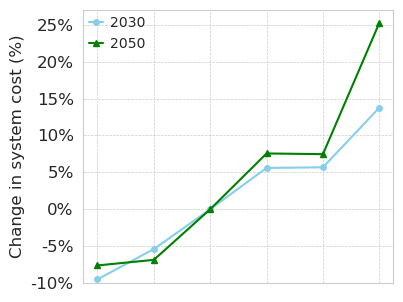

In [394]:
scenarios = ['trans', 'trade', 'optim', 'land', 'tech','region'] # plot sequence wrt data30
#scenarios = ['Optimal', '+landscape', '+regional', '+technology', '+transmission']
#data = cost_seq_pref_5.loc[['2030'],['percent_change']]
data30 = cost_Ind_pref.unstack(level=0).sort_values(by=[('percent_change', '2030')], ascending=True)

years = [2030, 2040, 2050]
fig, ax = plt.subplots(figsize=(4, 3.5))
plt.subplots_adjust(bottom=0.1)


line_width = 1.5
scatter_size = 50
r1 = np.arange(len(scenarios))  # 2030 slightly to the left
r2 = np.arange(len(scenarios))  # 2040 at the center
r3 = np.arange(len(scenarios))  # 2050 slightly to the right

#change bar_width accordingly
bar_width = 0.48
plt.plot(r1, data30['percent_change']['2030'], color='skyblue', linewidth=line_width, linestyle='-', marker='o', markersize=4, label='2030')
#plt.plot(r2, data30['percent_change']['2040'], color='orange', linewidth=line_width, linestyle='-', marker='s', markersize=4, label='2040')
plt.plot(r3, data30['percent_change']['2050'], color='green', linewidth=line_width, linestyle='-', marker='^', markersize=4, label='2050')

#plt.plot(r1, data30['percent_change']['2030'], color='skyblue', linestyle='--')
#plt.plot(r2, data30['percent_change']['2030'], color='orange', linestyle='--')
#plt.plot(r3, data30['percent_change']['2030'], color='green', linestyle='--')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
#custom x-axis
#ax.set_xticks([r + bar_width for r in range(len(scenarios))])
ax.set_xticks(np.arange(len(scenarios)))
ax.set_xticklabels('', ha='center',fontsize=12)
ax.set_xlim(-0.25, 5.25)

#custom y-axis
ax.set_ylim(-10, 27) 
ax.set_yticks(np.arange(-10, 27, 5))
ax.tick_params(axis='y', which='major', labelsize=12)
ax.set_ylabel('Change in system cost (%)', fontsize=12)

# Add percent signs to the y-tick labels
def percent_formatter(x, pos):
    return f'{x:.0f}%'
ax.yaxis.set_major_formatter(FuncFormatter(percent_formatter))

#Horizontal line
#ax.axvline(x=2, color='red', linestyle='-', linewidth=1)

ax.legend(loc='upper left', borderaxespad=0., frameon=False, 
          fontsize=10, handlelength=1, handletextpad=0.5)

#plt.tight_layout(rect=[0, 0.3, 1, 1]) 
plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/systemcostChangeline_posterT.png', dpi=300, transparent=True, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/systemcostChange_allyears.jpg', dpi=300, bbox_inches='tight')

# Customize legend
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., frameon=False, 
#          fontsize=10, handlelength=1.5, handletextpad=0.5)


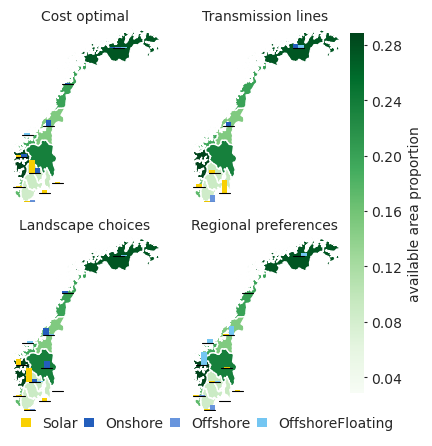

In [373]:
#plot
#year = 2050

cap2040 = captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050')]
#scenarios = ['optim', 'trans', 'trade', 'land', 'tech', 'region']
scenarios = ['optim', 'trans', 'land', 'region']
technologies = ['Solar', 'Windonshore', 'Windoffshore', 'Windoffshorefloating']
legend_names = ['Solar', 'Onshore', 'Offshore', 'OffshoreFloating']
colors = ['#f9d002', '#235ebc', '#6895dd', '#74c6f2']
max_capacities = {scenario: {tech: cap2040[(cap2040['Scenario Name'] == scenario) & (cap2040['technology'] == tech)]['gencap'].max() 
                             for tech in technologies} 
                  for scenario in scenarios}

offset_dict = {
    'NO42': [0.5, -0.68],
    'NO03': [2.4, -0.5],
    'NO54': [0, 0],
    'NO15': [0, 0.5],
    'NO38': [2, -0.8],
    'NO50': [0., 0],
    'NO11': [0, 0],
    'NO34': [0.7, -0.2],
    'NO30': [-0.9, 0.1],
    'NO18': [0, 0],
    'NO46': [0.2, 0.5],
}



def create_additional_legends(fig, cap2040, technologies, max_capacities):

    legend_elements = [plt.Rectangle((0,0),0.5,0.5, facecolor=color, edgecolor='none') for color in colors]
    tech_legend = fig.legend(legend_elements, legend_names,borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.82, 0.1), ncol=4, labelspacing=0.1, columnspacing=0.5)


    ax_color_scale = fig.add_axes([0.75, 0.14, 0.02, 0.8])  # Adjust position as needed
    cmap = plt.get_cmap('Greens')
    norm = plt.Normalize(vmin=Norway['available_area_proportion'].min(), 
                         vmax=Norway['available_area_proportion'].max())
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
    cb.set_label('available area proportion', fontsize=10)
    new_ticks = [0.04, 0.08, 0.12, 0.16, 0.20, 0.24, 0.28]
    cb.set_ticks(new_ticks)
    cb.outline.set_visible(False)
    cb.ax.tick_params(length=2)

    #cb.ax.yaxis.set_label_position('left')
    cb.ax.tick_params(right=True, left=False, labelright=True, labelleft=False, labelsize=10)
    
    return tech_legend, ax_color_scale    

indices_in_ranges = []

# Function to create bar plots for each zone
def create_zone_plot(ax, data, scenario, zone, technologies, colors, x_scaled, y_scaled, max_capacities, offset_dict):

    width = 1
    scale_factor = 1
    
    x_offset, y_offset = offset_dict.get(zone, [0, 0])
    trans = (transforms.Affine2D()
             .scale(scale_factor)
             .translate(x_scaled+x_offset, y_scaled+y_offset) + ax.transData)
    non_zero_techs = []
    non_zero_values = []
    non_zero_colors = []

    #calculating the maximum of in given scenario across technologies and zones for normalizing
    scenario_capacities = max_capacities[scenario]
    max_scen_cap = max(scenario_capacities, key=scenario_capacities.get)
    max_scen_value = scenario_capacities[max_scen_cap]
    
    for i, tech in enumerate(technologies):
        values = data[(data['Scenario Name'] == scenario) & 
                      (data['zone'] == zone) & 
                      (data['technology'] == tech)]
        normalized_value = 0
        value = values['gencap'].values[0]
        if value>0.0001:   
            #normalized_value = value / max_capacities[scenario][tech]
            normalized_value = value / max_scen_value
        #else:
        #    normalized_value = value / max_capacities[scenario][tech]

        if normalized_value > 0.0001:
            non_zero_techs.append(tech)
            non_zero_values.append(normalized_value)
            non_zero_colors.append(colors[i])

        # Check if the normalized value falls within the specified ranges for making bar length legends insskap
        #if 1 <= normalized_value <= 0.8 or 0.5 <= normalized_value <= 0.7 or 0.2 <= normalized_value <= 0.4:
        indices_in_ranges.append({
                'row_index': values.index[0],
                'scenario': scenario,
                'zone': zone,
                'technology': tech,
                'normalized_value': normalized_value
            })
    
    if non_zero_techs:
        for i, (value, color) in enumerate(zip(non_zero_values, non_zero_colors)):
            x_pos = (i - len(non_zero_techs)/2 + 0.5) * width
            ax.bar(x_pos, value, width, color=color, transform=trans, edgecolor='none')
        
        ax.plot([-0.5*len(technologies)/2, 0.5*len(technologies)/2], [0, 0], color='black', linewidth=0.8, transform=trans)
    ax.yaxis.set_visible(False)
    ax.set_xticks([])
    

fig, axs = plt.subplots(2, 2, figsize=(7, 4.5))
fig.subplots_adjust(wspace=-0.6, left=0.05, right=0.95, top=0.95, bottom=0.1)
axs = axs.flatten()
Title_names = ['Cost optimal', 'Transmission lines', 'Landscape choices', 'Regional preferences']
for i, scenario in enumerate(scenarios):
    ax = axs[i]
    Norway.plot(ax=ax, column='available_area_proportion', cmap='Greens', legend=False)

    for idx, row in Norway.iterrows():
        zone = idx
        x_scaled = row['x_coord']
        y_scaled = row['y_coord']

        create_zone_plot(ax, cap2040, scenario, zone, technologies, colors, x_scaled, y_scaled, max_capacities, offset_dict)
    

    ax.set_title(Title_names[i], fontsize=10)
    ax.set_xlim(Norway.total_bounds[0], Norway.total_bounds[2])
    ax.set_ylim(Norway.total_bounds[1], Norway.total_bounds[3])
    ax.axis('off')    

tech_legend, ax_color_scale = create_additional_legends(fig, cap2040, technologies, max_capacities)

#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/tech_cap_zonal_posterTT2.png', dpi=300, transparent=True, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/tech_cap_zonal.jpg', dpi=300, bbox_inches='tight')



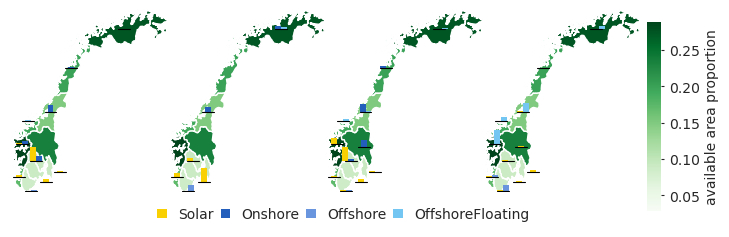

In [390]:
#plot
#year = 2050

cap2040 = captotz_Ind_pref_change[(captotz_Ind_pref_change['demandyear'] == '2050')]
#scenarios = ['optim', 'trans', 'trade', 'land', 'tech', 'region']
scenarios = ['optim', 'trans', 'land', 'region']
technologies = ['Solar', 'Windonshore', 'Windoffshore', 'Windoffshorefloating']
legend_names = ['Solar', 'Onshore', 'Offshore', 'OffshoreFloating']
colors = ['#f9d002', '#235ebc', '#6895dd', '#74c6f2']
max_capacities = {scenario: {tech: cap2040[(cap2040['Scenario Name'] == scenario) & (cap2040['technology'] == tech)]['gencap'].max() 
                             for tech in technologies} 
                  for scenario in scenarios}

offset_dict = {
    'NO42': [0.5, -0.68],
    'NO03': [2.4, -0.5],
    'NO54': [0, 0],
    'NO15': [0, 0.5],
    'NO38': [2, -0.8],
    'NO50': [0., 0],
    'NO11': [0, 0],
    'NO34': [0.7, -0.2],
    'NO30': [-0.9, 0.1],
    'NO18': [0, 0],
    'NO46': [0.2, 0.5],
}



def create_additional_legends(fig, cap2040, technologies, max_capacities):

    legend_elements = [plt.Rectangle((0,0),0.5,0.5, facecolor=color, edgecolor='none') for color in colors]
    tech_legend = fig.legend(legend_elements, legend_names,borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.8, 0.3), ncol=4, labelspacing=0.1, columnspacing=0.5)


    ax_color_scale = fig.add_axes([0.96, 0.28, 0.02, 0.42])  # Adjust position as needed
    cmap = plt.get_cmap('Greens')
    norm = plt.Normalize(vmin=Norway['available_area_proportion'].min(), 
                         vmax=Norway['available_area_proportion'].max())
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), 
                      cax=ax_color_scale, orientation='vertical')
    cb.set_label('available area proportion', fontsize=10)
    new_ticks = [0.05, 0.10, 0.15, 0.20, 0.25]
    cb.set_ticks(new_ticks)
    cb.outline.set_visible(False)
    cb.ax.tick_params(length=2)

    #cb.ax.yaxis.set_label_position('left')
    cb.ax.tick_params(right=True, left=False, labelright=True, labelleft=False, labelsize=10)
    
    return tech_legend, ax_color_scale    

indices_in_ranges = []

# Function to create bar plots for each zone
def create_zone_plot(ax, data, scenario, zone, technologies, colors, x_scaled, y_scaled, max_capacities, offset_dict):

    width = 1
    scale_factor = 1
    
    x_offset, y_offset = offset_dict.get(zone, [0, 0])
    trans = (transforms.Affine2D()
             .scale(scale_factor)
             .translate(x_scaled+x_offset, y_scaled+y_offset) + ax.transData)
    non_zero_techs = []
    non_zero_values = []
    non_zero_colors = []

    #calculating the maximum of in given scenario across technologies and zones for normalizing
    scenario_capacities = max_capacities[scenario]
    max_scen_cap = max(scenario_capacities, key=scenario_capacities.get)
    max_scen_value = scenario_capacities[max_scen_cap]
    
    for i, tech in enumerate(technologies):
        values = data[(data['Scenario Name'] == scenario) & 
                      (data['zone'] == zone) & 
                      (data['technology'] == tech)]
        normalized_value = 0
        value = values['gencap'].values[0]
        if value>0.0001:   
            #normalized_value = value / max_capacities[scenario][tech]
            normalized_value = value / max_scen_value
        #else:
        #    normalized_value = value / max_capacities[scenario][tech]

        if normalized_value > 0.0001:
            non_zero_techs.append(tech)
            non_zero_values.append(normalized_value)
            non_zero_colors.append(colors[i])

        # Check if the normalized value falls within the specified ranges for making bar length legends insskap
        #if 1 <= normalized_value <= 0.8 or 0.5 <= normalized_value <= 0.7 or 0.2 <= normalized_value <= 0.4:
        indices_in_ranges.append({
                'row_index': values.index[0],
                'scenario': scenario,
                'zone': zone,
                'technology': tech,
                'normalized_value': normalized_value
            })
    
    if non_zero_techs:
        for i, (value, color) in enumerate(zip(non_zero_values, non_zero_colors)):
            x_pos = (i - len(non_zero_techs)/2 + 0.5) * width
            ax.bar(x_pos, value, width, color=color, transform=trans, edgecolor='none')
        
        ax.plot([-0.5*len(technologies)/2, 0.5*len(technologies)/2], [0, 0], color='black', linewidth=0.8, transform=trans)
    ax.yaxis.set_visible(False)
    ax.set_xticks([])
    

fig, axs = plt.subplots(1, 4, figsize=(7, 4.5))
fig.subplots_adjust(wspace=0, left=0.05, right=0.95, top=0.95, bottom=0.1)
axs = axs.flatten()
Title_names = ['Cost optimal', 'Transmission lines', 'Landscape choices', 'Regional preferences']
for i, scenario in enumerate(scenarios):
    ax = axs[i]
    Norway.plot(ax=ax, column='available_area_proportion', cmap='Greens', legend=False)

    for idx, row in Norway.iterrows():
        zone = idx
        x_scaled = row['x_coord']
        y_scaled = row['y_coord']

        create_zone_plot(ax, cap2040, scenario, zone, technologies, colors, x_scaled, y_scaled, max_capacities, offset_dict)
    

    #ax.set_title(Title_names[i], fontsize=10)
    ax.set_xlim(Norway.total_bounds[0], Norway.total_bounds[2])
    ax.set_ylim(Norway.total_bounds[1], Norway.total_bounds[3])
    ax.axis('off')    

tech_legend, ax_color_scale = create_additional_legends(fig, cap2040, technologies, max_capacities)

plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/tech_cap_zonal_posterTT11.png', dpi=300, transparent=True, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/tech_cap_zonal.jpg', dpi=300, bbox_inches='tight')



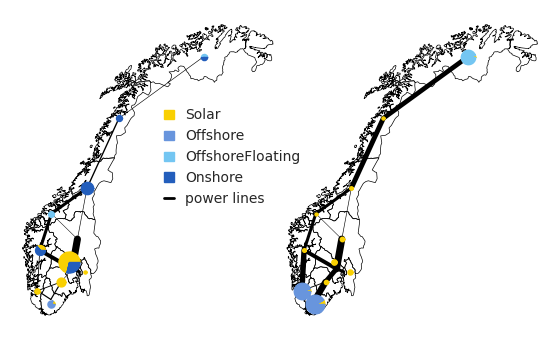

In [398]:
#Transmission subplot for Poster
from matplotlib.lines import Line2D
data_plot = {
    'Optim': {
        'fix': {'pies': fix_optim_pies, 'cap_frac': fix_optim_cap_frac, 'trans': fix_optim_trans, 'trans_tot': fix_optim_trans_tot},
        'lowoh': {'pies': lowoh_optim_pies, 'cap_frac': lowoh_optim_cap_frac, 'trans': lowoh_optim_trans, 'trans_tot': lowoh_optim_trans_tot}
    },
    'Land': {
        'fix': {'pies': cumulative_pies, 'cap_frac': cumulative_cap_frac, 'trans': Cumulative_trans, 'trans_tot': Cumulative_trans_tot},
        'lowoh': {'pies': lowoh_land_pies, 'cap_frac': lowoh_land_cap_frac, 'trans': lowoh_land_trans, 'trans_tot': lowoh_land_trans_tot}
    }
}
fig, axs = plt.subplots(1, 2, figsize=(10, 3.5))
#fig.subplots_adjust(wspace=-0.7,  hspace=0, left=0.05, right=0.95, top=0.1, bottom=0)

color_mapping = {
    'Solar': '#f9d002',
    'WindOffshore': '#6895dd',
    'WindOffshoreFloating': '#74c6f2',
    'WindOnshore': '#235ebc'
}

offset_dict1 = {
    'NO42': [0, -0.4], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

offset_dict2 = {
    'NO42': [0, -0.22], 'NO03': [0.6, 0], 'NO54': [0, 0], 'NO15': [0, 0],
    'NO38': [0, 0], 'NO50': [0, 0], 'NO11': [0, 0], 'NO34': [0, 0],
    'NO30': [-0.3, 0.3], 'NO18': [0, 0], 'NO46': [0, 0],
}

legend_entries = []
short_labels = {
    'Solar': 'Solar',
    'WindOffshore': 'Offshore',
    'WindOffshoreFloating': 'OffshoreFloating',
    'WindOnshore': 'Onshore'
}
for technology, color in color_mapping.items():
    short_label = short_labels[technology]
    legend_entries.append(mpatches.Patch(color=color, label=short_label))

linewidth = 40
trans_HVACcolor = 'black'

# Create a Line2D object for the legend to represent the transmission line
trans_legend = Line2D([0], [0], color=trans_HVACcolor, linewidth=2, label='power lines')

legend_entries.append(trans_legend)

max_trans_tot = fix_optim_trans_tot #change the maximum value according to scenario plots

def plot_subplot(ax, data, title, ax_row):
    Norway.boundary.plot(ax=ax, zorder=1, linewidth=0.5, color='black')
    
    for i in ['NO03','NO11','NO15','NO18','NO30','NO34','NO38','NO42','NO46','NO50','NO54']:
        wedges, labels = data['pies'][i]
        for wedge, label in zip(wedges, labels): 
            color = color_mapping[label.get_text()]
            vertices = wedge.get_path().vertices.tolist()
            size = 500 * data['cap_frac'][i]
            offset_x, offset_y = offset_dict1[i]
            if ax_row == 0:
                offset_x, offset_y = offset_dict2[i]
            ax.scatter(cent.x[i]+offset_x, cent.y[i]+offset_y, marker=(vertices),
                       s=size, zorder=100, facecolor=color)

    ax.axis('off')
    ax.set_title(title, fontsize=11)
    #trans_HVDCcolor = 'red'

    for i in [['NO03', 'NO30'], ['NO11', 'NO38'], ['NO11', 'NO42'], ['NO11', 'NO46'], 
              ['NO15', 'NO34'], ['NO15', 'NO46'], ['NO15', 'NO50'], ['NO18', 'NO50'], 
              ['NO18', 'NO54'], ['NO30', 'NO34'], ['NO30', 'NO38'], ['NO30', 'NO46'],
              ['NO34', 'NO46'], ['NO34', 'NO50'], ['NO38', 'NO42'], ['NO38', 'NO46']]:
        ax.plot([cent[i[0]].x, cent[i[1]].x], [cent[i[0]].y, cent[i[1]].y],
                 linewidth=(linewidth*data['trans'].query("Zone_1 == " + "'" + i[0] + "'" + " and Zone_2 == " + "'" + i[1] + "'")
                            #.values[0][0]/data['trans_tot']), color=trans_HVACcolor)
                            .values[0][0]/max_trans_tot), color=trans_HVACcolor)
        
axs[0].legend(handles=legend_entries, borderaxespad=0,frameon=False,handlelength=0.7,
                             fontsize=10, bbox_to_anchor=(0.54, 0.71))


plot_subplot(axs[0], data_plot['Optim']['fix'], '', 0)
plot_subplot(axs[1], data_plot['Land']['fix'], '', 0)
#plot_subplot(axs[2], data_plot['Optim']['lowoh'], 'Optim-Trans', 1)
#plot_subplot(axs[2], data_plot['Land']['lowoh'], 'land-trans', 1)

fig.subplots_adjust(wspace=-0.8,  hspace=-0.9, left=0.05, right=0.95, top=0.9, bottom=0)
plt.tight_layout()

plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation_posterT.png', dpi=300, transparent=True, bbox_inches='tight')
#plt.savefig('/fp/homes01/u01/ec-javedm/ec85/models/shahzad/Plots/Electricity_allocation2.jpg', dpi=300, bbox_inches='tight')

plt.show()
#Why not having this plot when all preferences are in place ??? Why just for only Land and Trans? Because aiming to show the impact
#on transmission when land+trans take place. trans has similar impact  with optim so not displayed here. Probably one table could be made to 
# in supplemental to show the capacities under all scenarios